## packages

In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import scipy.io as sio
from scipy import stats
import datetime
import gsw
import matplotlib.dates as mdates
import matplotlib.ticker as tick
import matplotlib.cm as cm
from matplotlib.gridspec import GridSpec
%matplotlib inline
plt.rc('text', usetex=True)
plt.rc('font', family='serif')

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
import matplotlib.collections as collections
# from numpy.fft import fft, ifft, fftshift, fftfreq
import pywt
from scipy import signal
import matplotlib as mpl
from scipy.interpolate import griddata

from sklearn.linear_model import LinearRegression

In [3]:
from __future__ import division
import pycwt as wavelet
from pycwt.helpers import find

## funciones

In [4]:
def to_data(date,da,s,temp):
    x = pd.DataFrame({'Datetime': pd.to_datetime(date, format='%d-%b-%Y %H:%M:%S'), 'Depth': da[:,0], 'Salinity': s[:,0], 'Temperature': temp[:,0]})
    x = x.set_index('Datetime')
    return x  

In [5]:
def to_density(z, sal, temp, lat):
    p = gsw.p_from_z(-z, lat)
    rho = gsw.rho_t_exact(sal, temp, p)
    return rho

In [6]:
def earth_to_uv(dfe, dfn, a): 
    "This takes 2 dataframes of east and north coordinates respectively and the regresion coeficient and transforms them to the direction of the coeficient"
    alpha = np.arctan(a) #Ángulo
    t, b = dfe.shape 
    M = np.array([[-np.cos(alpha), np.sin(alpha)],
                  [np.sin(alpha), np.cos(alpha)]]) #Matriz de transfomación
    columns = dfe.columns
    u = np.zeros((0,t)) #Inicialización de variables
    v = np.zeros((0,t)) #Inicialización de variables
    for i in columns: #Iteración sobre las columnas de los dataframes
        bin_ = np.array([[dfe[i].values],
                        [dfn[i].values]]) # Matriz de coordenadas east-north
        ui, vi = np.tensordot(M, bin_, 1) #Multiplicación matricial
        u = np.concatenate((u, ui), axis=0) #Unión de los resultados de u
        v = np.concatenate((v, vi), axis=0)#Unión de los resultados de v
    return u, v

In [7]:
def spectrum1(h, dt=1):
    """
    First cut at spectral estimation: very crude.
    
    Returns frequencies, power spectrum, and
    power spectral density.
    Only positive frequencies between (and not including)
    zero and the Nyquist are output.
    """
    nt = len(h)
    npositive = nt//2
    pslice = slice(1, npositive)
    freqs = np.fft.fftfreq(nt, d=dt)[pslice] 
    ft = np.fft.fft(h)[pslice]
    psraw = np.abs(ft) ** 2
    # Double to account for the energy in the negative frequencies.
    psraw *= 2
    # Normalization for Power Spectrum
    psraw /= nt**2
    # Convert PS to Power Spectral Density
    psdraw = psraw * dt * nt  # nt * dt is record length
    return freqs, psraw, psdraw

In [8]:
def spectrum2(h, dt=1, nsmooth=5):
    """
    Add simple boxcar smoothing to the raw periodogram.
    
    Chop off the ends to avoid end effects.
    """
    freqs, ps, psd = spectrum1(h, dt=dt)
    weights = np.ones(nsmooth, dtype=float) / nsmooth
    ps_s = np.convolve(ps, weights, mode='valid')
    psd_s = np.convolve(psd, weights, mode='valid')
    freqs_s = np.convolve(freqs, weights, mode='valid')
    return freqs_s, ps_s, psd_s

In [9]:
def spectrum3(h, dt=1, nsmooth=5):
    """
    Detrend first.
    """
    t = np.arange(len(h))
    p = np.polyfit(t, h, 1)
    h_detrended = h - np.polyval(p, t)
    return spectrum2(h_detrended, dt=dt, nsmooth=nsmooth)

In [10]:
def detrend(h):
    n = len(h)
    t = np.arange(n)
    p = np.polyfit(t, h, 1)
    h_detrended = h - np.polyval(p, t)
    return h_detrended
    
def quadwin(n):
    """
    Quadratic (or "Welch") window
    """
    t = np.arange(n)
    win = 1 - ((t - 0.5 * n) / (0.5 * n)) ** 2
    return win

def spectrum4(h, dt=1, nsmooth=5):
    """
    Detrend and apply a quadratic window.
    """
    n = len(h)

    h_detrended = detrend(h)
    
    winweights = quadwin(n)
    h_win = h_detrended * winweights
    
    freqs, ps, psd = spectrum2(h_win, dt=dt, nsmooth=nsmooth)
    
    # Compensate for the energy suppressed by the window.
    psd *= n / (winweights**2).sum()
    ps *= n**2 / winweights.sum()**2
    
    return freqs, ps, psd

In [11]:
def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

In [12]:
import math

def haversine(lat1, lon1, lat2, lon2):
    rad = math.pi/180
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    R = 6372.795477598 # km radio de la tierra
    a = (math.sin(rad*dlat/2))**2 + math.cos(rad*lat1)*math.cos(rad*lat2)*(math.sin(rad*dlon/2))**2
    dist = 2*R*math.asin(math.sqrt(a))
    return dist

In [13]:
def standardize(s, detrend=True, standardize=True, remove_mean=False):
    '''
    Helper function for pre-processing data, specifically for wavelet analysis

    INPUTS:
        s - numpy array of shape (n,) to be normalized
        detrend - boolean on whether to linearly detrend s
        standardize - boolean on whether to divide by the standard deviation
        remove_mean - boolean on whether to remove the mean of s. Exclusive with detrend.

    OUTPUTS:
        snorm - numpy array of shape (n,)
    '''

    # Derive the variance prior to any detrending
    std = s.std()
    smean = s.mean()

    if detrend and remove_mean:
        raise ValueError('Only standardize by either removing secular trend or mean, not both.')

    # Remove the trend if requested
    if detrend:
        arbitrary_x = np.arange(0, s.size)
        p = np.polyfit(arbitrary_x, s, 1)
        snorm = s - np.polyval(p, arbitrary_x)
    else:
        snorm = s

    if remove_mean:
        snorm = snorm - smean

    # Standardize by the standard deviation
    if standardize:
        snorm = (snorm / std)

    return snorm

# Importar y arreglar datos

In [14]:
# feb16 = xr.open_dataset("data/adcp2012feb.nc")
# newfeb = feb16.sel(time=slice("2012-02-17","2012-03-08"))
# adcp = xr.open_dataset("C://Users//Dhannai//Documents//git//dump//adcp//data//adcp2012feb.nc")

UV_burst = xr.open_dataset("data/UV_burst.nc")
EN_burst = xr.open_dataset("data/EastNorth_burst.nc")
vert_burst = pd.read_csv('data/burst_vert.csv')

In [15]:
# adcp = xr.open_dataset("C://Users//dhann//Documents//git//dump//adcp//data//adcp2012feb.nc")
# adcp = xr.open_dataset("C://Users//Dhannai//Documents//git//dump//adcp//data//adcp2012feb.nc")

In [16]:
#Convertir velocidades a DataFrames
columnas = ['bin_1','bin_2','bin_3','bin_4','bin_5','bin_6','bin_7','bin_8','bin_9','bin_10','bin_11','bin_12','bin_13','bin_14','bin_15','bin_16','bin_17','bin_18','bin_19','bin_20','bin_21','bin_22','bin_23','bin_24','bin_25']

df_east = pd.DataFrame(EN_burst.east.values, columns = columnas)
df_east.index = EN_burst.time.values

df_north = pd.DataFrame(EN_burst.north.values, columns = columnas)
df_north.index = EN_burst.time.values

u, v = earth_to_uv(df_east, df_north, 1.13493621)

df_u = pd.DataFrame(np.transpose(u), columns = columnas)
df_u.index = EN_burst.time.values

df_v = pd.DataFrame(np.transpose(v), columns = columnas)
df_v.index = EN_burst.time.values

vert_burst.index = pd.to_datetime(vert_burst['Unnamed: 0'], format='%Y-%m-%d %H:%M:%S')
vert_burst = vert_burst.drop(['Unnamed: 0'], axis=1)

In [17]:
DC_CTD = xr.open_dataset("data//DC_CTD")
NM_CTD = xr.open_dataset("data//NM_CTD")
ML_CTD = xr.open_dataset("data//ML_CTD")
PC_CTD = xr.open_dataset("data//PC_CTD")

In [18]:
DC_CTD['v'] = DC_CTD['__xarray_dataarray_variable__']
DC_CTD = DC_CTD.drop(['__xarray_dataarray_variable__'])

NM_CTD['v'] = NM_CTD['__xarray_dataarray_variable__']
NM_CTD = NM_CTD.drop(['__xarray_dataarray_variable__'])

ML_CTD['v'] = ML_CTD['__xarray_dataarray_variable__']
ML_CTD = ML_CTD.drop(['__xarray_dataarray_variable__'])

PC_CTD['v'] = PC_CTD['__xarray_dataarray_variable__']
PC_CTD = PC_CTD.drop(['__xarray_dataarray_variable__'])

In [19]:
# DC = sio.loadmat("C://Users//Dhannai//OneDrive - Universidad Técnica Federico Santa María//Documents//Magister//Estuario Pescadero//janmar2012//wdates_local//DC_ctds_localdates.mat")
# NM = sio.loadmat("C://Users//Dhannai//OneDrive - Universidad Técnica Federico Santa María//Documents//Magister//Estuario Pescadero//janmar2012//wdates_local//NM_ctds_localdates.mat")
# ML = sio.loadmat("C://Users//Dhannai//OneDrive - Universidad Técnica Federico Santa María//Documents//Magister//Estuario Pescadero//janmar2012//wdates_local//AC_ctds_localdates.mat")
# PC = sio.loadmat("C://Users//Dhannai//OneDrive - Universidad Técnica Federico Santa María//Documents//Magister//Estuario Pescadero//janmar2012//wdates_local//PC_ctds_localdates.mat")

DC = sio.loadmat("C://Users//dhann//OneDrive - Universidad Técnica Federico Santa María//Documents//Magister//Estuario Pescadero//janmar2012//wdates_local//DC_ctds_localdates.mat")
NM = sio.loadmat("C://Users//dhann//OneDrive - Universidad Técnica Federico Santa María//Documents//Magister//Estuario Pescadero//janmar2012//wdates_local//NM_ctds_localdates.mat")
ML = sio.loadmat("C://Users//dhann//OneDrive - Universidad Técnica Federico Santa María//Documents//Magister//Estuario Pescadero//janmar2012//wdates_local//AC_ctds_localdates.mat")
PC = sio.loadmat("C://Users//dhann//OneDrive - Universidad Técnica Federico Santa María//Documents//Magister//Estuario Pescadero//janmar2012//wdates_local//PC_ctds_localdates.mat")

In [20]:
DC_1 = to_data(DC['tdate_dc1'], DC['da_dc1'], DC['s_dc1'], DC['temp_dc1'])
DC_2 = to_data(DC['tdate_dc2'], DC['da_dc2'], DC['s_dc2'], DC['temp_dc2'])
DC_3 = to_data(DC['tdate_dc3'], DC['da_dc3'], DC['s_dc3'], DC['temp_dc3'])
DC_4 = to_data(DC['tdate_dc4'], DC['da_dc4'], DC['s_dc4'], DC['temp_dc4'])

NM_1 = to_data(NM['tdate_nm1'], NM['da_nm1'], NM['s_nm1'], NM['temp_nm1'])
NM_2 = to_data(NM['tdate_nm2'], NM['da_nm2'], NM['s_nm2'], NM['temp_nm2'])
NM_3 = to_data(NM['tdate_nm3'], NM['da_nm3'], NM['s_nm3'], NM['temp_nm3'])

ML_1 = to_data(ML['tdate_ac1'], ML['da_ac1'], ML['s_ac1'], ML['temp_ac1'])
ML_2 = to_data(ML['tdate_ac2'], ML['da_ac2'], ML['s_ac2'], ML['temp_ac2'])

PC_1 = to_data(PC['tdate_pc'], PC['da_pc'], PC['s_pc'], PC['temp_pc'])

In [21]:

df2 = pd.read_table('C://Users//dhann//OneDrive - Universidad Técnica Federico Santa María//Documents//Magister//Estuario Pescadero//meteorological_station//raw//CR200Series_sixmin_pescadero_20120301.dat', sep=",", header=[1, 2, 3])
df2 = pd.DataFrame(df2.values, columns = ['TIMESTAMP','RECORD','Speed','Direction','Winddir_D2','airTC','RH'])
df2 = df2.set_index('TIMESTAMP')
df3 = pd.read_table('C://Users//dhann//OneDrive - Universidad Técnica Federico Santa María//Documents//Magister//Estuario Pescadero//meteorological_station//raw//CR200Series_sixmin_pescadero_20120419.dat', sep=",", header=[1, 2, 3])
df3 = pd.DataFrame(df3.values, columns = ['TIMESTAMP','RECORD','Speed','Direction','Winddir_D2','airTC','RH'])
df3 = df3.set_index('TIMESTAMP')
result = pd.concat([df2, df3], ignore_index=False, sort=False)
result.index = pd.to_datetime(result.index)
w = result

In [22]:
north_w = np.float64(w['Speed'])*np.sin(np.pi*np.float64(w['Direction'])/180)
east_w = np.float64(w['Speed'])*np.cos(np.pi*np.float64(w['Direction'])/180)
north_w = pd.DataFrame(data=north_w, columns=['viento'])
east_w = pd.DataFrame(data=east_w, columns=['viento'])

# uw, vw = earth_to_uv(east_w, north_w, 0.79970532) #max var viento
uw, vw = earth_to_uv(east_w, north_w, 1.13493621) #max var est


dfw = pd.DataFrame(np.transpose(np.array([uw[0,:], vw[0,:]])), columns=['u', 'v'])
dfw.index = w.index

In [23]:
#Leer datos caudal
Q = pd.read_csv("data\\febmar2012.csv")
lista_nombres= ["nan1", "fecha", "nan2", "sensor", 
                "caudal", "A"]
Q.columns=lista_nombres
Q = Q.drop(columns=['nan1', 'nan2', 'sensor', 'A']).reset_index()
Q = Q.drop(columns=['level_0', 'level_1'])
Q["fecha"] = pd.to_datetime(Q["fecha"].values)

In [24]:
#Importar caudal de pescadero cada 15 min en GMT
# https://nwis.waterservices.usgs.gov/nwis/iv/?sites=11162500&parameterCd=00060&startDT=2011-07-07T00:00:00.000-07:00&endDT=2012-07-07T23:59:59.999-07:00&siteStatus=all&format=rdb
Q = pd.read_csv("data\\caudal2012.csv", sep=';') #pies cubicos por segndo
Q = Q.drop(['5s', '15s', '14n', 'Unnamed: 6'], axis=1)
Q['index'] = pd.to_datetime(Q['20d'] + ' ' + Q['6s'], format='%d-%m-%Y %H:%M')
Q = Q.set_index('index')
Q = Q.drop(['20d', '6s'], axis=1)

Q = Q/35.3147 # metros cubicos pr segundo

In [25]:
#Importar nivel de agua cada 6 min en hora local
snfco = pd.read_csv("data/CO-OPS_9414290_met.csv")
snfco = snfco.drop(['Predicted (m)', 'Preliminary (m)'], axis=1)
snfco['index'] = pd.to_datetime(snfco['Date'] + ' ' + snfco['Time (LST/LDT)'], format='%Y-%m-%d %H:%M')
snfco = snfco.set_index('index')
snfco = snfco.drop(['Date', 'Time (LST/LDT)'], axis=1)

mnty = pd.read_csv("data/CO-OPS_9413450_met.csv")
mnty = mnty.drop(['Predicted (m)', 'Preliminary (m)'], axis=1)
mnty['index'] = pd.to_datetime(mnty['Date'] + ' ' + mnty['Time (LST/LDT)'], format='%Y-%m-%d %H:%M')
mnty = mnty.set_index('index')
mnty = mnty.drop(['Date', 'Time (LST/LDT)'], axis=1)

In [26]:
#Importar datos boya 46012 (Half moon bay)
# https://www.ndbc.noaa.gov/station_history.php?station=46012
hmoon = pd.read_csv("data/46012h2012.csv", sep=';', header=0)
hmoon = hmoon.drop(['PRES','TIDE', 'ATMP', 'WTMP','DEWP', 'VIS', 'WDI', 'R WSP', 'D GST'], axis=1)
hmoon = hmoon.drop([0], axis=0)
hmoon['index'] = pd.to_datetime(hmoon['#YY'] + '-' + hmoon['MM'] + '-' + hmoon['DD'] + ' ' + hmoon['hh'] + ':' + hmoon['mm'], format='%Y-%m-%d %H:%M')
hmoon = hmoon.set_index('index')
hmoon = hmoon.drop(['#YY', 'MM', 'DD', 'hh', 'mm'], axis=1)
hmoon['WVHT'] = hmoon['WVHT'].astype('float64')
hmoon['DPD'] = hmoon['DPD'].astype('float64')
hmoon['APD'] = hmoon['APD'].astype('float64')
hmoon['MWD'] = hmoon['MWD'].astype('float64')
hmoon = hmoon.drop([datetime.datetime(2012,2,14,19,50,0), datetime.datetime(2012,2,22,11,50,0), datetime.datetime(2012,2,23,11,50,0)], axis=0)
# WVHT: Significant wave height
# DPD: Dominant wave period (seconds) is the period with the maximum wave energy.
# APD: Average wave period (seconds) of all waves during the 20-minute period. 

In [27]:
#Importar datos de backscatter
# bks_drp = np.load("C://Users//Dhannai//Documents//git//dump//bks_drp.npy")
# bks_drp1 = np.load("C://Users//Dhannai//Documents//git//dump//bks_drp1.npy")
# bks_drp2 = np.load("C://Users//Dhannai//Documents//git//dump//bks_drp2.npy")
# bks_drp3 = np.load("C://Users//Dhannai//Documents//git//dump//bks_drp3.npy")
# bks_drp4 = np.load("C://Users//Dhannai//Documents//git//dump//bks_drp4.npy")
# bks_drp1 = np.load("data/bks_drp1.npy")
# bks_drp2 = np.load("data/bks_drp2.npy")
# bks_drp3 = np.load("data/bks_drp3.npy")
# bks_drp4 = np.load("data/bks_drp4.npy")

## Perfiles

In [28]:
p1 = pd.read_csv("data/perfil1.csv", sep=';')
p1 = p1.drop(['Conductividad', 'Presión', 'Turbidez','Conduct Especifica', 'Density anomaly', 'C'], axis=1)

## Densidad

In [29]:
rho_dc1 = to_density(DC_1['Depth'], DC_1['Salinity'], DC_1['Temperature'], 37.26)
rho_dc2 = to_density(DC_2['Depth'], DC_2['Salinity'], DC_2['Temperature'], 37.26)
rho_dc3 = to_density(DC_3['Depth'], DC_3['Salinity'], DC_3['Temperature'], 37.26)
rho_dc4 = to_density(DC_4['Depth'], DC_4['Salinity'], DC_4['Temperature'], 37.26)

DC_1['densidad'] = rho_dc1
DC_2['densidad'] = rho_dc2
DC_3['densidad'] = rho_dc3
DC_4['densidad'] = rho_dc4

In [30]:
rho_nm1 = to_density(NM_1['Depth'], NM_1['Salinity'], NM_1['Temperature'], 37.26)
rho_nm2 = to_density(NM_2['Depth'], NM_2['Salinity'], NM_2['Temperature'], 37.26)
rho_nm3 = to_density(NM_3['Depth'], NM_3['Salinity'], NM_3['Temperature'], 37.26)

NM_1['densidad'] = rho_nm1
NM_2['densidad'] = rho_nm2
NM_3['densidad'] = rho_nm3

In [31]:
rho_ml1 = to_density(ML_1['Depth'], ML_1['Salinity'], ML_1['Temperature'], 37.26)
rho_ml2 = to_density(ML_2['Depth'], ML_2['Salinity'], ML_2['Temperature'], 37.26)

ML_1['densidad'] = rho_ml1
ML_2['densidad'] = rho_ml2

In [32]:
rho_pc = to_density(PC_1['Depth'], PC_1['Salinity'], PC_1['Temperature'], 37.26)

PC_1['densidad'] = rho_pc

## Depth 2

In [33]:
z_dc1 = DC_CTD.sel(variables='Depth', sensor=1) - DC_CTD.sel(variables='Depth', sensor=1)
z_dc2 = DC_CTD.sel(variables='Depth', sensor=1) - DC_CTD.sel(variables='Depth', sensor=2)
z_dc2.coords['sensor'] = 2
z_dc3 = DC_CTD.sel(variables='Depth', sensor=1) - DC_CTD.sel(variables='Depth', sensor=3)
z_dc3.coords['sensor'] = 3
z_dc4 = DC_CTD.sel(variables='Depth', sensor=1) - DC_CTD.sel(variables='Depth', sensor=4)
z_dc4.coords['sensor'] = 4
z_dc = xr.concat([z_dc1, z_dc2, z_dc3, z_dc4], "sensor")
z_dc = z_dc.assign_coords(variables=("Depth2"))
DC_CTD = xr.concat([DC_CTD, z_dc], dim="variables")

In [34]:
z_nm1 = DC_CTD.sel(variables='Depth', sensor=1) - NM_CTD.sel(variables='Depth', sensor=1)
z_nm2 = DC_CTD.sel(variables='Depth', sensor=1) - NM_CTD.sel(variables='Depth', sensor=2)
z_nm2.coords['sensor'] = 2
z_nm3 = DC_CTD.sel(variables='Depth', sensor=1) - NM_CTD.sel(variables='Depth', sensor=3)
z_nm3.coords['sensor'] = 3
z_nm = xr.concat([z_nm1, z_nm2, z_nm3], "sensor")
z_nm = z_nm.assign_coords(variables=("Depth2"))
NM_CTD = xr.concat([NM_CTD, z_nm], dim="variables")

In [35]:
z_ml1 = DC_CTD.sel(variables='Depth', sensor=1) - ML_CTD.sel(variables='Depth', sensor=1)
z_ml2 = DC_CTD.sel(variables='Depth', sensor=1) - ML_CTD.sel(variables='Depth', sensor=2)
z_ml2.coords['sensor'] = 2
z_ml = xr.concat([z_ml1, z_ml2], "sensor")
z_ml = z_ml.assign_coords(variables=("Depth2"))
ML_CTD = xr.concat([ML_CTD, z_ml], dim="variables")

In [36]:
z_pc1 = DC_CTD.sel(variables='Depth', sensor=1) - PC_CTD.sel(variables='Depth', sensor=1)
z_pc = xr.concat([z_pc1], "sensor")
z_pc = z_pc.assign_coords(variables=("Depth2"))
PC_CTD = xr.concat([PC_CTD, z_pc], dim="variables")

## viento

In [37]:
rho_air = 1.2 #densidad del aire
cd = 0.0012 #coeficiente de arrastre obtenido de cousins
k = 0.4 # Coeficiente de von karman
z = 3

## Corrección de velocidad desde 2 a 10 metros 
U = dfw*(1-((cd**0.5)/k) * np.log(10/z))**(-1)

dfw = rho_air*cd*U*abs(U)

## Perfiles

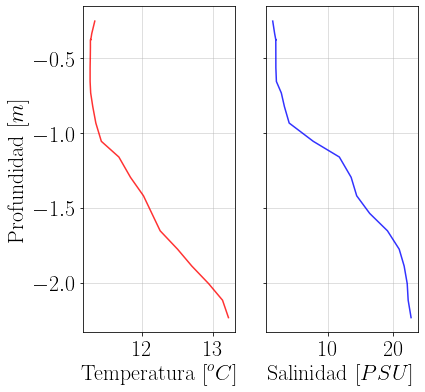

In [ ]:
#Inicio figura
fig, (ax1, ax3) = plt.subplots(ncols=2, figsize=(6, 6), sharey=True)

#Gráfico Temperatura
ax1.set_ylabel(r"Profundidad "
          r"$\displaystyle[m]$",
          fontsize=22)
ax1.set_xlabel(r"Temperatura "
          r"$\displaystyle[^o C]$",
          fontsize=22)
ax1.plot(p1['Temperatura'], -p1["Profundidad"], c='r', alpha=0.8)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.grid(alpha=0.5)

#Gráfico salinidad
ax3.set_xlabel(r"Salinidad "
          r"$\displaystyle[PSU]$",
          fontsize=22)
ax3.plot(p1['Salinidad'], -p1["Profundidad"], c='b', alpha=0.8)
ax3.xaxis.set_tick_params(labelsize=22)
ax3.yaxis.set_tick_params(labelsize=22)
ax3.grid(alpha=0.5)

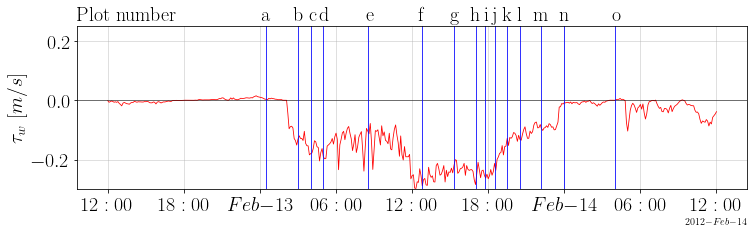

In [ ]:
wdf = dfw['u'].loc[datetime.datetime(2012,2,12,12,0,0):datetime.datetime(2012,2,14,12,0,0)]

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax2) = plt.subplots(nrows=1, figsize=(12, 3))

ax2.set_title("Plot number \hspace{4.3em}a \hspace{0.6em} b c\hspace{0.1em}d\hspace{2em}e\hspace{2.1em} f\hspace{1.1em} g\hspace{0.6em}h\hspace{0.2em}i\hspace{0.2em}j\hspace{0.2em}k\hspace{0.3em}l\hspace{0.6em}m\hspace{0.6em}n\hspace{2em} o", fontsize=20 , loc='left')
ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[m/s]$",
          fontsize=20)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=20)
ax2.yaxis.set_tick_params(labelsize=20)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.3, 0.25)
ax2.axvline(x=datetime.datetime(2012,2,13,0,30,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,13,3,0,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,13,4,0,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,13,5,0,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,13,8,30,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,13,12,45,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,13,15,20,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,13,17,0,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,13,17,45,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,13,18,30,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,13,19,30,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,13,20,30,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,13,22,10,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,14,0,0,0), lw=0.8, color='b')
ax2.axvline(x=datetime.datetime(2012,2,14,4,0,0), lw=0.8, color='b')

# Ajustar formato fecha
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

# general

In [38]:
bu2 = UV_burst.sel(time=slice("2012-02-16","2012-03-03")).u
bv2 = UV_burst.sel(time=slice("2012-02-16","2012-03-03")).v
dfu = df_u.loc[datetime.date(2012,2,16):datetime.date(2012,3,3)]
dfv = df_v.loc[datetime.date(2012,2,16):datetime.date(2012,3,3)]
bvert = vert_burst.loc[datetime.date(2012,2,16):datetime.date(2012,3,3)]
wdf = dfw['u'].loc[datetime.date(2012,2,11):datetime.date(2012,3,3)]
sf = snfco.loc[datetime.date(2012,2,11):datetime.date(2012,3,3)]
mt = mnty.loc[datetime.date(2012,2,17):datetime.date(2012,3,3)]
dc1 = DC_1.loc[datetime.date(2012,2,17):datetime.date(2012,3,3)]
hm = hmoon.loc[datetime.date(2012,2,11):datetime.date(2012,3,3)]
# dc2 = DC_2.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]
# dc3 = DC_3.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]
# dc4 = DC_4.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]

# nm1 = NM_1.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]
# nm2 = NM_2.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]
# nm3 = NM_3.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]

# ml1 = ML_1.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]
# ml2 = ML_2.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]

# pc1 = PC_1.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]

y_bin = np.linspace(1.19, 3.59, 25)

In [39]:
q = Q.loc[datetime.date(2012,2,11):datetime.date(2012,3,3)]

dc = DC_CTD.sel(time=slice("2012-02-11 00:00:00","2012-03-03 00:00:00")).v
nm = NM_CTD.sel(time=slice("2012-02-11 00:00:00","2012-03-03 00:00:00")).v
ml = ML_CTD.sel(time=slice("2012-02-11 00:00:00","2012-03-03 00:00:00")).v
pc = PC_CTD.sel(time=slice("2012-02-11 00:00:00","2012-03-03 00:00:00")).v

## Caudal

### NM

In [42]:
#dh/dt

hf = nm.sel(sensor=1, variables='Depth').values[3600:]
hi = nm.sel(sensor=1, variables='Depth').values[:-3600]
dt = 10

dhdt = (hf-hi)/dt

qf = q.values[40:]
qi = q.values[:-40]
dt_q = 10

dqdt = (qf-qi)/dt_q


ValueError: x and y must have same first dimension, but have shapes (176481,) and (177841,)

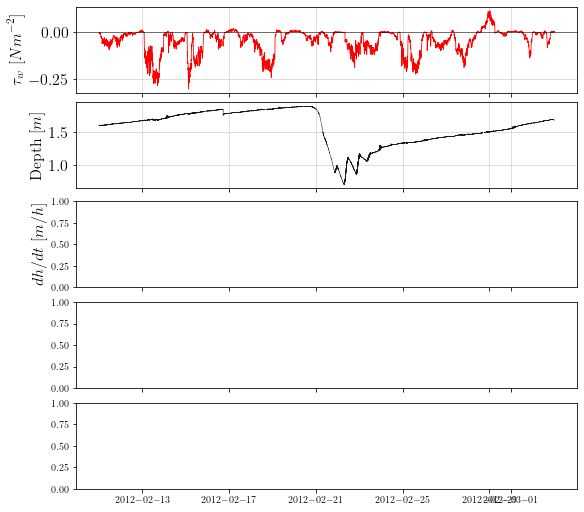

In [46]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax1, ax3, ax10, ax4) = plt.subplots(nrows=5, figsize=(8, 7), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax1.set_ylabel(r"Depth "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.plot(nm.time, nm.sel(sensor=1, variables='Depth').values, c='k', alpha=0.9, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$dh/dt$ "
          r"$\displaystyle[m/h]$",
          fontsize=16)
ax3.plot(nm.time.values[1800:-1800], dhdt, color='b', lw=0.8)
# ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
ax3.set_ylim(-0.01, 0.01)

# ax4.set_ylabel(r"$dQ/dt$ "
#           r"$\displaystyle[m^3/s/h]$",
#           fontsize=16)
# ax4.plot(q.index, dqdt, color='b', lw=0.8)
# # ax3.axhline(y=0, color='k', linewidth=0.5)
# ax4.xaxis.set_tick_params(labelsize=16)
# ax4.yaxis.set_tick_params(labelsize=16)
# ax4.grid(alpha=0.5)


ax10.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, moving_averages, lw=0.8, c='k')
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

### ML

In [44]:
#dh/dt

hf = ml.sel(sensor=1, variables='Depth').values[3600:]
hi = ml.sel(sensor=1, variables='Depth').values[:-3600]
dt = 10

dhdt = (hf-hi)/dt


ValueError: x and y must have same first dimension, but have shapes (2013,) and (1977, 1)

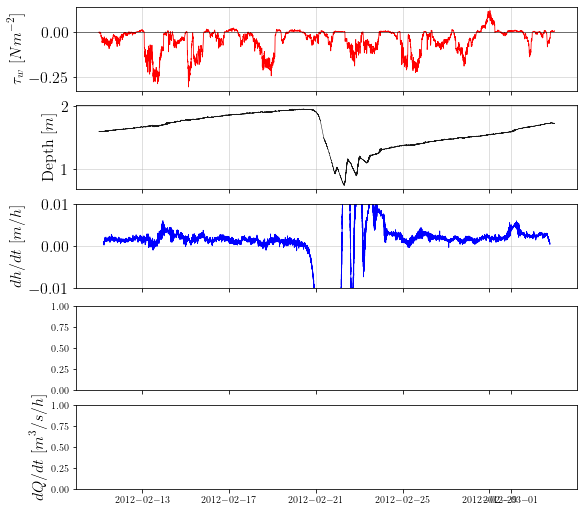

In [45]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax1, ax3, ax10, ax4) = plt.subplots(nrows=5, figsize=(8, 7), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax1.set_ylabel(r"Depth "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.plot(ml.time, ml.sel(sensor=1, variables='Depth').values, c='k', alpha=0.9, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$dh/dt$ "
          r"$\displaystyle[m/h]$",
          fontsize=16)
ax3.plot(ml.time.values[1800:-1800], dhdt, color='b', lw=0.8)
# ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
ax3.set_ylim(-0.01,0.01)

ax4.set_ylabel(r"$dQ/dt$ "
          r"$\displaystyle[m^3/s/h]$",
          fontsize=16)
ax4.plot(q.index[2:-2], dqdt, color='b', lw=0.8)
# ax3.axhline(y=0, color='k', linewidth=0.5)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax10.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

### DC

In [43]:
#dh/dt

hf = dc.sel(sensor=1, variables='Depth').values[3600:]
hi = dc.sel(sensor=1, variables='Depth').values[:-3600]
dt = 10

dhdt = (hf-hi)/dt


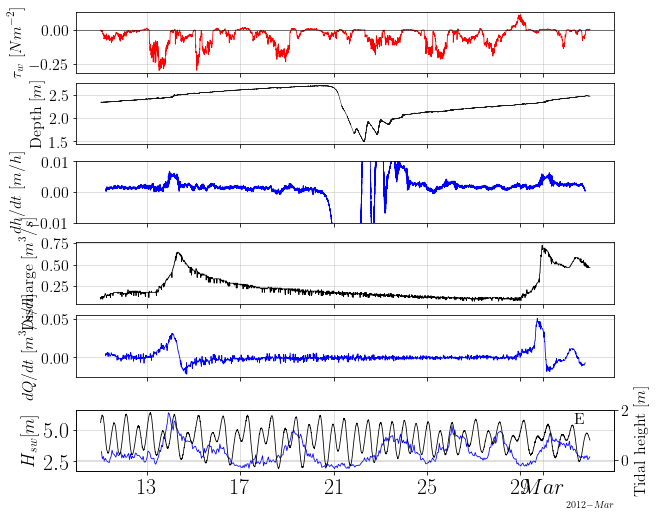

In [44]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax1, ax3, ax10, ax4, ax6) = plt.subplots(nrows=6, figsize=(9, 7), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax1.set_ylabel(r"Depth "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.plot(dc.time, dc.sel(sensor=1, variables='Depth').values, c='k', alpha=0.9, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$dh/dt$ "
          r"$\displaystyle[m/h]$",
          fontsize=16)
ax3.plot(dc.time.values[1800:-1800], dhdt, color='b', lw=0.8)
# ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
ax3.set_ylim(-0.01, 0.01)

ax4.set_ylabel(r"$dQ/dt$ "
          r"$\displaystyle[m^3/s/h]$",
          fontsize=16)
ax4.plot(q.index[20:-20], dqdt, color='b', lw=0.8)
# ax3.axhline(y=0, color='k', linewidth=0.5)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax10.set_ylabel(r"Discharge "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

 #Grafico water level estandarizada

ax6.set_ylabel(r"$H_{sw}[m]$",
          fontsize=18)
ax6.plot(hm.index, hm['WVHT'].values, c='b', linewidth=0.8)
ax6.xaxis.set_tick_params(labelsize=22)
ax6.yaxis.set_tick_params(labelsize=22)
ax6.grid(alpha=0.5)
ax6.text(datetime.datetime(2012,3,2,7,30,0), 5.5, "E",
          fontsize=16)

# Grafico nivel del agua SF

ax7 = ax6.twinx()
ax7.set_ylabel(r"Tidal height "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='k', lw=0.8)
# ax7.plot(mt.index, mt.values, c='g')
# ax7.legend(["San Fco", "Monterrey"], loc='upper right',
#           fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

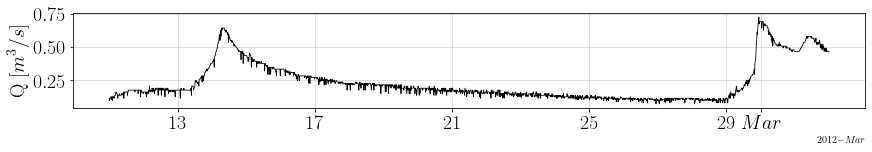

In [49]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, ( ax10) = plt.subplots(nrows=1, figsize=(12, 2), constrained_layout=True, sharex=True)



# ax1.set_ylabel(r"Depth "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax1.plot(dc.time, dc.sel(sensor=1, variables='Depth').values, c='k', alpha=0.9, linewidth=0.5)
# ax1.xaxis.set_tick_params(labelsize=16)
# ax1.yaxis.set_tick_params(labelsize=16)
# ax1.grid(alpha=0.5)

# ax3.set_ylabel(r"$dh/dt$ "
#           r"$\displaystyle[m/h]$",
#           fontsize=16)
# ax3.plot(dc.time.values[1800:-1800], dhdt, color='b', lw=0.8)
# # ax3.axhline(y=0, color='k', linewidth=0.5)
# ax3.xaxis.set_tick_params(labelsize=16)
# ax3.yaxis.set_tick_params(labelsize=16)
# ax3.grid(alpha=0.5)
# ax3.set_ylim(-0.01, 0.01)

# ax4.set_ylabel(r"$dQ/dt$ "
#           r"$\displaystyle[m^3/s/h]$",
#           fontsize=16)
# ax4.plot(q.index[20:-20], dqdt, color='b', lw=0.8)
# # ax3.axhline(y=0, color='k', linewidth=0.5)
# ax4.xaxis.set_tick_params(labelsize=16)
# ax4.yaxis.set_tick_params(labelsize=16)
# ax4.grid(alpha=0.5)

ax10.set_ylabel(r"Q "
          r"$\displaystyle[m^3/s]$",
          fontsize=20)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=20)
ax10.yaxis.set_tick_params(labelsize=20)
ax10.grid(alpha=0.5)

ax10.xaxis.set_major_locator(locator)
ax10.xaxis.set_major_formatter(formatter)

In [67]:
min15_2 = pd.date_range(start=datetime.datetime(2012,2,25,0,0,0), end=datetime.datetime(2012,3,2,19,0,0), periods=None, freq='15min')


In [56]:
min15 = pd.date_range(start=datetime.datetime(2012,2,11,5,0,0), end=datetime.datetime(2012,2,20,0,0,0), periods=None, freq='15min')


In [57]:
df_dhdt = pd.DataFrame(data=dhdt, index=dc.time.values[1800:-1800], columns=["dhdt"])
df_dqdt = pd.DataFrame(data=dqdt, index=q.index[20:-20], columns=["dqdt"])

In [58]:
df_dqdt.loc[min15].shape

(845, 1)

In [66]:
dqdt

array([[ 0.00470059],
       [ 0.00189723],
       [ 0.00339802],
       ...,
       [-0.00821188],
       [-0.00821188],
       [-0.00679604]])

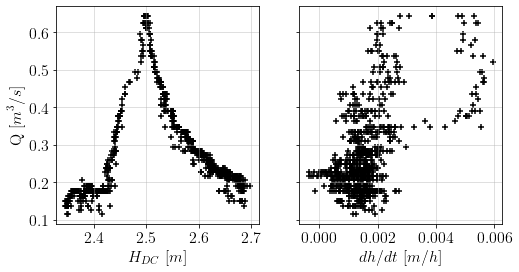

In [59]:
#Inicio figura
fig, (ax1, ax10) = plt.subplots(ncols=2, figsize=(8, 4), sharey=True)

ax1.set_ylabel(r"Q "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax1.scatter(dc.sel(sensor=1, variables="Depth", time=min15), q.loc[min15], marker="+", c='k')

ax1.set_xlabel(r"$H_{DC}$ "
          r"$\displaystyle[m]$",
          fontsize=16)

ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)



# ax10.set_ylabel(r"$Q$ "
#           r"$\displaystyle[m^3/s]$",
#           fontsize=16)
ax10.scatter(df_dhdt.loc[min15], q.loc[min15], marker="+", c='k')

ax10.set_xlabel(r"$dh/dt$ "
          r"$\displaystyle[m/h]$",
          fontsize=16)

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)


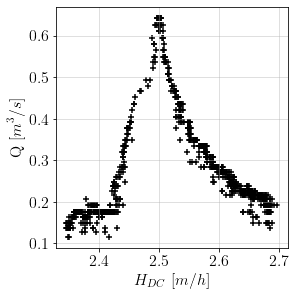

In [65]:
#Inicio figura
fig, (ax10) = plt.subplots(nrows=1, figsize=(4, 4), constrained_layout=True, sharex=True)

ax10.set_ylabel(r"Q "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.scatter(dc.sel(sensor=1, variables="Depth", time=min15), q.loc[min15], marker="+", c='k')

ax10.set_xlabel(r"$H_{DC}$ "
          r"$\displaystyle[m/h]$",
          fontsize=16)

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)


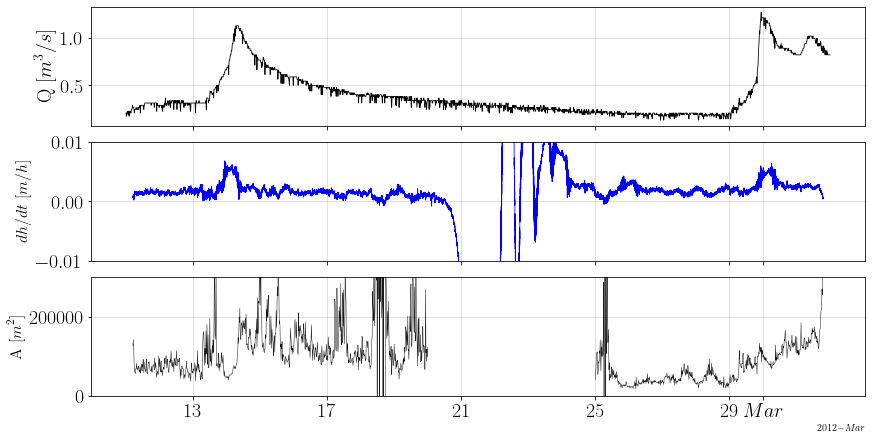

In [71]:
#### Grafico Q, dhdt, Area, calculo para obtener area

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, ( ax10, ax3, ax1) = plt.subplots(nrows=3, figsize=(12, 6), constrained_layout=True, sharex=True)



ax1.set_ylabel(r"A "
          r"$\displaystyle[m^2]$",
          fontsize=16)
ax1.plot(q.loc[min15].index, 1.76*q.loc[min15].values/(df_dhdt.loc[min15].values/360), c='k', alpha=0.9, linewidth=0.5)
ax1.plot(q.loc[min15_2].index, 1.76*q.loc[min15_2].values/(df_dhdt.loc[min15_2].values/360), c='k', alpha=0.9, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=20)
ax1.yaxis.set_tick_params(labelsize=20)
ax1.grid(alpha=0.5)
ax1.set_ylim(-1000, 300000)

ax3.set_ylabel(r"$dh/dt$ "
          r"$\displaystyle[m/h]$",
          fontsize=16)
ax3.plot(dc.time.values[1800:-1800], dhdt, color='b', lw=0.8)
# ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=20)
ax3.yaxis.set_tick_params(labelsize=20)
ax3.grid(alpha=0.5)
ax3.set_ylim(-0.01, 0.01)

# ax4.set_ylabel(r"$dQ/dt$ "
#           r"$\displaystyle[m^3/s/h]$",
#           fontsize=16)
# ax4.plot(q.index[20:-20], dqdt, color='b', lw=0.8)
# # ax3.axhline(y=0, color='k', linewidth=0.5)
# ax4.xaxis.set_tick_params(labelsize=16)
# ax4.yaxis.set_tick_params(labelsize=16)
# ax4.grid(alpha=0.5)

ax10.set_ylabel(r"Q "
          r"$\displaystyle[m^3/s]$",
          fontsize=20)
ax10.plot(q.index, q*1.76, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=20)
ax10.yaxis.set_tick_params(labelsize=20)
ax10.grid(alpha=0.5)

ax10.xaxis.set_major_locator(locator)
ax10.xaxis.set_major_formatter(formatter)

### PC

In [96]:
#dh/dt

hf = pc.sel(sensor=1, variables='Depth').values[1200:]
hi = pc.sel(sensor=1, variables='Depth').values[:-1200]
dt = 10

dhdt = (hf-hi)/dt


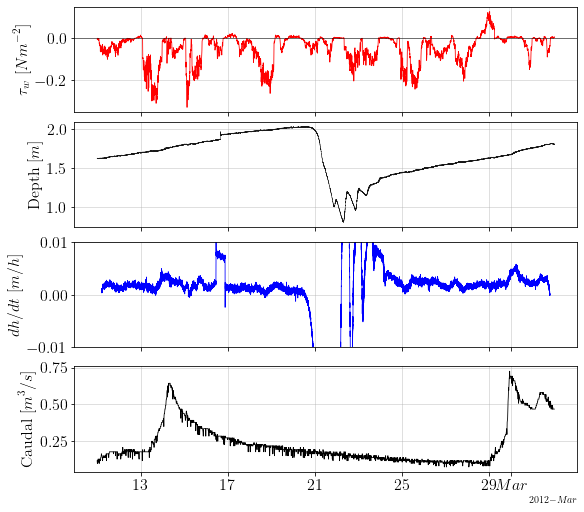

In [72]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax1, ax3, ax10) = plt.subplots(nrows=4, figsize=(8, 7), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax1.set_ylabel(r"Depth "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.plot(pc.time, pc.sel(sensor=1, variables='Depth').values, c='k', alpha=0.9, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$dh/dt$ "
          r"$\displaystyle[m/h]$",
          fontsize=16)
ax3.plot(pc.time[600:-600], dhdt, color='b', lw=0.8)
# ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
ax3.set_ylim(-0.01, 0.01)


ax10.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

## velocidad

In [40]:
min15_del = pd.date_range(start=datetime.datetime(2012,2,22,0,0,0), end=datetime.datetime(2012,2,23,0,0,0), periods=None, freq='15min')
b2vert = bvert.drop(bvert.loc[min15_del].index, axis=0)
wdf = dfw['u'].loc[datetime.date(2012,2,17):datetime.date(2012,3,3)]

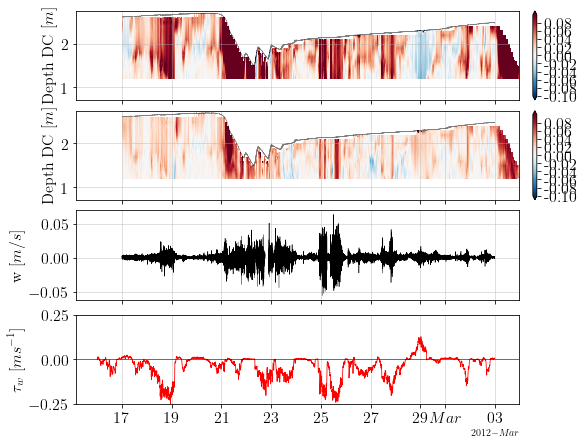

In [75]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1,ax3, ax4, ax2) = plt.subplots(nrows=4, figsize=(8, 6), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax3.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax3.contourf(bv2.time, y_bin,
                         np.transpose(bv2.values),
                         levels=level_boundaries_v,
                         cmap=cm.RdBu_r,
                         vmax=vmax, vmin=vmin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax3, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax3.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax3.set_ylim(0.71, 2.75)

#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax1.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax1.set_ylim(0.71, 2.75)

#Grafico velocidad viento

# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)

# Velocidad vertical

ax4.plot(bvert.index, bvert.mean(1), c='k', lw=0.5)
ax4.set_ylabel(r"w "
          r"$\displaystyle[m/s]$",
          fontsize=16)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)


plt.show() 

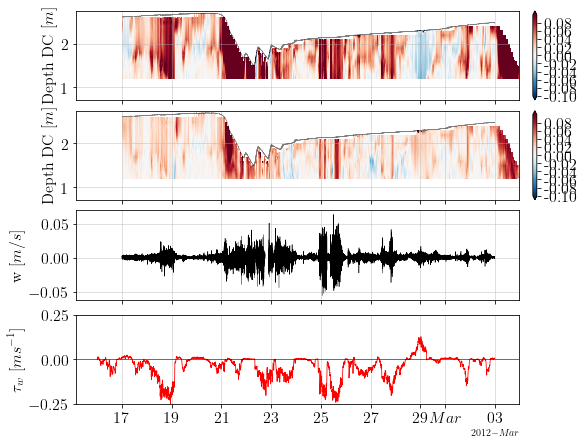

In [ ]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1,ax3, ax4, ax2) = plt.subplots(nrows=4, figsize=(8, 6), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax3.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax3.contourf(bv2.time, y_bin,
                         np.transpose(bv2.values),
                         levels=level_boundaries_v,
                         cmap=cm.RdBu_r,
                         vmax=vmax, vmin=vmin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax3, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax3.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax3.set_ylim(0.71, 2.75)

#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax1.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax1.set_ylim(0.71, 2.75)

#Grafico velocidad viento

# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)

# Velocidad vertical

ax4.plot(bvert.index, bvert.mean(1), c='k', lw=0.5)
ax4.set_ylabel(r"w "
          r"$\displaystyle[m/s]$",
          fontsize=16)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)


plt.show() 

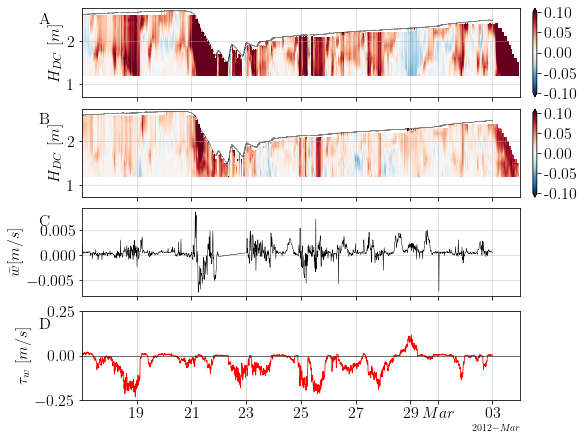

In [43]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1,ax3, ax4, ax2) = plt.subplots(nrows=4, figsize=(8, 6), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax3.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax3.contourf(bv2.time, y_bin,
                         np.transpose(bv2.values),
                         levels=level_boundaries_v,
                         cmap=cm.RdBu_r,
                         vmax=vmax, vmin=vmin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax3, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
ax3.set_ylabel(r"$H_{DC}$ "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax3.set_ylim(0.71, 2.75)
ax3.text(datetime.datetime(2012,2,15,10,30,0), 2.4, "B",
          fontsize=16)

#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
ax1.set_ylabel(r"$H_{DC}$ "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax1.set_ylim(0.71, 2.75)
ax1.text(datetime.datetime(2012,2,15,10,30,0), 2.4, "A",
          fontsize=16)

#Grafico velocidad viento

# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[m/s]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)
ax2.text(datetime.datetime(2012,2,15,10,30,0), 0.15, "D",
          fontsize=16)

# Velocidad vertical

ax4.plot(b2vert.index, b2vert.mean(1), c='k', lw=0.5)
ax4.set_ylabel(r"$\bar{w} [m/s]$",
          fontsize=16)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)
ax4.text(datetime.datetime(2012,2,15,10,30,0), 0.006, "C",
          fontsize=16)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)


plt.show() 

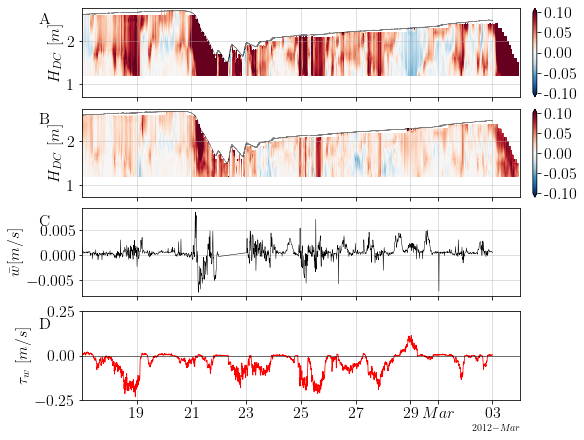

In [42]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1,ax3, ax4, ax2) = plt.subplots(nrows=4, figsize=(8, 6), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax3.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax3.contourf(bv2.time, y_bin,
                         np.transpose(bv2.values),
                         levels=level_boundaries_v,
                         cmap=cm.RdBu_r,
                         vmax=vmax, vmin=vmin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax3, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
ax3.set_ylabel(r"$H_{DC}$ "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax3.set_ylim(0.71, 2.75)
ax3.text(datetime.datetime(2012,2,15,10,30,0), 2.4, "B",
          fontsize=16)

#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
ax1.set_ylabel(r"$H_{DC}$ "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax1.set_ylim(0.71, 2.75)
ax1.text(datetime.datetime(2012,2,15,10,30,0), 2.4, "A",
          fontsize=16)

#Grafico velocidad viento

# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[m/s]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)
ax2.text(datetime.datetime(2012,2,15,10,30,0), 0.15, "D",
          fontsize=16)

# Velocidad vertical

ax4.plot(b2vert.index, b2vert.mean(1), c='k', lw=0.5)
ax4.set_ylabel(r"$\bar{w} [m/s]$",
          fontsize=16)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)
ax4.text(datetime.datetime(2012,2,15,10,30,0), 0.006, "C",
          fontsize=16)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)


plt.show() 

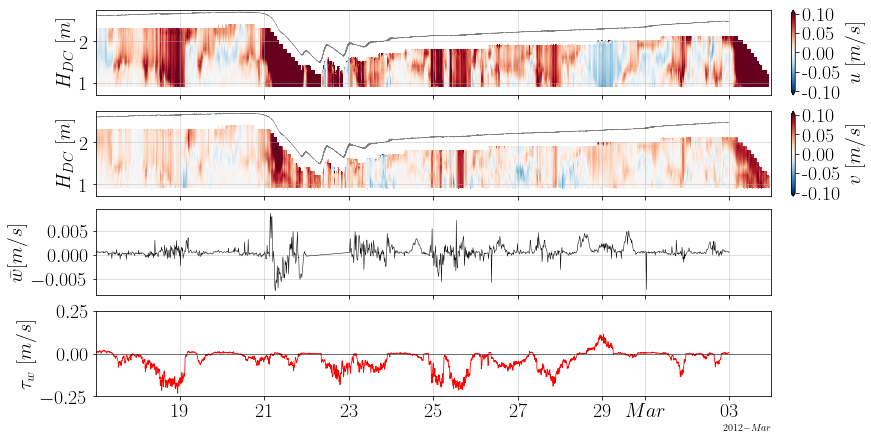

In [44]:
y_bin = np.linspace(0.91, 3.31, 25)
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1,ax3, ax4, ax2) = plt.subplots(nrows=4, figsize=(12, 6), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax3.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax3.contourf(bv2.time, y_bin,
                         np.transpose(bv2.values),
                         levels=level_boundaries_v,
                         cmap=cm.RdBu_r,
                         vmax=vmax, vmin=vmin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax3, pad=0.03)
cbar.ax.tick_params(labelsize=20)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
ax3.set_ylabel(r"$H_{DC}$ "
          r"$\displaystyle[m]$",
          fontsize=20)
cbar.set_label("$v$ $[m/s]$", loc='center',
          fontsize=20)
ax3.grid(alpha=0.5)
ax3.yaxis.set_tick_params(labelsize=20)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax3.set_ylim(0.71, 2.75)


#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=20)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
ax1.set_ylabel(r"$H_{DC}$ "
          r"$\displaystyle[m]$",
          fontsize=20)
cbar.set_label("$u$ $[m/s]$", loc='center',
          fontsize=20)
ax1.grid(alpha=0.5)
ax1.yaxis.set_tick_params(labelsize=20)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax1.set_ylim(0.71, 2.75)



# Velocidad vertical

ax4.plot(b2vert.index, b2vert.mean(1), c='k', lw=0.5)
ax4.set_ylabel(r"$\bar{w} [m/s]$",
          fontsize=20)

ax4.xaxis.set_tick_params(labelsize=20)
ax4.yaxis.set_tick_params(labelsize=20)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[m/s]$",
          fontsize=20)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=20)
ax2.yaxis.set_tick_params(labelsize=20)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)



# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)


plt.show() 

### 1st Wind event 2nd period

In [49]:
bu2 = UV_burst.sel(time=slice("2012-02-24","2012-02-27 00:00:00")).u
bv2 = UV_burst.sel(time=slice("2012-02-24","2012-02-27")).v
dfu = df_u.loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]
dfv = df_v.loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]
bvert = vert_burst.loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]
wdf = dfw['u'].loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]
dc1 = DC_1.loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]
sf = snfco.loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]

y_bin = np.linspace(1.19, 3.59, 25)

In [50]:
min15_del = pd.date_range(start=datetime.datetime(2012,2,24,0,0,0), end=datetime.datetime(2012,2,27,0,0,0), periods=None, freq='15min')
b2vert = bvert.drop(bvert.loc[min15_del].index, axis=0)
wdf = dfw['u'].loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]

In [51]:
# min15_del = pd.date_range(start=datetime.datetime(2012,2,22,0,0,0), end=datetime.datetime(2012,2,23,0,0,0), periods=None, freq='15min')
# b2vert = bvert.drop(bvert.loc[min15_del].index, axis=0)
wdf = dfw['u'].loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]

In [52]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

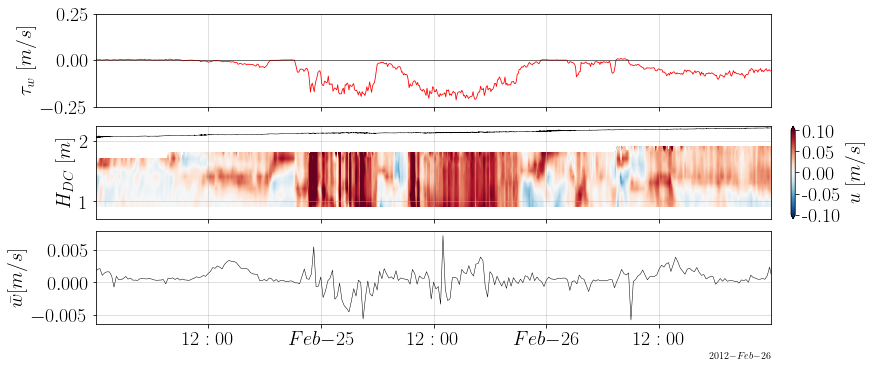

In [44]:
y_bin = np.linspace(0.91, 3.31, 25)
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax1, ax4) = plt.subplots(nrows=3, figsize=(12, 5), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=20)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
ax1.set_ylabel(r"$H_{DC}$ "
          r"$\displaystyle[m]$",
          fontsize=20)
cbar.set_label("$u$ $[m/s]$", loc='center',
          fontsize=20)
ax1.grid(alpha=0.5)
ax1.yaxis.set_tick_params(labelsize=20)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=1, linewidth=0.5)
ax1.set_ylim(0.71, 2.25)



# Velocidad vertical

ax4.plot(bvert.index, bvert.mean(1), c='k', lw=0.5)
ax4.set_ylabel(r"$\bar{w} [m/s]$",
          fontsize=20)

ax4.xaxis.set_tick_params(labelsize=20)
ax4.yaxis.set_tick_params(labelsize=20)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[m/s]$",
          fontsize=20)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=20)
ax2.yaxis.set_tick_params(labelsize=20)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)



# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)



plt.show() 

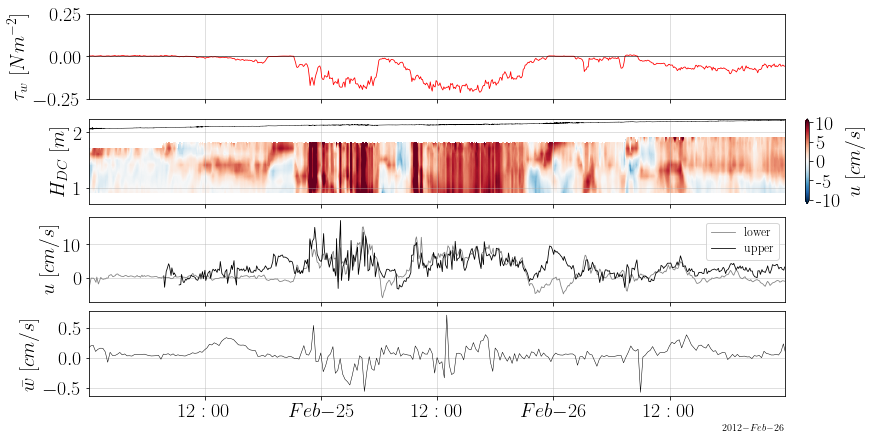

In [46]:
y_bin = np.linspace(0.91, 3.31, 25)
#Ajustar limites colorbar
umin = -10
umax = 10
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax1, ax3, ax4) = plt.subplots(nrows=4, figsize=(12, 6), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values*100),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=20)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.0f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(5))
ax1.set_ylabel(r"$H_{DC}$ "
          r"$\displaystyle[m]$",
          fontsize=20)
cbar.set_label("$u$ $[cm/s]$", loc='center',
          fontsize=20)
ax1.grid(alpha=0.5)
ax1.yaxis.set_tick_params(labelsize=20)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=1, linewidth=0.5)
ax1.set_ylim(0.71, 2.25)



# Velocidad vertical

ax4.plot(bvert.index, bvert.mean(1)*100, c='k', lw=0.5)
ax4.set_ylabel(r"$\bar{w}$ "
          r"$\displaystyle[cm/s]$",
          fontsize=20)

ax4.xaxis.set_tick_params(labelsize=20)
ax4.yaxis.set_tick_params(labelsize=20)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=20)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=20)
ax2.yaxis.set_tick_params(labelsize=20)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)

ax3.set_ylabel(r"$u$ "
          r"$\displaystyle[cm/s]$",
          fontsize=20)
ax3.plot(bu2.time, bu2.isel(bin=0)*100, c="grey", lw=0.8, label="lower")
ax3.plot(bu2.time, bu2.isel(bin=9)*100, c="k", lw=0.8, label="upper")
ax3.xaxis.set_tick_params(labelsize=20)
ax3.yaxis.set_tick_params(labelsize=20)
ax3.grid(alpha=0.5)
ax3.legend(fontsize=12)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)



plt.show() 

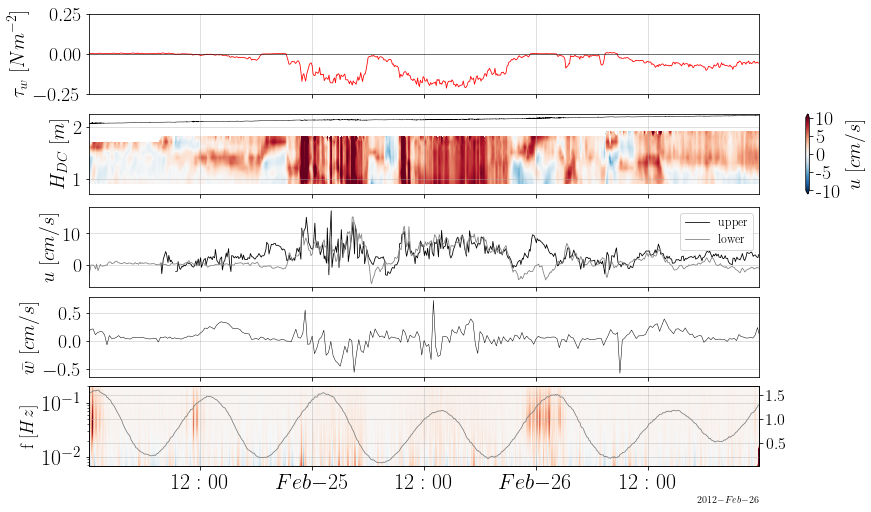

In [55]:
y_bin = np.linspace(0.91, 3.31, 25)
#Ajustar limites colorbar
umin = -10
umax = 10
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax1, ax3, ax4, ax5) = plt.subplots(nrows=5, figsize=(12, 7), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values*100),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=20)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.0f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(5))
ax1.set_ylabel(r"$H_{DC}$ "
          r"$\displaystyle[m]$",
          fontsize=20)
cbar.set_label("$u$ $[cm/s]$", loc='center',
          fontsize=20)
ax1.grid(alpha=0.5)
ax1.yaxis.set_tick_params(labelsize=20)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=1, linewidth=0.5)
ax1.set_ylim(0.71, 2.25)



# Velocidad vertical

ax4.plot(bvert.index, bvert.mean(1)*100, c='k', lw=0.5)
ax4.set_ylabel(r"$\bar{w}$ "
          r"$\displaystyle[cm/s]$",
          fontsize=20)

ax4.xaxis.set_tick_params(labelsize=20)
ax4.yaxis.set_tick_params(labelsize=20)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=20)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=20)
ax2.yaxis.set_tick_params(labelsize=20)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)

ax3.set_ylabel(r"$u$ "
          r"$\displaystyle[cm/s]$",
          fontsize=20)
ax3.plot(bu2.time, bu2.isel(bin=9)*100, c="k", lw=0.8, label="upper")
ax3.plot(bu2.time, bu2.isel(bin=0)*100, c="grey", lw=0.8, label="lower")
ax3.xaxis.set_tick_params(labelsize=20)
ax3.yaxis.set_tick_params(labelsize=20)
ax3.grid(alpha=0.5)
ax3.legend(fontsize=12)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

#Wavelet
contourf_ = ax5.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
# cbar = fig.colorbar(contourf_, ax=ax5, pad=0.007)
# cbar.ax.tick_params(labelsize=20)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
# cbar.set_label("Coeficientes", loc='center',
#           fontsize=16)
# ax1.set_ylabel(r'Frequencia [Hz]',
#           fontsize=16)
ax5.set_ylabel(r"f "
          r"$\displaystyle[Hz]$",
          fontsize=18)
ax5.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax5.xaxis.set_tick_params(labelsize=22)
ax5.yaxis.set_tick_params(labelsize=22)
ax5.set_yscale("log")

ax7 = ax5.twinx()

# ax7.set_ylabel(r"Tidal height "
#           r"$\displaystyle[m]$",
#           fontsize=16)
ax7.plot(sf.index, sf.values, c='gray', lw=0.8, label="San Fco")
# ax7.plot(dc.time, dc.sel(sensor=1, variables='Depth')-0.1423, c='k', linewidth=0.8, label="Pescadero")
# ax7.plot(mt.index, mt.values, c='g')
# ax7.legend(["San Fco", "Monterrey"], loc='upper right',
#           fontsize=16);
ax7.xaxis.set_tick_params(labelsize=22)
ax7.yaxis.set_tick_params(labelsize=22)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.05
umax = 0.05
vmin = -0.05
vmax = 0.05
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

# Grafico water level estandarizada



# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)



plt.show() 

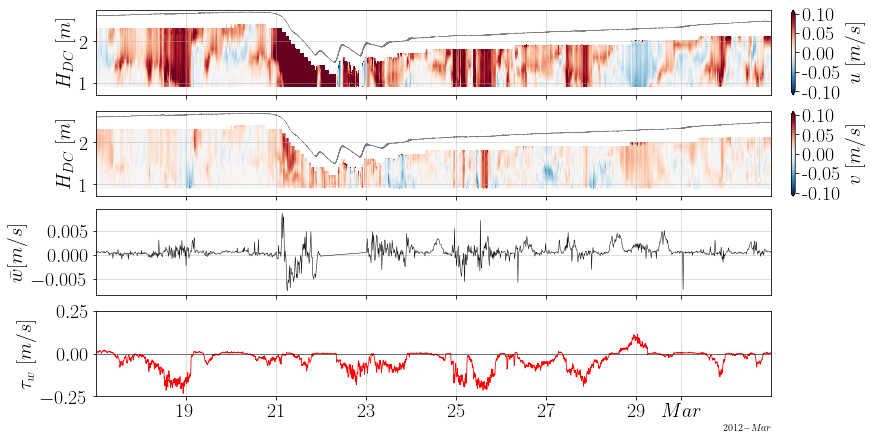

In [44]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1,ax3, ax4, ax2) = plt.subplots(nrows=4, figsize=(12, 6), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax3.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax3.contourf(dfv.index, y_bin,
                         np.transpose(dfv.values),
                         levels=level_boundaries_v,
                         cmap=cm.RdBu_r,
                         vmax=vmax, vmin=vmin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax3, pad=0.03)
cbar.ax.tick_params(labelsize=20)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
ax3.set_ylabel(r"$H_{DC}$ "
          r"$\displaystyle[m]$",
          fontsize=20)
cbar.set_label("$v$ $[m/s]$", loc='center',
          fontsize=20)
ax3.grid(alpha=0.5)
ax3.yaxis.set_tick_params(labelsize=20)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax3.set_ylim(0.71, 2.75)


#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax1.contourf(dfu.index, y_bin,
                         np.transpose(dfu.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=20)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
ax1.set_ylabel(r"$H_{DC}$ "
          r"$\displaystyle[m]$",
          fontsize=20)
cbar.set_label("$u$ $[m/s]$", loc='center',
          fontsize=20)
ax1.grid(alpha=0.5)
ax1.yaxis.set_tick_params(labelsize=20)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax1.set_ylim(0.71, 2.75)



# Velocidad vertical

ax4.plot(b2vert.index, b2vert.mean(1), c='k', lw=0.5)
ax4.set_ylabel(r"$\bar{w} [m/s]$",
          fontsize=20)

ax4.xaxis.set_tick_params(labelsize=20)
ax4.yaxis.set_tick_params(labelsize=20)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[m/s]$",
          fontsize=20)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=20)
ax2.yaxis.set_tick_params(labelsize=20)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)



# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)


plt.show() 

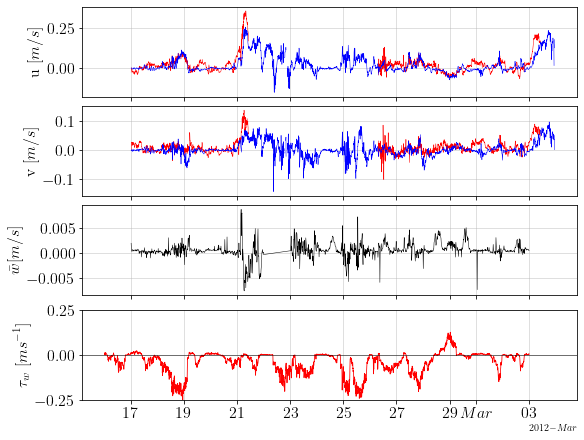

In [116]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1,ax3, ax4, ax2) = plt.subplots(nrows=4, figsize=(8, 6), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua 

ax3.set_ylabel(r"v "
          r"$\displaystyle[m/s]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.plot(bv2.time, bv2[:, 10].values, c='r', linewidth=0.5)
ax3.plot(bv2.time, bv2[:, 1].values, c='b', linewidth=0.5)


#Grafico de velocidad del agua (color map)

ax1.plot(bu2.time, bu2[:, 10].values, c='r', linewidth=0.5)
ax1.plot(bu2.time, bu2[:, 1].values, c='b', linewidth=0.5)
ax1.set_ylabel(r"u "
          r"$\displaystyle[m/s]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)


#Grafico velocidad viento

# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)

# Velocidad vertical

ax4.plot(b2vert.index, b2vert.mean(1), c='k', lw=0.5)
ax4.set_ylabel(r"$\bar{w} [m/s]$",
          fontsize=16)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)


plt.show() 

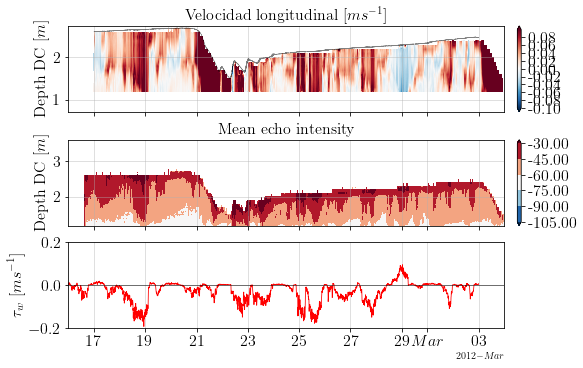

In [35]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1,ax3, ax2) = plt.subplots(nrows=3, figsize=(8, 5), constrained_layout=True, sharex=True)


#Grafico del backscatter (color map)
ax3.set_title(r"Mean echo intensity",
          fontsize=16)
contourf_ = ax3.contourf(adcp.time, y_bin,
                         bks_drp,
                        #  levels=level_boundaries_v,
                         cmap=cm.RdBu_r,
                        #  vmax=vmax, vmin=vmin, 
                         extend='both')
cbar = fig.colorbar(contourf_, ax=ax3, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax3.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
# ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax3.set_xlim(datetime.date(2012,2,16),datetime.date(2012,3,4))
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)

#Grafico de velocidad del agua (color map)
ax1.set_title(r"Velocidad longitudinal $[ms^{-1}]$",
          fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax1.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax1.set_ylim(0.71, 2.75)

#Grafico velocidad viento

# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.2, 0.2)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)


plt.show() 

In [56]:
bu2[:, 10].values

array([-0.02284611, -0.01831723,  0.00345462, ...,         nan,
               nan,         nan])

In [54]:
y_bin

array([1.19, 1.29, 1.39, 1.49, 1.59, 1.69, 1.79, 1.89, 1.99, 2.09, 2.19,
       2.29, 2.39, 2.49, 2.59, 2.69, 2.79, 2.89, 2.99, 3.09, 3.19, 3.29,
       3.39, 3.49, 3.59])

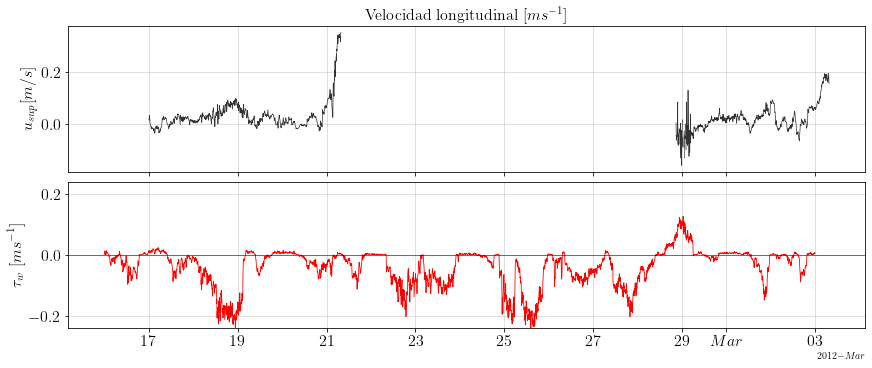

In [65]:


#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12, 5), constrained_layout=True, sharex=True)


# vel superficial
ax1.set_title(r"Velocidad longitudinal $[ms^{-1}]$",
          fontsize=16)
ax1.plot(bu2.time, bu2[:, 11].values, c='k', lw=0.7, alpha=0.8)
# ax1.plot(bu2.time, bu2[:, 9].values, c='b', lw=0.7, alpha=0.8)

ax1.set_ylabel(r"$u_{sup}[m/s]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
# ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
# ax1.set_ylim(0.71, 2.75)

#Grafico velocidad viento

# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.24, 0.24)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)


plt.show() 

al principio la velocidad aumenta junto con el viento y luego disminuye cuando se acaba. al principio tiene el mismo comportamiento para el evento fuerte de viento y el despacio, cambiando la magnitud de la velociad, siendo mayor cuando el viento es m[as fuerte, pero sin tanta diferencia en magnitud con el evento de viento despacio. Al principio del segundo periodo responde de la misma manera, pero despues del 26 ya no se muestran los mismos aumentos de velocidad con magnitudes similares de viento. Si se observa que el comportamiento de la velocidad ante vientos en direccion contraria tiene un comportamiento similar llendo en la direcci[on contraria al viento igual que antes.

NameError: name 'adcp' is not defined

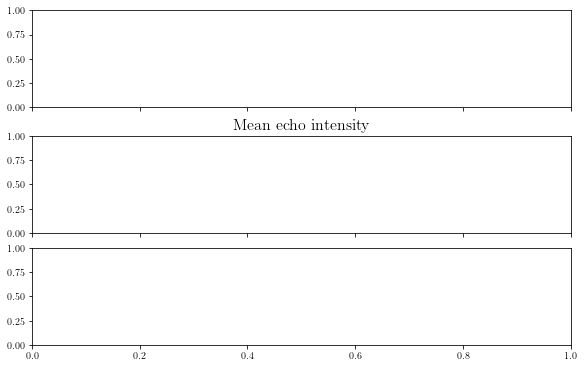

In [32]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1,ax3, ax2) = plt.subplots(nrows=3, figsize=(8, 5), constrained_layout=True, sharex=True)


#Grafico del backscatter (color map)
ax3.set_title(r"Mean echo intensity",
          fontsize=16)
contourf_ = ax3.contourf(adcp.time, y_bin,
                         bks_drp,
                        #  levels=level_boundaries_v,
                         cmap=cm.RdBu_r,
                        #  vmax=vmax, vmin=vmin, 
                         extend='both')
cbar = fig.colorbar(contourf_, ax=ax3, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax3.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
# ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax3.set_xlim(datetime.date(2012,2,16),datetime.date(2012,3,4))
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)

#Grafico de velocidad del agua (color map)
ax1.set_title(r"Velocidad longitudinal $[ms^{-1}]$",
          fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax1.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax1.set_ylim(0.71, 2.75)

#Grafico velocidad viento

# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.2, 0.2)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)


plt.show() 

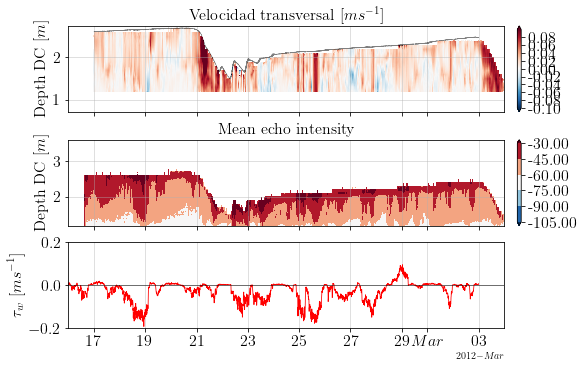

In [36]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1,ax3, ax2) = plt.subplots(nrows=3, figsize=(8, 5), constrained_layout=True, sharex=True)


#Grafico del backscatter (color map)
ax3.set_title(r"Mean echo intensity",
          fontsize=16)
contourf_ = ax3.contourf(adcp.time, y_bin,
                         bks_drp,
                        #  levels=level_boundaries_v,
                         cmap=cm.RdBu_r,
                        #  vmax=vmax, vmin=vmin, 
                         extend='both')
cbar = fig.colorbar(contourf_, ax=ax3, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax3.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
# ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax3.set_xlim(datetime.date(2012,2,16),datetime.date(2012,3,4))
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)

#Grafico de velocidad del agua (color map)
ax1.set_title(r"Velocidad transversal $[ms^{-1}]$",
          fontsize=16)
contourf_ = ax1.contourf(bv2.time, y_bin,
                         np.transpose(bv2.values),
                         levels=level_boundaries_v,
                         cmap=cm.RdBu_r,
                         vmax=vmax, vmin=vmin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax1.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax1.set_ylim(0.71, 2.75)

#Grafico velocidad viento

# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.2, 0.2)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)


plt.show() 

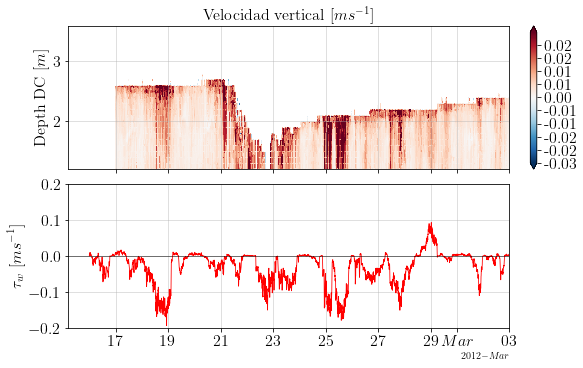

In [30]:
#Ajustar limites colorbar
umin = -0.03
umax = 0.03
vmin = -0.03
vmax = 0.03
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(8, 5), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
ax1.set_title(r"Velocidad vertical $[ms^{-1}]$",
          fontsize=16)
contourf_ = ax1.contourf(bvert.index, y_bin,
                         np.transpose(bvert.values),
                         levels=level_boundaries_v,
                         cmap=cm.RdBu_r,
                         vmax=vmax, vmin=vmin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax1.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
# ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
# ax1.set_ylim(0.71, 2.75)

#Grafico velocidad viento

# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.2, 0.2)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
# ax3.xaxis.set_major_locator(locator)
# ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)


plt.show() 

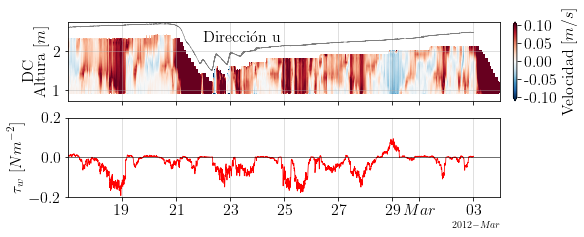

In [186]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(8, 3), constrained_layout=True, sharex=True)


# #Grafico de velocidad del agua (color map)

# contourf_ = ax3.contourf(bv2.time, y_bin,
#                          np.transpose(bv2.values),
#                          levels=level_boundaries_v,
#                          cmap=cm.RdBu_r,
#                          vmax=vmax, vmin=vmin, extend='both')
# cbar = fig.colorbar(contourf_, ax=ax3, pad=0.03)
# cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))

# ax3.set_ylabel(r"DC \\ Altura "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax3.grid(alpha=0.5)
# ax3.xaxis.set_tick_params(labelsize=16)
# ax3.yaxis.set_tick_params(labelsize=16)
# ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
# ax3.set_ylim(0.71, 2.75)
# ax3.text(pd.to_datetime('2012-2-23 00:00:00'), 2.25, 'Dirección v',
#           fontsize=16)

#Grafico de velocidad del agua (color map)

contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
cbar.set_label("Velocidad   $[m/s]$", loc='center',
          fontsize=16)
ax1.set_ylabel(r"DC \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax1.set_ylim(0.71, 2.75)
ax1.text(pd.to_datetime('2012-2-22 00:00:00'), 2.25, 'Dirección u',
          fontsize=16)


#Grafico velocidad viento

ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.2, 0.2)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

plt.show() 

In [39]:
bu2 = UV_burst.sel(time=slice("2012-02-11 00:00:00","2012-02-22 00:00:00")).u
bv2 = UV_burst.sel(time=slice("2012-02-11 00:00:00","2012-02-22 00:00:00")).v
wdf = dfw['u'].loc[datetime.date(2012,2,11):datetime.date(2012,2,22)]
sf = snfco.loc[datetime.date(2012,2,11):datetime.date(2012,2,22)]
mt = mnty.loc[datetime.date(2012,2,11):datetime.date(2012,2,22)]
dc1 = DC_1.loc[datetime.date(2012,2,11):datetime.date(2012,2,22)]
# dc2 = DC_2.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]
# dc3 = DC_3.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]
# dc4 = DC_4.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]

# nm1 = NM_1.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]
# nm2 = NM_2.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]
# nm3 = NM_3.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]

# ml1 = ML_1.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]
# ml2 = ML_2.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]

# pc1 = PC_1.loc[datetime.date(2012,2,12):datetime.date(2012,2,22)]

y_bin = np.linspace(1.19, 3.59, 25)

In [41]:
q = Q.loc[datetime.date(2012,2,11):datetime.date(2012,3,3)]

dc = DC_CTD.sel(time=slice("2012-02-11 00:00:00","2012-03-03 00:00:00")).v
nm = NM_CTD.sel(time=slice("2012-02-11 00:00:00","2012-03-03 00:00:00")).v
ml = ML_CTD.sel(time=slice("2012-02-11 00:00:00","2012-03-03 00:00:00")).v
pc = PC_CTD.sel(time=slice("2012-02-11 00:00:00","2012-03-03 00:00:00")).v

In [45]:
### Richardson number

bu2_time = bu2.time.values
bu2_time = np.delete(bu2_time, [21, 120, 121, 755, 195, 325, 529, 555, 559, 589, 588, 603, 619, 879, 937])
h_u = dc1.loc[bu2_time]['Depth'].values

bv2_time = bv2.time.values
bv2_time = np.delete(bv2_time, [21, 120, 121, 755, 195, 325, 529, 555, 559, 589, 588, 603, 619, 879, 937])
# h_v = dc1.loc[bv2_time]['Depth'].values

tiempo, bins = np.meshgrid(bu2_time, bu2.bin.values[:8])
# # tiempo, bins_v = np.meshgrid(bv2_time, bv2.bin.values[:8])

bins2 = np.zeros((bins.shape))
for i in range(8):
    bins2[i,:] = h_u - bins[i, :]

# bins2_v = np.zeros((bins_v.shape))
# for i in range(8):
#     bins2_v[i,:] = h_v - bins_v[i, :]

dudz = ((bu2.isel(bin=5).sel(time=bu2_time).values - bu2.isel(bin=1).sel(time=bu2_time).values)/(bins2[5,:]-bins2[1,:]))
dvdz = ((bv2.isel(bin=5).sel(time=bu2_time).values - bv2.isel(bin=1).sel(time=bu2_time).values)/(bins2[5,:]-bins2[1,:]))

S2 = dudz**2 + dvdz**2

# dc43_ri = N2_dc43['N2'].loc[bu2_time].values/S2

NameError: name 'N2_dc43' is not defined

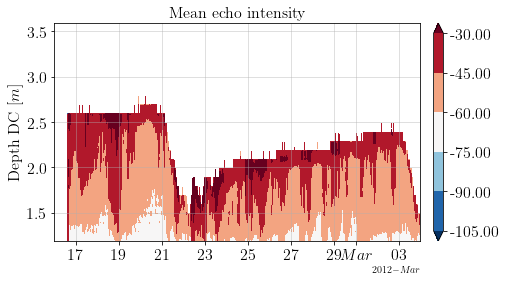

In [43]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax3) = plt.subplots(nrows=1, figsize=(8, 4))


#Grafico del backscatter (color map)
ax3.set_title(r"Mean echo intensity",
          fontsize=16)
contourf_ = ax3.contourf(adcp.time, y_bin,
                         bks_drp,
                        #  levels=level_boundaries_v,
                         cmap=cm.RdBu_r,
                        #  vmax=vmax, vmin=vmin, 
                         extend='both')
cbar = fig.colorbar(contourf_, ax=ax3, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax3.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
# ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
ax3.set_xlim(datetime.date(2012,2,16),datetime.date(2012,3,4))
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)


plt.show() 

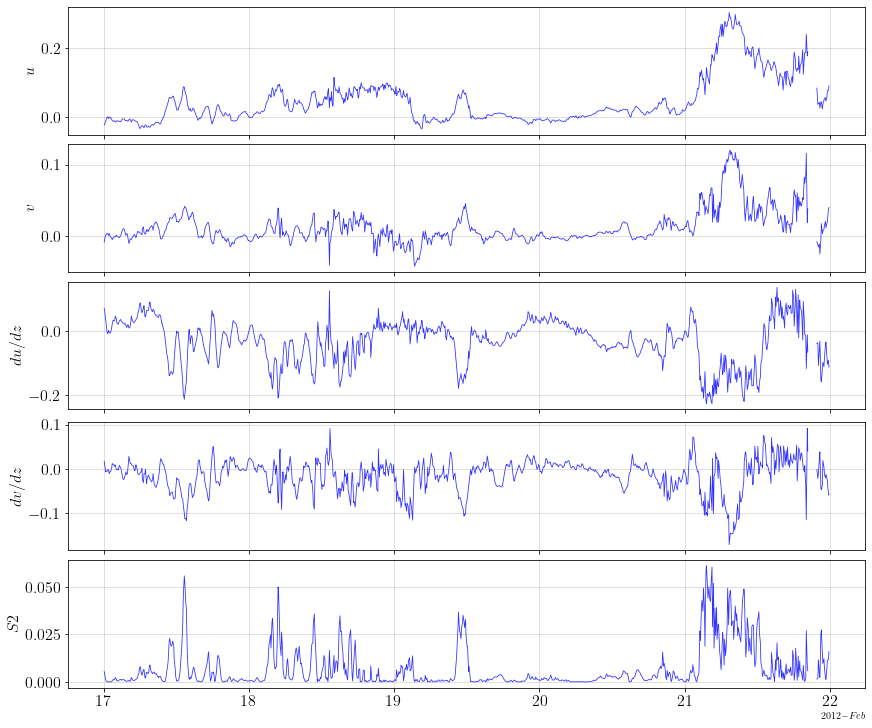

In [46]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(nrows=5, figsize=(12, 10), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

bu2.isel(bin=5).sel(time=bu2_time).values

ax1.set_ylabel(r"$u$ ",
          fontsize=16)

ax1.plot(bu2_time, bu2.isel(bin=5).sel(time=bu2_time).values, c='b', alpha=0.8, linewidth=0.8, label='top-bottom')

ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax2.set_ylabel(r"$v$ ",
          fontsize=16)

ax2.plot(bu2_time, bv2.isel(bin=5).sel(time=bu2_time).values, c='b', alpha=0.8, linewidth=0.8, label='top-bottom')

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax3.set_ylabel(r"$du/dz$ ",
          fontsize=16)

ax3.plot(bu2_time, dudz, c='b', alpha=0.8, linewidth=0.8, label='top-bottom')

ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

ax4.set_ylabel(r"$dv/dz$ ",
          fontsize=16)

ax4.plot(bu2_time, dvdz, c='b', alpha=0.8, linewidth=0.8, label='top-bottom')

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax5.set_ylabel(r"$S2$ ",
          fontsize=16)

ax5.plot(bu2_time, S2, c='b', alpha=0.8, linewidth=0.8, label='top-bottom')

ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

# Feb 11st - Feb 22nd

## Overview

In [40]:
bu2 = UV_burst.sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).u
wdf = dfw['u'].loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
sf = snfco.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
hm = hmoon.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
mt = mnty.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
q = Q.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]

dc1 = DC_1.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
dc2 = DC_2.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
dc3 = DC_3.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
dc4 = DC_4.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]

nm1 = NM_1.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
nm2 = NM_2.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
nm3 = NM_3.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]

ml1 = ML_1.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
ml2 = ML_2.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]

pc1 = PC_1.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]

dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).v
nm = NM_CTD.sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).v
ml = ML_CTD.sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).v
pc = PC_CTD.sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).v

In [43]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

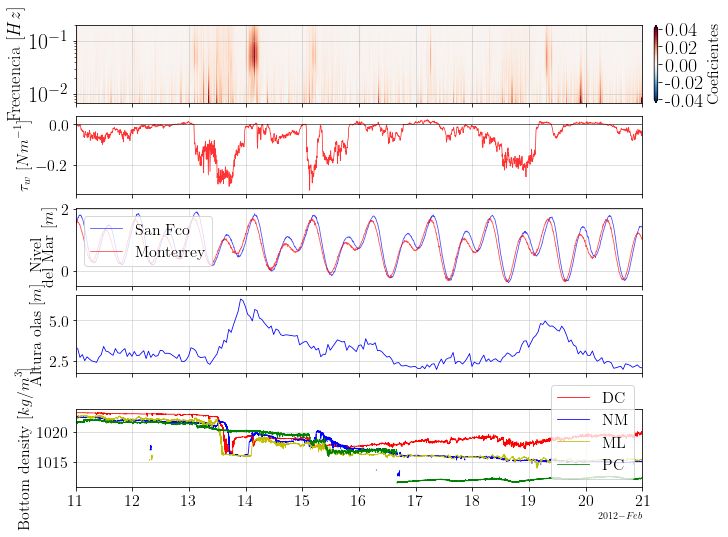

In [42]:
fig, (ax1, ax3, ax2, ax4, ax5) = plt.subplots(nrows=5, figsize=(10, 7), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

#Wavelet
contourf_ = ax1.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.007)
cbar.ax.tick_params(labelsize=20)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
# ax1.set_ylabel(r'Frequencia [Hz]',
#           fontsize=16)
ax1.set_ylabel(r"Frecuencia "
          r"$\displaystyle[Hz]$",
          fontsize=18)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.set_yscale("log")


ax2.plot(sf.index, sf.values, alpha=0.7, linewidth=0.8, c="b", label='San Fco');
ax2.plot(mt.index, mt.values, alpha=0.7, linewidth=0.8, c="r", label='Monterrey');
ax2.legend(loc='upper left',
          fontsize=16);
ax2.set_ylabel(r'Nivel\\del Mar [$m$]',
          fontsize=16)
ax2.grid(alpha=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)

ax4.set_ylabel(r"Altura olas "
          r"$\displaystyle[m]$",
          fontsize=16)
ax4.plot(hm.index, hm['WVHT'].values, c='b', linewidth=0.8)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

#Densidad fondo

ax5.set_ylabel(r"Bottom density "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax5.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.8, c="r", label='DC')
ax5.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='NM')
ax5.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.8, c="y", label='ML')
ax5.plot(pc.time, pc.sel(sensor=1, variables='Density'), lw=0.8, c='g', label='PC')

ax5.legend(loc='lower right',
          fontsize=16);
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

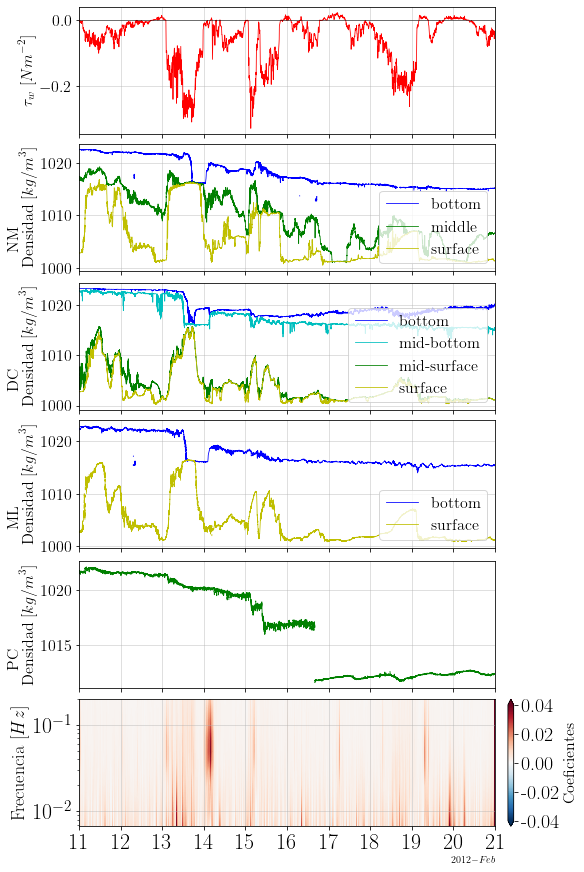

In [40]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

#Inicio figura
fig, (ax2, ax6, ax7, ax8, ax9, ax1) = plt.subplots(nrows=6, figsize=(8, 12), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax6.set_ylabel(r"NM\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax6.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax6.plot(nm.time, nm.sel(sensor=2, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="g", label='middle')
ax6.plot(nm.time, nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="y", label='surface')
ax6.legend(loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

ax7.set_ylabel(r"DC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax7.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax7.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.8, c="c", label='mid-bottom')
ax7.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.8, c="g", label='mid-surface')
ax7.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.8, c="y", label='surface')

ax7.legend(loc='lower right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

ax8.set_ylabel(r"ML\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax8.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax8.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.8, c="y", label='surface')

ax8.legend(loc='lower right',
          fontsize=16);
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.grid(alpha=0.5)

ax9.set_ylabel(r"PC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax9.plot(pc.time, pc.sel(sensor=1, variables='Density'), lw=0.8, c='g')

ax9.xaxis.set_tick_params(labelsize=16)
ax9.yaxis.set_tick_params(labelsize=16)
ax9.grid(alpha=0.5)

#Wavelet
contourf_ = ax1.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.007)
cbar.ax.tick_params(labelsize=20)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
# ax1.set_ylabel(r'Frequencia [Hz]',
#           fontsize=16)
ax1.set_ylabel(r"Frecuencia "
          r"$\displaystyle[Hz]$",
          fontsize=18)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.set_yscale("log")

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

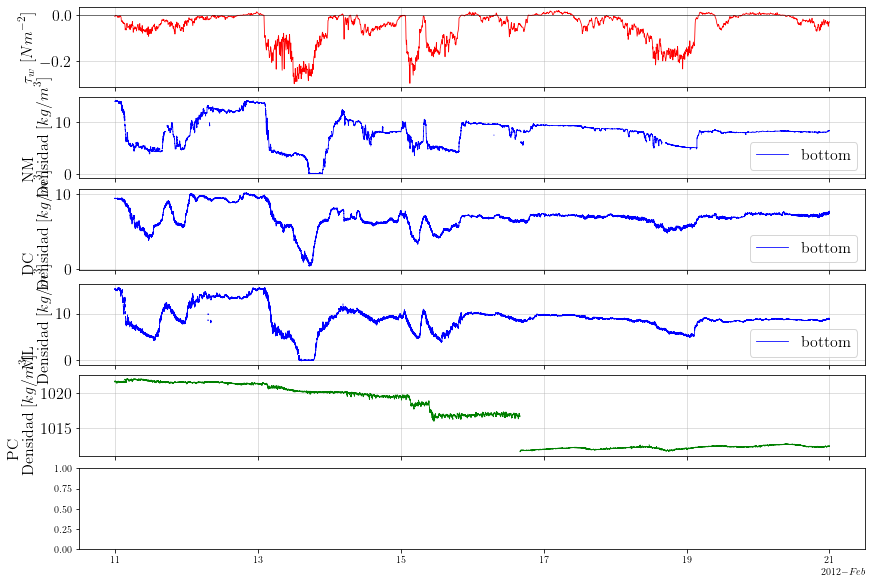

In [44]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

#Inicio figura
fig, (ax2, ax6, ax7, ax8, ax9, ax1) = plt.subplots(nrows=6, figsize=(12, 8), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax6.set_ylabel(r"NM\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax6.plot(nm.time, (nm.sel(sensor=1, variables='Density')-nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"))/(nm.sel(sensor=1, variables='Depth')-nm.sel(sensor=3, variables='Depth').interpolate_na(dim="time", method="nearest")), linewidth=0.8, c="b", label='bottom')
# ax6.plot(nm.time, nm.sel(sensor=2, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="g", label='middle')
# ax6.plot(nm.time, nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="y", label='surface')
ax6.legend(loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

ax7.set_ylabel(r"DC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax7.plot(dc.time, (dc.sel(sensor=1, variables='Density')-dc.sel(sensor=4, variables='Density'))/(dc.sel(sensor=1, variables='Depth')-dc.sel(sensor=4, variables='Depth')), linewidth=0.8, c="b", label='bottom')
# ax7.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.8, c="c", label='mid-bottom')
# ax7.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.8, c="g", label='mid-surface')
# ax7.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.8, c="y", label='surface')

ax7.legend(loc='lower right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

ax8.set_ylabel(r"ML\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax8.plot(ml.time, (ml.sel(sensor=1, variables='Density')-ml.sel(sensor=2, variables='Density'))/(ml.sel(sensor=1, variables='Depth')-ml.sel(sensor=2, variables='Depth')), linewidth=0.8, c="b", label='bottom')
# ax8.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.8, c="y", label='surface')

ax8.legend(loc='lower right',
          fontsize=16);
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.grid(alpha=0.5)

ax9.set_ylabel(r"PC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax9.plot(pc.time, pc.sel(sensor=1, variables='Density'), lw=0.8, c='g')

ax9.xaxis.set_tick_params(labelsize=16)
ax9.yaxis.set_tick_params(labelsize=16)
ax9.grid(alpha=0.5)


ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

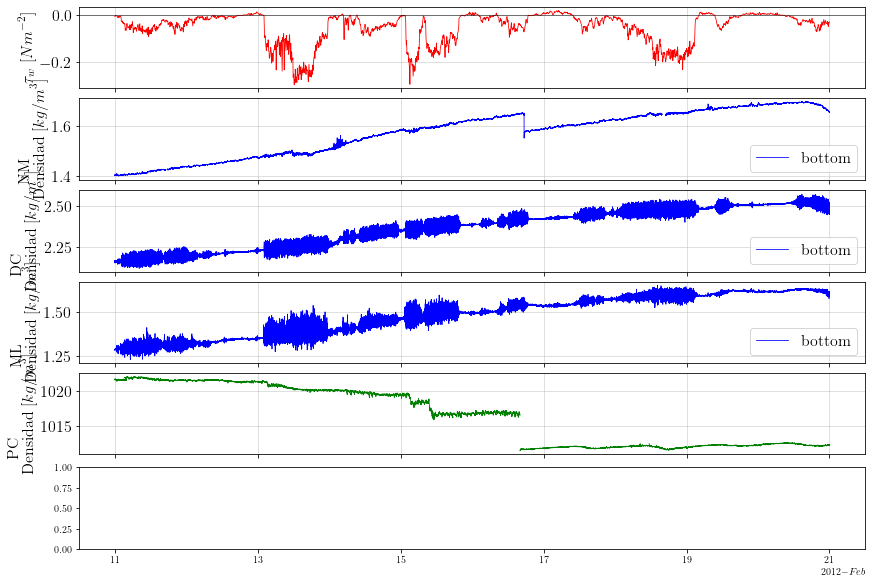

In [43]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

#Inicio figura
fig, (ax2, ax6, ax7, ax8, ax9, ax1) = plt.subplots(nrows=6, figsize=(12, 8), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax6.set_ylabel(r"NM\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax6.plot(nm.time, nm.sel(sensor=1, variables='Depth')-nm.sel(sensor=3, variables='Depth').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="b", label='bottom')
# ax6.plot(nm.time, nm.sel(sensor=2, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="g", label='middle')
# ax6.plot(nm.time, nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="y", label='surface')
ax6.legend(loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

ax7.set_ylabel(r"DC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax7.plot(dc.time, dc.sel(sensor=1, variables='Depth')-dc.sel(sensor=4, variables='Depth'), linewidth=0.8, c="b", label='bottom')
# ax7.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.8, c="c", label='mid-bottom')
# ax7.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.8, c="g", label='mid-surface')
# ax7.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.8, c="y", label='surface')

ax7.legend(loc='lower right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

ax8.set_ylabel(r"ML\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax8.plot(ml.time, ml.sel(sensor=1, variables='Depth')-ml.sel(sensor=2, variables='Depth'), linewidth=0.8, c="b", label='bottom')
# ax8.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.8, c="y", label='surface')

ax8.legend(loc='lower right',
          fontsize=16);
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.grid(alpha=0.5)

ax9.set_ylabel(r"PC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax9.plot(pc.time, pc.sel(sensor=1, variables='Density'), lw=0.8, c='g')

ax9.xaxis.set_tick_params(labelsize=16)
ax9.yaxis.set_tick_params(labelsize=16)
ax9.grid(alpha=0.5)


ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

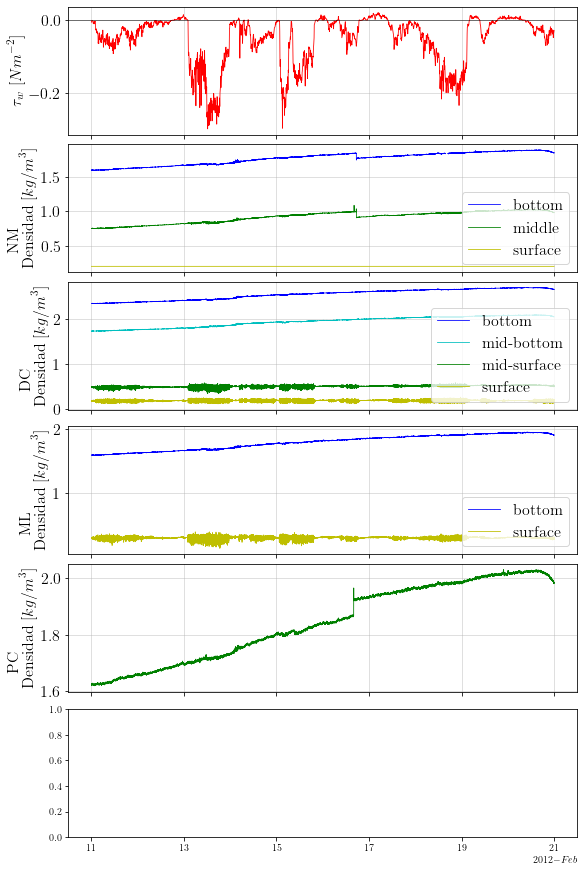

In [41]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

#Inicio figura
fig, (ax2, ax6, ax7, ax8, ax9, ax1) = plt.subplots(nrows=6, figsize=(8, 12), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax6.set_ylabel(r"NM\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax6.plot(nm.time, nm.sel(sensor=1, variables='Depth'), linewidth=0.8, c="b", label='bottom')
ax6.plot(nm.time, nm.sel(sensor=2, variables='Depth').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="g", label='middle')
ax6.plot(nm.time, nm.sel(sensor=3, variables='Depth').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="y", label='surface')
ax6.legend(loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

ax7.set_ylabel(r"DC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax7.plot(dc.time, dc.sel(sensor=1, variables='Depth'), linewidth=0.8, c="b", label='bottom')
ax7.plot(dc.time, dc.sel(sensor=2, variables='Depth'), linewidth=0.8, c="c", label='mid-bottom')
ax7.plot(dc.time, dc.sel(sensor=3, variables='Depth'), linewidth=0.8, c="g", label='mid-surface')
ax7.plot(dc.time, dc.sel(sensor=4, variables='Depth'), linewidth=0.8, c="y", label='surface')

ax7.legend(loc='lower right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

ax8.set_ylabel(r"ML\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax8.plot(ml.time, ml.sel(sensor=1, variables='Depth'), linewidth=0.8, c="b", label='bottom')
ax8.plot(ml.time, ml.sel(sensor=2, variables='Depth'), linewidth=0.8, c="y", label='surface')

ax8.legend(loc='lower right',
          fontsize=16);
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.grid(alpha=0.5)

ax9.set_ylabel(r"PC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax9.plot(pc.time, pc.sel(sensor=1, variables='Depth'), lw=0.8, c='g')

ax9.xaxis.set_tick_params(labelsize=16)
ax9.yaxis.set_tick_params(labelsize=16)
ax9.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

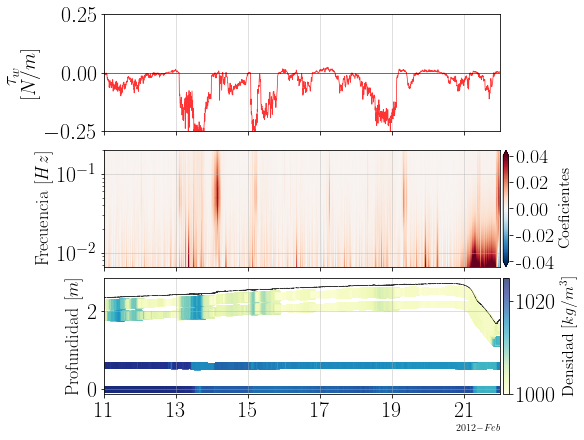

In [36]:
#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

fig, (ax3, ax1, ax4) = plt.subplots(nrows=3, figsize=(8, 6), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Wavelet
contourf_ = ax1.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.007)
cbar.ax.tick_params(labelsize=20)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
# ax1.set_ylabel(r'Frequencia [Hz]',
#           fontsize=16)
ax1.set_ylabel(r"Frecuencia "
          r"$\displaystyle[Hz]$",
          fontsize=18)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.set_yscale("log")


ax3.set_ylabel(r"$\tau_w$\\"
          r"$\displaystyle[N/m]$",
          fontsize=20)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=22)
ax3.yaxis.set_tick_params(labelsize=22)
ax3.grid(alpha=0.5)
ax3.set_ylim(-0.25, 0.25)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)

#Grafico de profundidad y densidad (color map) DC
# ax1.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
#           fontsize=16)
ax4.set_ylabel(r"Profundidad "
          r"$\displaystyle[m]$",
          fontsize=18)

ax4.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.8, linewidth=0.5)
scat = ax4.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', alpha=0.7, cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(dc2.index, dc1.loc[dc2.index]['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', alpha=0.7, cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(dc3.index, dc1.loc[dc3.index]['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', alpha=0.7, cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(dc4.index, dc1.loc[dc4.index]['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', alpha=0.7, cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax4, pad=0.007)
cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=16)
cbar2.ax.tick_params(labelsize=22)
ax4.xaxis.set_tick_params(labelsize=22)
ax4.yaxis.set_tick_params(labelsize=22)
ax4.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

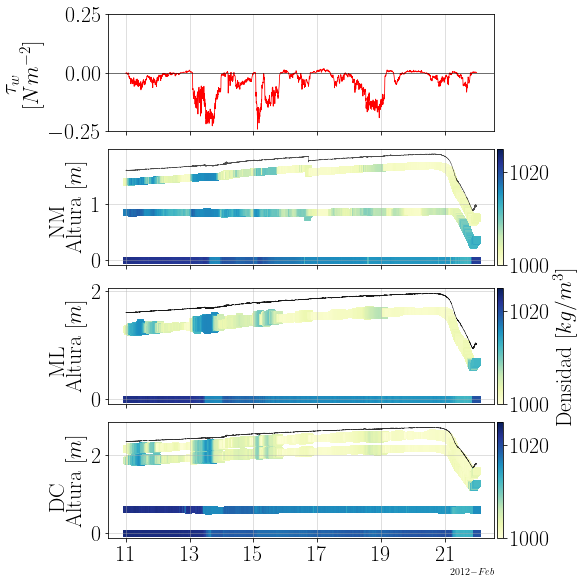

In [36]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax4, ax5, ax3) = plt.subplots(nrows=4, figsize=(8, 8), constrained_layout=True, sharex=True)

# fig = plt.figure(figsize=(10, 24), constrained_layout=True)
# gs = GridSpec(14, 1, figure=fig)

#Grafico de velocidad del agua (color map)
# ax1 = fig.add_subplot(gs[:3, 0])
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
# contourf_ = ax1.contourf(bu2.time, y_bin,
#                          np.transpose(bu2.values),
#                          levels=level_boundaries_u,
#                          cmap=cm.RdBu_r,
#                          vmax=umax, vmin=umin, extend='both')
# cbar = fig.colorbar(contourf_, ax=ax1, pad=0.007)
# cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.04))
# cbar.set_label("Velocity [$m/s$]", loc='center',
#           fontsize=16)
# ax1.set_ylabel(r"Depth "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax1.grid(alpha=0.5)
# ax1.set_ylim(1, 2.5)
# ax1.xaxis.set_tick_params(labelsize=16)
# ax1.yaxis.set_tick_params(labelsize=16)



#Grafico de profundidad y densidad (color map) DC
# ax3 = fig.add_subplot(gs[6, 0])
# ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
#           fontsize=16)
ax3.set_ylabel(r"DC \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.8, linewidth=0.5)
scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax3, pad=0.007)
cbar2.ax.tick_params(labelsize=22)
# cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax3.xaxis.set_tick_params(labelsize=22)
ax3.yaxis.set_tick_params(labelsize=22)
ax3.grid(alpha=0.5)

# Grafico densidades NM
# ax4 = fig.add_subplot(gs[4, 0])
# ax4.set_title(r"Density calculated from temperature and salinity at NM [$kg/m^3$]",
#           fontsize=16)
ax4.set_ylabel(r"NM \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax4.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.7, linewidth=0.5)
scat = ax4.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax4, pad=0.007)
cbar3.ax.tick_params(labelsize=22)
# cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax4.xaxis.set_tick_params(labelsize=22)
ax4.yaxis.set_tick_params(labelsize=22)
ax4.grid(alpha=0.5)

#Grafico velocidad viento
# ax2 = fig.add_subplot(gs[3, 0])
# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$\\$[Nm^{-2}]$ ",
          fontsize=22)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=22)
ax2.yaxis.set_tick_params(labelsize=22)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)

# Grafico densidades ML
# ax5 = fig.add_subplot(gs[5, 0])
# ax5.set_title(r"Density calculated from temperature and salinity at ML [$kg/m^3$]",
#           fontsize=16)
ax5.set_ylabel(r"ML \\ Altura $[m]$",
          fontsize=22)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.9, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.007)
cbar4.ax.tick_params(labelsize=22)
cbar4.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=22)
ax5.xaxis.set_tick_params(labelsize=22)
ax5.yaxis.set_tick_params(labelsize=22)
ax5.grid(alpha=0.5)


#Ajustar limites colorbar
umin = -0.04
umax = 0.04
vmin = -0.04
vmax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)




# Ajustar formato fecha

ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

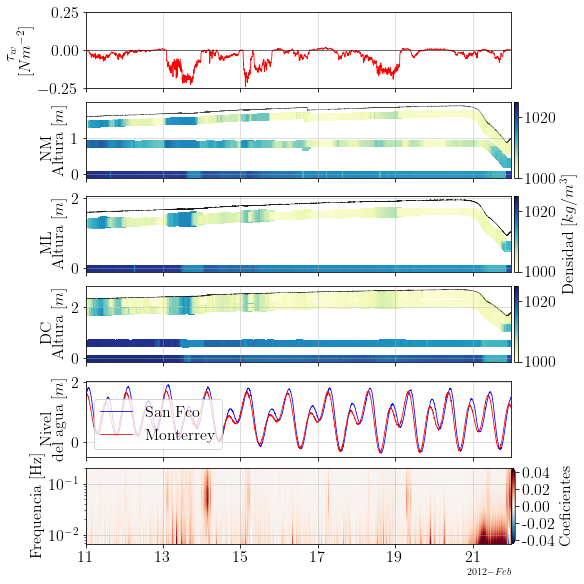

In [37]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax4, ax5, ax3, ax7, ax8) = plt.subplots(nrows=6, figsize=(8, 8), constrained_layout=True, sharex=True)

# fig = plt.figure(figsize=(10, 24), constrained_layout=True)
# gs = GridSpec(14, 1, figure=fig)

#Grafico de velocidad del agua (color map)
# ax1 = fig.add_subplot(gs[:3, 0])
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
# contourf_ = ax1.contourf(bu2.time, y_bin,
#                          np.transpose(bu2.values),
#                          levels=level_boundaries_u,
#                          cmap=cm.RdBu_r,
#                          vmax=umax, vmin=umin, extend='both')
# cbar = fig.colorbar(contourf_, ax=ax1, pad=0.007)
# cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.04))
# cbar.set_label("Velocity [$m/s$]", loc='center',
#           fontsize=16)
# ax1.set_ylabel(r"Depth "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax1.grid(alpha=0.5)
# ax1.set_ylim(1, 2.5)
# ax1.xaxis.set_tick_params(labelsize=16)
# ax1.yaxis.set_tick_params(labelsize=16)



#Grafico de profundidad y densidad (color map) DC
# ax3 = fig.add_subplot(gs[6, 0])
# ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
#           fontsize=16)
ax3.set_ylabel(r"DC \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.8, linewidth=0.5)
scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax3, pad=0.007)
cbar2.ax.tick_params(labelsize=16)
# cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

# Grafico densidades NM
# ax4 = fig.add_subplot(gs[4, 0])
# ax4.set_title(r"Density calculated from temperature and salinity at NM [$kg/m^3$]",
#           fontsize=16)
ax4.set_ylabel(r"NM \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=16)
ax4.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.7, linewidth=0.5)
scat = ax4.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax4, pad=0.007)
cbar3.ax.tick_params(labelsize=16)
# cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

#Grafico velocidad viento
# ax2 = fig.add_subplot(gs[3, 0])
# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$\\$[Nm^{-2}]$ ",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)

# Grafico densidades ML
# ax5 = fig.add_subplot(gs[5, 0])
# ax5.set_title(r"Density calculated from temperature and salinity at ML [$kg/m^3$]",
#           fontsize=16)
ax5.set_ylabel(r"ML \\ Altura $[m]$",
          fontsize=16)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.9, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.007)
cbar4.ax.tick_params(labelsize=16)
cbar4.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=16)
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)



# Grafico nivel del agua SF
# ax7 = fig.add_subplot(gs[9, 0])
# ax7.set_title(r"Tides at San Fco and Monterrey",
#           fontsize=16)
ax7.set_ylabel(r"Nivel \\ del agua "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='b', linewidth=0.8)
ax7.plot(mt.index, mt.values, c='r', linewidth=0.8)
ax7.legend(["San Fco", "Monterrey"], loc='lower left',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
vmin = -0.04
vmax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


#Grafico de velocidad del agua (color map)
# ax8 = fig.add_subplot(gs[10:13, 010:13])
# ax8.set_title(r"Wavelet analysis",
#           fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Frequencia [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha

ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

## wind-induced setup

In [31]:
#NM

rho1 = nm1.loc[wdf.index]['densidad'].values
rho2 = nm2.loc[wdf.index]['densidad'].values
rho3 = nm3.loc[wdf.index]['densidad'].values
z1 = nm1.loc[wdf.index]['Depth'].values
z2 = nm2.loc[wdf.index]['Depth'].values
z3 = nm3.loc[wdf.index]['Depth'].values

nm_rho_hat = (rho1*(z1 - z2)
              + rho2*(z2 - z3) 
              + rho3*z3)/z1

nm_h = z1

#DC

rho1 = dc1.loc[wdf.index]['densidad'].values
rho2 = dc2.loc[wdf.index]['densidad'].values
rho3 = dc3.loc[wdf.index]['densidad'].values
rho4 = dc4.loc[wdf.index]['densidad'].values
z1 = dc1.loc[wdf.index]['Depth'].values
z2 = dc2.loc[wdf.index]['Depth'].values
z3 = dc3.loc[wdf.index]['Depth'].values
z4 = dc4.loc[wdf.index]['Depth'].values

dc_rho_hat = (rho1*(z1 - z2)
              + rho2*(z2 - z3) 
              + rho3*(z3 - z4)
              + rho4*z4)/z1

dc_h = z1

#ML

rho1 = ml1.loc[wdf.index]['densidad'].values
rho2 = ml2.loc[wdf.index]['densidad'].values

z1 = ml1.loc[wdf.index]['Depth'].values
z2 = ml2.loc[wdf.index]['Depth'].values

ml_rho_hat = (rho1*(z1 - z2)
              + rho2*z2)/z1   

ml_h = z1  

# PC

rho1 = pc1.loc[wdf.index]['densidad'].values
rho2 = ml2.loc[wdf.index]['densidad'].values

z1 = pc1.loc[wdf.index]['Depth'].values
z2 = ml2.loc[wdf.index]['Depth'].values

pc_rho_hat = (rho1*(z1 - z2)
              + rho2*z2)/z1   

pc_h = z1  

In [32]:
### Spected

g = 9.81 #m/s

rho_avg = (nm_rho_hat + dc_rho_hat + ml_rho_hat)/3
h_avg = (nm_h + dc_h + ml_h)/3

exp_dndx = wdf.values/(rho_avg*h_avg*g)

In [33]:
dc1['Depth'].values - dc1['Depth'].mean()

array([-0.16643885, -0.16643885, -0.16571824, ..., -0.74221343,
       -0.74265951, -0.74399906])

In [34]:
### Measured

x = haversine(37.264055556, -122.410333333, 37.264861111, -122.410527778)*1000

eta_dc = dc1['Depth'].values - dc1['Depth'].mean()
eta_ml = ml1['Depth'].values - ml1['Depth'].mean()
mes_dndx = (eta_dc - eta_ml)/x


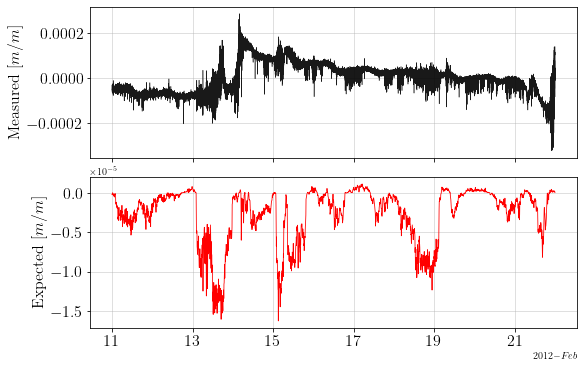

In [36]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(8, 5), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"Expected "
          r"$\displaystyle[m/m]$",
          fontsize=16)
ax2.plot(wdf.index, exp_dndx,color='r', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax1.set_ylabel(r"Measured "
          r"$\displaystyle[m/m]$",
          fontsize=16)
ax1.plot(nm1.index, mes_dndx, c='k', alpha=0.9, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

## Caudal

### NM

In [70]:
#dh/dt

hf = nm1['Depth'].values[3600:]
hi = nm1['Depth'].values[:-3600]
dt = 10

dhdt = (hf-hi)/dt


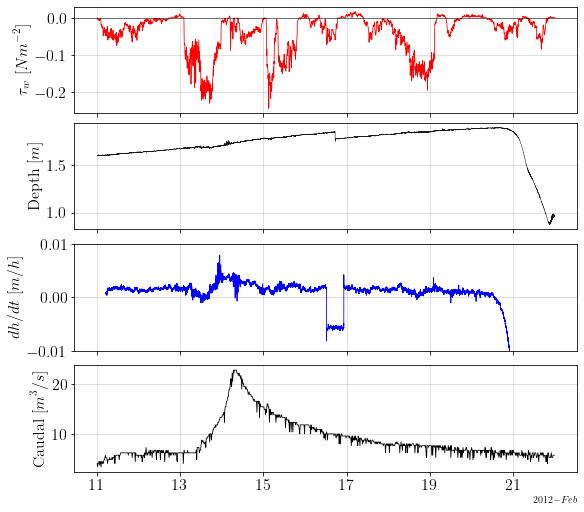

In [71]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax1, ax3, ax10) = plt.subplots(nrows=4, figsize=(8, 7), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax1.set_ylabel(r"Depth "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.9, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$dh/dt$ "
          r"$\displaystyle[m/h]$",
          fontsize=16)
ax3.plot(nm1.index[1800:-1800], dhdt, color='b', lw=0.8)
# ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
ax3.set_ylim(-0.01, 0.01)


ax10.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

### ML

In [68]:
#dh/dt

hf = ml1['Depth'].values[3600:]
hi = ml1['Depth'].values[:-3600]
dt = 10

dhdt = (hf-hi)/dt


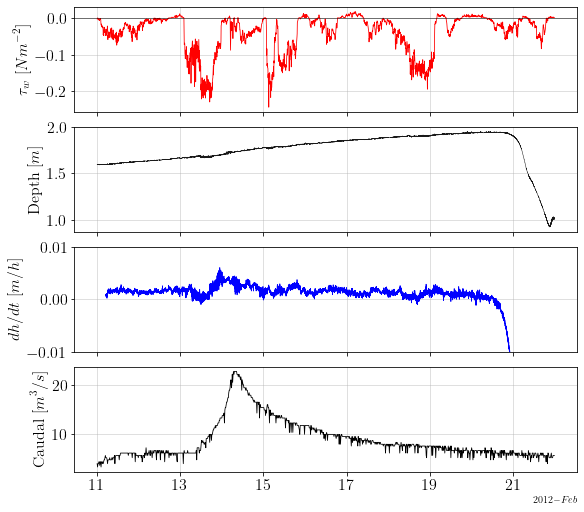

In [69]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax1, ax3, ax10) = plt.subplots(nrows=4, figsize=(8, 7), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax1.set_ylabel(r"Depth "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.9, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$dh/dt$ "
          r"$\displaystyle[m/h]$",
          fontsize=16)
ax3.plot(ml1.index[1800:-1800], dhdt, color='b', lw=0.8)
# ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
ax3.set_ylim(-0.01,0.01)


ax10.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

### DC

In [63]:
#dh/dt

hf = dc1['Depth'].values[3600:]
hi = dc1['Depth'].values[:-3600]
dt = 10

dhdt = (hf-hi)/dt


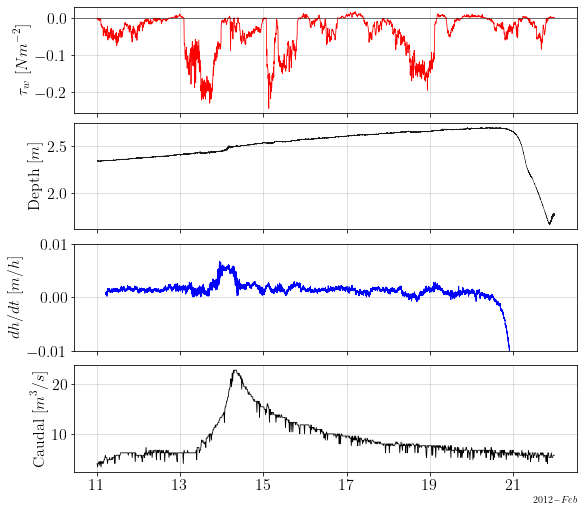

In [65]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax1, ax3, ax10) = plt.subplots(nrows=4, figsize=(8, 7), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax1.set_ylabel(r"Depth "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.9, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$dh/dt$ "
          r"$\displaystyle[m/h]$",
          fontsize=16)
ax3.plot(dc1.index[1800:-1800], dhdt, color='b', lw=0.8)
# ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
ax3.set_ylim(-0.01, 0.01)


ax10.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

### PC

In [66]:
#dh/dt

hf = pc1['Depth'].values[1200:]
hi = pc1['Depth'].values[:-1200]
dt = 10

dhdt = (hf-hi)/dt


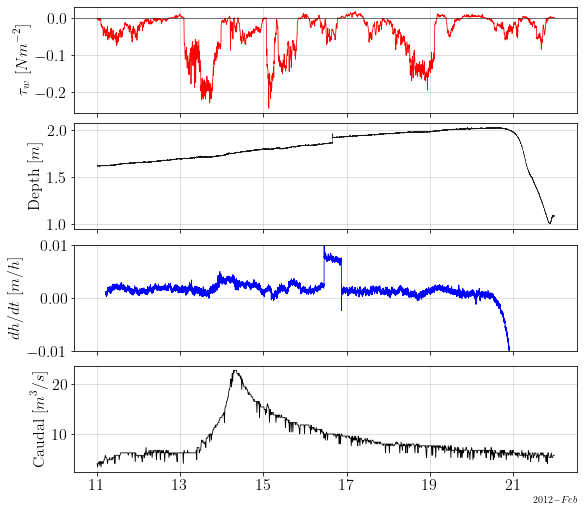

In [67]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax1, ax3, ax10) = plt.subplots(nrows=4, figsize=(8, 7), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax1.set_ylabel(r"Depth "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.plot(pc1.index, pc1['Depth'].values, c='k', alpha=0.9, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$dh/dt$ "
          r"$\displaystyle[m/h]$",
          fontsize=16)
ax3.plot(pc1.index[600:-600], dhdt, color='b', lw=0.8)
# ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
ax3.set_ylim(-0.01, 0.01)


ax10.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

## Density wind-effects

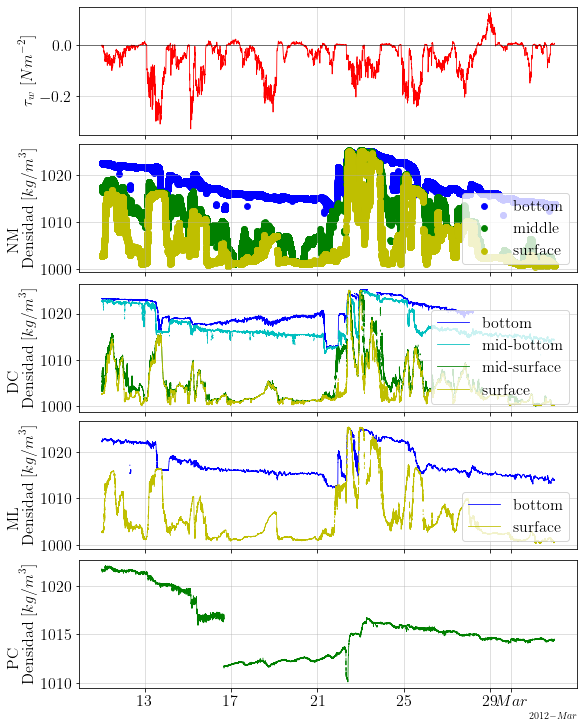

In [38]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax6, ax7, ax8, ax9) = plt.subplots(nrows=5, figsize=(8, 10), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax6.set_ylabel(r"NM\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax6.scatter(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax6.scatter(nm.time, nm.sel(sensor=2, variables='Density'), linewidth=0.8, c="g", label='middle')
ax6.scatter(nm.time, nm.sel(sensor=3, variables='Density'), linewidth=0.8, c="y", label='surface')
ax6.legend(loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

ax7.set_ylabel(r"DC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax7.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax7.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.8, c="c", label='mid-bottom')
ax7.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.8, c="g", label='mid-surface')
ax7.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.8, c="y", label='surface')

ax7.legend(loc='lower right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

ax8.set_ylabel(r"ML\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax8.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax8.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.8, c="y", label='surface')

ax8.legend(loc='lower right',
          fontsize=16);
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.grid(alpha=0.5)

ax9.set_ylabel(r"PC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax9.plot(pc.time, pc.sel(sensor=1, variables='Density'), lw=0.8, c='g')

ax9.xaxis.set_tick_params(labelsize=16)
ax9.yaxis.set_tick_params(labelsize=16)
ax9.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

### NM

#### surface

In [35]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
norm1 = dat1 - np.polyval(p, t) #detrend
# norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

In [50]:
# define some parameters of our wavelet analysis. We select the mother wavelet, in this case the Morlet wavelet with ω0=6.
mother = wavelet.Morlet(6)
dt = 6 #min
s0 = 2 * dt  # Starting scale
dj = 1 / 12  # Twelve sub-octaves per octaves
J = 7 / dj  # Seven powers of two with dj sub-octaves
# alpha, _, _ = wavelet.ar1(dat1)  # Lag-1 autocorrelation for red noise

In [68]:
# continuous wavelet transform density
# Continuous wavelet transform of the signal at specified scales

W, sj, frqs, coi, fft, fftfreqs = wavelet.cwt(dat_norm1, dt, dj=1/12, s0=-1, J=-1, wavelet='morlet', freqs=None)

c:\Users\Dhannai\miniconda3\envs\msc\lib\site-packages\numpy\ma\core.py:2829: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,


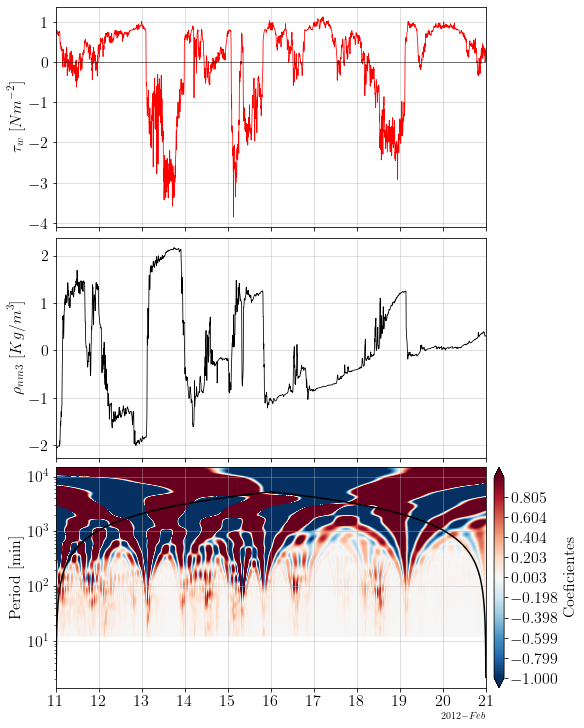

In [72]:
#Ajustar limites colorbar
umin = -1
umax = 1
level_boundaries_u = np.linspace(umin, umax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/frqs,
                         W,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

In [73]:
sig  = dat_norm1
widths = np.arange(1,2000)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

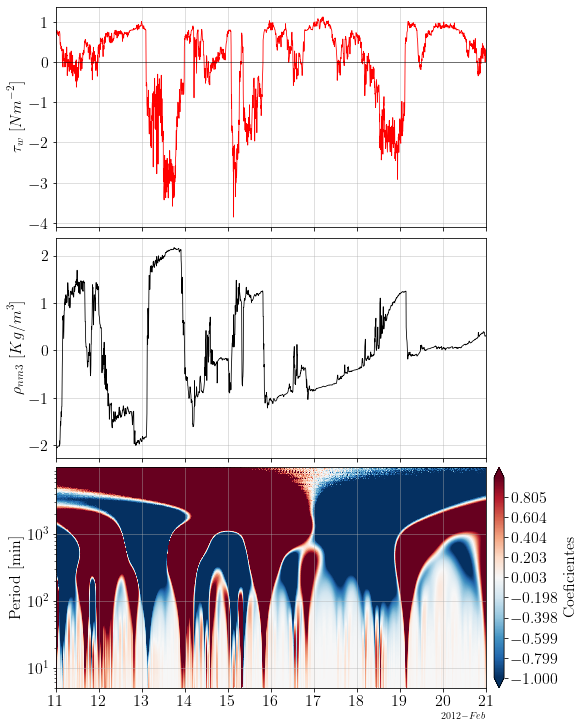

In [74]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

In [75]:
# continuous wavelet transform density
# Continuous wavelet transform of the signal at specified scales

W, sj, frqs, coi, fft, fftfreqs = wavelet.cwt(dat_norm2, dt, dj=1/12, s0=-1, J=-1, wavelet='morlet', freqs=None)

c:\Users\Dhannai\miniconda3\envs\msc\lib\site-packages\numpy\ma\core.py:2829: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,


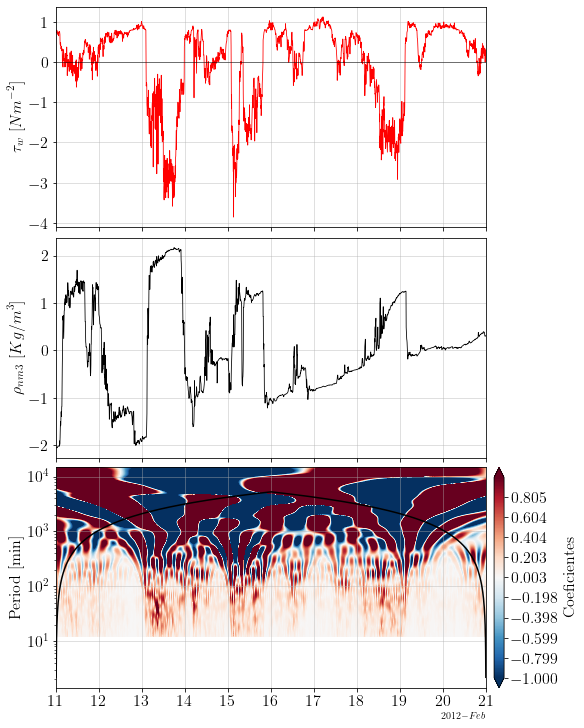

In [76]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/frqs,
                         W,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

In [77]:
sig  = dat_norm2
widths = np.arange(1,2000)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

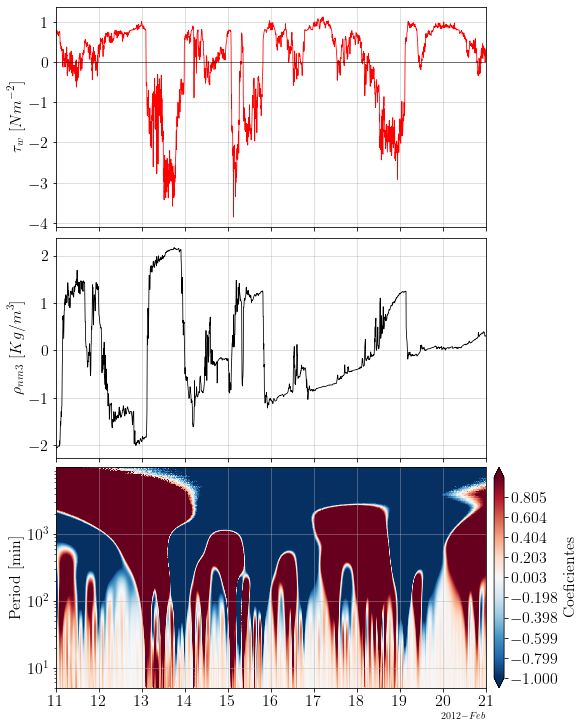

In [78]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

In [82]:
clock.shape


(4801,)

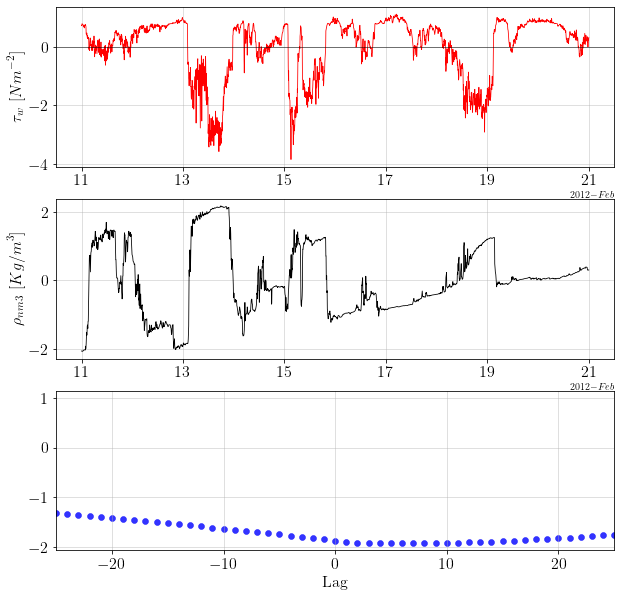

In [40]:
##cross correlation

min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
ax3.set_xlim(-25,25)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [88]:
# Spearman corr

stats.spearmanr(dat_norm1, dat_norm2)

SpearmanrResult(correlation=-0.6803156272054273, pvalue=0.0)

In [90]:
# cross wavelet transform of two signals 
# The XWT finds regions in time frequency space where the time series show high common power.

xwt, coi, freqs, signif = wavelet.xwt(dat_norm1, dat_norm2, dt, dj, s0, J, 0.95, 'morlet', True)


c:\Users\Dhannai\miniconda3\envs\msc\lib\site-packages\numpy\ma\core.py:2829: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,


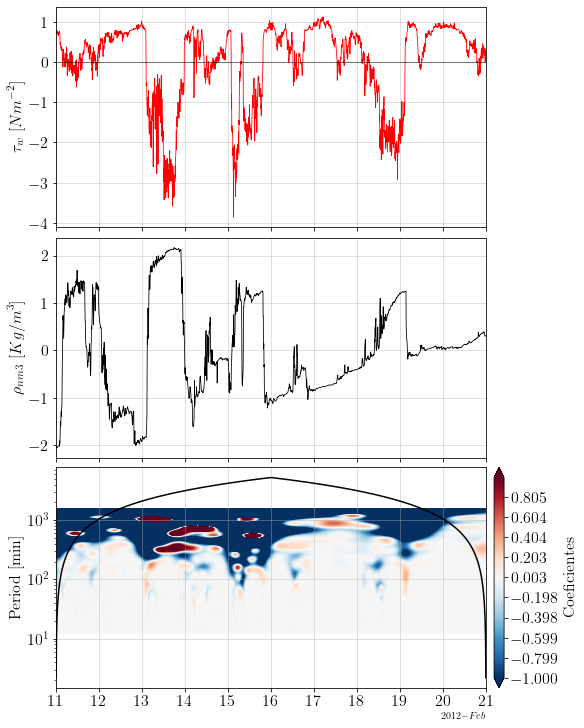

In [91]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freqs,
                         xwt,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


In [92]:
#  The WCT finds regions in time frequency space where the two time series co-vary, but do not necessarily have high power.
# phase angle awct

wct, awct, coi, freq, sig = wavelet.wct(dat_norm1, dat_norm2, dt, dj, s0, int(J), 0.95)

Calculating wavelet coherence significance


100%|██████████| 300/300 [04:14<00:00,  1.18it/s]


In [41]:
#promedio del angulo de fase en rad
# Como lo transformo a minutos??
awct.mean()

0.6530442467756644

In [43]:
# desv estandar del angulo de fase en rad
awct.std()

2.0126186072502756

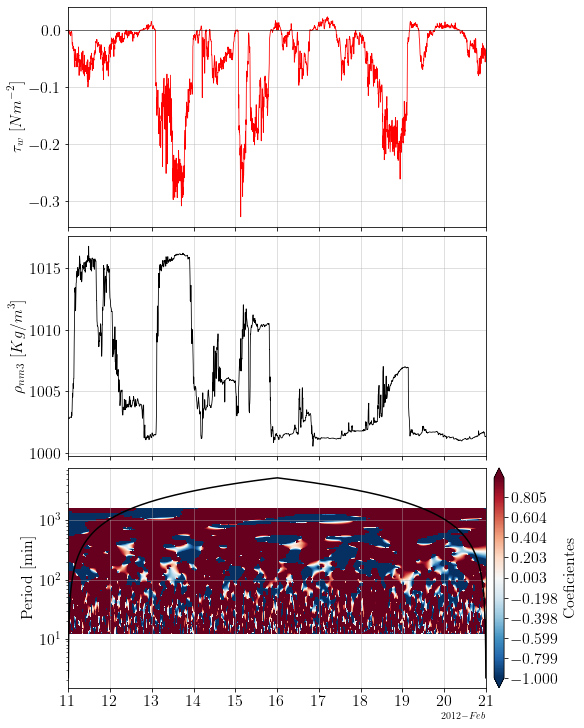

In [93]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freq,
                         awct,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


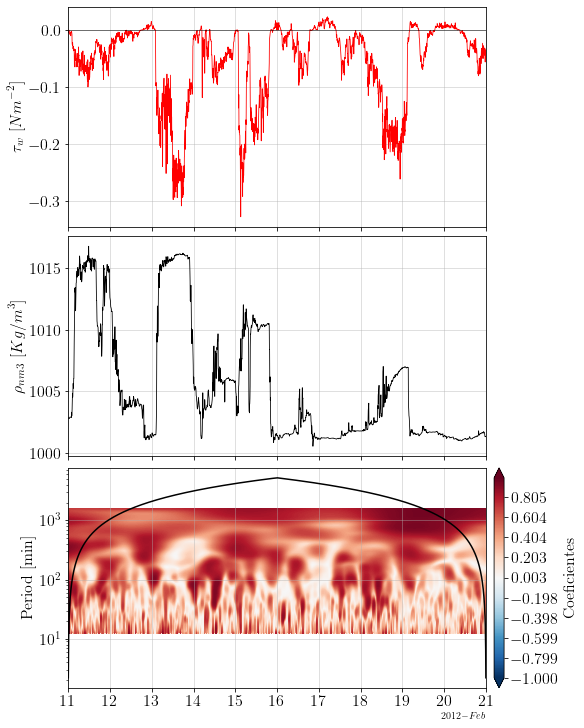

In [94]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freq,
                         wct,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


#### bottom

In [38]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
norm1 = dat1 - np.polyval(p, t) #detrend
# norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

In [39]:
# define some parameters of our wavelet analysis. We select the mother wavelet, in this case the Morlet wavelet with ω0=6.
mother = wavelet.Morlet(6)
dt = 6 #min
s0 = 2 * dt  # Starting scale
dj = 1 / 12  # Twelve sub-octaves per octaves
J = 7 / dj  # Seven powers of two with dj sub-octaves
# alpha, _, _ = wavelet.ar1(dat1)  # Lag-1 autocorrelation for red noise

In [40]:
# cross wavelet transform of two signals 
# The XWT finds regions in time frequency space where the time series show high common power.

xwt, coi, freqs, signif = wavelet.xwt(dat_norm1, dat_norm2, dt, dj, s0, J, 0.95, 'morlet', True)


C:\Users\Dhannai\miniconda3\envs\msc\lib\site-packages\numpy\ma\core.py:2829: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,


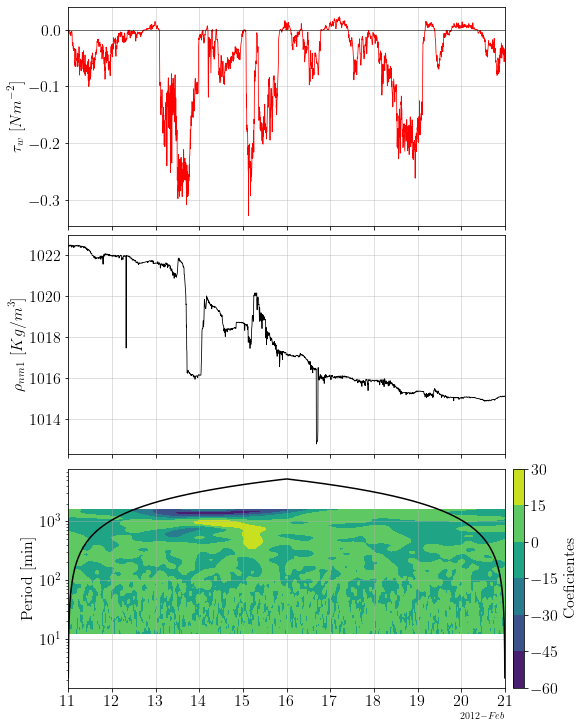

In [55]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freqs,
                         xwt
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


In [48]:
#  The WCT finds regions in time frequency space where the two time series co-vary, but do not necessarily have high power.
# phase angle awct

wct, awct, coi, freq, sig = wavelet.wct(dat_norm1, dat_norm2, dt, dj, s0, int(J), 0.95)

Calculating wavelet coherence significance


100%|██████████| 300/300 [04:13<00:00,  1.19it/s]


In [53]:
#promedio del angulo de fase en rad
# Como lo transformo a minutos??
awct.mean()

-0.17512858449013594

In [54]:
# desv estandar del angulo de fase en rad
awct.std()

1.755898626611908

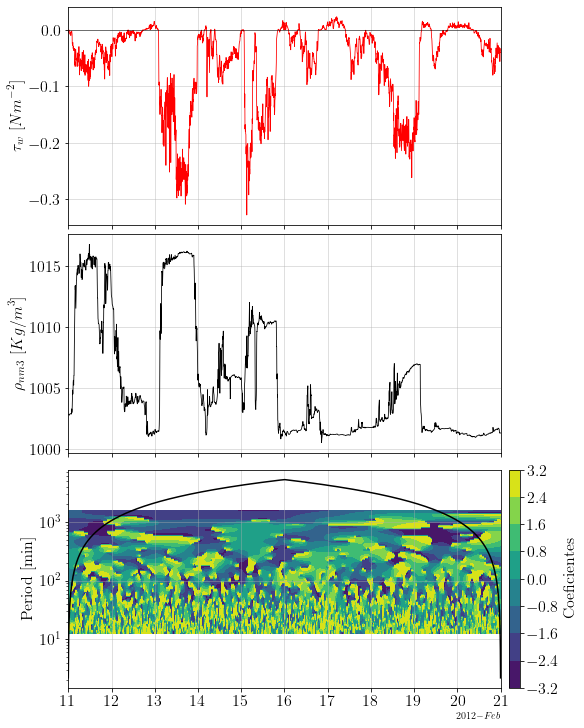

In [51]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freq,
                         awct
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


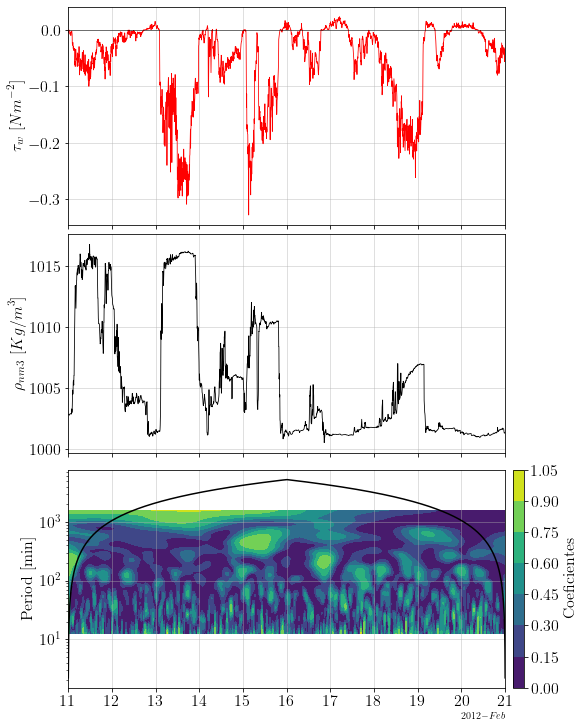

In [52]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freq,
                         wct
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


### DC

#### surface

In [35]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')

# Standardize and detrend/normalize

dat1 = dc.sel(time=min6_6, sensor=4, variables='Density').interpolate_na(dim="time", method="nearest")
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
norm1 = dat1 - np.polyval(p, t) #detrend

# norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset

# dat_norm1 = standardize(dat_norm1)
# dat_norm1 = standardize(dat_norm1)
# dat_norm1 = standardize(dat_norm1)
dat_norm2 = norm2 / std2  # Standardized dataset

In [36]:
# define some parameters of our wavelet analysis. We select the mother wavelet, in this case the Morlet wavelet with ω0=6.
mother = wavelet.Morlet(6)
dt = 6 #min
s0 = 2 * dt  # Starting scale
dj = 1 / 12  # Twelve sub-octaves per octaves
J = 7 / dj  # Seven powers of two with dj sub-octaves
# alpha, _, _ = wavelet.ar1(dat1)  # Lag-1 autocorrelation for red noise

In [37]:
# cross wavelet transform of two signals 
# The XWT finds regions in time frequency space where the time series show high common power.

xwt, coi, freqs, signif = wavelet.xwt(dat_norm1, dat_norm2, dt, dj, s0, J, 0.95, 'morlet', True)


C:\Users\Dhannai\miniconda3\envs\msc\lib\site-packages\pycwt\helpers.py:95: UserWarning: Cannot place an upperbound on the unbiased AR(1). Series is too short or trend is to large.
  warnings.warn('Cannot place an upperbound on the unbiased AR(1). '


UnboundLocalError: local variable 'g' referenced before assignment

C:\Users\Dhannai\miniconda3\envs\msc\lib\site-packages\numpy\ma\core.py:2829: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,


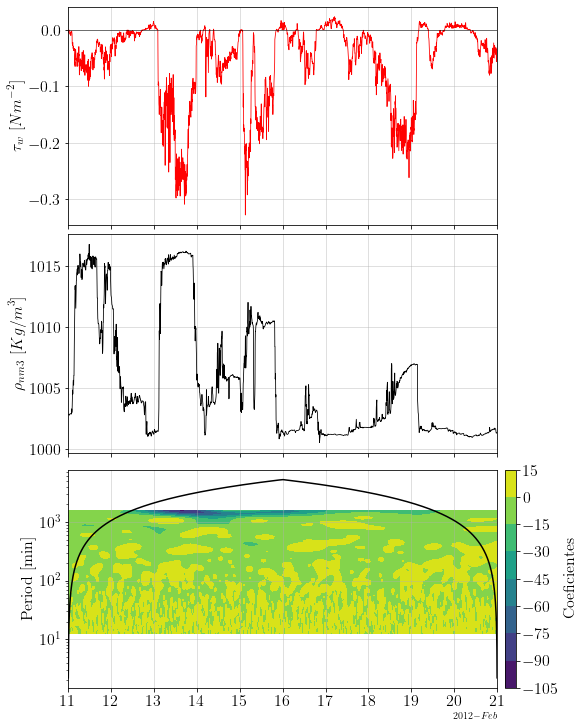

In [ ]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freqs,
                         xwt
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


In [ ]:
#  The WCT finds regions in time frequency space where the two time series co-vary, but do not necessarily have high power.
# phase angle awct

wct, awct, coi, freq, sig = wavelet.wct(dat_norm1, dat_norm2, dt, dj, s0, int(J), 0.95)

Calculating wavelet coherence significance


100%|██████████| 300/300 [04:09<00:00,  1.20it/s]


In [ ]:
#promedio del angulo de fase en rad
# Como lo transformo a minutos??
awct.mean()

0.6530442467756644

In [ ]:
# desv estandar del angulo de fase en rad
awct.std()

2.0126186072502756

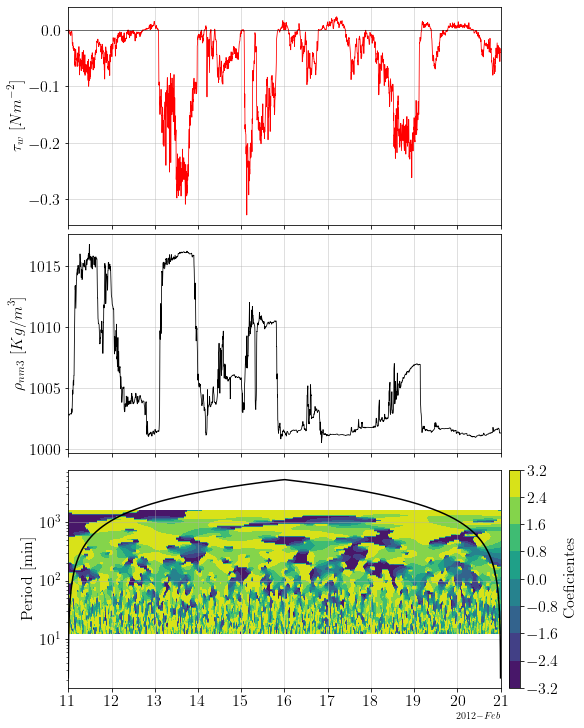

In [ ]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freq,
                         awct
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


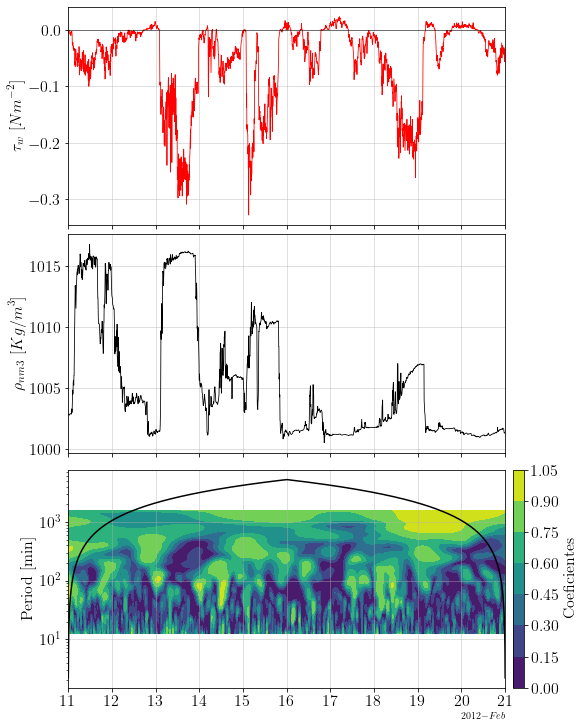

In [ ]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freq,
                         wct
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


#### bottom

In [41]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')

# Standardize and detrend/normalize

dat1 = dc.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
norm1 = dat1 - np.polyval(p, t) #detrend
# norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

In [42]:
# define some parameters of our wavelet analysis. We select the mother wavelet, in this case the Morlet wavelet with ω0=6.
mother = wavelet.Morlet(6)
dt = 6 #min
s0 = 2 * dt  # Starting scale
dj = 1 / 12  # Twelve sub-octaves per octaves
J = 7 / dj  # Seven powers of two with dj sub-octaves
# alpha, _, _ = wavelet.ar1(dat1)  # Lag-1 autocorrelation for red noise

In [43]:
# cross wavelet transform of two signals 
# The XWT finds regions in time frequency space where the time series show high common power.

xwt, coi, freqs, signif = wavelet.xwt(dat_norm1, dat_norm2, dt, dj, s0, J, 0.95, 'morlet', True)


C:\Users\Dhannai\miniconda3\envs\msc\lib\site-packages\numpy\ma\core.py:2829: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,


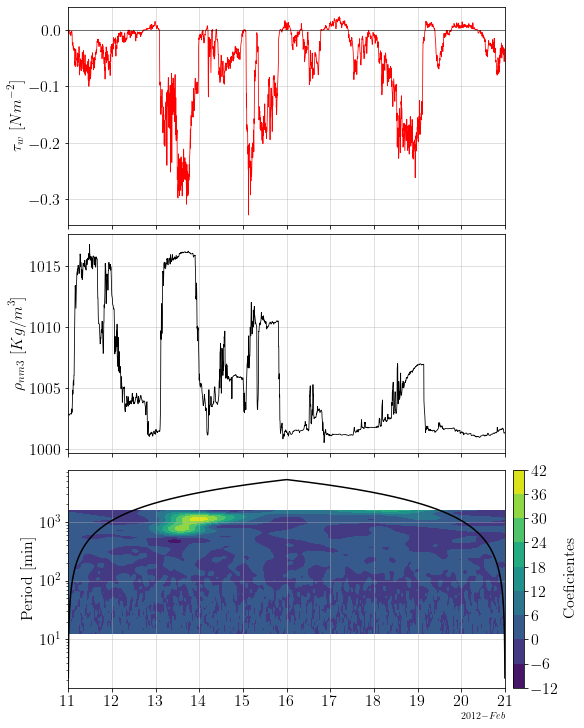

In [44]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freqs,
                         xwt
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


In [45]:
#  The WCT finds regions in time frequency space where the two time series co-vary, but do not necessarily have high power.
# phase angle awct

wct, awct, coi, freq, sig = wavelet.wct(dat_norm1, dat_norm2, dt, dj, s0, int(J), 0.95)

Calculating wavelet coherence significance


100%|██████████| 300/300 [04:10<00:00,  1.20it/s]


In [46]:
#promedio del angulo de fase en rad
# Como lo transformo a minutos??
awct.mean()

-0.0907848545698831

In [47]:
# desv estandar del angulo de fase en rad
awct.std()

1.7754254122167408

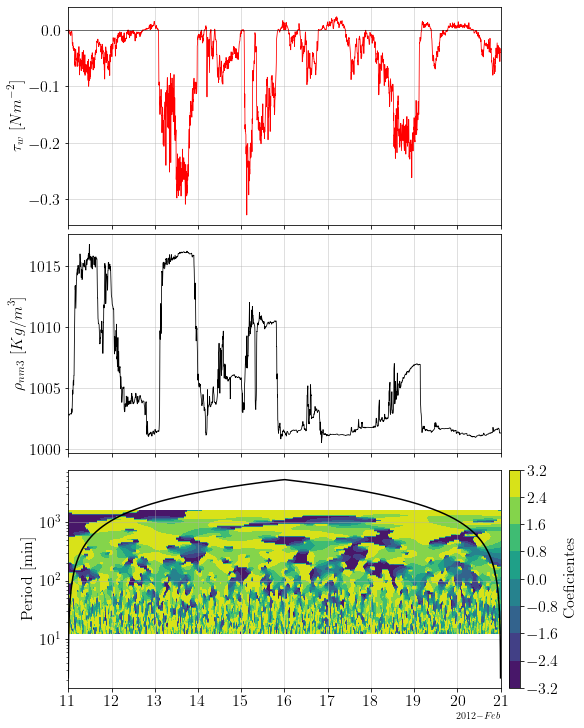

In [ ]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freq,
                         awct
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


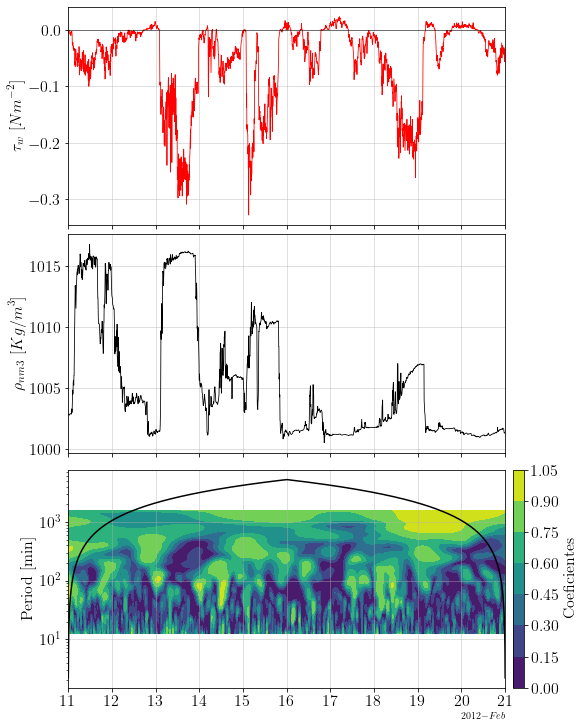

In [ ]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freq,
                         wct
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


### ML

#### surface

In [49]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')

# Standardize and detrend/normalize

dat1 = ml.sel(time=min6_6, sensor=2, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
norm1 = dat1 - np.polyval(p, t) #detrend
# norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

In [50]:
# define some parameters of our wavelet analysis. We select the mother wavelet, in this case the Morlet wavelet with ω0=6.
mother = wavelet.Morlet(6)
dt = 6 #min
s0 = 2 * dt  # Starting scale
dj = 1 / 12  # Twelve sub-octaves per octaves
J = 7 / dj  # Seven powers of two with dj sub-octaves
# alpha, _, _ = wavelet.ar1(dat1)  # Lag-1 autocorrelation for red noise

In [51]:
# cross wavelet transform of two signals 
# The XWT finds regions in time frequency space where the time series show high common power.

xwt, coi, freqs, signif = wavelet.xwt(dat_norm1, dat_norm2, dt, dj, s0, J, 0.95, 'morlet', True)


C:\Users\Dhannai\miniconda3\envs\msc\lib\site-packages\numpy\ma\core.py:2829: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,


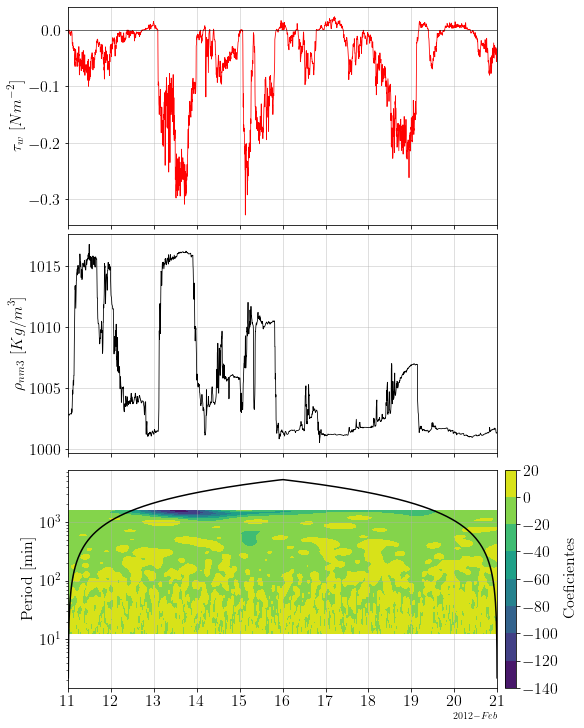

In [52]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freqs,
                         xwt
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


In [53]:
#  The WCT finds regions in time frequency space where the two time series co-vary, but do not necessarily have high power.
# phase angle awct

wct, awct, coi, freq, sig = wavelet.wct(dat_norm1, dat_norm2, dt, dj, s0, int(J), 0.95)

Calculating wavelet coherence significance


100%|██████████| 300/300 [04:11<00:00,  1.19it/s]


In [54]:
#promedio del angulo de fase en rad
# Como lo transformo a minutos??
awct.mean()

0.5057692751690146

In [55]:
# desv estandar del angulo de fase en rad
awct.std()

2.041013594916557

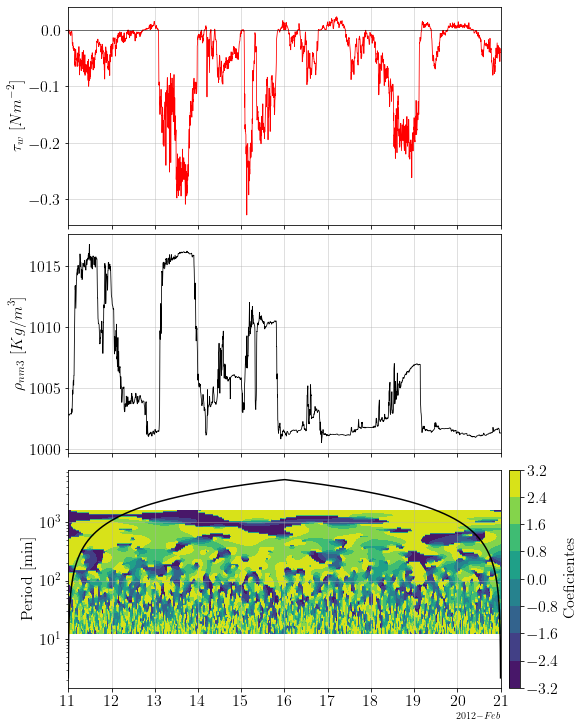

In [56]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freq,
                         awct
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


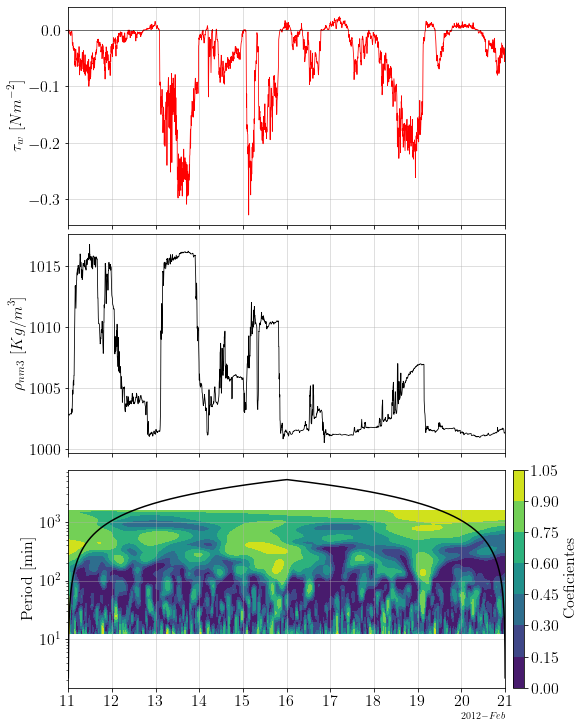

In [57]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freq,
                         wct
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


#### bottom

In [58]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')

# Standardize and detrend/normalize

dat1 = ml.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
norm1 = dat1 - np.polyval(p, t) #detrend
# norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

In [59]:
# define some parameters of our wavelet analysis. We select the mother wavelet, in this case the Morlet wavelet with ω0=6.
mother = wavelet.Morlet(6)
dt = 6 #min
s0 = 2 * dt  # Starting scale
dj = 1 / 12  # Twelve sub-octaves per octaves
J = 7 / dj  # Seven powers of two with dj sub-octaves
# alpha, _, _ = wavelet.ar1(dat1)  # Lag-1 autocorrelation for red noise

In [60]:
# cross wavelet transform of two signals 
# The XWT finds regions in time frequency space where the time series show high common power.

xwt, coi, freqs, signif = wavelet.xwt(dat_norm1, dat_norm2, dt, dj, s0, J, 0.95, 'morlet', True)


C:\Users\Dhannai\miniconda3\envs\msc\lib\site-packages\numpy\ma\core.py:2829: ComplexWarning: Casting complex values to real discards the imaginary part
  _data = np.array(data, dtype=dtype, copy=copy,


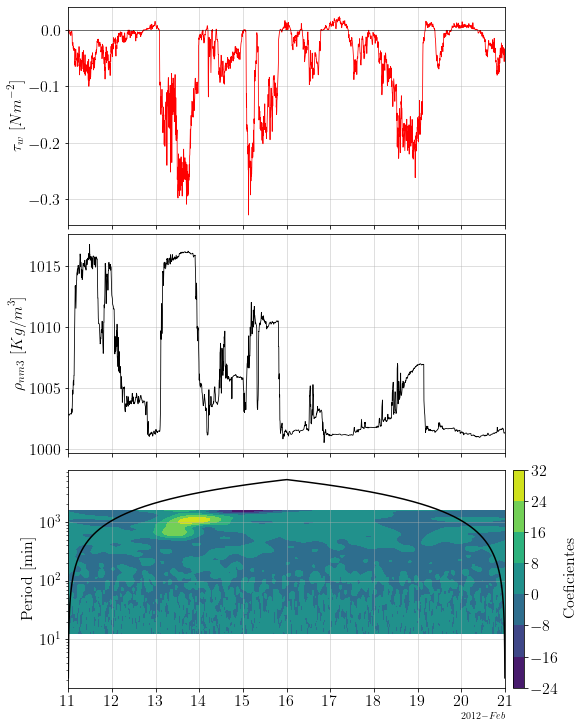

In [61]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freqs,
                         xwt
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


In [62]:
#  The WCT finds regions in time frequency space where the two time series co-vary, but do not necessarily have high power.
# phase angle awct

wct, awct, coi, freq, sig = wavelet.wct(dat_norm1, dat_norm2, dt, dj, s0, int(J), 0.95)

Calculating wavelet coherence significance


100%|██████████| 300/300 [04:11<00:00,  1.19it/s]


In [63]:
#promedio del angulo de fase en rad
# Como lo transformo a minutos??
awct.mean()

-0.15835413869736695

In [64]:
# desv estandar del angulo de fase en rad
awct.std()

1.880437155781657

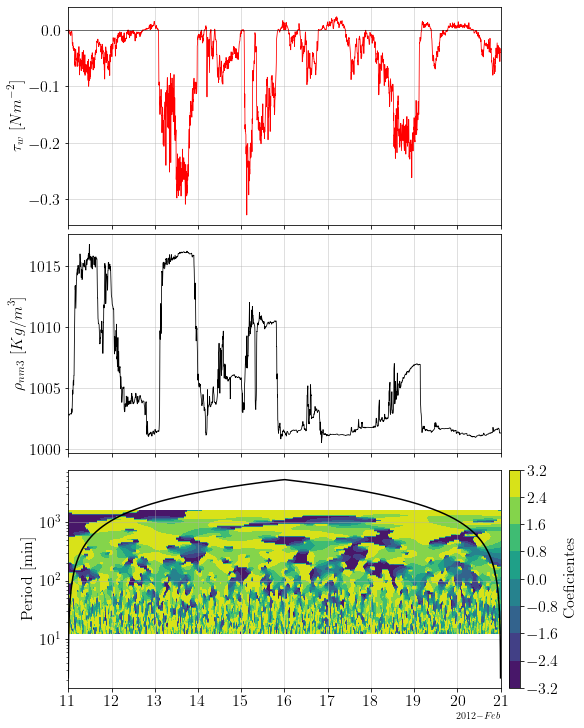

In [ ]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freq,
                         awct
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


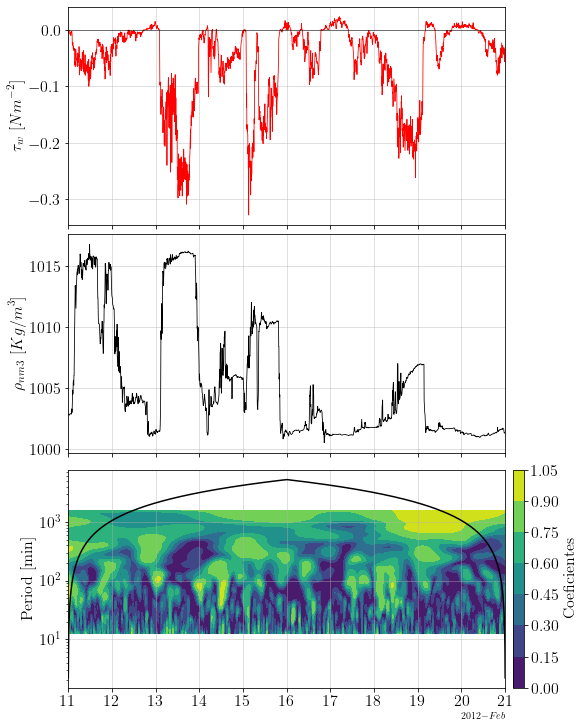

In [ ]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax8) = plt.subplots(nrows=3, figsize=(8, 10), constrained_layout=True, sharex=True)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"),color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


contourf_ = ax8.contourf(min6_6, 1/freq,
                         wct
                        #  levels=level_boundaries_u,
                        #  cmap=cm.RdBu_r,
                        #  vmax=umax, vmin=umin, extend='both'
                        )
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Period [min] ",
          fontsize=16)
ax8.grid(alpha=0.5)
ax8.plot(min6_6, coi, color='k')
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)


## Density wind-effects este si

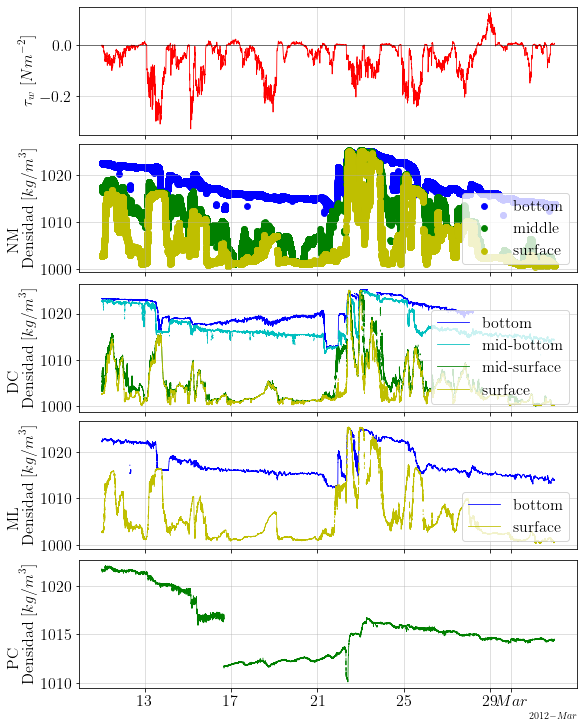

In [ ]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax6, ax7, ax8, ax9) = plt.subplots(nrows=5, figsize=(8, 10), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax6.set_ylabel(r"NM\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax6.scatter(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax6.scatter(nm.time, nm.sel(sensor=2, variables='Density'), linewidth=0.8, c="g", label='middle')
ax6.scatter(nm.time, nm.sel(sensor=3, variables='Density'), linewidth=0.8, c="y", label='surface')
ax6.legend(loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

ax7.set_ylabel(r"DC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax7.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax7.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.8, c="c", label='mid-bottom')
ax7.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.8, c="g", label='mid-surface')
ax7.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.8, c="y", label='surface')

ax7.legend(loc='lower right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

ax8.set_ylabel(r"ML\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax8.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax8.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.8, c="y", label='surface')

ax8.legend(loc='lower right',
          fontsize=16);
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.grid(alpha=0.5)

ax9.set_ylabel(r"PC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax9.plot(pc.time, pc.sel(sensor=1, variables='Density'), lw=0.8, c='g')

ax9.xaxis.set_tick_params(labelsize=16)
ax9.yaxis.set_tick_params(labelsize=16)
ax9.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

### NM

#### surface

In [35]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
nm = NM_CTD.sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).v

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

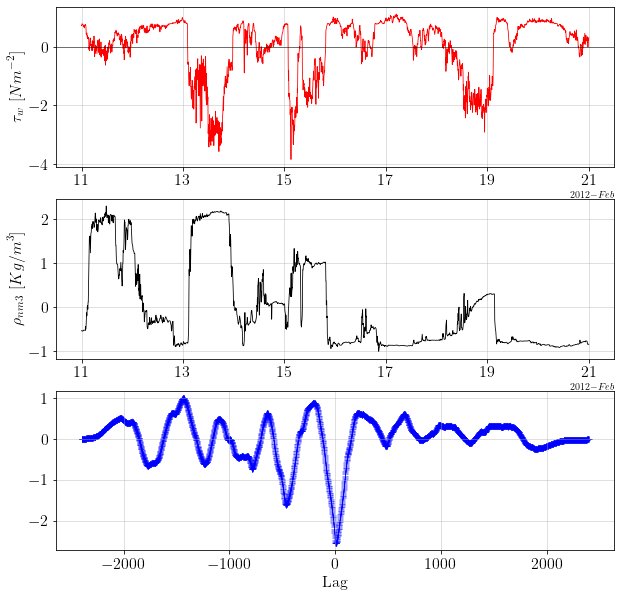

In [36]:
##cross correlation

min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [37]:
print(str(lag)+" min")

36 min


In [38]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,14,4,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,14,4,0,0)]
nm = NM_CTD.sel(time=slice("2012-02-13 00:00:00","2012-02-14 04:00:00")).v

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

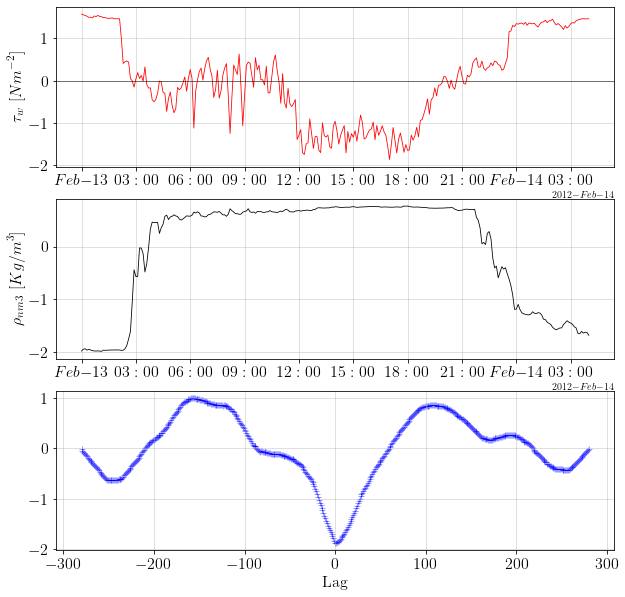

In [39]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [40]:
print(str(lag)+" min")

0 min


In [41]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,13,12,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,13,12,0,0)]
nm = NM_CTD.sel(time=slice("2012-02-13 00:00:00","2012-02-13 12:00:00")).v

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

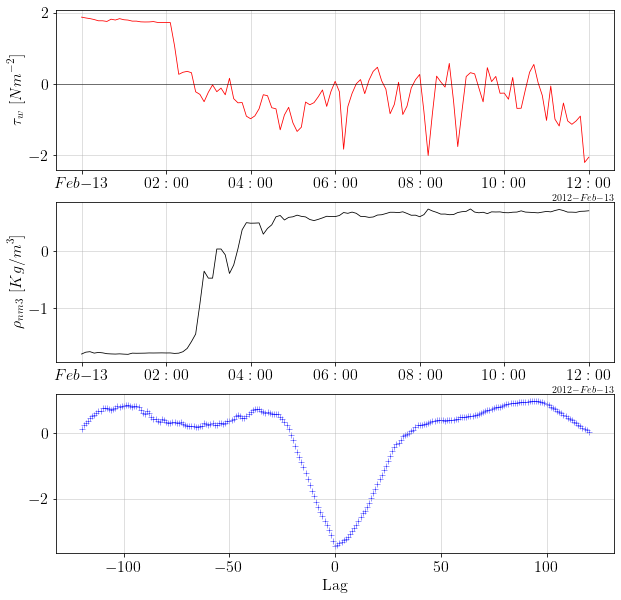

In [42]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [43]:
print(str(lag)+" min")

0 min


In [44]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,16,0,0), end=datetime.datetime(2012,2,14,4,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,16,0,0):datetime.datetime(2012,2,14,4,0,0)]
nm = NM_CTD.sel(time=slice("2012-02-13 16:00:00","2012-02-14 4:00:00")).v

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

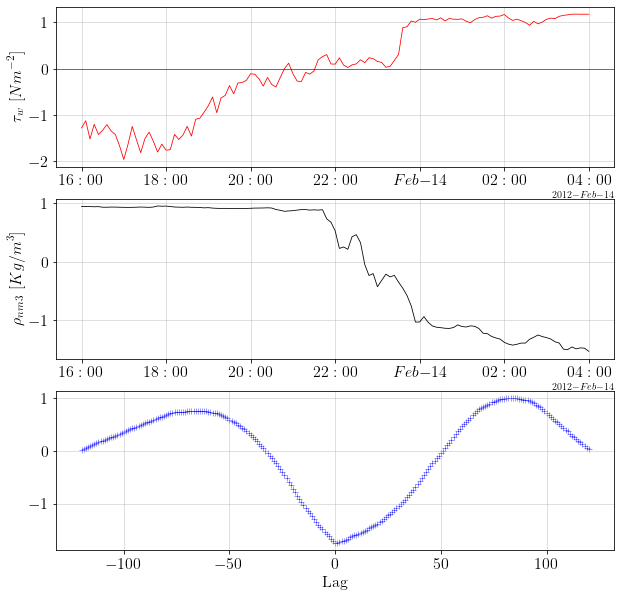

In [45]:
##cross correlation

min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [46]:
print(str(lag)+" min")

0 min


#### middle

In [54]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
nm = NM_CTD.sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).v.interpolate_na(dim="time", method="nearest")

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=2, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

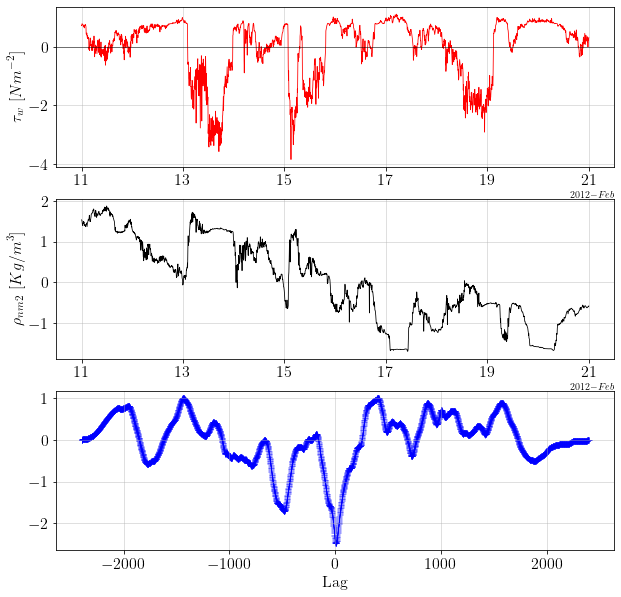

In [55]:
##cross correlation

min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm2}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [56]:
print(str(lag)+" min")

18 min


In [58]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,14,4,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,14,4,0,0)]
nm = NM_CTD.sel(time=slice("2012-02-13 00:00:00","2012-02-14 04:00:00")).v.interpolate_na(dim="time", method="nearest")

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=2, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
# p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

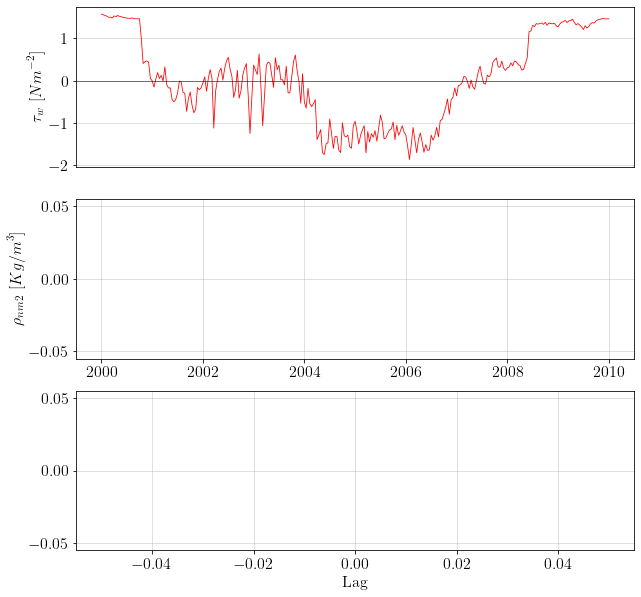

In [59]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm2}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [ ]:
print(str(lag)+" min")

0 min


In [ ]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,13,12,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,13,12,0,0)]
nm = NM_CTD.sel(time=slice("2012-02-13 00:00:00","2012-02-13 12:00:00")).v

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

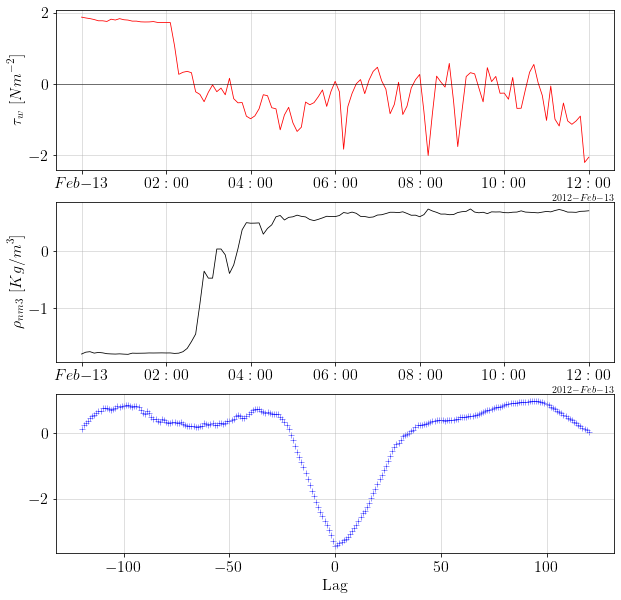

In [ ]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [ ]:
print(str(lag)+" min")

0 min


In [ ]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,16,0,0), end=datetime.datetime(2012,2,14,4,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,16,0,0):datetime.datetime(2012,2,14,4,0,0)]
nm = NM_CTD.sel(time=slice("2012-02-13 16:00:00","2012-02-14 4:00:00")).v

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=3, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

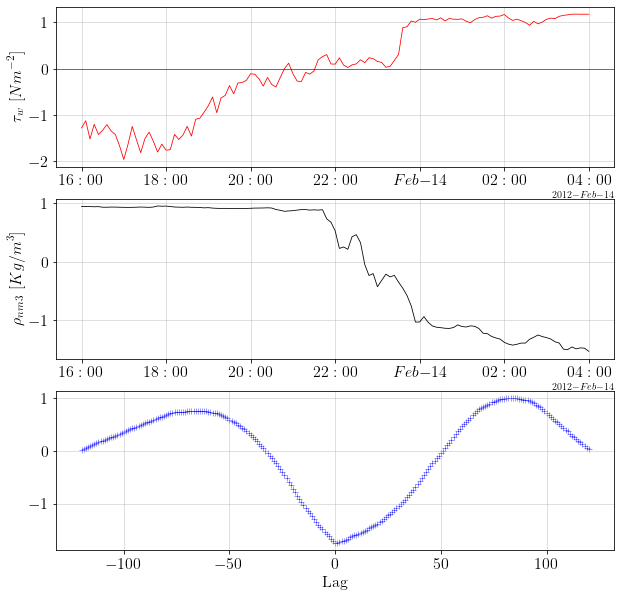

In [ ]:
##cross correlation

min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm3}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [ ]:
print(str(lag)+" min")

0 min


#### bottom

In [50]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
nm = NM_CTD.sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).v

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
norm1 = dat1 - np.polyval(p, t) #detrend
# norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

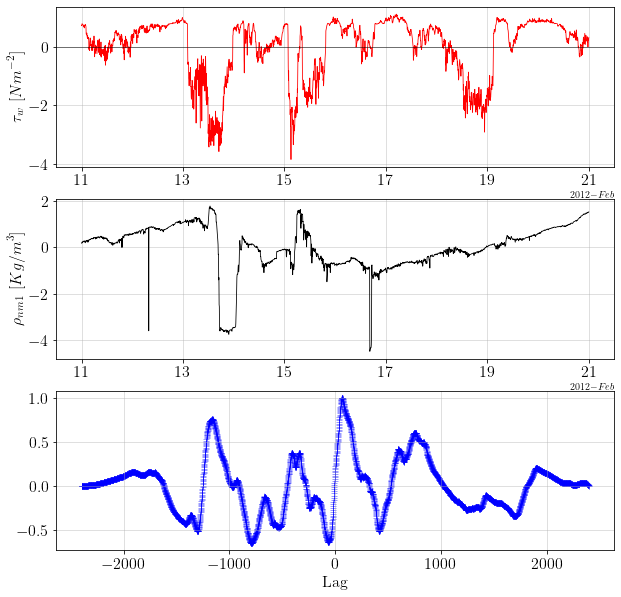

In [51]:
##cross correlation

corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [52]:
print(str(lag)+" min")

384 min


In [136]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,14,7,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,14,7,0,0)]
nm = NM_CTD.sel(time=slice("2012-02-13 00:00:00","2012-02-14 07:00:00")).v

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

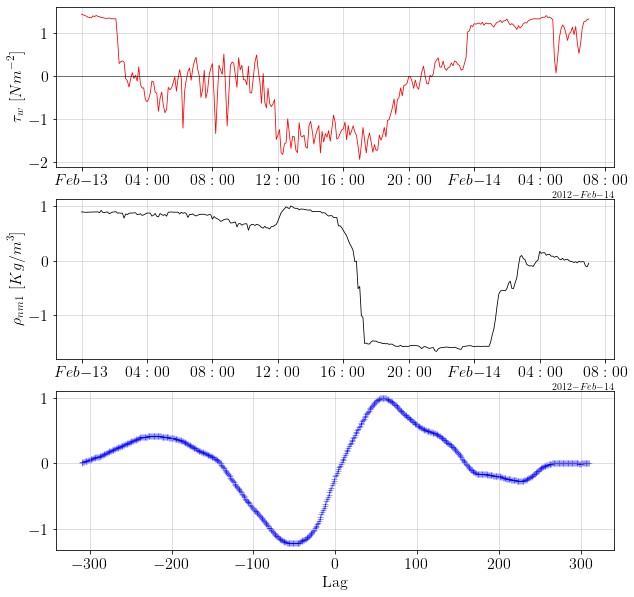

In [137]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(corr)]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [138]:
print(str(lag)+" min")

354 min


In [44]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,13,18,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,13,18,0,0)]
nm = NM_CTD.sel(time=slice("2012-02-13 00:00:00","2012-02-13 18:00:00")).v

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

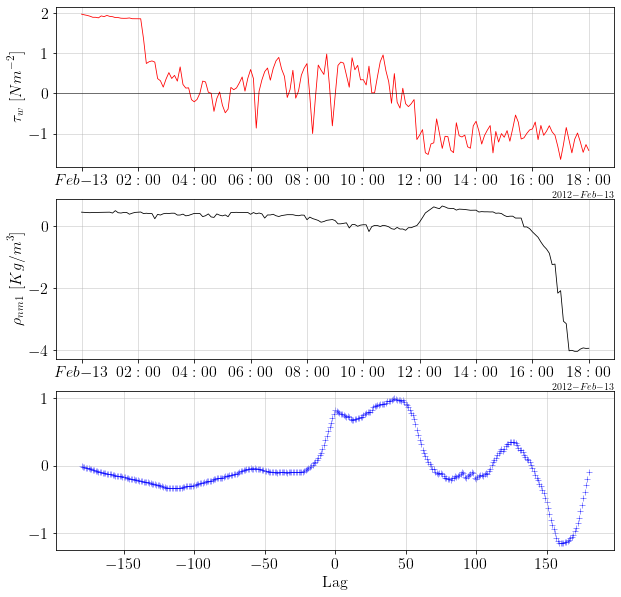

In [45]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(corr)]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [46]:
print(str(lag)+" min")

252 min


In [65]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,18,0,0), end=datetime.datetime(2012,2,14,7,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,18,0,0):datetime.datetime(2012,2,14,7,0,0)]
nm = NM_CTD.sel(time=slice("2012-02-13 18:00:00","2012-02-14 7:00:00")).v

# Standardize and detrend/normalize

dat1 = nm.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

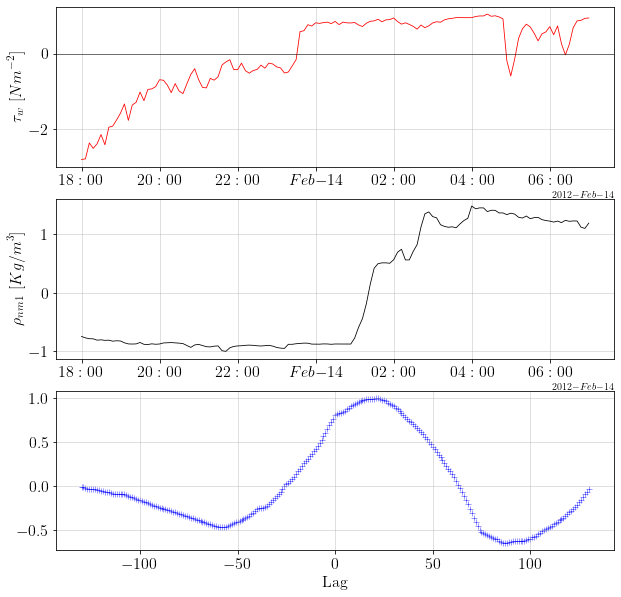

In [66]:
##cross correlation

min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{nm1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [67]:
print(str(lag)+" min")

132 min


### DC

#### surface

In [68]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).v

# Standardize and detrend/normalize

dat1 = dc.sel(time=min6_6, sensor=4, variables='Density').values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

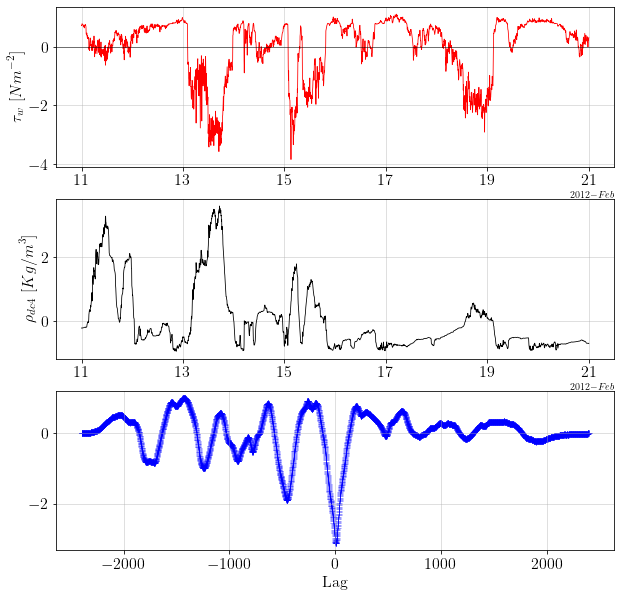

In [69]:
##cross correlation

corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{dc4}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [70]:
print(str(lag)+" min")

30 min


In [71]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,14,4,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,14,4,0,0)]
dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-13 00:00:00","2012-02-14 04:00:00")).v

# Standardize and detrend/normalize

dat1 = dc.sel(time=min6_6, sensor=4, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

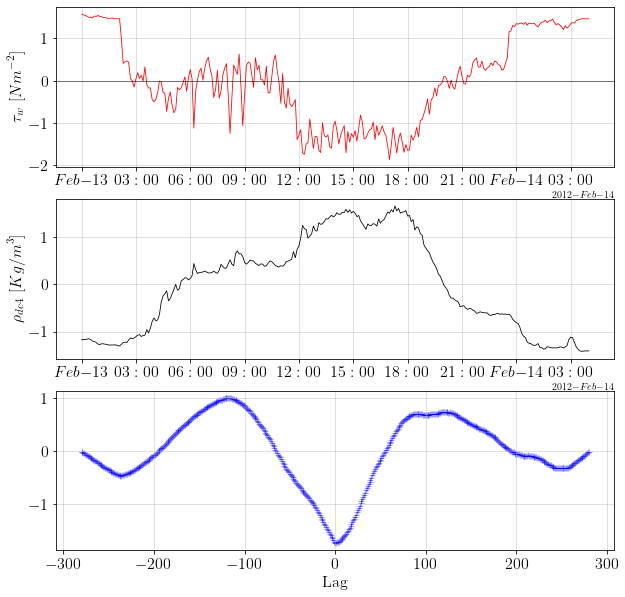

In [72]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{dc4}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [73]:
print(str(lag)+" min")

0 min


In [74]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,13,12,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,13,12,0,0)]
dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-13 00:00:00","2012-02-13 12:00:00")).v

# Standardize and detrend/normalize

dat1 = dc.sel(time=min6_6, sensor=4, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

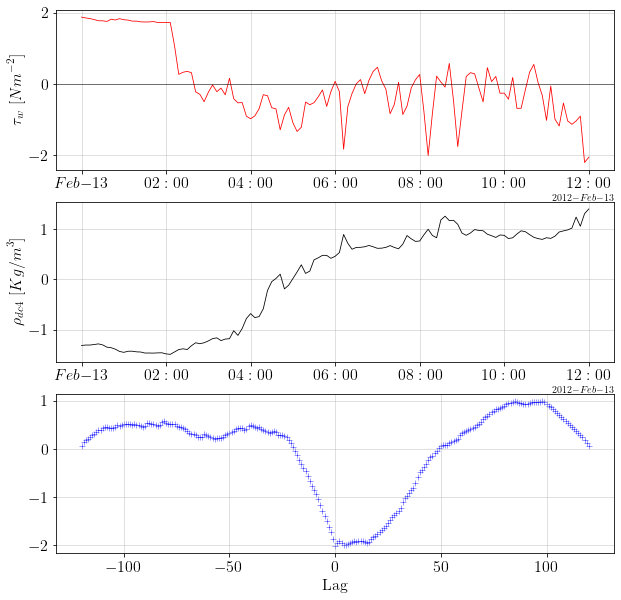

In [75]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{dc4}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [76]:
print(str(lag)+" min")

0 min


In [77]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,16,0,0), end=datetime.datetime(2012,2,14,4,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,16,0,0):datetime.datetime(2012,2,14,4,0,0)]
dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-13 16:00:00","2012-02-14 4:00:00")).v

# Standardize and detrend/normalize

dat1 = dc.sel(time=min6_6, sensor=4, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

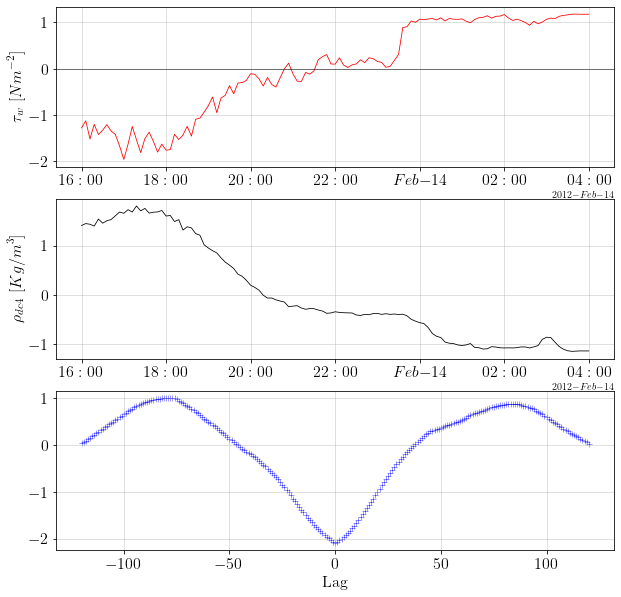

In [78]:
##cross correlation

corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{dc4}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [79]:
print(str(lag)+" min")

0 min


#### bottom

In [133]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).v

# Standardize and detrend/normalize

dat1 = dc.sel(time=min6_6, sensor=1, variables='Density').values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

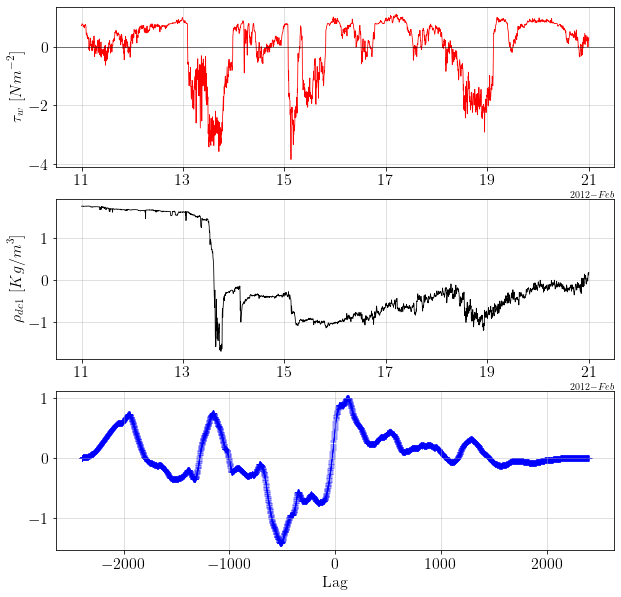

In [134]:
##cross correlation

corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(corr)]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{dc1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [135]:
print(str(lag)+" min")

732 min


In [130]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,14,4,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,14,4,0,0)]
dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-13 00:00:00","2012-02-14 04:00:00")).v
lag = lags[np.argmax(abs(corr))]*6

# Standardize and detrend/normalize

dat1 = dc.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

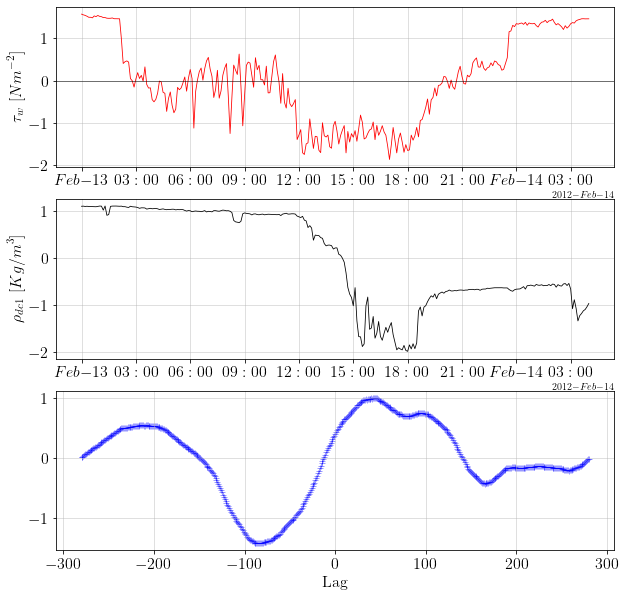

In [131]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(corr)]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{dc1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [132]:
print(str(lag)+" min")

258 min


In [89]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,13,18,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,13,18,0,0)]
dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-13 00:00:00","2012-02-13 18:00:00")).v

# Standardize and detrend/normalize

dat1 = dc.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

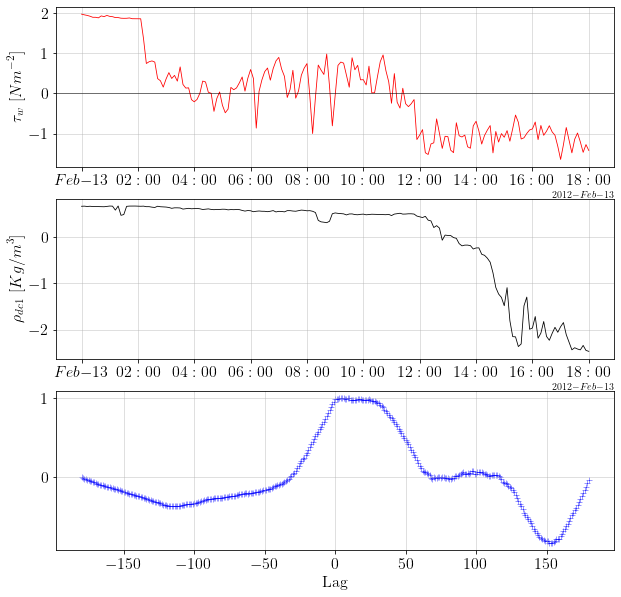

In [90]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{dc1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [91]:
print(str(lag)+" min")

36 min


In [40]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,17,0,0), end=datetime.datetime(2012,2,14,2,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,17,0,0):datetime.datetime(2012,2,14,2,0,0)]
dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-13 17:00:00","2012-02-14 2:00:00")).v

# Standardize and detrend/normalize

dat1 = dc.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

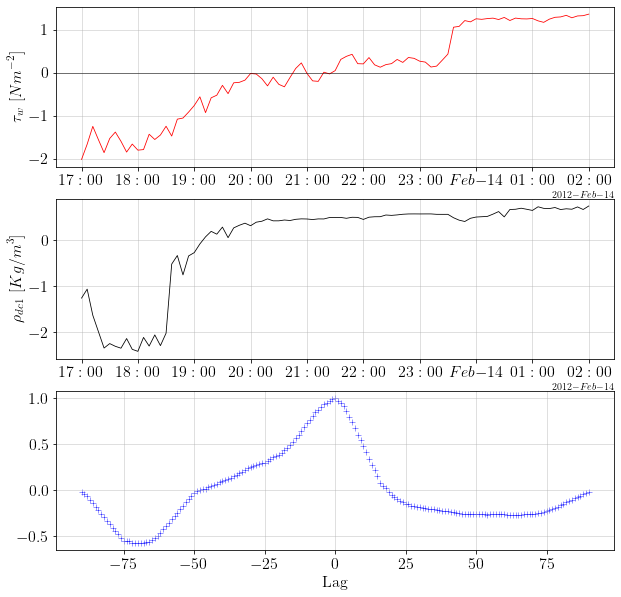

In [41]:
##cross correlation

corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{dc1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [43]:
print(str(lag)+" min")

0 min


### ML

#### surface

In [97]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
ml = ML_CTD.sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).v

# Standardize and detrend/normalize

dat1 = ml.sel(time=min6_6, sensor=2, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

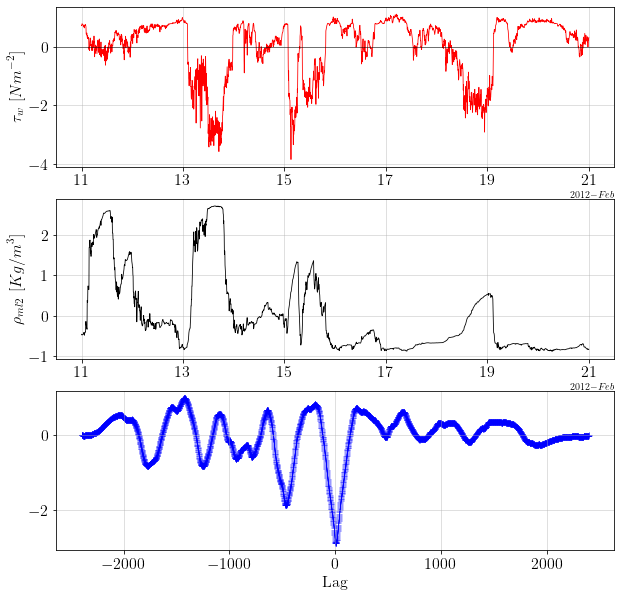

In [98]:
##cross correlation

corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{ml2}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [99]:
print(str(lag)+" min")

24 min


In [100]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,14,4,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,14,4,0,0)]
ml = ML_CTD.sel(time=slice("2012-02-13 00:00:00","2012-02-14 04:00:00")).v

# Standardize and detrend/normalize

dat1 = ml.sel(time=min6_6, sensor=2, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

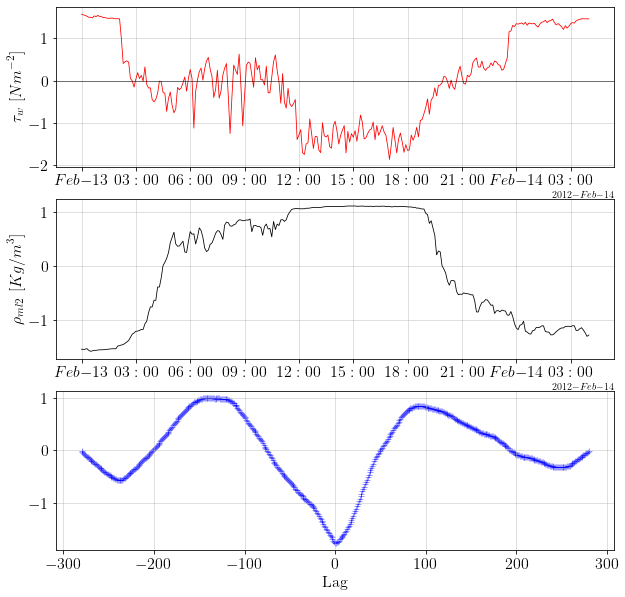

In [101]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{ml2}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [102]:
print(str(lag)+" min")

0 min


In [103]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,13,12,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,13,12,0,0)]
ml = ML_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-13 00:00:00","2012-02-13 12:00:00")).v

# Standardize and detrend/normalize

dat1 = ml.sel(time=min6_6, sensor=2, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

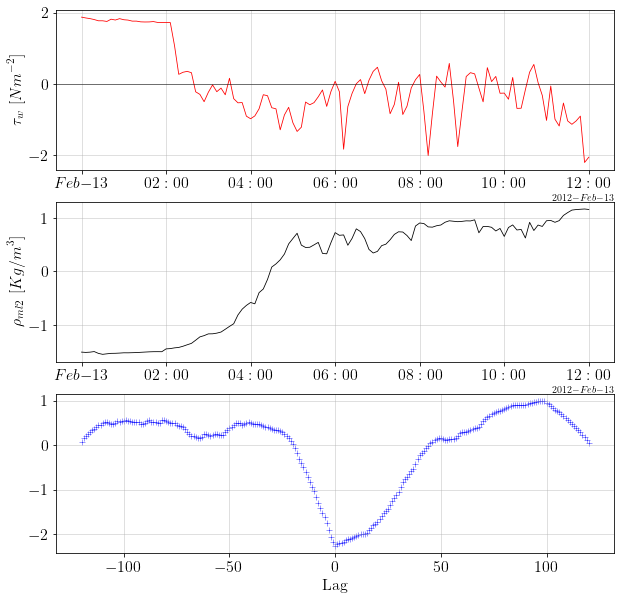

In [104]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{ml2}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [105]:
print(str(lag)+" min")

0 min


In [106]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,16,0,0), end=datetime.datetime(2012,2,14,4,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,16,0,0):datetime.datetime(2012,2,14,4,0,0)]
ml = ML_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-13 16:00:00","2012-02-14 4:00:00")).v

# Standardize and detrend/normalize

dat1 = ml.sel(time=min6_6, sensor=2, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

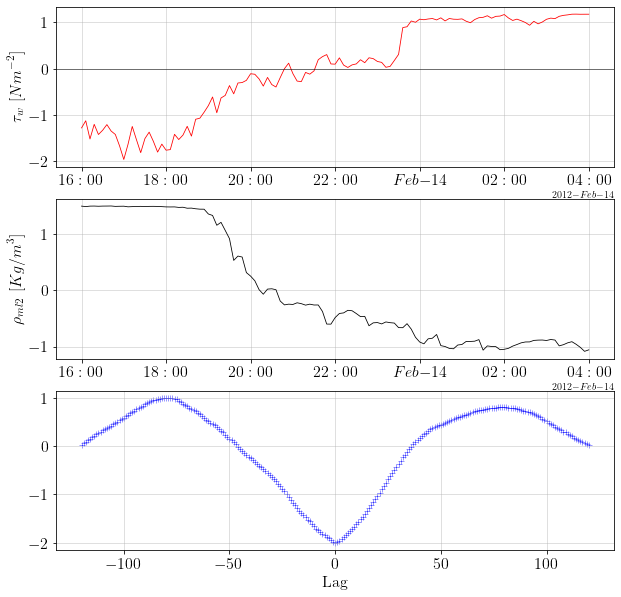

In [107]:
##cross correlation

corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{ml2}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [108]:
print(str(lag)+" min")

0 min


#### bottom

In [112]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
ml = ML_CTD.sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).v

# Standardize and detrend/normalize

dat1 = ml.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
norm1 = dat1 - np.polyval(p, t) #detrend
# norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

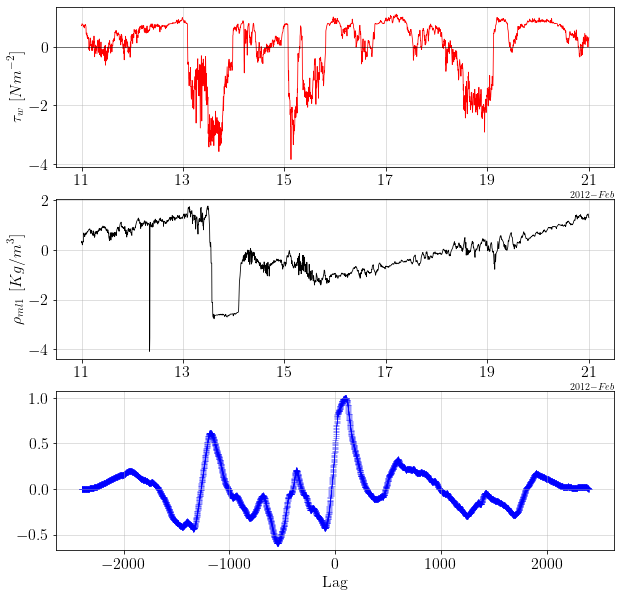

In [113]:
##cross correlation

corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{ml1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [114]:
print(str(lag)+" min")

600 min


In [118]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,14,7,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,14,7,0,0)]
ml = ML_CTD.sel(time=slice("2012-02-13 00:00:00","2012-02-14 07:00:00")).v

# Standardize and detrend/normalize

dat1 = ml.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

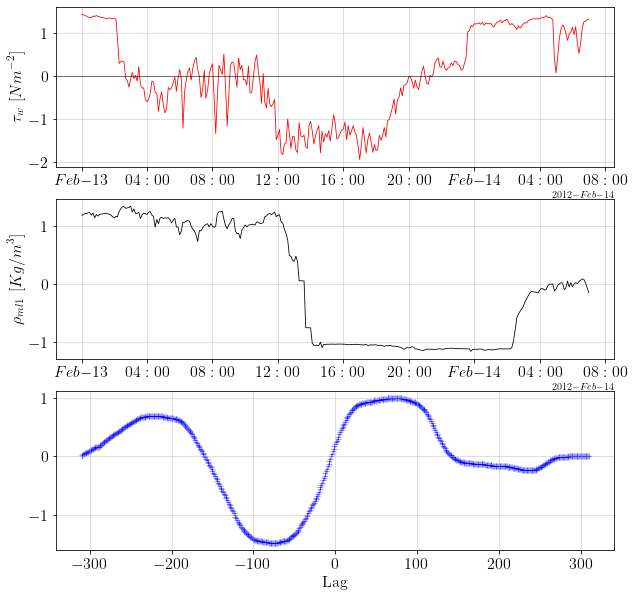

In [121]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(corr)]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{ml1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [122]:
print(str(lag)+" min")

450 min


In [123]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,0,0,0), end=datetime.datetime(2012,2,13,18,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,13,18,0,0)]
ml = ML_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-13 00:00:00","2012-02-13 18:00:00")).v

# Standardize and detrend/normalize

dat1 = ml.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

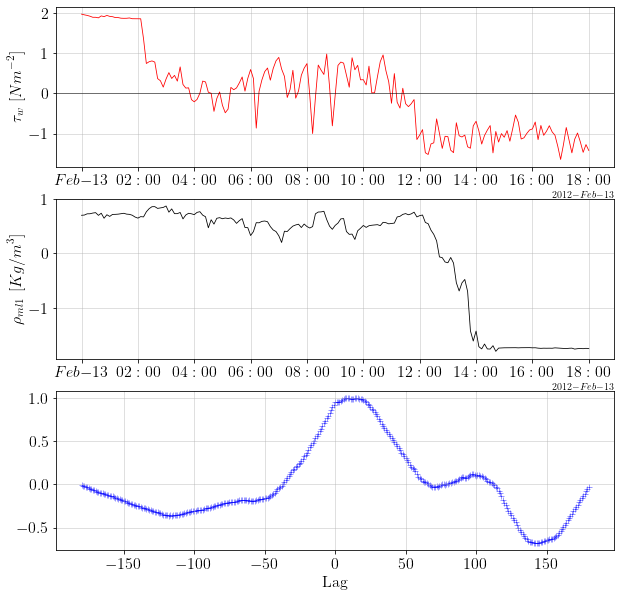

In [124]:
##cross correlation

# min3 = pd.date_range(start=datetime.datetime(2012,2,11), end=datetime.datetime(2012,2,21), periods=None, freq='3min')
corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(corr)]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{ml1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [125]:
print(str(lag)+" min")

54 min


In [126]:
min6_6 = pd.date_range(start=datetime.datetime(2012,2,13,16,0,0), end=datetime.datetime(2012,2,14,7,0,0), periods=None, freq='6min')
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,16,0,0):datetime.datetime(2012,2,14,7,0,0)]
ml = ML_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-13 16:00:00","2012-02-14 7:00:00")).v

# Standardize and detrend/normalize

dat1 = ml.sel(time=min6_6, sensor=1, variables='Density').interpolate_na(dim="time", method="nearest").values
dat2 = wdf.values
N = len(dat1)
dt = 6 # min
t = np.arange(0, N) * dt
p = np.polyfit(t, dat1, 1)

# if the data has a trend we detrend, else we just normalize
# norm1 = dat1 - np.polyval(p, t) #detrend
norm1 = dat1 - dat1.mean() # normalize

# wind data just needs to be normalized
norm2 = dat2 - dat2.mean()

std1 = norm1.std()  # Standard deviation
std2 = norm2.std()  # Standard deviation
var1 = std1 ** 2  # Variance
dat_norm1 = norm1 / std1  # Standardized dataset
dat_norm2 = norm2 / std2  # Standardized dataset

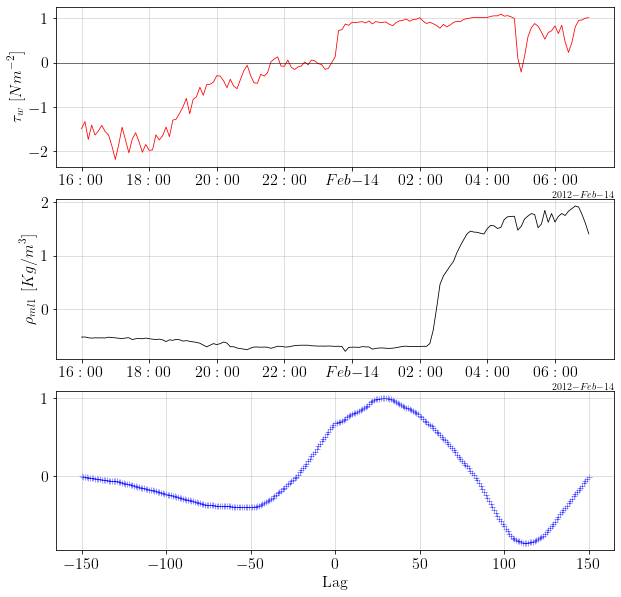

In [128]:
##cross correlation

corr = signal.correlate(dat_norm1, dat_norm2)
lags = signal.correlation_lags(len(dat_norm1), len(dat_norm2))
corr /= np.max(corr)
clock = np.linspace(0, len(min6_6)-1, num=len(corr)).astype(int)
lag = lags[np.argmax(abs(corr))]*6

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 10), sharex=False)

ax1.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax1.plot(wdf.index,dat_norm2,color='r', linewidth=0.8)
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)


ax2.set_ylabel(r"$\rho_{ml1}$ "
          r"$\displaystyle[Kg/m^3]$",
          fontsize=16)
ax2.plot(min6_6, dat_norm1,color='k', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# ax3.set_ylabel(r"Cross-correlation ",
#           fontsize=16)

ax3.set_xlabel(r"Lag ",
          fontsize=16)
ax3.scatter(lags, corr, c='b', alpha=0.8, linewidth=0.5, marker="+")
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [129]:
print(str(lag)+" min")

174 min


## Mezcla?

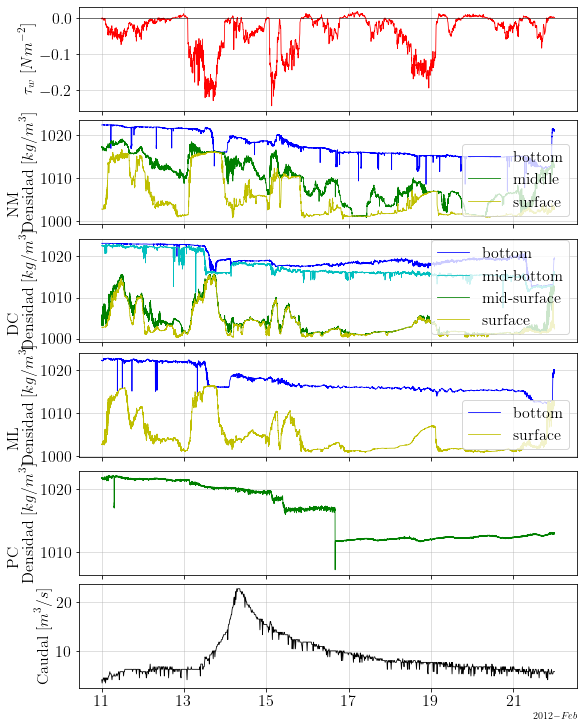

In [43]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax6, ax7, ax8, ax9, ax10) = plt.subplots(nrows=6, figsize=(8, 10), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax6.set_ylabel(r"NM\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax6.plot(nm1.index, nm1['densidad'], linewidth=0.8, c="b", label='bottom')
ax6.plot(nm2.index, nm2['densidad'], linewidth=0.8, c="g", label='middle')
ax6.plot(nm3.index, nm3['densidad'], linewidth=0.8, c="y", label='surface')
ax6.legend(loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

ax7.set_ylabel(r"DC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax7.plot(dc1.index, dc1['densidad'], linewidth=0.8, c="b", label='bottom')
ax7.plot(dc2.index, dc2['densidad'], linewidth=0.8, c="c", label='mid-bottom')
ax7.plot(dc3.index, dc3['densidad'], linewidth=0.8, c="g", label='mid-surface')
ax7.plot(dc4.index, dc4['densidad'], linewidth=0.8, c="y", label='surface')

ax7.legend(loc='lower right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

ax8.set_ylabel(r"ML\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax8.plot(ml1.index, ml1['densidad'], linewidth=0.8, c="b", label='bottom')
ax8.plot(ml2.index, ml2['densidad'], linewidth=0.8, c="y", label='surface')

ax8.legend(loc='lower right',
          fontsize=16);
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.grid(alpha=0.5)

ax9.set_ylabel(r"PC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax9.plot(pc1.index, pc1['densidad'], lw=0.8, c='g')

ax9.xaxis.set_tick_params(labelsize=16)
ax9.yaxis.set_tick_params(labelsize=16)
ax9.grid(alpha=0.5)

ax10.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

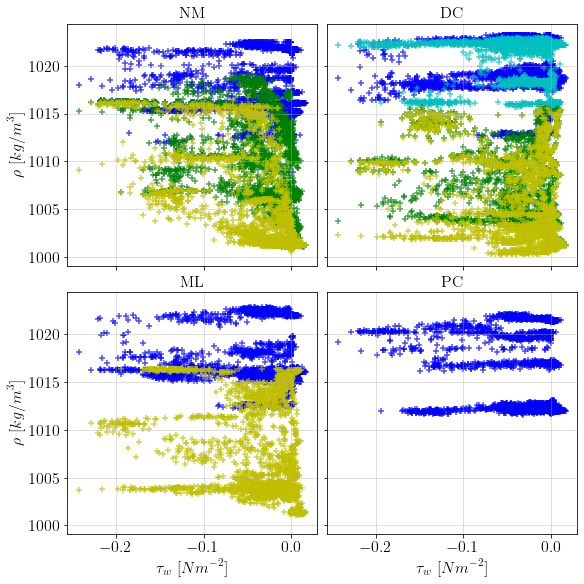

In [88]:
i_nm1 = np.linspace(0, len(nm1)-1, num=len(wdf)).astype(int)
i_nm2 = np.linspace(0, len(nm2)-1, num=len(wdf)).astype(int)
i_pc1 = np.linspace(0, len(pc1)-1, num=len(wdf)).astype(int)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, ([ax1, ax2], [ax3, ax4]) = plt.subplots(nrows=2, ncols=2, figsize=(8, 8), constrained_layout=True, sharex=True, sharey=True)

ax1.set_title(r"NM",
          fontsize=16)
ax1.set_ylabel(r"$\rho$ "
          r"$\displaystyle[kg/m^{3}]$",
          fontsize=16)
ax1.scatter(wdf.values, nm1['densidad'].iloc[i_nm1], color='b', marker='+', alpha=0.7)
ax1.scatter(wdf.values, nm2['densidad'].iloc[i_nm2], color='g', marker='+', alpha=0.7)
ax1.scatter(wdf.values, nm3['densidad'].iloc[i_nm2], color='y', marker='+', alpha=0.7)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax2.set_title(r"DC",
          fontsize=16)
ax2.scatter(wdf.values, dc1['densidad'].iloc[i_nm1], color='b', marker='+', alpha=0.7)
ax2.scatter(wdf.values, dc2['densidad'].iloc[i_nm2], color='c', marker='+', alpha=0.7)
ax2.scatter(wdf.values, dc3['densidad'].iloc[i_nm2], color='g', marker='+', alpha=0.7)
ax2.scatter(wdf.values, dc4['densidad'].iloc[i_nm2], color='y', marker='+', alpha=0.7)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax3.set_title(r"ML",
          fontsize=16)
ax3.set_xlabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax3.set_ylabel(r"$\rho$ "
          r"$\displaystyle[kg/m^{3}]$",
          fontsize=16)
ax3.scatter(wdf.values, ml1['densidad'].iloc[i_nm1], color='b', marker='+', alpha=0.7)
ax3.scatter(wdf.values, ml2['densidad'].iloc[i_nm2], color='y', marker='+', alpha=0.7)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

ax4.set_title(r"PC",
          fontsize=16)
ax4.set_xlabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax4.scatter(wdf.values, pc1['densidad'].iloc[i_pc1], color='b', marker='+', alpha=0.7)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)


In [40]:
#antes
dc1a = DC_1.loc[datetime.datetime(2012,2,13,0,0,0)]
dc2a = DC_2.loc[datetime.datetime(2012,2,13,0,0,0)]
dc3a = DC_3.loc[datetime.datetime(2012,2,13,0,0,0)]
dc4a = DC_4.loc[datetime.datetime(2012,2,13,0,0,0)]
dc1a.append(dc2a)

nm1a = NM_1.loc[datetime.datetime(2012,2,13,0,0,0)]
nm2a = NM_2.loc[datetime.datetime(2012,2,13,0,0,0)]
nm3a = NM_3.loc[datetime.datetime(2012,2,13,0,0,0)]

ml1a = ML_1.loc[datetime.datetime(2012,2,13,0,0,0)]
ml2a = ML_2.loc[datetime.datetime(2012,2,13,0,0,0):datetime.datetime(2012,2,13,0,0,1)]
#durante
dc1du = DC_1.loc[datetime.datetime(2012,2,13,18,0,0)]
dc2du = DC_2.loc[datetime.datetime(2012,2,13,18,0,0)]
dc3du = DC_3.loc[datetime.datetime(2012,2,13,18,0,0)]
dc4du = DC_4.loc[datetime.datetime(2012,2,13,18,0,0)]

nm1du = NM_1.loc[datetime.datetime(2012,2,13,18,0,0)]
nm2du = NM_2.loc[datetime.datetime(2012,2,13,18,0,0)]
nm3du = NM_3.loc[datetime.datetime(2012,2,13,18,0,0)]

ml1du = ML_1.loc[datetime.datetime(2012,2,13,18,0,0)]
ml2du = ML_2.loc[datetime.datetime(2012,2,13,18,0,0):datetime.datetime(2012,2,13,18,0,1)]
#despues

dc1d = DC_1.loc[datetime.datetime(2012,2,14,12,0,0)]
dc2d = DC_2.loc[datetime.datetime(2012,2,14,12,0,0)]
dc3d = DC_3.loc[datetime.datetime(2012,2,14,12,0,0)]
dc4d = DC_4.loc[datetime.datetime(2012,2,14,12,0,0)]

nm1d = NM_1.loc[datetime.datetime(2012,2,14,12,0,0)]
nm2d = NM_2.loc[datetime.datetime(2012,2,14,12,0,0)]
nm3d = NM_3.loc[datetime.datetime(2012,2,14,12,0,0)]

ml1d = ML_1.loc[datetime.datetime(2012,2,14,12,0,0)]
ml2d = ML_2.loc[datetime.datetime(2012,2,14,12,0,0):datetime.datetime(2012,2,14,12,0,1)]

In [131]:
ml2d

,Depth,Salinity,Temperature,densidad
Datetime,,,,
2012-02-14 12:00:00,0.315204,6.365196,10.573263,1004.59039


Text(0.5, 1.0, 'DC')

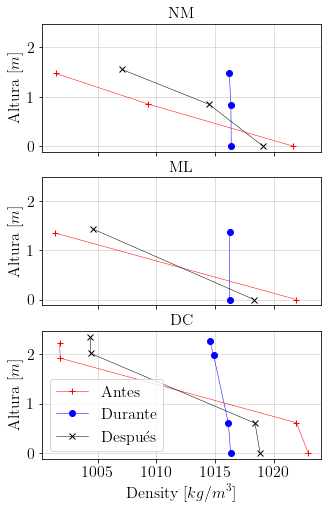

In [143]:
fig, (ax1,ax2,ax3) = plt.subplots(nrows=3, figsize=(5, 8), sharey=True, sharex=True)

ax1.plot([nm1a['densidad'], nm2a['densidad'], nm3a['densidad']], [nm1a['Depth']-nm1a['Depth'], nm1a['Depth']-nm2a['Depth'], nm1a['Depth']-nm3a['Depth']], marker='+',color='r',linewidth=0.5)

ax1.plot([nm1du['densidad'],nm2du['densidad'], nm3du['densidad']], [nm1du['Depth']-nm1du['Depth'], nm1du['Depth']-nm2du['Depth'], nm1du['Depth']-nm3du['Depth']], marker='o',color='b',linewidth=0.5)
ax1.plot([nm1d['densidad'],nm2d['densidad'], nm3d['densidad']], [nm1d['Depth']-nm1d['Depth'], nm1d['Depth']-nm2d['Depth'], nm1d['Depth']-nm3d['Depth']], marker='x',color='k',linewidth=0.5)



# ax1.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax1.set_title(r"NM",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
# ax1.legend(["Antes", "Durante", "Después"], loc='lower left',
#           fontsize=16);
ax1.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)

ax2.plot([ml1a['densidad'],ml2a['densidad']], [ml1a['Depth']-ml1a['Depth'], ml1a['Depth']-ml2a['Depth']], marker='+',color='r',linewidth=0.5)
ax2.plot([ml1du['densidad'],ml2du['densidad']], [ml1du['Depth']-ml1du['Depth'], ml1du['Depth']-ml2du['Depth']], marker='o',color='b',linewidth=0.5)
ax2.plot([ml1d['densidad'],ml2d['densidad']], [ml1d['Depth']-ml1d['Depth'], ml1d['Depth']-ml2d['Depth']], marker='x',color='k',linewidth=0.5)

# ax2.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax2.grid(alpha=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.set_title(r"ML",
          fontsize=16)
ax2.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)

ax3.plot([dc1a['densidad'],dc2a['densidad'],dc3a['densidad'],dc4a['densidad']]
             , [dc1a['Depth']-dc1a['Depth'], dc1a['Depth']-dc2a['Depth'], dc1a['Depth']-dc3a['Depth'], dc1a['Depth']-dc4a['Depth']], marker='+',color='r',linewidth=0.5)
ax3.plot([dc1du['densidad'],dc2du['densidad'],dc3du['densidad'],dc4du['densidad']]
             , [dc1du['Depth']-dc1du['Depth'], dc1du['Depth']-dc2du['Depth'], dc1du['Depth']-dc3du['Depth'], dc1du['Depth']-dc4du['Depth']], marker='o',color='b',linewidth=0.5)
ax3.plot([dc1d['densidad'],dc2d['densidad'],dc3d['densidad'],dc4d['densidad']]
             , [dc1d['Depth']-dc1d['Depth'], dc1d['Depth']-dc2d['Depth'], dc1d['Depth']-dc3d['Depth'], dc1d['Depth']-dc4d['Depth']], marker='x',color='k',linewidth=0.5)
ax3.set_xlabel(r"Density "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax3.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.legend(["Antes", "Durante", "Después"], loc='lower left',
          fontsize=16);
ax3.set_title(r"DC",
          fontsize=16)



In [39]:
#antes
dc1a = DC_1.loc[datetime.datetime(2012,2,17,0,0,0)]
dc2a = DC_2.loc[datetime.datetime(2012,2,17,0,0,0)]
dc3a = DC_3.loc[datetime.datetime(2012,2,17,0,0,0)]
dc4a = DC_4.loc[datetime.datetime(2012,2,17,0,0,0)]
# dc1a.append(dc2a)

nm1a = NM_1.loc[datetime.datetime(2012,2,17,0,0,0)]
nm2a = NM_2.loc[datetime.datetime(2012,2,17,0,0,0)]
nm3a = NM_3.loc[datetime.datetime(2012,2,17,0,0,0)]

ml1a = ML_1.loc[datetime.datetime(2012,2,17,0,0,0)]
ml2a = ML_2.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,17,0,0,1)]
#durante
dc1du = DC_1.loc[datetime.datetime(2012,2,18,23,0,0)]
dc2du = DC_2.loc[datetime.datetime(2012,2,18,23,0,0)]
dc3du = DC_3.loc[datetime.datetime(2012,2,18,23,0,0)]
dc4du = DC_4.loc[datetime.datetime(2012,2,18,23,0,0)]

nm1du = NM_1.loc[datetime.datetime(2012,2,18,23,0,0)]
nm2du = NM_2.loc[datetime.datetime(2012,2,18,23,0,0)]
nm3du = NM_3.loc[datetime.datetime(2012,2,18,23,0,0)]

ml1du = ML_1.loc[datetime.datetime(2012,2,18,23,0,0)]
ml2du = ML_2.loc[datetime.datetime(2012,2,18,23,0,0):datetime.datetime(2012,2,18,23,0,1)]
#despues

dc1d = DC_1.loc[datetime.datetime(2012,2,20,0,0,0)]
dc2d = DC_2.loc[datetime.datetime(2012,2,20,0,0,0)]
dc3d = DC_3.loc[datetime.datetime(2012,2,20,0,0,0)]
dc4d = DC_4.loc[datetime.datetime(2012,2,20,0,0,0)]

nm1d = NM_1.loc[datetime.datetime(2012,2,20,0,0,0)]
nm2d = NM_2.loc[datetime.datetime(2012,2,20,0,0,0)]
nm3d = NM_3.loc[datetime.datetime(2012,2,20,0,0,0)]

ml1d = ML_1.loc[datetime.datetime(2012,2,20,0,0,0)]
ml2d = ML_2.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,20,0,0,1)]

In [36]:
ml2d

,Depth,Salinity,Temperature,densidad
Datetime,,,,


Text(0.5, 1.0, 'DC')

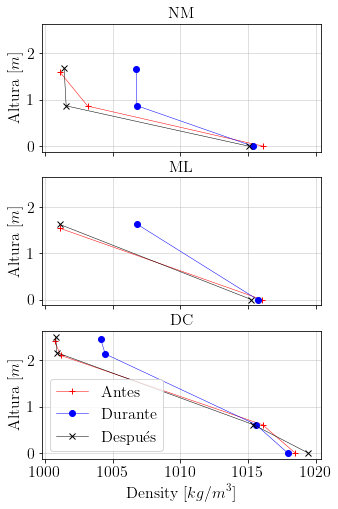

In [40]:
fig, (ax1,ax2,ax3) = plt.subplots(nrows=3, figsize=(5, 8), sharey=True, sharex=True)

ax1.plot([nm1a['densidad'], nm2a['densidad'], nm3a['densidad']], [nm1a['Depth']-nm1a['Depth'], nm1a['Depth']-nm2a['Depth'], nm1a['Depth']-nm3a['Depth']], marker='+',color='r',linewidth=0.5)

ax1.plot([nm1du['densidad'],nm2du['densidad'], nm3du['densidad']], [nm1du['Depth']-nm1du['Depth'], nm1du['Depth']-nm2du['Depth'], nm1du['Depth']-nm3du['Depth']], marker='o',color='b',linewidth=0.5)
ax1.plot([nm1d['densidad'],nm2d['densidad'], nm3d['densidad']], [nm1d['Depth']-nm1d['Depth'], nm1d['Depth']-nm2d['Depth'], nm1d['Depth']-nm3d['Depth']], marker='x',color='k',linewidth=0.5)



# ax1.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax1.set_title(r"NM",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
# ax1.legend(["Antes", "Durante", "Después"], loc='lower left',
#           fontsize=16);
ax1.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)

ax2.plot([ml1a['densidad'],ml2a['densidad']], [ml1a['Depth']-ml1a['Depth'], ml1a['Depth']-ml2a['Depth']], marker='+',color='r',linewidth=0.5)
ax2.plot([ml1du['densidad'],ml2du['densidad']], [ml1du['Depth']-ml1du['Depth'], ml1du['Depth']-ml2du['Depth']], marker='o',color='b',linewidth=0.5)
ax2.plot([ml1d['densidad'],ml2d['densidad']], [ml1d['Depth']-ml1d['Depth'], ml1d['Depth']-ml2d['Depth']], marker='x',color='k',linewidth=0.5)

# ax2.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax2.grid(alpha=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.set_title(r"ML",
          fontsize=16)
ax2.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)

ax3.plot([dc1a['densidad'],dc2a['densidad'],dc3a['densidad'],dc4a['densidad']]
             , [dc1a['Depth']-dc1a['Depth'], dc1a['Depth']-dc2a['Depth'], dc1a['Depth']-dc3a['Depth'], dc1a['Depth']-dc4a['Depth']], marker='+',color='r',linewidth=0.5)
ax3.plot([dc1du['densidad'],dc2du['densidad'],dc3du['densidad'],dc4du['densidad']]
             , [dc1du['Depth']-dc1du['Depth'], dc1du['Depth']-dc2du['Depth'], dc1du['Depth']-dc3du['Depth'], dc1du['Depth']-dc4du['Depth']], marker='o',color='b',linewidth=0.5)
ax3.plot([dc1d['densidad'],dc2d['densidad'],dc3d['densidad'],dc4d['densidad']]
             , [dc1d['Depth']-dc1d['Depth'], dc1d['Depth']-dc2d['Depth'], dc1d['Depth']-dc3d['Depth'], dc1d['Depth']-dc4d['Depth']], marker='x',color='k',linewidth=0.5)
ax3.set_xlabel(r"Density "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax3.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.legend(["Antes", "Durante", "Después"], loc='lower left',
          fontsize=16);
ax3.set_title(r"DC",
          fontsize=16)



In [59]:
bua = bu2.sel(time=slice("2012-02-17 00:00:00","2012-02-17 0:05:10"))
budu = bu2.sel(time=slice("2012-02-18 23:00:00","2012-02-18 23:05:10"))
bud = bu2.sel(time=slice("2012-02-20 00:00:00","2012-02-20 0:05:10"))

bua.values[0,:]

array([ 0.0058712 ,  0.00433754,  0.0022695 , -0.00477016, -0.01447523,
       -0.0243756 , -0.02711411, -0.02704587, -0.02841736, -0.03153559,
       -0.02284611,  0.01359496,  0.04576163,  0.0319078 ,  0.00300629,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan])

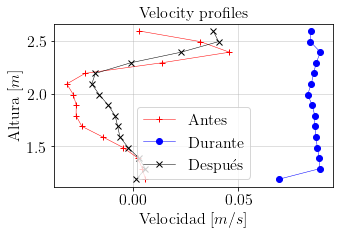

In [65]:
bua = bu2.sel(time=slice("2012-02-17 00:00:00","2012-02-17 0:05:10"))
budu = bu2.sel(time=slice("2012-02-18 23:00:00","2012-02-18 23:05:10"))
bud = bu2.sel(time=slice("2012-02-20 00:00:00","2012-02-20 0:05:10"))

fig, (ax1) = plt.subplots(nrows=1, figsize=(5, 3), sharey=True, sharex=True)

ax1.plot( bua.values[0,:] ,bua.bin, marker='+',color='r',linewidth=0.5)
ax1.plot( budu.values[0,:] ,budu.bin, marker='o',color='b',linewidth=0.5)
ax1.plot( bud.values[0,:] ,bud.bin, marker='x',color='k',linewidth=0.5)



# ax1.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax1.set_title(r"Velocity profiles",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
# ax1.legend(["Antes", "Durante", "Después"], loc='lower left',
#           fontsize=16);
ax1.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)

ax1.set_xlabel(r"Velocidad "
          r"$\displaystyle[m/s]$",
          fontsize=16)

ax1.legend(["Antes", "Durante", "Después"], loc='lower center',
          fontsize=16);


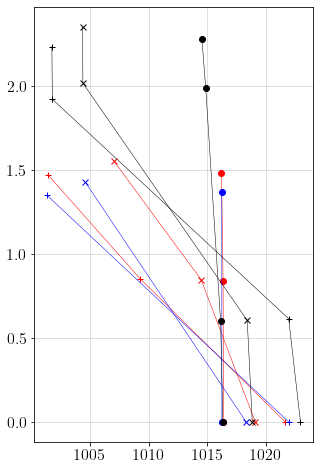

In [133]:
fig, (ax1) = plt.subplots(nrows=1, figsize=(5, 8), sharey=True, sharex=True)

ax1.plot([nm1a['densidad'], nm2a['densidad'], nm3a['densidad']], [nm1a['Depth']-nm1a['Depth'], nm1a['Depth']-nm2a['Depth'], nm1a['Depth']-nm3a['Depth']], marker='+',color='r',linewidth=0.5)

ax1.plot([nm1du['densidad'],nm2du['densidad'], nm3du['densidad']], [nm1du['Depth']-nm1du['Depth'], nm1du['Depth']-nm2du['Depth'], nm1du['Depth']-nm3du['Depth']], marker='o',color='r',linewidth=0.5)
ax1.plot([nm1d['densidad'],nm2d['densidad'], nm3d['densidad']], [nm1d['Depth']-nm1d['Depth'], nm1d['Depth']-nm2d['Depth'], nm1d['Depth']-nm3d['Depth']], marker='x',color='r',linewidth=0.5)



# ax1.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

ax1.plot([ml1a['densidad'],ml2a['densidad']], [ml1a['Depth']-ml1a['Depth'], ml1a['Depth']-ml2a['Depth']], marker='+',color='b',linewidth=0.5)
ax1.plot([ml1du['densidad'],ml2du['densidad']], [ml1du['Depth']-ml1du['Depth'], ml1du['Depth']-ml2du['Depth']], marker='o',color='b',linewidth=0.5)
ax1.plot([ml1d['densidad'],ml2d['densidad']], [ml1d['Depth']-ml1d['Depth'], ml1d['Depth']-ml2d['Depth']], marker='x',color='b',linewidth=0.5)

# ax2.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
# ax2.grid(alpha=0.5)
# ax2.xaxis.set_tick_params(labelsize=16)
# ax2.yaxis.set_tick_params(labelsize=16)

ax1.plot([dc1a['densidad'],dc2a['densidad'],dc3a['densidad'],dc4a['densidad']]
             , [dc1a['Depth']-dc1a['Depth'], dc1a['Depth']-dc2a['Depth'], dc1a['Depth']-dc3a['Depth'], dc1a['Depth']-dc4a['Depth']], marker='+',color='k',linewidth=0.5)
ax1.plot([dc1du['densidad'],dc2du['densidad'],dc3du['densidad'],dc4du['densidad']]
             , [dc1du['Depth']-dc1du['Depth'], dc1du['Depth']-dc2du['Depth'], dc1du['Depth']-dc3du['Depth'], dc1du['Depth']-dc4du['Depth']], marker='o',color='k',linewidth=0.5)
ax1.plot([dc1d['densidad'],dc2d['densidad'],dc3d['densidad'],dc4d['densidad']]
             , [dc1d['Depth']-dc1d['Depth'], dc1d['Depth']-dc2d['Depth'], dc1d['Depth']-dc3d['Depth'], dc1d['Depth']-dc4d['Depth']], marker='x',color='k',linewidth=0.5)
# ax3.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
# ax3.grid(alpha=0.5)
# ax3.xaxis.set_tick_params(labelsize=16)
# ax3.yaxis.set_tick_params(labelsize=16)



## Cuantificar mezcla

### Weddenburn

In [57]:
## Estimación profundidad picnoclina

# Dhannai
h1 = nm2["Depth"]

# Read 2011

drdz1 = (nm2["densidad"] - nm3["densidad"])/(nm2["Depth"] - nm3["Depth"])
drdz2 = (nm2["densidad"] - nm1.loc[nm3.index]["densidad"])/(nm2["Depth"] - nm1.loc[nm3.index]["Depth"])
drdz0 = 0

zi = (nm2["Depth"] + nm3["Depth"])/2
zimas = (nm1.loc[nm3.index]["Depth"] + nm2["Depth"])/2
zimenos = nm3["Depth"]
dmas = (zimas - zi)/(drdz1 - drdz2)
dmenos = (zi - zimenos)/(drdz1 - drdz)

h1 = nm2["Depth"]*(dmas/(dmas + dmenos)) + nm3["Depth"]*(dmenos/(dmas+dmenos))


In [72]:
LS = 470 #metros
rho_int = nm2["densidad"]*(dmas/(dmas + dmenos)) + nm3["densidad"]*(dmenos/(dmas+dmenos)) # paper no explica como sacarlo
rho_sup = nm3["densidad"]
rho_e = (rho_int + rho_sup)/2
u_star=(wdf/rho_e)**0.5
rho_h = nm1.loc[nm3.index]["Depth"]
g = 9.81
eg = g*(rho_h - rho_e)/rho_h
delta_min = 0.5
ze = zi + (delta_min - drdz1)*(zi - zimas)/(drdz1 - drdz2)

W = (eg*ze**2)/(LS*u_star**2)

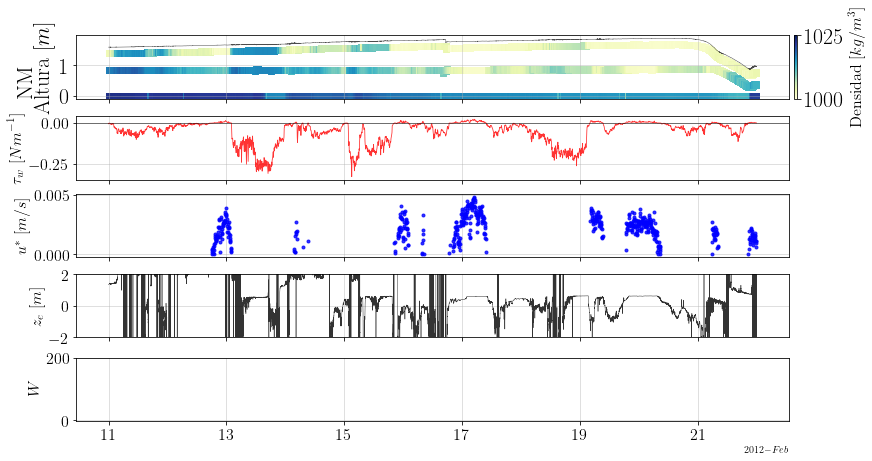

In [75]:
fig, (ax1, ax3, ax2, ax4, ax5) = plt.subplots(nrows=5, figsize=(12, 6), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax1.set_ylabel(r"NM \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax1.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.7, linewidth=0.5)
scat = ax1.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar3.ax.tick_params(labelsize=22)
cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=16)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"$z_{e}$ "
          r"$\displaystyle[m]$",
          fontsize=16)

ax4.plot(ze.index, ze, c='k', alpha=0.8, linewidth=0.5)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)
ax4.set_ylim(-2, 2)

ax2.set_ylabel(r"$u^*$ "
          r"$\displaystyle[m/s]$",
          fontsize=16)

ax2.plot(u_star.index, u_star, marker=".", c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax5.set_ylabel(r"$W$ ",
          fontsize=16)

ax5.plot(W.index, W, marker=".", c='b', alpha=0.8, linewidth=0.5)

ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)
ax5.set_ylim(-1, 200)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

Potential anomaly: 
    __procesos que modifican la estratificación se representan por $\phi$__

$\phi$ es el trabajo necesario para lograr una mezcla completa.

### NM

In [72]:
g = 9.81 # m/s^2

rho1 = nm1.loc[nm3.index]['densidad'].values
rho2 = nm2['densidad'].values
rho3 = nm3['densidad'].values
z1 = nm1.loc[nm3.index]['Depth'].values
z2 = nm2['Depth'].values
z3 = nm3['Depth'].values

### Potential energy anomaly

# Discretizacion 1
nm_rho_hat = (rho1*(z1 - z2)
              + rho2*(z2 - z3) 
              + rho3*z3)/z1

nm_pot = (g/(2*z1))*((rho3 - rho2)*(z3)**2
                     + (rho2 - rho1)*(z2)**2
                     + (rho1 - nm_rho_hat)*z1**2)

# 
# # Discretizacion 2
# nm_rho_hat = (0.5*rho1*(z1 - z2)
#               + 0.5*rho2*(z1 - z3) 
#               + 0.5*rho3*(z3 + z2))/z1

# nm_pot = (g/(2*z1))*(0.25*(rho3 - rho2)*(z3 + z2)**2 
#                                                   + 0.25*(rho2 - rho1)*(z2 + z1)**2 
#                                                   + (rho1 - nm_rho_hat)*(z1)**2)

nm_phi = pd.DataFrame(nm_pot,
                  index = nm3.index,
                  columns = ['potential_anomaly'])

### Buoyancy frequency

nm32_N2 = (g/(0.5*(rho3 + rho2)))*((rho3-rho2)/(z3-z2))
nm21_N2 = (g/(0.5*(rho2 + rho1)))*((rho2-rho1)/(z2-z1))
nm31_N2 = (g/(0.5*(rho3 + rho1)))*((rho3-rho1)/(z3-z1))

N2_nm32 = pd.DataFrame(nm32_N2,
                  index = nm3.index,
                  columns = ['N2 3-2'])



In [73]:
### Richardson number

bu2_time = bu2.time.values
bu2_time = np.delete(bu2_time, [21, 120, 121, 755, 195, 325, 529, 555, 559, 589, 588, 603, 619, 879, 937])
h_u = nm1.loc[bu2_time]['Depth'].values

tiempo, bins = np.meshgrid(bu2_time, bu2.bin.values[:8])

bins2 = np.zeros((bins.shape))
for i in range(8):
    bins2[i,:] = h_u - bins[i, :]

dudz = ((bu2.isel(bin=4).sel(time=bu2_time).values - bu2.isel(bin=0).sel(time=bu2_time).values)/(bins2[4,:]-bins2[0,:]))

nm32_ri = N2_nm32['N2 3-2'].loc[bu2_time].values/dudz**2


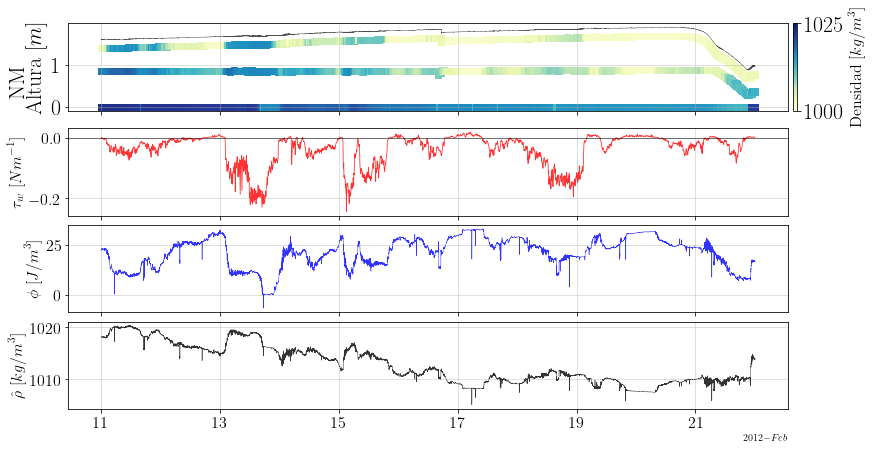

In [42]:
fig, (ax1, ax3, ax2, ax4) = plt.subplots(nrows=4, figsize=(12, 6), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax1.set_ylabel(r"NM \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax1.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.7, linewidth=0.5)
scat = ax1.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar3.ax.tick_params(labelsize=22)
cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=16)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"$\hat{\rho}$ "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)

ax4.plot(nm3.index, nm_rho_hat, c='k', alpha=0.8, linewidth=0.5)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(nm3.index, nm_pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

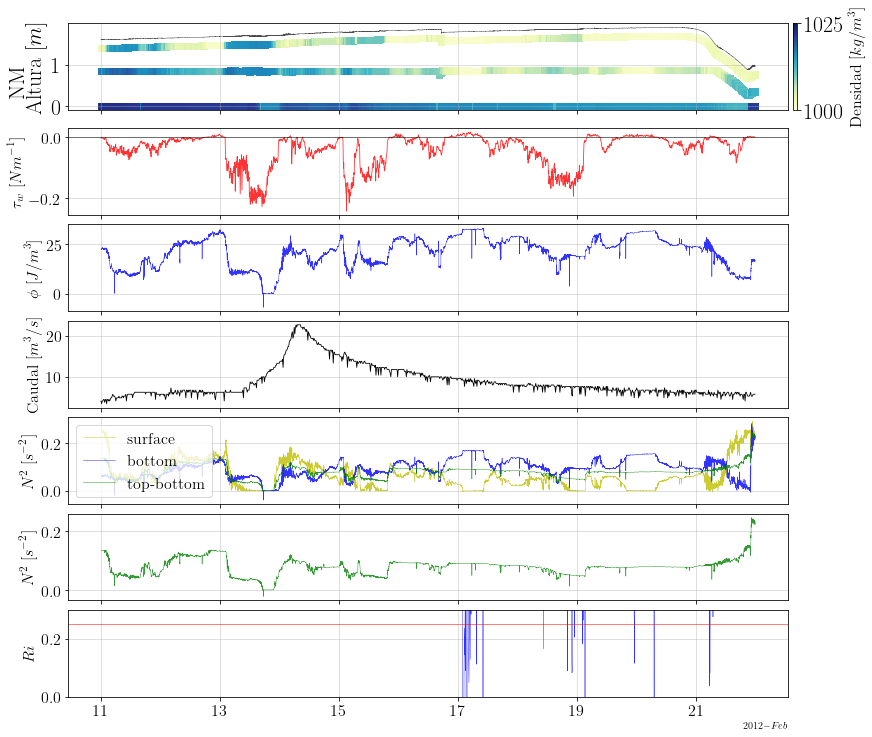

In [41]:
fig, (ax1, ax3, ax2, ax4, ax5, ax6, ax7) = plt.subplots(nrows=7, figsize=(12, 10), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax1.set_ylabel(r"NM \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax1.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.7, linewidth=0.5)
scat = ax1.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar3.ax.tick_params(labelsize=22)
cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=16)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax4.plot(q.index, q, lw=0.8, c='k')

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(nm3.index, nm_pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax5.set_ylabel(r"$N^2$ "
          r"$\displaystyle[s^{-2}]$",
          fontsize=16)

ax5.plot(nm3.index, nm32_N2, c='y', alpha=0.8, linewidth=0.5, label='surface')
ax5.plot(nm3.index, nm21_N2, c='b', alpha=0.8, linewidth=0.5, label='bottom')
ax5.plot(nm3.index, nm31_N2, c='g', alpha=0.8, linewidth=0.5, label='top-bottom')

ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)
ax5.legend(loc='upper left', fontsize=16)
# ax5.set_ylim(-24, -22)

ax6.set_ylabel(r"$N^2$ "
          r"$\displaystyle[s^{-2}]$",
          fontsize=16)

# ax6.plot(nm3.index, nm32_N2, c='y', alpha=0.8, linewidth=0.5, label='surface')
# ax6.plot(nm3.index, nm21_N2, c='b', alpha=0.8, linewidth=0.5, label='bottom')
ax6.plot(nm3.index, nm31_N2, c='g', alpha=0.8, linewidth=0.5, label='top-bottom')

ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)
# ax6.legend(loc='upper left', fontsize=16)

ax7.set_ylabel(r"$Ri$ ",
          fontsize=16)

ax7.plot(bu2_time, nm32_ri, c='b', alpha=0.8, linewidth=0.5, label='top-bottom')

ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)
ax7.axhline(y=0.25, color='r', linewidth=0.5)
ax7.set_ylim(0, 0.3)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

In [74]:
i = np.linspace(0, len(nm_phi)-1, num=len(wdf)).astype(int)

X = nm_phi.iloc[i].values
y = wdf.values

reg = LinearRegression().fit(X, y)
y_pred = reg.predict(X)
coef = reg.coef_
print(reg.intercept_)
print(reg.coef_)

-0.12973269314780222
[0.00427461]


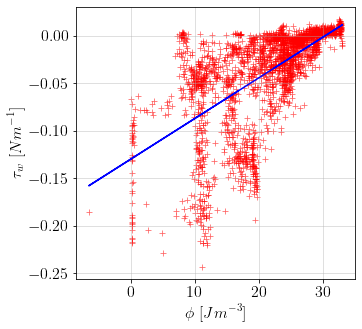

In [75]:
fig, (ax3) = plt.subplots(nrows=1, figsize=(5, 5))

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.set_xlabel(r"$\phi$ "
          r"$\displaystyle[Jm^{-3}]$",
          fontsize=16)
ax3.scatter(nm_phi.iloc[i].values, wdf.values, color='r', alpha=0.6, linewidth=0.8, marker = '+')
ax3.plot(X,y_pred, c='b')
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

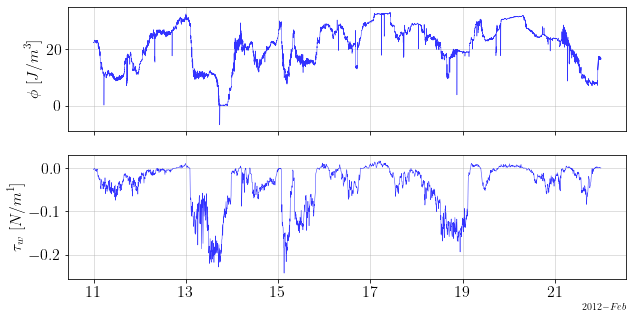

In [77]:
corr = signal.correlate(nm_phi.iloc[i].iloc[:, 0].values, wdf.values)
clock = np.linspace(0, len(nm_phi)-1, num=len(corr)).astype(int)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 5), sharex=True)

ax1.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)
ax1.plot(nm3.index, nm_pot, c='b', alpha=0.8, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[N/m^1]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values, c='b', alpha=0.8, linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax3.set_ylabel(r"Cross-correlation ",
          fontsize=16)
ax3.plot(nm_phi.iloc[clock].index, corr, c='b', alpha=0.8, linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

In [212]:
lags = signal.correlation_lags(nm_phi.iloc[i].iloc[:, 0].values.size, wdf.values.size, mode='same')

In [214]:
lag = lags[np.argmax(corr)] # argmax retorna indices de los valores mayores

In [220]:
np.argmax(corr)

30

<ipython-input-35-1bc6aea64955>:58: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


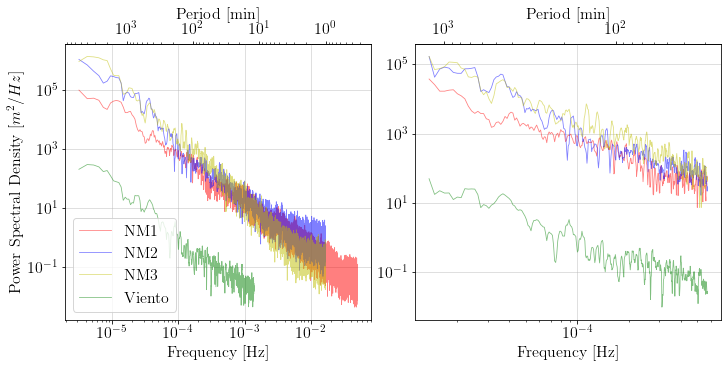

In [35]:
h_nm1 = nm1['densidad'] - nm1['densidad'].mean()
h_nm2 = nm2['densidad'] - nm2['densidad'].mean()
h_nm3 = nm3['densidad'] - nm3['densidad'].mean()
# h_ml = ml1['Depth'] - ml1['Depth'].mean()
# h_nm = nm1['Depth'] - nm1['Depth'].mean()
# h_pc = pc1['Depth'] - pc1['Depth'].mean()
# h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
h_wdf = wdf.values - wdf.values.mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm1, dt=10)
freqs2, ps2, psd2 = spectrum4(h_nm2, dt=30)
freqs3, ps3, psd3 = spectrum4(h_nm3, dt=30)
# freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
# freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)
freqs6, ps6, psd6 = spectrum4(h_wdf, dt=360)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, linewidth=0.8, label='NM1')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, linewidth=0.8, label='NM2')
axs[0].loglog(freqs3, psd3, 'y', alpha=0.5, linewidth=0.8, label='NM3')
axs[0].loglog(freqs6, psd6, 'g', alpha=0.5, linewidth=0.8, label='Viento')
# axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, linewidth=0.8, label='ML')
# axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, linewidth=0.8, label='PC')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-05, 5.70464135e-04])
i04, i14 = np.searchsorted(freqs3, [1.31969058e-04, 9.70464135e-03])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].loglog(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', 
              freqs3[sl], psd3[sl], 'y', 
              freqs6[sl], psd6[sl], 'g', alpha=0.5, linewidth=0.8)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

### DC

In [134]:
g = 9.81 # m/s^2

rho1 = dc1['densidad'].values
rho2 = dc2['densidad'].values
rho3 = dc3['densidad'].values
rho4 = dc4['densidad'].values
z1 = dc1['Depth'].values
z2 = dc2['Depth'].values
z3 = dc3['Depth'].values
z4 = dc4['Depth'].values

# Discretizacion 1
dc_rho_hat = (rho1*(z1 - z2)
              + rho2*(z2 - z3) 
              + rho3*(z3 - z4)
              + rho4*z4)/z1

dc_pot = (g/(2*z1))*((rho4 - rho3)*(z4)**2 
                     + (rho3 - rho2)*(z3)**2
                     + (rho2 - rho1)*(z2)**2
                     + (rho1 - dc_rho_hat)*z1**2)


# # Discretizacion 2
# dc_rho_hat = (0.5*rho1*(z1 - z2)
#               + 0.5*rho2*(z1 - z3) 
#               + 0.5*rho3*(z2 - z4)
#               + 0.5*rho4*(z4 + z3))/z1

# dc_pot = (g/(2*z1))*(0.25*(rho4 - rho3)*(z4 + z3)**2 
#                      + 0.25*(rho3 - rho2)*(z3 + z2)**2
#                      + 0.25*(rho2 - rho1)*(z2 + z1)**2
#                      + (rho1 - dc_rho_hat)*z1**2)

dc_phi = pd.DataFrame(dc_pot,
                  index = dc3.index,
                  columns = ['potential_anomaly'])

### Buoyancy frequency

dc43_N2 = (g/(0.5*(rho4 + rho3)))*((rho4-rho3)/(z4-z3))
dc21_N2 = (g/(0.5*(rho2 + rho1)))*((rho2-rho1)/(z2-z1))
dc41_N2 = (g/(0.5*(rho4 + rho1)))*((rho4-rho1)/(z4-z1))

N2_dc43 = pd.DataFrame(dc43_N2,
                  index = dc3.index,
                  columns = ['N2'])

In [137]:
### Richardson number

bu2_time = bu2.time.values
bu2_time = np.delete(bu2_time, [21, 120, 121, 755, 195, 325, 529, 555, 559, 589, 588, 603, 619, 879, 937])
h_u = dc1.loc[bu2_time]['Depth'].values

bv2_time = bv2.time.values
bv2_time = np.delete(bv2_time, [21, 120, 121, 755, 195, 325, 529, 555, 559, 589, 588, 603, 619, 879, 937])
# h_v = dc1.loc[bv2_time]['Depth'].values

tiempo, bins = np.meshgrid(bu2_time, bu2.bin.values[:8])
# tiempo, bins_v = np.meshgrid(bv2_time, bv2.bin.values[:8])

bins2 = np.zeros((bins.shape))
for i in range(8):
    bins2[i,:] = h_u - bins[i, :]

# bins2_v = np.zeros((bins_v.shape))
# for i in range(8):
#     bins2_v[i,:] = h_v - bins_v[i, :]

dudz = ((bu2.isel(bin=5).sel(time=bu2_time).values - bu2.isel(bin=1).sel(time=bu2_time).values)/(bins2[5,:]-bins2[1,:]))
dvdz = ((bv2.isel(bin=5).sel(time=bu2_time).values - bv2.isel(bin=1).sel(time=bu2_time).values)/(bins2[5,:]-bins2[1,:]))

S2 = dudz**2 + dvdz**2

dc43_ri = N2_dc43['N2'].loc[bu2_time].values/S2


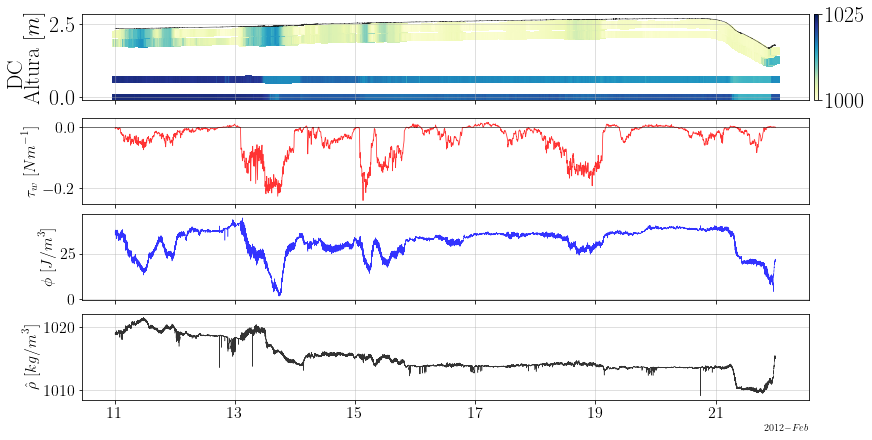

In [33]:
fig, (ax1, ax3, ax2, ax4) = plt.subplots(nrows=4, figsize=(12, 6), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax1.set_ylabel(r"DC \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.8, linewidth=0.5)
scat = ax1.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar2.ax.tick_params(labelsize=22)
# cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"$\hat{\rho}$ "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)

ax4.plot(dc4.index, dc_rho_hat, c='k', alpha=0.8, linewidth=0.5)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(dc4.index, dc_pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

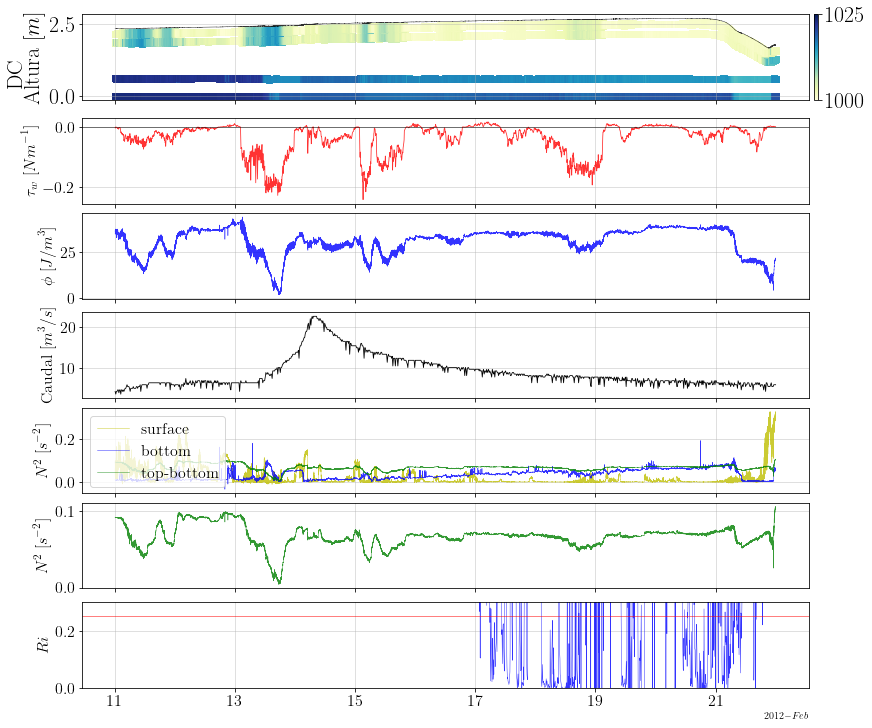

In [44]:
fig, (ax1, ax3, ax2, ax4, ax5, ax6, ax7) = plt.subplots(nrows=7, figsize=(12, 10), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) DC

ax1.set_ylabel(r"DC \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.8, linewidth=0.5)
scat = ax1.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar2.ax.tick_params(labelsize=22)
# cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax4.plot(q.index, q, lw=0.8, c='k')

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)


ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(dc4.index, dc_pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


ax5.set_ylabel(r"$N^2$ "
          r"$\displaystyle[s^{-2}]$",
          fontsize=16)

ax5.plot(dc3.index, dc43_N2, c='y', alpha=0.8, linewidth=0.5, label='surface')
ax5.plot(dc3.index, dc21_N2, c='b', alpha=0.8, linewidth=0.5, label='bottom')
ax5.plot(dc3.index, dc41_N2, c='g', alpha=0.8, linewidth=0.5, label='top-bottom')

ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)
ax5.legend(loc='upper left', fontsize=16)
# ax5.set_ylim(-24, -22)

ax6.set_ylabel(r"$N^2$ "
          r"$\displaystyle[s^{-2}]$",
          fontsize=16)

ax6.plot(dc3.index, dc41_N2, c='g', alpha=0.8, linewidth=0.5, label='top-bottom')

ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)
# ax6.legend(loc='upper left', fontsize=16)

ax7.set_ylabel(r"$Ri$ ",
          fontsize=16)

ax7.plot(bu2_time, dc43_ri, c='b', alpha=0.8, linewidth=0.5, label='top-bottom')

ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)
ax7.axhline(y=0.25, color='r', linewidth=0.5)
ax7.set_ylim(0, 0.3)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

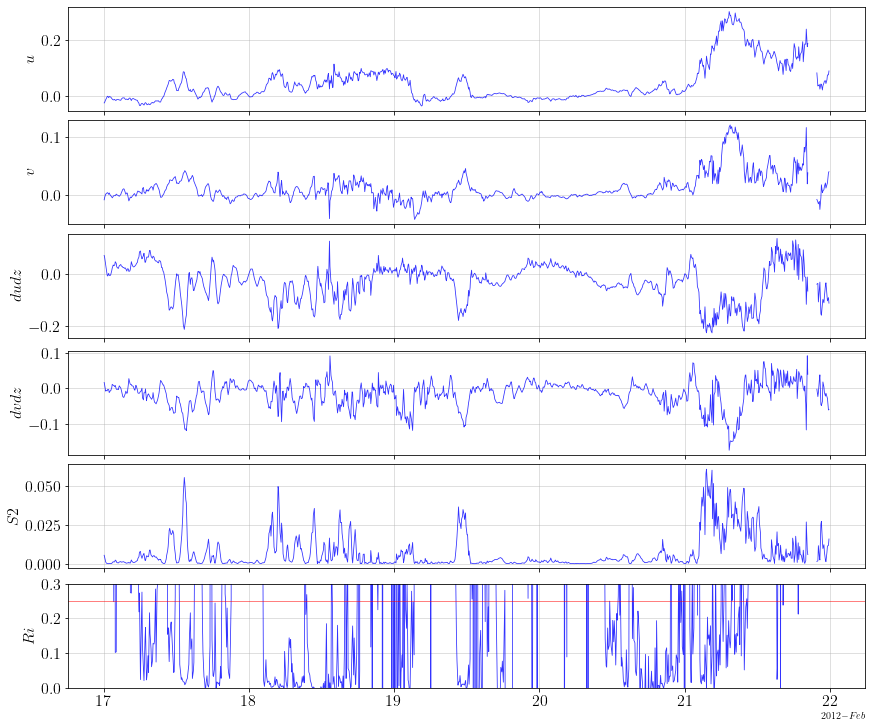

In [141]:
fig, (ax1, ax2, ax3, ax4, ax5, ax7) = plt.subplots(nrows=6, figsize=(12, 10), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

bu2.isel(bin=5).sel(time=bu2_time).values

ax1.set_ylabel(r"$u$ ",
          fontsize=16)

ax1.plot(bu2_time, bu2.isel(bin=5).sel(time=bu2_time).values, c='b', alpha=0.8, linewidth=0.8, label='top-bottom')

ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax2.set_ylabel(r"$v$ ",
          fontsize=16)

ax2.plot(bu2_time, bv2.isel(bin=5).sel(time=bu2_time).values, c='b', alpha=0.8, linewidth=0.8, label='top-bottom')

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax3.set_ylabel(r"$dudz$ ",
          fontsize=16)

ax3.plot(bu2_time, dudz, c='b', alpha=0.8, linewidth=0.8, label='top-bottom')

ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

ax4.set_ylabel(r"$dvdz$ ",
          fontsize=16)

ax4.plot(bu2_time, dvdz, c='b', alpha=0.8, linewidth=0.8, label='top-bottom')

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax5.set_ylabel(r"$S2$ ",
          fontsize=16)

ax5.plot(bu2_time, S2, c='b', alpha=0.8, linewidth=0.8, label='top-bottom')

ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)

ax7.set_ylabel(r"$Ri$ ",
          fontsize=16)

ax7.plot(bu2_time, dc43_ri, c='b', alpha=0.8, linewidth=0.8, label='top-bottom')

ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)
ax7.axhline(y=0.25, color='r', linewidth=0.5)
ax7.set_ylim(0, 0.3)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

In [34]:
i = np.linspace(0, len(dc_phi)-1, num=len(wdf)).astype(int)

X = dc_phi.iloc[i].values
y = wdf.values

reg = LinearRegression().fit(X, y)
y_pred = reg.predict(X)
coef = reg.coef_
print(reg.intercept_)
print(reg.coef_)

-0.1704638192915594
[0.00420456]


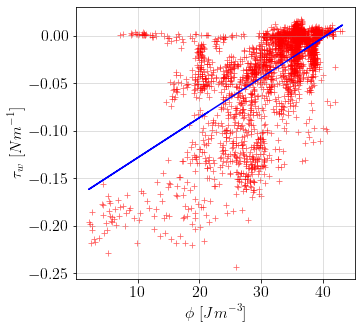

In [35]:
fig, (ax3) = plt.subplots(nrows=1, figsize=(5, 5))

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.set_xlabel(r"$\phi$ "
          r"$\displaystyle[Jm^{-3}]$",
          fontsize=16)
ax3.scatter(dc_phi.iloc[i].values, wdf.values, color='r', alpha=0.6, linewidth=0.8, marker = '+')
ax3.plot(X,y_pred, c='b')
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

<ipython-input-40-19a20def7774>:60: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


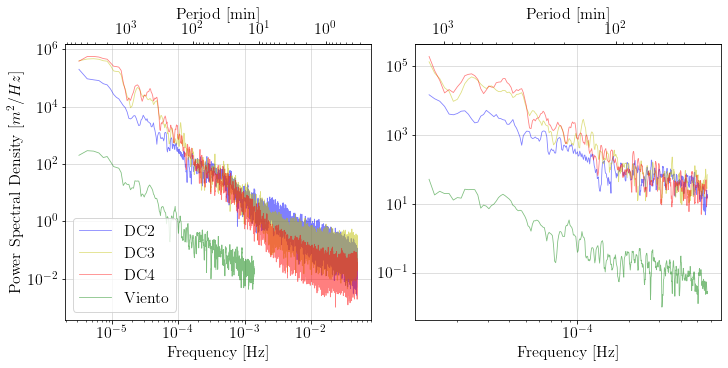

In [40]:
h_dc1 = dc1[dc1.notna()]['densidad'] - dc1['densidad'].mean()
h_dc2 = dc2['densidad'] - dc2['densidad'].mean()
h_dc3 = dc3['densidad'] - dc3['densidad'].mean()
h_dc4 = dc4['densidad'] - dc4['densidad'].mean()
# h_ml = ml1['Depth'] - ml1['Depth'].mean()
# h_nm = nm1['Depth'] - nm1['Depth'].mean()
# h_pc = pc1['Depth'] - pc1['Depth'].mean()
# h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
h_wdf = wdf.values - wdf.values.mean()
    
# freqs1, ps1, psd1 = spectrum4(h_dc1, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc2, dt=10)
freqs3, ps3, psd3 = spectrum4(h_dc3, dt=10)
freqs4, ps4, psd4 = spectrum4(h_dc4, dt=10)
# freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)
freqs6, ps6, psd6 = spectrum4(h_wdf, dt=360)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
# axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, linewidth=0.8, label='DC1')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, linewidth=0.8, label='DC2')
axs[0].loglog(freqs3, psd3, 'y', alpha=0.5, linewidth=0.8, label='DC3')
axs[0].loglog(freqs4, psd4, 'r', alpha=0.5, linewidth=0.8, label='DC4')
axs[0].loglog(freqs6, psd6, 'g', alpha=0.5, linewidth=0.8, label='Viento')
# axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, linewidth=0.8, label='ML')
# axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, linewidth=0.8, label='PC')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs2, [1.31969058e-05, 5.70464135e-04])
i04, i14 = np.searchsorted(freqs3, [1.31969058e-05, 5.70464135e-04])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].loglog(freqs2[sl], psd2[sl], 'b', 
              freqs3[sl], psd3[sl], 'y', 
              freqs4[sl], psd4[sl], 'r', 
              freqs6[sl], psd6[sl], 'g', alpha=0.5, linewidth=0.8)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

### ML

In [89]:
g = 9.81 # m/s^2

rho1 = ml1['densidad'].values
rho2 = ml2['densidad'].values

z1 = ml1['Depth'].values
z2 = ml2['Depth'].values

# # Discretizacion 1
ml_rho_hat = (rho1*(z1 - z2)
              + rho2*z2)/z1

ml_pot = (g/(2*z1))*((rho2 - rho1)*(z2)**2
                     + (rho1 - ml_rho_hat)*z1**2)


# Discretizacion 2
# ml_rho_hat = (rho1*z1
#               + 0.5*rho2*(z1 + z2))/z1

# ml_pot = (g/(2*z1))*(0.25*(rho2 - rho1)*(z2 + z1)**2
#                      + (rho1 - ml_rho_hat)*z1**2)


ml_phi = pd.DataFrame(ml_pot, 
                      index = ml2.index, 
                      columns = ['potential_anomaly'])

### Buoyancy frequency

ml21_N2 = (g/(0.5*(rho2 + rho1)))*((rho2-rho1)/(z2-z1))

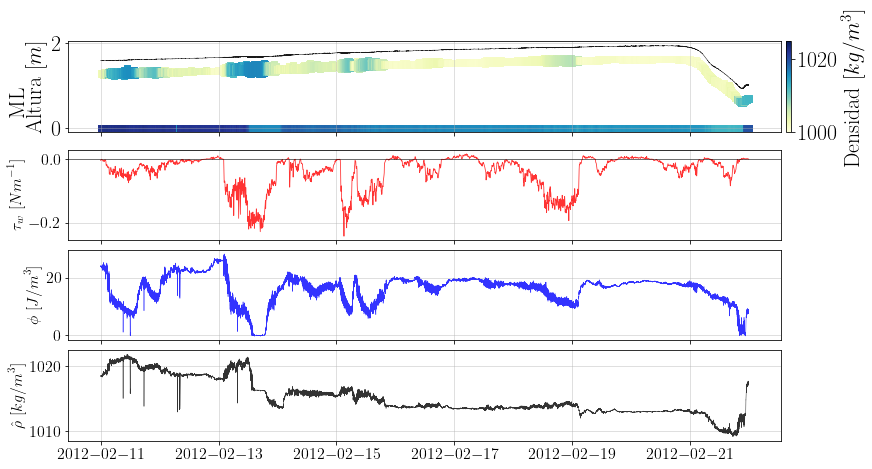

In [90]:
fig, (ax5, ax3, ax2, ax4) = plt.subplots(nrows=4, figsize=(12, 6), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax5.set_ylabel(r"ML \\ Altura $[m]$",
          fontsize=22)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.9, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.007)
cbar4.ax.tick_params(labelsize=22)
cbar4.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=22)
ax5.xaxis.set_tick_params(labelsize=22)
ax5.yaxis.set_tick_params(labelsize=22)
ax5.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"$\hat{\rho}$ "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)

ax4.plot(ml1.index, ml_rho_hat, c='k', alpha=0.8, linewidth=0.5)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(ml1.index, ml_pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

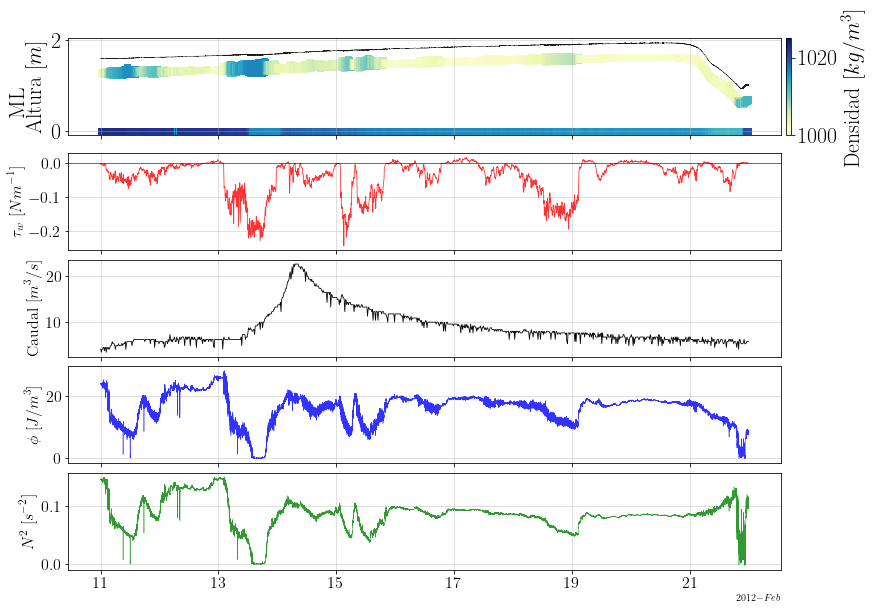

In [91]:
fig, (ax5, ax3, ax4, ax2, ax6) = plt.subplots(nrows=5, figsize=(12, 8), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax5.set_ylabel(r"ML \\ Altura $[m]$",
          fontsize=22)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.9, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.007)
cbar4.ax.tick_params(labelsize=22)
cbar4.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=22)
ax5.xaxis.set_tick_params(labelsize=22)
ax5.yaxis.set_tick_params(labelsize=22)
ax5.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax4.plot(q.index, q, lw=0.8, c='k')

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(ml1.index, ml_pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax6.set_ylabel(r"$N^2$ "
          r"$\displaystyle[s^{-2}]$",
          fontsize=16)

ax6.plot(ml1.index, ml21_N2, c='g', alpha=0.8, linewidth=0.5, label='top-bottom')

ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)
# ax6.legend(loc='upper left', fontsize=16)

# Ajustar formato fecha
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [92]:
i = np.linspace(0, len(ml_phi)-1, num=len(wdf)).astype(int)

X = ml_phi.iloc[i].values
y = wdf.values

reg = LinearRegression().fit(X, y)
y_pred = reg.predict(X)
coef = reg.coef_
print(reg.intercept_)
print(reg.coef_)

-0.14859799684744815
[0.00686343]


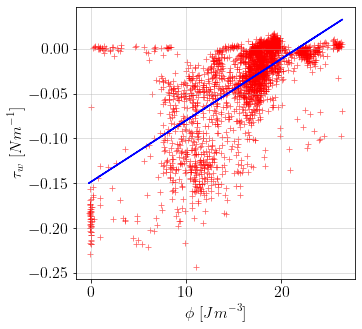

In [93]:
fig, (ax3) = plt.subplots(nrows=1, figsize=(5, 5))

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.set_xlabel(r"$\phi$ "
          r"$\displaystyle[Jm^{-3}]$",
          fontsize=16)
ax3.scatter(ml_phi.iloc[i].values, wdf.values, color='r', alpha=0.6, linewidth=0.8, marker = '+')
ax3.plot(X,y_pred, c='b')
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

<ipython-input-52-7b6df530022a>:52: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


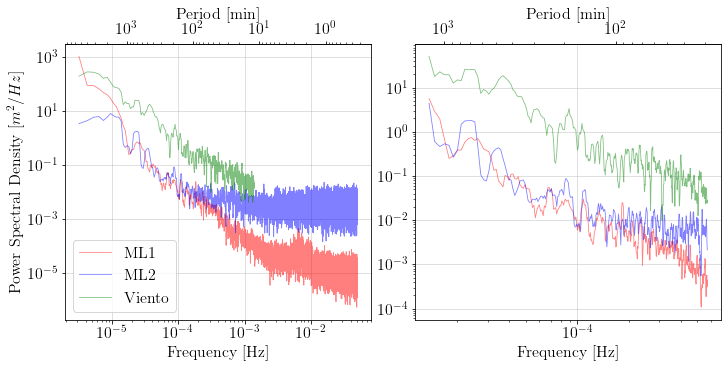

In [52]:
h_ml1 = ml1['Depth'] - ml1['Depth'].mean()
h_ml2 = ml2['Depth'] - ml2['Depth'].mean()
# h_nm = nm1['Depth'] - nm1['Depth'].mean()
# h_pc = pc1['Depth'] - pc1['Depth'].mean()
# h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
h_wdf = wdf.values - wdf.values.mean()
    
freqs1, ps1, psd1 = spectrum4(h_ml1, dt=10)
freqs2, ps2, psd2 = spectrum4(h_ml2, dt=10)
# freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)
freqs6, ps6, psd6 = spectrum4(h_wdf, dt=360)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, linewidth=0.8, label='ML1')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, linewidth=0.8, label='ML2')
axs[0].loglog(freqs6, psd6, 'g', alpha=0.5, linewidth=0.8, label='Viento')
# axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, linewidth=0.8, label='ML')
# axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, linewidth=0.8, label='PC')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs2, [1.31969058e-05, 5.70464135e-04])
i04, i14 = np.searchsorted(freqs3, [1.31969058e-05, 5.70464135e-04])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].loglog(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', 
              freqs6[sl], psd6[sl], 'g', alpha=0.5, linewidth=0.8)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

## Viento

__Feb 11st to Feb 22st__

In [29]:
#Función wavelet viento

t = wdf.index
sig  = wdf.values
widths = np.arange(1,301)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

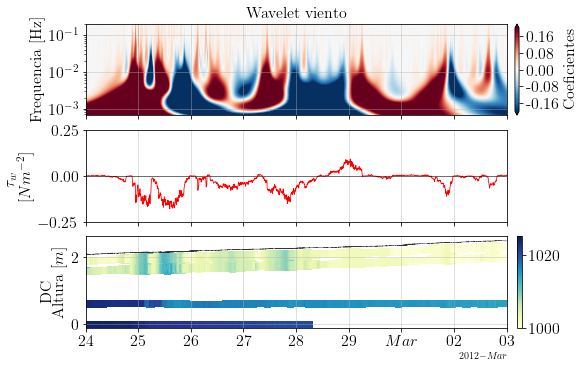

In [31]:
#Ajustar limites colorbar
umin = -0.2
umax = 0.2
vmin = -0.2
vmax = 0.2
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax8, ax2, ax3) = plt.subplots(nrows=3, figsize=(8, 5), constrained_layout=True, sharex=True)

# fig = plt.figure(figsize=(10, 24), constrained_layout=True)
# gs = GridSpec(14, 1, figure=fig)

#Grafico de velocidad del agua (color map)
# ax1 = fig.add_subplot(gs[:3, 0])
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
# contourf_ = ax1.contourf(bu2.time, y_bin,
#                          np.transpose(bu2.values),
#                          levels=level_boundaries_u,
#                          cmap=cm.RdBu_r,
#                          vmax=umax, vmin=umin, extend='both')
# cbar = fig.colorbar(contourf_, ax=ax1, pad=0.007)
# cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.04))
# cbar.set_label("Velocity [$m/s$]", loc='center',
#           fontsize=16)
# ax1.set_ylabel(r"Depth "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax1.grid(alpha=0.5)
# ax1.set_ylim(1, 2.5)
# ax1.xaxis.set_tick_params(labelsize=16)
# ax1.yaxis.set_tick_params(labelsize=16)



#Grafico de profundidad y densidad (color map) DC
# ax3 = fig.add_subplot(gs[6, 0])
# ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
#           fontsize=16)
ax3.set_ylabel(r"DC \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.8, linewidth=0.5)
scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax3, pad=0.007)
cbar2.ax.tick_params(labelsize=16)
# cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


#Grafico velocidad viento
# ax2 = fig.add_subplot(gs[3, 0])
# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$\\$[Nm^{-2}]$ ",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)

#Grafico de velocidad del agua (color map)
# ax8 = fig.add_subplot(gs[10:13, 010:13])
ax8.set_title(r"Wavelet viento",
          fontsize=16)
contourf_ = ax8.contourf(t, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.08))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Frequencia [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha

ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
# ax4.xaxis.set_major_locator(locator)
# ax4.xaxis.set_major_formatter(formatter)

plt.show() 

<ipython-input-32-87c2e0c268f9>:53: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


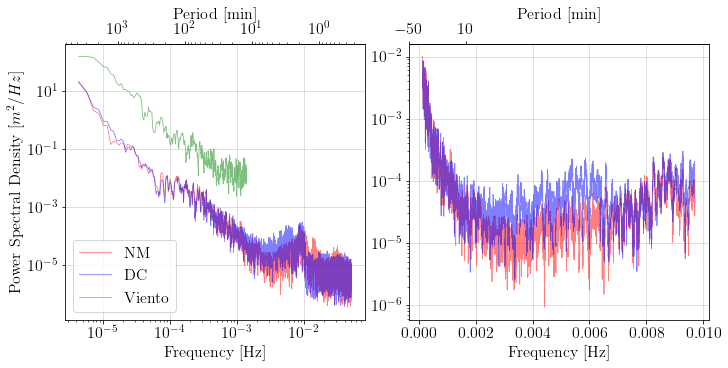

In [32]:
h_dc = dc1['Depth'] - dc1['Depth'].mean()
h_ml = ml1['Depth'] - ml1['Depth'].mean()
h_nm = nm1['Depth'] - nm1['Depth'].mean()
h_pc = pc1['Depth'] - pc1['Depth'].mean()
h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
h_wdf = wdf.values - wdf.values.mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc, dt=10)
freqs3, ps3, psd3 = spectrum4(h_sf, dt=360)
freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)
freqs6, ps6, psd6 = spectrum4(h_wdf, dt=360)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, linewidth=0.8, label='NM')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, linewidth=0.8, label='DC')
axs[0].loglog(freqs6, psd6, 'g', alpha=0.5, linewidth=0.8, label='Viento')
# axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, linewidth=0.8, label='ML')
# axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, linewidth=0.8, label='PC')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 9.70464135e-03])
i04, i14 = np.searchsorted(freqs5, [1.31969058e-04, 9.70464135e-03])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', alpha=0.5, linewidth=0.8)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

## Wave overtopping

__Feb 11st to Mar 3rd__


In [58]:
bu2 = UV_burst.sel(time=slice("2012-02-11 00:00:00","2012-02-21 00:00:00")).u
wdf = dfw['u'].loc[datetime.date(2012,2,11):datetime.date(2012,3,3)]
sf = snfco.loc[datetime.date(2012,2,11):datetime.date(2012,3,3)]
hm = hmoon.loc[datetime.date(2012,2,11):datetime.date(2012,3,3)]
mt = mnty.loc[datetime.date(2012,2,11):datetime.date(2012,3,3)]
q = Q.loc[datetime.date(2012,2,11):datetime.date(2012,3,3)]

dc1 = DC_1.loc[datetime.date(2012,2,11):datetime.date(2012,3,3)]
dc2 = DC_2.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
dc3 = DC_3.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
dc4 = DC_4.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]

nm1 = NM_1.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
nm2 = NM_2.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
nm3 = NM_3.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]

ml1 = ML_1.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]
ml2 = ML_2.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]

pc1 = PC_1.loc[datetime.date(2012,2,11):datetime.date(2012,2,21)]

dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-11 00:00:00","2012-03-03 00:00:00")).v
nm = NM_CTD.sel(time=slice("2012-02-11 00:00:00","2012-03-03 00:00:00")).v
ml = ML_CTD.sel(time=slice("2012-02-11 00:00:00","2012-03-03 00:00:00")).v
pc = PC_CTD.sel(time=slice("2012-02-11 00:00:00","2012-03-03 00:00:00")).v

In [59]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

#dh/dt

hf = dc.sel(sensor=1, variables='Depth').values[3600:]
hi = dc.sel(sensor=1, variables='Depth').values[:-3600]
dt = 10

dhdt = (hf-hi)/dt

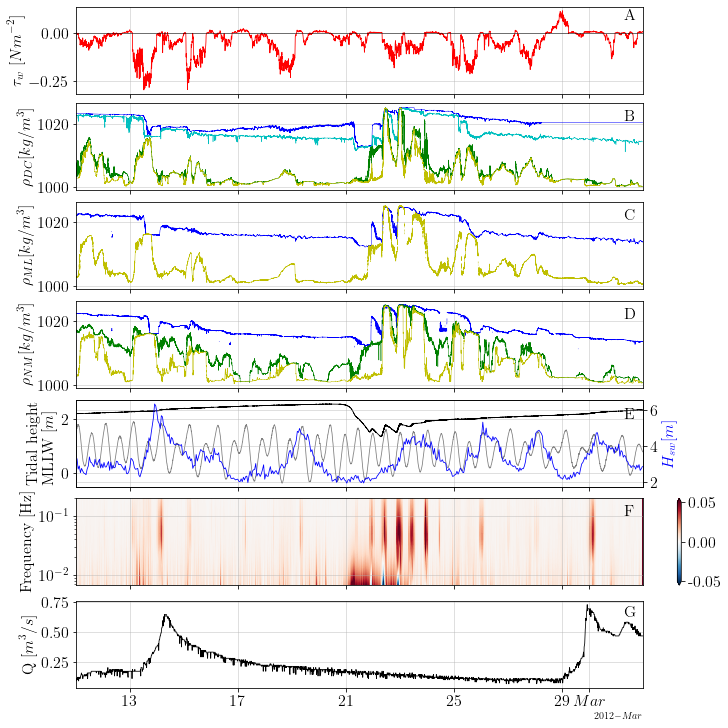

In [61]:
# #Ajustar limites colorbar
# umin = -0.1
# umax = 0.1
# vmin = -0.1
# vmax = 0.1
# level_boundaries_u = np.linspace(umin, umax, 400)
# level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax4, ax5, ax3, ax7, ax8, ax10) = plt.subplots(nrows=7, figsize=(10, 10), constrained_layout=True, sharex=True)


#Grafico velocidad viento

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.text(datetime.datetime(2012,3,2,7,30,0), 0.07, "A",
          fontsize=16)

ax3.set_ylabel(r"$\rho_{NM} [kg/m^3]$",
          fontsize=16)
ax3.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='bottom')
ax3.plot(nm.time, nm.sel(sensor=2, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.5, c="g", label='middle')
ax3.plot(nm.time, nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.5, c="y", label='surface')
# ax3.legend(loc='lower right',
#           fontsize=16);
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
ax3.text(datetime.datetime(2012,3,2,7,30,0), 1021, "D",
          fontsize=16)


ax4.set_ylabel(r"$\rho_{DC} [kg/m^3]$",
          fontsize=16)
ax4.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='bottom')
ax4.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.5, c="c", label='mid-bottom')
ax4.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.5, c="g", label='mid-surface')
ax4.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.5, c="y", label='surface')

# ax4.legend(loc='lower right',
#           fontsize=16);
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)
ax4.text(datetime.datetime(2012,3,2,7,30,0), 1021, "B",
          fontsize=16)

ax5.set_ylabel(r"$\rho_{ML} [kg/m^3]$",
          fontsize=16)
ax5.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='bottom')
ax5.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.5, c="y", label='surface')

# ax5.legend(loc='lower right',
#           fontsize=16);
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)
ax5.text(datetime.datetime(2012,3,2,7,30,0), 1021, "C",
          fontsize=16)



# Grafico nivel del agua SF


ax7.set_ylabel(r"\noindent Tidal height\\MLLW "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='gray', lw=0.8, label="San Fco")
ax7.plot(dc.time, dc.sel(sensor=1, variables='Depth')-0.1423, c='k', linewidth=0.8, label="Pescadero")
# ax7.plot(mt.index, mt.values, c='g')
# ax7.legend(["San Fco", "Monterrey"], loc='upper right',
#           fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.05
umax = 0.05
vmin = -0.05
vmax = 0.05
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

# Grafico water level estandarizada

ax6 = ax7.twinx()
ax6.set_ylabel(r"$H_{sw}[m]$",
          fontsize=16)
ax6.plot(hm.index, hm['WVHT'].values, c='b', linewidth=0.8)
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)
ax6.text(datetime.datetime(2012,3,2,7,30,0), 5.5, "E",
          fontsize=16)
ax6.yaxis.set_major_locator(tick.MultipleLocator(2))
ax6.yaxis.label.set_color("blue")

#Grafico de velocidad del agua (color map)
# ax8.set_title(r"Wavelet analysis",
#           fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log") 
ax8.text(datetime.datetime(2012,3,2,7,30,0), 0.1, "F",
          fontsize=16)

# ax1.plot(dc.time, dc.sel(variables="Depth", sensor=1))
ax10.set_ylabel(r"Q "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)
ax10.text(datetime.datetime(2012,3,2,7,30,0), 0.63, "G",
          fontsize=16)

# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

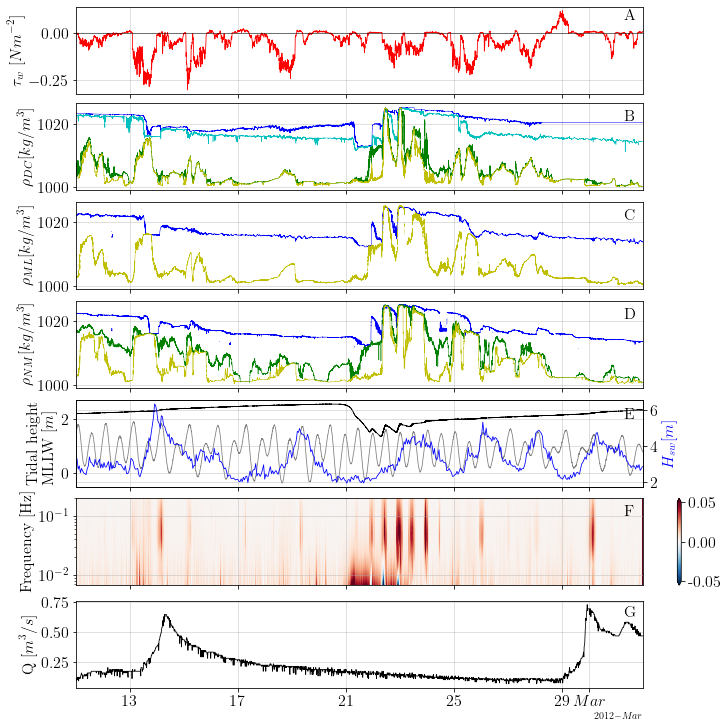

In [ ]:
# #Ajustar limites colorbar
# umin = -0.1
# umax = 0.1
# vmin = -0.1
# vmax = 0.1
# level_boundaries_u = np.linspace(umin, umax, 400)
# level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax4, ax5, ax3, ax7, ax8, ax10) = plt.subplots(nrows=7, figsize=(10, 10), constrained_layout=True, sharex=True)


#Grafico velocidad viento

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.text(datetime.datetime(2012,3,2,7,30,0), 0.07, "A",
          fontsize=16)

ax3.set_ylabel(r"$\rho_{NM} [kg/m^3]$",
          fontsize=16)
ax3.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='bottom')
ax3.plot(nm.time, nm.sel(sensor=2, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.5, c="g", label='middle')
ax3.plot(nm.time, nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.5, c="y", label='surface')
# ax3.legend(loc='lower right',
#           fontsize=16);
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
ax3.text(datetime.datetime(2012,3,2,7,30,0), 1021, "D",
          fontsize=16)


ax4.set_ylabel(r"$\rho_{DC} [kg/m^3]$",
          fontsize=16)
ax4.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='bottom')
ax4.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.5, c="c", label='mid-bottom')
ax4.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.5, c="g", label='mid-surface')
ax4.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.5, c="y", label='surface')

# ax4.legend(loc='lower right',
#           fontsize=16);
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)
ax4.text(datetime.datetime(2012,3,2,7,30,0), 1021, "B",
          fontsize=16)

ax5.set_ylabel(r"$\rho_{ML} [kg/m^3]$",
          fontsize=16)
ax5.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='bottom')
ax5.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.5, c="y", label='surface')

# ax5.legend(loc='lower right',
#           fontsize=16);
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)
ax5.text(datetime.datetime(2012,3,2,7,30,0), 1021, "C",
          fontsize=16)



# Grafico nivel del agua SF


ax7.set_ylabel(r"\noindent Tidal height\\MLLW "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='gray', lw=0.8, label="San Fco")
ax7.plot(dc.time, dc.sel(sensor=1, variables='Depth')-0.1423, c='k', linewidth=0.8, label="Pescadero")
# ax7.plot(mt.index, mt.values, c='g')
# ax7.legend(["San Fco", "Monterrey"], loc='upper right',
#           fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.05
umax = 0.05
vmin = -0.05
vmax = 0.05
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

# Grafico water level estandarizada

ax6 = ax7.twinx()
ax6.set_ylabel(r"$H_{sw}[m]$",
          fontsize=16)
ax6.plot(hm.index, hm['WVHT'].values, c='b', linewidth=0.8)
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)
ax6.text(datetime.datetime(2012,3,2,7,30,0), 5.5, "E",
          fontsize=16)
ax6.yaxis.set_major_locator(tick.MultipleLocator(2))
ax6.yaxis.label.set_color("blue")

#Grafico de velocidad del agua (color map)
# ax8.set_title(r"Wavelet analysis",
#           fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log") 
ax8.text(datetime.datetime(2012,3,2,7,30,0), 0.1, "F",
          fontsize=16)

ax1.plot(dc.time, dc.sel(variables="Depth", sensor=1))
ax10.set_ylabel(r"Q "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)
ax10.text(datetime.datetime(2012,3,2,7,30,0), 0.63, "G",
          fontsize=16)

# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

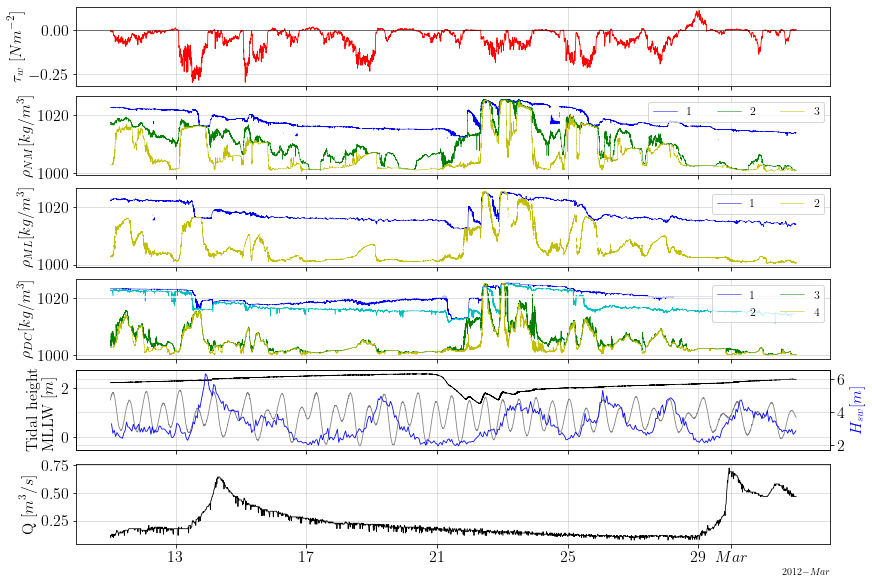

In [ ]:
# #Ajustar limites colorbar
# umin = -0.1
# umax = 0.1
# vmin = -0.1
# vmax = 0.1
# level_boundaries_u = np.linspace(umin, umax, 400)
# level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax3, ax5, ax4, ax7, ax10) = plt.subplots(nrows=6, figsize=(12, 8), constrained_layout=True, sharex=True)


#Grafico velocidad viento

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


ax3.set_ylabel(r"$\rho_{NM} [kg/m^3]$",
          fontsize=16)
ax3.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='1')
ax3.plot(nm.time, nm.sel(sensor=2, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.5, c="g", label='2')
ax3.plot(nm.time, nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.5, c="y", label='3')
ax3.legend(loc='upper right', ncol=3,
          fontsize=12);
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)



ax4.set_ylabel(r"$\rho_{DC} [kg/m^3]$",
          fontsize=16)
ax4.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='1')
ax4.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.5, c="c", label='2')
ax4.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.5, c="g", label='3')
ax4.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.5, c="y", label='4')

ax4.legend(loc='upper right', ncol=2,
          fontsize=12);
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)
ax4.axhline(y=1020.4, color='white', linewidth=1.5)


ax5.set_ylabel(r"$\rho_{ML} [kg/m^3]$",
          fontsize=16)
ax5.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='1')
ax5.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.5, c="y", label='2')

ax5.legend(loc='upper right', ncol=2,
          fontsize=12);
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)



# Grafico nivel del agua SF


ax7.set_ylabel(r"\noindent Tidal height\\MLLW "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='gray', lw=0.8, label="San Fco")
ax7.plot(dc.time, dc.sel(sensor=1, variables='Depth')-0.1423, c='k', linewidth=0.8, label="Pescadero")
# ax7.plot(mt.index, mt.values, c='g')
# ax7.legend(["San Fco", "Monterrey"], loc='upper right',
#           fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.05
umax = 0.05
vmin = -0.05
vmax = 0.05
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

# Grafico water level estandarizada

ax6 = ax7.twinx()
ax6.set_ylabel(r"$H_{sw}[m]$",
          fontsize=16)
ax6.plot(hm.index, hm['WVHT'].values, c='b', linewidth=0.8)
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

ax6.yaxis.set_major_locator(tick.MultipleLocator(2))
ax6.yaxis.label.set_color("blue")

# ax1.plot(dc.time, dc.sel(variables="Depth", sensor=1))
ax10.set_ylabel(r"Q "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)


# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

In [59]:
dc.sel(sensor=1, variables='Density')

<xarray.DataArray 'v' (time: 181441)>
array([1023.20049433, 1023.19988592, 1023.19954485, ..., 1020.37819063,
       1020.37819063, 1020.37819063])
Coordinates:
  * time       (time) datetime64[ns] 2012-02-11 ... 2012-03-03
    variables  <U7 'Density'
    sensor     int64 1

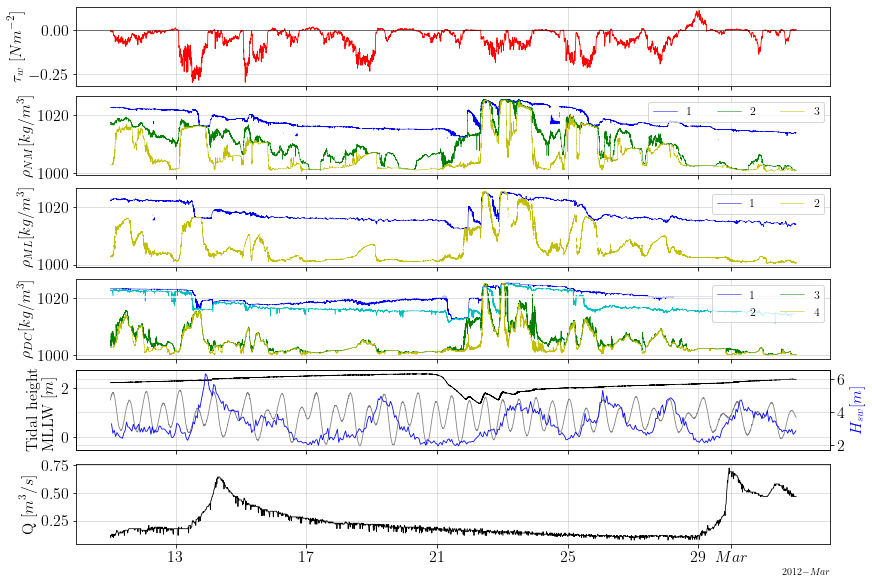

In [68]:
# #Ajustar limites colorbar
# umin = -0.1
# umax = 0.1
# vmin = -0.1
# vmax = 0.1
# level_boundaries_u = np.linspace(umin, umax, 400)
# level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax3, ax5, ax4, ax7, ax10) = plt.subplots(nrows=6, figsize=(12, 8), constrained_layout=True, sharex=True)


#Grafico velocidad viento

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


ax3.set_ylabel(r"$\rho_{NM} [kg/m^3]$",
          fontsize=16)
ax3.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='1')
ax3.plot(nm.time, nm.sel(sensor=2, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.5, c="g", label='2')
ax3.plot(nm.time, nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.5, c="y", label='3')
ax3.legend(loc='upper right', ncol=3,
          fontsize=12);
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)



ax4.set_ylabel(r"$\rho_{DC} [kg/m^3]$",
          fontsize=16)
ax4.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='1')
ax4.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.5, c="c", label='2')
ax4.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.5, c="g", label='3')
ax4.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.5, c="y", label='4')

ax4.legend(loc='upper right', ncol=2,
          fontsize=12);
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)
ax4.axhline(y=1020.4, color='white', linewidth=1.5)


ax5.set_ylabel(r"$\rho_{ML} [kg/m^3]$",
          fontsize=16)
ax5.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='1')
ax5.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.5, c="y", label='2')

ax5.legend(loc='upper right', ncol=2,
          fontsize=12);
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)



# Grafico nivel del agua SF


ax7.set_ylabel(r"\noindent Tidal height\\MLLW "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='gray', lw=0.8, label="San Fco")
ax7.plot(dc.time, dc.sel(sensor=1, variables='Depth')-0.1423, c='k', linewidth=0.8, label="Pescadero")
# ax7.plot(mt.index, mt.values, c='g')
# ax7.legend(["San Fco", "Monterrey"], loc='upper right',
#           fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.05
umax = 0.05
vmin = -0.05
vmax = 0.05
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

# Grafico water level estandarizada

ax6 = ax7.twinx()
ax6.set_ylabel(r"$H_{sw}[m]$",
          fontsize=16)
ax6.plot(hm.index, hm['WVHT'].values, c='b', linewidth=0.8)
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

ax6.yaxis.set_major_locator(tick.MultipleLocator(2))
ax6.yaxis.label.set_color("blue")

# ax1.plot(dc.time, dc.sel(variables="Depth", sensor=1))
ax10.set_ylabel(r"Q "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)


# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

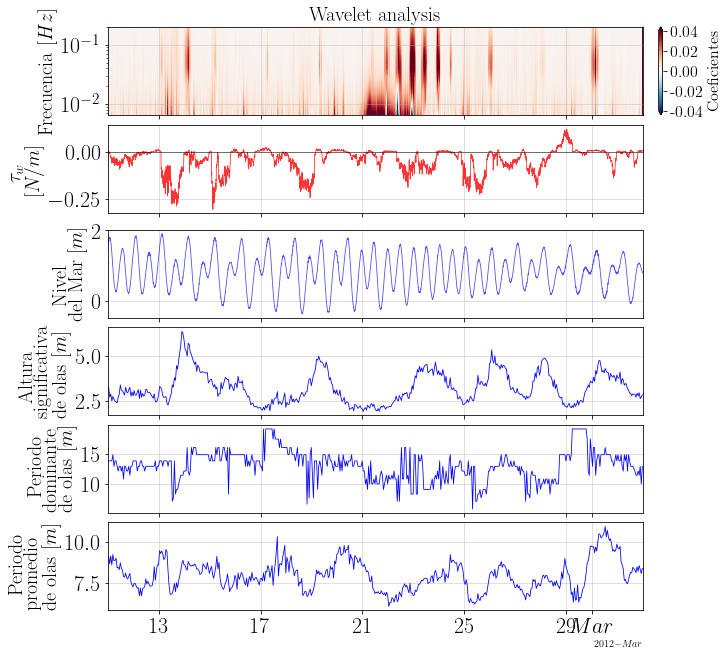

In [40]:
#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

fig, (ax1, ax3, ax2, ax4, ax5, ax6) = plt.subplots(nrows=6, figsize=(10, 9), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Wavelet
ax1.set_title(r"Wavelet analysis",
          fontsize=20)
contourf_ = ax1.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
# ax1.set_ylabel(r'Frequencia [Hz]',
#           fontsize=16)
ax1.set_ylabel(r"Frecuencia "
          r"$\displaystyle[Hz]$",
          fontsize=20)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.set_yscale("log")



ax2.plot(sf.index, sf.values, alpha=0.7, linewidth=0.8, c="b", label='San Fco');
# ax2.plot(mt.index, mt.values, alpha=0.7, linewidth=0.8, c="r", label='Monterrey');
# ax2.legend(loc='upper left',
#           fontsize=16);
ax2.set_ylabel(r'Nivel\\del Mar [$m$]',
          fontsize=20)
ax2.grid(alpha=0.5)
ax2.xaxis.set_tick_params(labelsize=22)
ax2.yaxis.set_tick_params(labelsize=22)

ax3.set_ylabel(r"$\tau_w$\\"
          r"$\displaystyle[N/m]$",
          fontsize=20)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=22)
ax3.yaxis.set_tick_params(labelsize=22)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)

ax4.set_ylabel(r"Altura\\significativa\\de olas "
          r"$\displaystyle[m]$",
          fontsize=20)
ax4.plot(hm.index, hm['WVHT'].values, c='b', linewidth=0.8)
ax4.xaxis.set_tick_params(labelsize=22)
ax4.yaxis.set_tick_params(labelsize=22)
ax4.grid(alpha=0.5)

ax5.set_ylabel(r"Periodo\\dominante\\de olas "
          r"$\displaystyle[m]$",
              fontsize=20)
ax5.plot(hm.index, hm['DPD'].values, c='b', linewidth=0.8)
ax5.xaxis.set_tick_params(labelsize=22)
ax5.yaxis.set_tick_params(labelsize=22)
ax5.grid(alpha=0.5)

ax6.set_ylabel(r"Periodo\\promedio\\de olas "
          r"$\displaystyle[m]$",
              fontsize=20)
ax6.plot(hm.index, hm['APD'].values, c='b', linewidth=0.8)
ax6.xaxis.set_tick_params(labelsize=22)
ax6.yaxis.set_tick_params(labelsize=22)
ax6.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

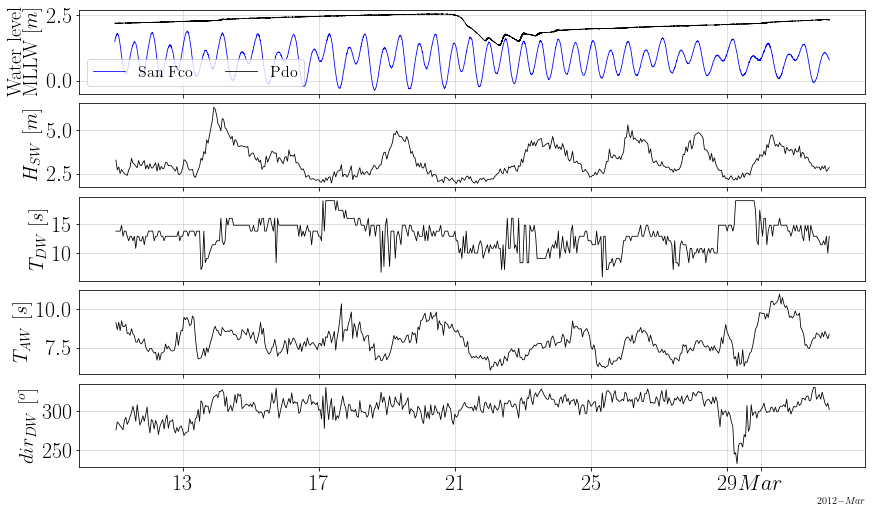

In [43]:
#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

fig, (ax2, ax4, ax5, ax6, ax7) = plt.subplots(nrows=5, figsize=(12, 7), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Wavelet

contourf_ = ax1.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
# ax1.set_ylabel(r'Frequencia [Hz]',
#           fontsize=16)
ax1.set_ylabel(r"Frequency "
          r"$\displaystyle[Hz]$",
          fontsize=20)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.set_yscale("log")

ax2.set_ylabel(r"\noindent Water level\\MLLW "
          r"$\displaystyle[m]$",
          fontsize=20)
ax2.plot(sf.index, sf.values, c='b', lw=0.8, label="San Fco")
ax2.plot(dc.time, dc.sel(sensor=1, variables='Depth')-0.1423, c='k', linewidth=0.8, label="Pdo")
# ax7.plot(mt.index, mt.values, c='g')
# ax7.legend(["San Fco", "Monterrey"], loc='upper right',
#           fontsize=16);
ax2.xaxis.set_tick_params(labelsize=22)
ax2.yaxis.set_tick_params(labelsize=22)
ax2.grid(alpha=0.5)
ax2.legend(fontsize=16, ncol=2)

# ax3.set_ylabel(r"$\tau_w$\\"
#           r"$\displaystyle[N/m]$",
#           fontsize=20)
# ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
# ax3.axhline(y=0, color='k', linewidth=0.5)
# ax3.xaxis.set_tick_params(labelsize=22)
# ax3.yaxis.set_tick_params(labelsize=22)
# ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)

ax4.set_ylabel(r"$H_{SW}$ "
          r"$\displaystyle[m]$",
          fontsize=20)
ax4.plot(hm.index, hm['WVHT'].values, c='k', linewidth=0.8)
ax4.xaxis.set_tick_params(labelsize=22)
ax4.yaxis.set_tick_params(labelsize=22)
ax4.grid(alpha=0.5)

ax5.set_ylabel(r"$T_{DW}$ "
          r"$\displaystyle[s]$",
              fontsize=20)
ax5.plot(hm.index, hm['DPD'].values, c='k', linewidth=0.8)
ax5.xaxis.set_tick_params(labelsize=22)
ax5.yaxis.set_tick_params(labelsize=22)
ax5.grid(alpha=0.5)

ax6.set_ylabel(r"$T_{AW}$ "
          r"$\displaystyle[s]$",
              fontsize=20)
ax6.plot(hm.index, hm['APD'].values, c='k', linewidth=0.8)
ax6.xaxis.set_tick_params(labelsize=22)
ax6.yaxis.set_tick_params(labelsize=22)
ax6.grid(alpha=0.5)

ax7.set_ylabel(r"$dir_{DW}$ "
          r"$\displaystyle[^o]$",
              fontsize=20)
ax7.plot(hm.index, hm['MWD'].values, c='k', linewidth=0.8)
ax7.xaxis.set_tick_params(labelsize=22)
ax7.yaxis.set_tick_params(labelsize=22)
ax7.grid(alpha=0.5)



# Ajustar formato fecha
ax7.xaxis.set_major_locator(locator)
ax7.xaxis.set_major_formatter(formatter)

In [56]:
#Función wavelet marea

t = sf.index
sig  = sf.values[:,0]
widths = np.arange(1,201)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

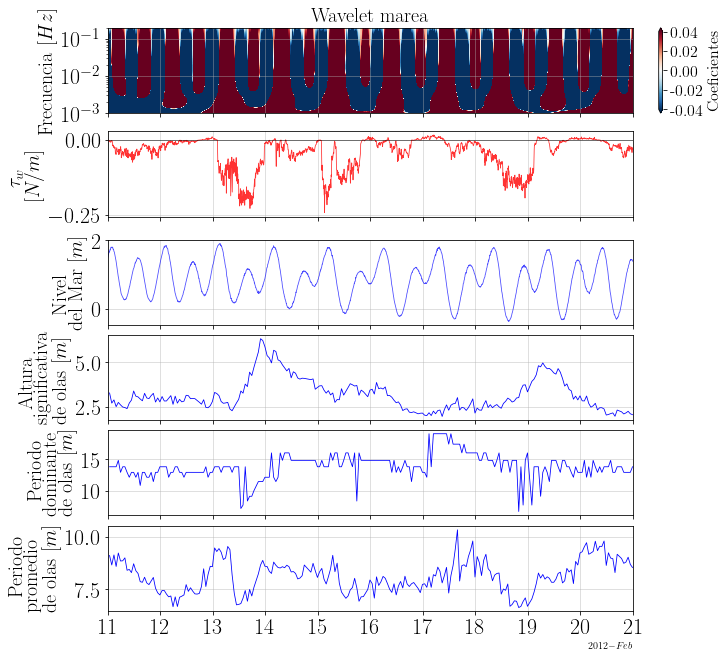

In [57]:
#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

fig, (ax1, ax3, ax2, ax4, ax5, ax6) = plt.subplots(nrows=6, figsize=(10, 9), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Wavelet
ax1.set_title(r"Wavelet marea",
          fontsize=20)
contourf_ = ax1.contourf(t, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
# ax1.set_ylabel(r'Frequencia [Hz]',
#           fontsize=16)
ax1.set_ylabel(r"Frecuencia "
          r"$\displaystyle[Hz]$",
          fontsize=20)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.set_yscale("log")



ax2.plot(sf.index, sf.values, alpha=0.7, linewidth=0.8, c="b", label='San Fco');
# ax2.plot(mt.index, mt.values, alpha=0.7, linewidth=0.8, c="r", label='Monterrey');
# ax2.legend(loc='upper left',
#           fontsize=16);
ax2.set_ylabel(r'Nivel\\del Mar [$m$]',
          fontsize=20)
ax2.grid(alpha=0.5)
ax2.xaxis.set_tick_params(labelsize=22)
ax2.yaxis.set_tick_params(labelsize=22)

ax3.set_ylabel(r"$\tau_w$\\"
          r"$\displaystyle[N/m]$",
          fontsize=20)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=22)
ax3.yaxis.set_tick_params(labelsize=22)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)

ax4.set_ylabel(r"Altura\\significativa\\de olas "
          r"$\displaystyle[m]$",
          fontsize=20)
ax4.plot(hm.index, hm['WVHT'].values, c='b', linewidth=0.8)
ax4.xaxis.set_tick_params(labelsize=22)
ax4.yaxis.set_tick_params(labelsize=22)
ax4.grid(alpha=0.5)

ax5.set_ylabel(r"Periodo\\dominante\\de olas "
          r"$\displaystyle[m]$",
              fontsize=20)
ax5.plot(hm.index, hm['DPD'].values, c='b', linewidth=0.8)
ax5.xaxis.set_tick_params(labelsize=22)
ax5.yaxis.set_tick_params(labelsize=22)
ax5.grid(alpha=0.5)

ax6.set_ylabel(r"Periodo\\promedio\\de olas "
          r"$\displaystyle[m]$",
              fontsize=20)
ax6.plot(hm.index, hm['APD'].values, c='b', linewidth=0.8)
ax6.xaxis.set_tick_params(labelsize=22)
ax6.yaxis.set_tick_params(labelsize=22)
ax6.grid(alpha=0.5)

ax7.set_ylabel(r"Wave Direction "
          r"$\displaystyle^o$",
              fontsize=20)
ax7.plot(hm.index, hm['MWD'].values, c='b', linewidth=0.8)
ax7.xaxis.set_tick_params(labelsize=22)
ax7.yaxis.set_tick_params(labelsize=22)
ax7.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

<ipython-input-68-8497be594eab>:51: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


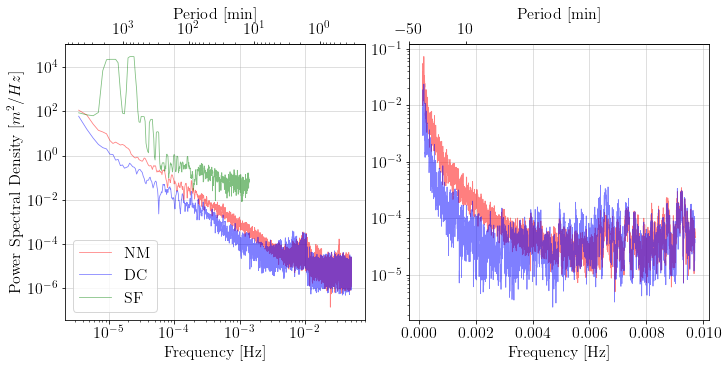

In [68]:
h_dc = dc1['Depth'] - dc1['Depth'].mean()
h_ml = ml1['Depth'] - ml1['Depth'].mean()
h_nm = nm1['Depth'] - nm1['Depth'].mean()
h_pc = pc1['Depth'] - pc1['Depth'].mean()
h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc, dt=10)
freqs3, ps3, psd3 = spectrum4(h_sf, dt=360)
freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, linewidth=0.8, label='NM')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, linewidth=0.8, label='DC')
axs[0].loglog(freqs3, psd3, 'g', alpha=0.5, linewidth=0.8, label='SF')
# axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, linewidth=0.8, label='ML')
# axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, linewidth=0.8, label='PC')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 9.70464135e-03])
i04, i14 = np.searchsorted(freqs5, [1.31969058e-04, 9.70464135e-03])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', alpha=0.5, linewidth=0.8)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

__Feb 11st to Feb 20th__


In [87]:
bu2 = UV_burst.sel(time=slice("2012-02-11 00:00:00","2012-02-20 00:00:00")).u
wdf = dfw['u'].loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]
sf = snfco.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]
hm = hmoon.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]
mt = mnty.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]
q = Q.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]

dc1 = DC_1.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]
dc2 = DC_2.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]
dc3 = DC_3.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]
dc4 = DC_4.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]

nm1 = NM_1.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]
nm2 = NM_2.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]
nm3 = NM_3.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]

ml1 = ML_1.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]
ml2 = ML_2.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]

pc1 = PC_1.loc[datetime.date(2012,2,11):datetime.date(2012,2,20)]

dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-11 00:00:00","2012-02-20 00:00:00")).v
nm = NM_CTD.sel(time=slice("2012-02-11 00:00:00","2012-02-20 00:00:00")).v
ml = ML_CTD.sel(time=slice("2012-02-11 00:00:00","2012-02-20 00:00:00")).v
pc = PC_CTD.sel(time=slice("2012-02-11 00:00:00","2012-02-20 00:00:00")).v

In [63]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

#dh/dt

hf = dc.sel(sensor=1, variables='Depth').values[3600:]
hi = dc.sel(sensor=1, variables='Depth').values[:-3600]
dt = 10

dhdt = (hf-hi)/dt

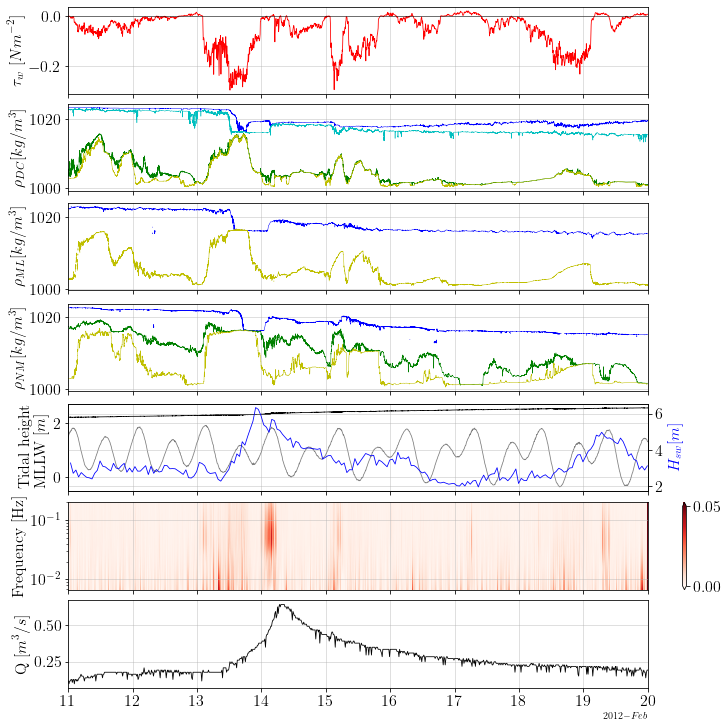

In [69]:
# #Ajustar limites colorbar
# umin = -0.1
# umax = 0.1
# vmin = -0.1
# vmax = 0.1
# level_boundaries_u = np.linspace(umin, umax, 400)
# level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax4, ax5, ax3, ax7, ax8, ax10) = plt.subplots(nrows=7, figsize=(10, 10), constrained_layout=True, sharex=True)


#Grafico velocidad viento

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
# ax2.text(datetime.datetime(2012,3,2,7,30,0), 0.07, "A",
#           fontsize=16)

ax3.set_ylabel(r"$\rho_{NM} [kg/m^3]$",
          fontsize=16)
ax3.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='bottom')
ax3.plot(nm.time, nm.sel(sensor=2, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.5, c="g", label='middle')
ax3.plot(nm.time, nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.5, c="y", label='surface')
# ax3.legend(loc='lower right',
#           fontsize=16);
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(datetime.datetime(2012,3,2,7,30,0), 1021, "D",
#           fontsize=16)


ax4.set_ylabel(r"$\rho_{DC} [kg/m^3]$",
          fontsize=16)
ax4.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='bottom')
ax4.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.5, c="c", label='mid-bottom')
ax4.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.5, c="g", label='mid-surface')
ax4.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.5, c="y", label='surface')

# ax4.legend(loc='lower right',
#           fontsize=16);
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)
# ax4.text(datetime.datetime(2012,3,2,7,30,0), 1021, "B",
#           fontsize=16)

ax5.set_ylabel(r"$\rho_{ML} [kg/m^3]$",
          fontsize=16)
ax5.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.5, c="b", label='bottom')
ax5.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.5, c="y", label='surface')

# ax5.legend(loc='lower right',
#           fontsize=16);
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)
# ax5.text(datetime.datetime(2012,3,2,7,30,0), 1021, "C",
#           fontsize=16)



# Grafico nivel del agua SF


ax7.set_ylabel(r"\noindent Tidal height\\MLLW "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='gray', lw=0.8, label="San Fco")
ax7.plot(dc.time, dc.sel(sensor=1, variables='Depth')-0.1423, c='k', linewidth=0.8, label="Pescadero")
# ax7.plot(mt.index, mt.values, c='g')
# ax7.legend(["San Fco", "Monterrey"], loc='upper right',
#           fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = 0
umax = 0.05
vmin = -0.05
vmax = 0.05
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

# Grafico water level estandarizada

ax6 = ax7.twinx()
ax6.set_ylabel(r"$H_{sw}[m]$",
          fontsize=16)
ax6.plot(hm.index, hm['WVHT'].values, c='b', linewidth=0.8)
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)
# ax6.text(datetime.datetime(2012,3,2,7,30,0), 5.5, "E",
#           fontsize=16)
ax6.yaxis.set_major_locator(tick.MultipleLocator(2))
ax6.yaxis.label.set_color("blue")

#Grafico de velocidad del agua (color map)
# ax8.set_title(r"Wavelet analysis",
#           fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.Reds,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.05))
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log") 
# ax8.text(datetime.datetime(2012,3,2,7,30,0), 0.1, "F",
#           fontsize=16)

# ax1.plot(dc.time, dc.sel(variables="Depth", sensor=1))
ax10.set_ylabel(r"Q "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax10.plot(q.index, q, lw=0.8, c='k')

ax10.xaxis.set_tick_params(labelsize=16)
ax10.yaxis.set_tick_params(labelsize=16)
ax10.grid(alpha=0.5)
# ax10.text(datetime.datetime(2012,3,2,7,30,0), 0.63, "G",
#           fontsize=16)

# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

In [ ]:
hm.index = hm.index + datetime.timedelta(minutes=10)

In [81]:
dc.sel(sensor=1, variables='Depth', time=hm.index[:-1])

<xarray.DataArray 'v' (time: 209)>
array([2.34153465, 2.34415177, 2.34468928, 2.3464171 , 2.34625006,
       2.34592448, 2.34939359, 2.34900612, 2.35184534, 2.35195215,
       2.35596727, 2.35361639, 2.3583852 , 2.36154833, 2.35926103,
       2.36087095, 2.36357787, 2.36593724, 2.36566933, 2.36936481,
       2.37011426, 2.37413362, 2.37596823, 2.37561216, 2.37477369,
       2.38058018, 2.37984179, 2.37991977, 2.38117957, 2.38368732,
       2.38480301, 2.38730228, 2.38661219, 2.38846716, 2.39089268,
       2.39157259, 2.39370816, 2.39389976, 2.39593191, 2.39627187,
       2.39778941, 2.39984614, 2.40321695, 2.40560771, 2.40734398,
       2.41228064, 2.41177027, 2.40889373, 2.41472481, 2.41583457,
       2.41369729, 2.41929948, 2.42120192, 2.42078396, 2.4251594 ,
       2.42513481, 2.43166192, 2.43373984, 2.43353043, 2.42547815,
       2.42549681, 2.42841997, 2.43375425, 2.43756931, 2.44172604,
       2.43999231, 2.43871979, 2.44281638, 2.44671198, 2.44922572,
       2.45198274, 2.45282885, 2.46446997, 2.48162096, 2.48814746,
       2.49413052, 2.49417376, 2.49644256, 2.50381768, 2.49936596,
       2.50288633, 2.50730503, 2.50546019, 2.50923031, 2.51357275,
       2.51437568, 2.51569328, 2.51874042, 2.52349247, 2.52823848,
       2.53108711, 2.53638407, 2.53646868, 2.5341152 , 2.53664768,
       2.53504274, 2.53561926, 2.536133  , 2.54793109, 2.55148459,
...
       2.55997342, 2.56609894, 2.56459999, 2.57014066, 2.57306426,
       2.57567496, 2.57657467, 2.57405654, 2.57655   , 2.57752177,
       2.57894867, 2.58007484, 2.5876581 , 2.58632063, 2.58490912,
       2.58907867, 2.58992293, 2.58747073, 2.59042127, 2.59111212,
       2.59411836, 2.59450653, 2.59875011, 2.60277751, 2.60156266,
       2.6042291 , 2.60660314, 2.6066371 , 2.6117919 , 2.61198341,
       2.60955172, 2.61539421, 2.61823875, 2.6161447 , 2.61943706,
       2.62172664, 2.62124274, 2.62286116, 2.6182736 , 2.62251524,
       2.62395869, 2.62398137, 2.62602605, 2.62799866, 2.6248092 ,
       2.62764861, 2.63066299, 2.63454429, 2.63561703, 2.63639534,
       2.63901857, 2.64188066, 2.63956012, 2.64247574, 2.64025609,
       2.64340645, 2.64537079, 2.64774899, 2.6481958 , 2.65169824,
       2.65303867, 2.65282247, 2.65483832, 2.66111021, 2.65684801,
       2.6486654 , 2.65029823, 2.65194548, 2.65290089, 2.65415485,
       2.6522914 , 2.65620768, 2.65764286, 2.65712398, 2.6571013 ,
       2.65802788, 2.65840263, 2.66513989, 2.6681955 , 2.66895114,
       2.67000331, 2.67187704, 2.67292509, 2.67642854, 2.67613716,
       2.67898071, 2.67840831, 2.67689701, 2.67723677, 2.67788749,
       2.68125405, 2.67663353, 2.682927  , 2.68304332, 2.68287036,
       2.6829506 , 2.69416215, 2.68493045, 2.68380512])
Coordinates:
  * time       (time) datetime64[ns] 2012-02-11T01:40:00 ... 2012-02-19T23:40:00
    variables  <U5 'Depth'
    sensor     int64 1

In [86]:
sf

,Verified (m)
index,
2012-02-11 00:00:00,1.497
2012-02-11 00:06:00,1.516
2012-02-11 00:12:00,1.557
2012-02-11 00:18:00,1.595
2012-02-11 00:24:00,1.600
...,...
2012-02-19 23:36:00,1.388
2012-02-19 23:42:00,1.356
2012-02-19 23:48:00,1.326


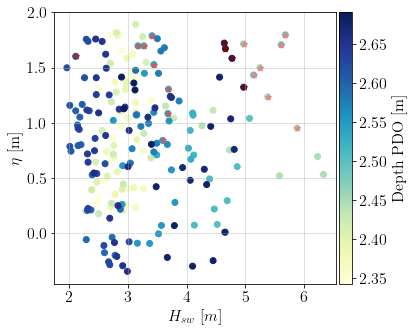

In [90]:
# hm.index = hm.index + datetime.timedelta(minutes=10)
fig, (ax1) = plt.subplots(nrows= 1, figsize=(6, 5))



scat = ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c=dc.sel(sensor=1, variables='Depth', time=hm.index).values, marker='o', cmap=cm.YlGnBu)
cbar2 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar2.ax.tick_params(labelsize=16)
cbar2.set_label("Depth PDO [m]", loc='center',
          fontsize=16)


# ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c="k")
ax1.scatter(hm['WVHT'].loc[datetime.date(2012,2,14):datetime.datetime(2012,2,14,6,0,0)].values, sf.loc[hm.index].loc[datetime.date(2012,2,14):datetime.datetime(2012,2,14,6,0,0)].values, c="lightcoral", marker = "*")
ax1.scatter(hm['WVHT'].loc[datetime.date(2012,2,15):datetime.datetime(2012,2,15,6,0,0)].values, sf.loc[hm.index].loc[datetime.date(2012,2,15):datetime.datetime(2012,2,15,6,0,0)].values, c="indianred", marker = "*")
ax1.scatter(hm['WVHT'].loc[datetime.datetime(2012,2,17,6,0,0):datetime.datetime(2012,2,17,6,40,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,17,6,0,0):datetime.datetime(2012,2,17,6,40,0)].values, c="brown", marker = "*")
ax1.scatter(hm['WVHT'].loc[datetime.datetime(2012,2,19,7,0,0):datetime.datetime(2012,2,19,10,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,19,7,0,0):datetime.datetime(2012,2,19,10,0,0)].values, c="maroon", marker = "*")
ax1.set_ylabel("$\eta$ [m]",
          fontsize=16)
ax1.set_xlabel("$H_{sw}$ "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

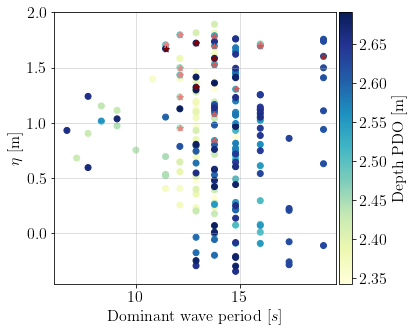

In [91]:
# hm.index = hm.index + datetime.timedelta(minutes=10)
fig, (ax1) = plt.subplots(nrows= 1, figsize=(6, 5))

scat = ax1.scatter(hm['DPD'].values, sf.loc[hm.index].values, c=dc.sel(sensor=1, variables='Depth', time=hm.index).values, marker='o', cmap=cm.YlGnBu)
cbar2 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar2.ax.tick_params(labelsize=16)
cbar2.set_label("Depth PDO [m]", loc='center',
          fontsize=16)


# ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c="k")
ax1.scatter(hm['DPD'].loc[datetime.date(2012,2,14):datetime.datetime(2012,2,14,6,0,0)].values, sf.loc[hm.index].loc[datetime.date(2012,2,14):datetime.datetime(2012,2,14,6,0,0)].values, c="lightcoral", marker = "*")
ax1.scatter(hm['DPD'].loc[datetime.date(2012,2,15):datetime.datetime(2012,2,15,6,0,0)].values, sf.loc[hm.index].loc[datetime.date(2012,2,15):datetime.datetime(2012,2,15,6,0,0)].values, c="indianred", marker = "*")
ax1.scatter(hm['DPD'].loc[datetime.datetime(2012,2,17,6,0,0):datetime.datetime(2012,2,17,6,40,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,17,6,0,0):datetime.datetime(2012,2,17,6,40,0)].values, c="brown", marker = "*")
ax1.scatter(hm['DPD'].loc[datetime.datetime(2012,2,19,7,0,0):datetime.datetime(2012,2,19,10,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,19,7,0,0):datetime.datetime(2012,2,19,10,0,0)].values, c="maroon", marker = "*")

ax1.set_ylabel("$\eta$ [m]",
          fontsize=16)
ax1.set_xlabel("Dominant wave period "
          r"$\displaystyle[s]$",
          fontsize=16)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

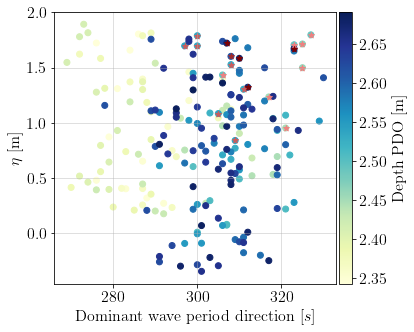

In [92]:
# hm.index = hm.index + datetime.timedelta(minutes=10)
fig, (ax1) = plt.subplots(nrows= 1, figsize=(6, 5))

scat = ax1.scatter(hm['MWD'].values, sf.loc[hm.index].values, c=dc.sel(sensor=1, variables='Depth', time=hm.index).values, marker='o', cmap=cm.YlGnBu)
cbar2 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar2.ax.tick_params(labelsize=16)
cbar2.set_label("Depth PDO [m]", loc='center',
          fontsize=16)


# ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c="k")
ax1.scatter(hm['MWD'].loc[datetime.date(2012,2,14):datetime.datetime(2012,2,14,6,0,0)].values, sf.loc[hm.index].loc[datetime.date(2012,2,14):datetime.datetime(2012,2,14,6,0,0)].values, c="lightcoral", marker = "*")
ax1.scatter(hm['MWD'].loc[datetime.date(2012,2,15):datetime.datetime(2012,2,15,6,0,0)].values, sf.loc[hm.index].loc[datetime.date(2012,2,15):datetime.datetime(2012,2,15,6,0,0)].values, c="indianred", marker = "*")
ax1.scatter(hm['MWD'].loc[datetime.datetime(2012,2,17,6,0,0):datetime.datetime(2012,2,17,6,40,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,17,6,0,0):datetime.datetime(2012,2,17,6,40,0)].values, c="brown", marker = "*")
ax1.scatter(hm['MWD'].loc[datetime.datetime(2012,2,19,7,0,0):datetime.datetime(2012,2,19,10,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,19,7,0,0):datetime.datetime(2012,2,19,10,0,0)].values, c="maroon", marker = "*")


ax1.set_ylabel("$\eta$ [m]",
          fontsize=16)
ax1.set_xlabel("Dominant wave period direction "
          r"$\displaystyle[s]$",
          fontsize=16)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

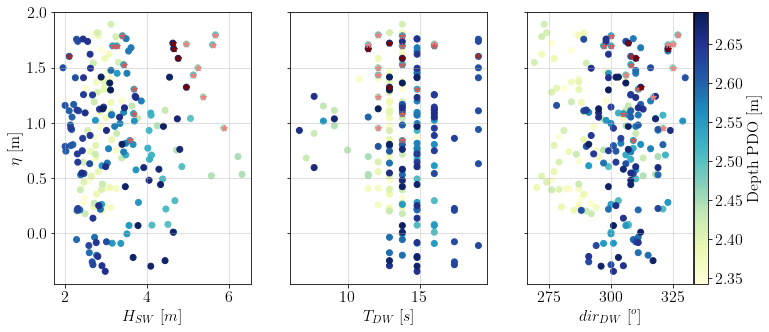

In [95]:
# hm.index = hm.index + datetime.timedelta(minutes=10)
fig, (ax1, ax2, ax3) = plt.subplots(ncols= 3, figsize=(12, 5), sharey=True)


scat = ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c=dc.sel(sensor=1, variables='Depth', time=hm.index).values, marker='o', cmap=cm.YlGnBu)
# cbar2 = fig.colorbar(scat, ax=ax1, pad=0.007)
# cbar2.ax.tick_params(labelsize=16)
# cbar2.set_label("Depth PDO [m]", loc='center',
#           fontsize=16)


# ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c="k")
ax1.scatter(hm['WVHT'].loc[datetime.date(2012,2,14):datetime.datetime(2012,2,14,6,0,0)].values, sf.loc[hm.index].loc[datetime.date(2012,2,14):datetime.datetime(2012,2,14,6,0,0)].values, c="lightcoral", marker = "*")
ax1.scatter(hm['WVHT'].loc[datetime.date(2012,2,15):datetime.datetime(2012,2,15,6,0,0)].values, sf.loc[hm.index].loc[datetime.date(2012,2,15):datetime.datetime(2012,2,15,6,0,0)].values, c="indianred", marker = "*")
ax1.scatter(hm['WVHT'].loc[datetime.datetime(2012,2,17,6,0,0):datetime.datetime(2012,2,17,6,40,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,17,6,0,0):datetime.datetime(2012,2,17,6,40,0)].values, c="brown", marker = "*")
ax1.scatter(hm['WVHT'].loc[datetime.datetime(2012,2,19,7,0,0):datetime.datetime(2012,2,19,10,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,19,7,0,0):datetime.datetime(2012,2,19,10,0,0)].values, c="maroon", marker = "*")
ax1.set_ylabel("$\eta$ [m]",
          fontsize=16)
ax1.set_xlabel("$H_{SW}$ "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)


scat = ax2.scatter(hm['DPD'].values, sf.loc[hm.index].values, c=dc.sel(sensor=1, variables='Depth', time=hm.index).values, marker='o', cmap=cm.YlGnBu)
# cbar2 = fig.colorbar(scat, ax=ax1, pad=0.007)
# cbar2.ax.tick_params(labelsize=16)
# cbar2.set_label("Depth PDO [m]", loc='center',
#           fontsize=16)


# ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c="k")
ax2.scatter(hm['DPD'].loc[datetime.date(2012,2,14):datetime.datetime(2012,2,14,6,0,0)].values, sf.loc[hm.index].loc[datetime.date(2012,2,14):datetime.datetime(2012,2,14,6,0,0)].values, c="lightcoral", marker = "*")
ax2.scatter(hm['DPD'].loc[datetime.date(2012,2,15):datetime.datetime(2012,2,15,6,0,0)].values, sf.loc[hm.index].loc[datetime.date(2012,2,15):datetime.datetime(2012,2,15,6,0,0)].values, c="indianred", marker = "*")
ax2.scatter(hm['DPD'].loc[datetime.datetime(2012,2,17,6,0,0):datetime.datetime(2012,2,17,6,40,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,17,6,0,0):datetime.datetime(2012,2,17,6,40,0)].values, c="brown", marker = "*")
ax2.scatter(hm['DPD'].loc[datetime.datetime(2012,2,19,7,0,0):datetime.datetime(2012,2,19,10,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,19,7,0,0):datetime.datetime(2012,2,19,10,0,0)].values, c="maroon", marker = "*")

# ax2.set_ylabel("$\eta$ [m]",
#           fontsize=16)
ax2.set_xlabel("$T_{DW}$ "
          r"$\displaystyle[s]$",
          fontsize=16)
ax2.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)


scat = ax3.scatter(hm['MWD'].values, sf.loc[hm.index].values, c=dc.sel(sensor=1, variables='Depth', time=hm.index).values, marker='o', cmap=cm.YlGnBu)
cbar2 = fig.colorbar(scat, ax=ax3, pad=0.007)
cbar2.ax.tick_params(labelsize=16)
cbar2.set_label("Depth PDO [m]", loc='center',
          fontsize=16)


# ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c="k")
ax3.scatter(hm['MWD'].loc[datetime.date(2012,2,14):datetime.datetime(2012,2,14,6,0,0)].values, sf.loc[hm.index].loc[datetime.date(2012,2,14):datetime.datetime(2012,2,14,6,0,0)].values, c="lightcoral", marker = "*")
ax3.scatter(hm['MWD'].loc[datetime.date(2012,2,15):datetime.datetime(2012,2,15,6,0,0)].values, sf.loc[hm.index].loc[datetime.date(2012,2,15):datetime.datetime(2012,2,15,6,0,0)].values, c="indianred", marker = "*")
ax3.scatter(hm['MWD'].loc[datetime.datetime(2012,2,17,6,0,0):datetime.datetime(2012,2,17,6,40,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,17,6,0,0):datetime.datetime(2012,2,17,6,40,0)].values, c="brown", marker = "*")
ax3.scatter(hm['MWD'].loc[datetime.datetime(2012,2,19,7,0,0):datetime.datetime(2012,2,19,10,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,19,7,0,0):datetime.datetime(2012,2,19,10,0,0)].values, c="maroon", marker = "*")


# ax3.set_ylabel("$\eta$ [m]",
#           fontsize=16)
ax3.set_xlabel("$dir_{DW}$ "
          r"$\displaystyle[^o]$",
          fontsize=16)
ax3.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)

In [37]:
hm

,WVHT,DPD,APD,MWD
index,,,,
2012-02-11 00:50:00,3.28,13.79,9.11,276.0
2012-02-11 01:50:00,2.71,13.79,8.66,286.0
2012-02-11 02:50:00,2.89,13.79,9.14,284.0
2012-02-11 03:50:00,2.51,13.79,8.59,281.0
2012-02-11 04:50:00,2.75,14.81,9.23,279.0
...,...,...,...,...
2012-02-20 19:50:00,2.10,12.90,8.74,305.0
2012-02-20 20:50:00,2.16,12.90,8.80,303.0
2012-02-20 21:50:00,2.25,12.90,9.03,288.0


## Feb 16

In [126]:
bu2 = UV_burst.sel(time=slice("2012-02-13 1:00:00","2012-02-13 17:30:00")).u
wdf = dfw['u'].loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]
sf = snfco.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]
hm = hmoon.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]
mt = mnty.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]
dc1 = DC_1.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]
dc2 = DC_2.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]
dc3 = DC_3.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]
dc4 = DC_4.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]

nm1 = NM_1.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]
nm2 = NM_2.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]
nm3 = NM_3.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]

ml1 = ML_1.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]
ml2 = ML_2.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]

pc1 = PC_1.loc[datetime.datetime(2012,2,13,1,0,0):datetime.datetime(2012,2,13,17,30,0)]

In [127]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

In [128]:
g = 9.81 # m/s^2

rho1 = nm1.loc[nm3.index]['densidad'].values
rho2 = nm2['densidad'].values
rho3 = nm3['densidad'].values
z1 = nm1.loc[nm3.index]['Depth'].values
z2 = nm2['Depth'].values
z3 = nm3['Depth'].values

### Potential energy anomaly

# Discretizacion 1
nm_rho_hat = (rho1*(z1 - z2)
              + rho2*(z2 - z3) 
              + rho3*z3)/z1

nm_pot = (g/(2*z1))*((rho3 - rho2)*(z3)**2
                     + (rho2 - rho1)*(z2)**2
                     + (rho1 - nm_rho_hat)*z1**2)

# 
# # Discretizacion 2
# nm_rho_hat = (0.5*rho1*(z1 - z2)
#               + 0.5*rho2*(z1 - z3) 
#               + 0.5*rho3*(z3 + z2))/z1

# nm_pot = (g/(2*z1))*(0.25*(rho3 - rho2)*(z3 + z2)**2 
#                                                   + 0.25*(rho2 - rho1)*(z2 + z1)**2 
#                                                   + (rho1 - nm_rho_hat)*(z1)**2)

nm_phi = pd.DataFrame(nm_pot,
                  index = nm3.index,
                  columns = ['potential_anomaly'])

### Buoyancy frequency

nm32_N2 = (g/(0.5*(rho3 + rho2)))*((rho3-rho2)/(z3-z2))
nm21_N2 = (g/(0.5*(rho2 + rho1)))*((rho2-rho1)/(z2-z1))
nm31_N2 = (g/(0.5*(rho3 + rho1)))*((rho3-rho1)/(z3-z1))

N2_nm32 = pd.DataFrame(nm32_N2,
                  index = nm3.index,
                  columns = ['N2 3-2'])



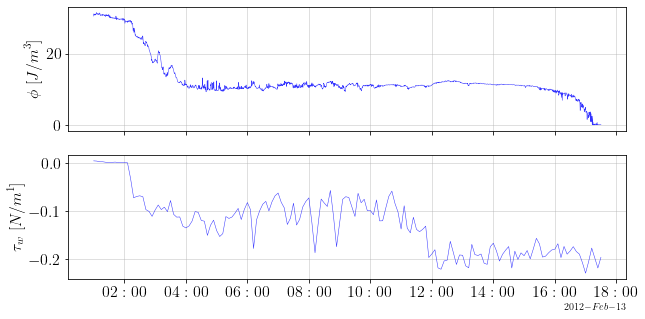

In [129]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 5), sharex=True)

ax1.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)
ax1.plot(nm3.index, nm_pot, c='b', alpha=0.8, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[N/m^1]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values, c='b', alpha=0.8, linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

In [130]:
i = np.linspace(0, len(nm_phi)-1, num=len(wdf)).astype(int)

X = nm_phi.iloc[i].values
y = wdf.values

reg = LinearRegression().fit(X, y)
y_pred = reg.predict(X)
coef = reg.coef_
print(reg.intercept_)
print(reg.coef_)

-0.2104780298044916
[0.0065768]


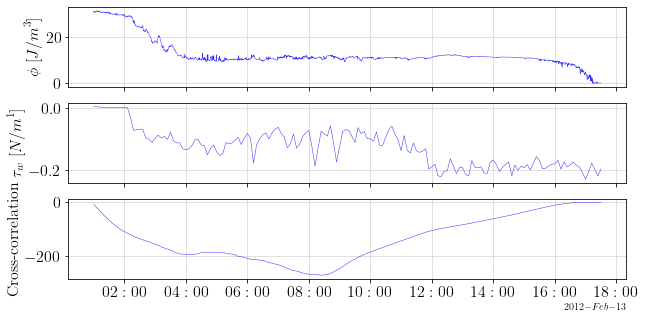

In [131]:
corr = signal.correlate(nm_phi.iloc[i].iloc[:, 0].values, wdf.values)
clock = np.linspace(0, len(nm_phi)-1, num=len(corr)).astype(int)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 5), sharex=True)

ax1.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)
ax1.plot(nm3.index, nm_pot, c='b', alpha=0.8, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax2.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[N/m^1]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values, c='b', alpha=0.8, linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax3.set_ylabel(r"Cross-correlation ",
          fontsize=16)
ax3.plot(nm_phi.iloc[clock].index, corr, c='b', alpha=0.8, linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

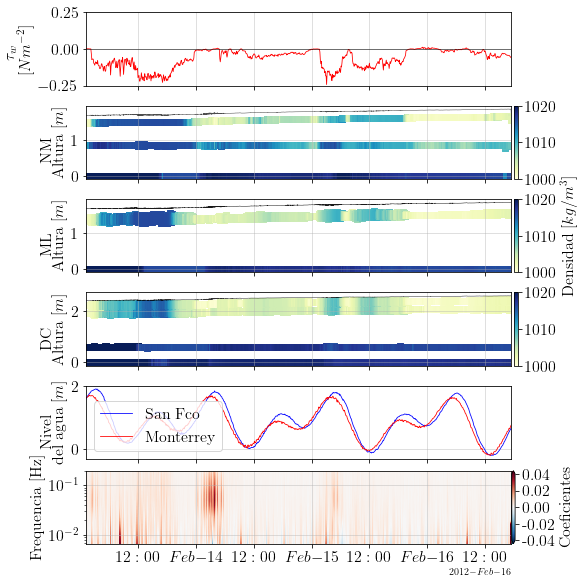

In [97]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax4, ax5, ax3, ax7, ax8) = plt.subplots(nrows=6, figsize=(8, 8), constrained_layout=True, sharex=True)

# fig = plt.figure(figsize=(10, 24), constrained_layout=True)
# gs = GridSpec(14, 1, figure=fig)

#Grafico de velocidad del agua (color map)
# ax1 = fig.add_subplot(gs[:3, 0])
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
# contourf_ = ax1.contourf(bu2.time, y_bin,
#                          np.transpose(bu2.values),
#                          levels=level_boundaries_u,
#                          cmap=cm.RdBu_r,
#                          vmax=umax, vmin=umin, extend='both')
# cbar = fig.colorbar(contourf_, ax=ax1, pad=0.007)
# cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.04))
# cbar.set_label("Velocity [$m/s$]", loc='center',
#           fontsize=16)
# ax1.set_ylabel(r"Depth "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax1.grid(alpha=0.5)
# ax1.set_ylim(1, 2.5)
# ax1.xaxis.set_tick_params(labelsize=16)
# ax1.yaxis.set_tick_params(labelsize=16)



#Grafico de profundidad y densidad (color map) DC
# ax3 = fig.add_subplot(gs[6, 0])
# ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
#           fontsize=16)
ax3.set_ylabel(r"DC \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.8, linewidth=0.5)
scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1020)
ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1020)
ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1020)
ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1020)
cbar2 = fig.colorbar(scat, ax=ax3, pad=0.007)
cbar2.ax.tick_params(labelsize=16)
# cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

# Grafico densidades NM
# ax4 = fig.add_subplot(gs[4, 0])
# ax4.set_title(r"Density calculated from temperature and salinity at NM [$kg/m^3$]",
#           fontsize=16)
ax4.set_ylabel(r"NM \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=16)
ax4.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.7, linewidth=0.5)
scat = ax4.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1020)
ax4.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1020)
ax4.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1020)
cbar3 = fig.colorbar(scat, ax=ax4, pad=0.007)
cbar3.ax.tick_params(labelsize=16)
# cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

#Grafico velocidad viento
# ax2 = fig.add_subplot(gs[3, 0])
# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$\\$[Nm^{-2}]$ ",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)

# Grafico densidades ML
# ax5 = fig.add_subplot(gs[5, 0])
# ax5.set_title(r"Density calculated from temperature and salinity at ML [$kg/m^3$]",
#           fontsize=16)
ax5.set_ylabel(r"ML \\ Altura $[m]$",
          fontsize=16)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.9, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1020)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1020)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.007)
cbar4.ax.tick_params(labelsize=16)
cbar4.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=16)
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)



# Grafico nivel del agua SF
# ax7 = fig.add_subplot(gs[9, 0])
# ax7.set_title(r"Tides at San Fco and Monterrey",
#           fontsize=16)
ax7.set_ylabel(r"Nivel \\ del agua "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='b', linewidth=0.8)
ax7.plot(mt.index, mt.values, c='r', linewidth=0.8)
ax7.legend(["San Fco", "Monterrey"], loc='lower left',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
vmin = -0.04
vmax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


#Grafico de velocidad del agua (color map)
# ax8 = fig.add_subplot(gs[10:13, 010:13])
# ax8.set_title(r"Wavelet analysis",
#           fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.001)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Frequencia [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha

ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

---

# __Feb 24th to Mar 3rd__


In [107]:
bu2 = UV_burst.sel(time=slice("2012-02-24 00:00:00","2012-03-03 00:00:00")).u
wdf = dfw['u'].loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]
sf = snfco.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]
mt = mnty.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]
hm = hmoon.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]
q = Q.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]

dc1 = DC_1.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]
dc2 = DC_2.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]
dc3 = DC_3.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]
dc4 = DC_4.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]

nm1 = NM_1.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]
nm2 = NM_2.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]
nm3 = NM_3.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]

ml1 = ML_1.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]
ml2 = ML_2.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]

pc1 = PC_1.loc[datetime.date(2012,2,24):datetime.date(2012,3,3)]

y_bin = np.linspace(0.91, 3.31, 25)

dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-24 00:00:00","2012-03-03 00:00:00")).v
nm = NM_CTD.sel(time=slice("2012-02-24 00:00:00","2012-03-03 00:00:00")).v
ml = ML_CTD.sel(time=slice("2012-02-24 00:00:00","2012-03-03 00:00:00")).v
pc = PC_CTD.sel(time=slice("2012-02-24 00:00:00","2012-03-03 00:00:00")).v

In [35]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

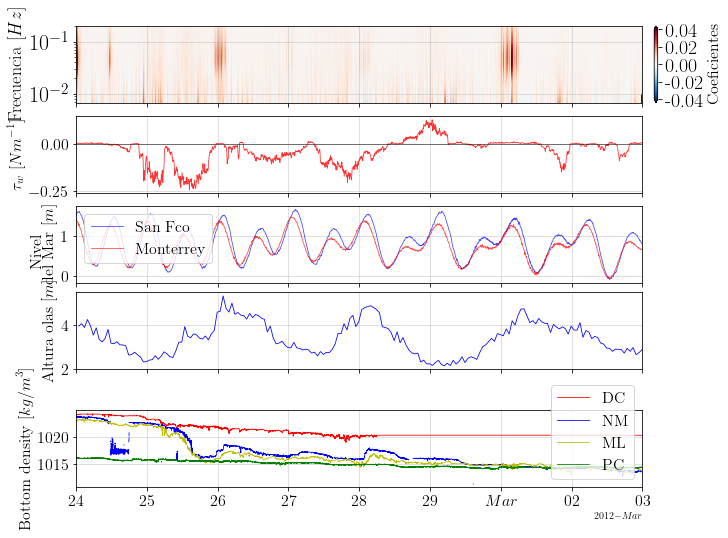

In [36]:
fig, (ax1, ax3, ax2, ax4, ax5) = plt.subplots(nrows=5, figsize=(10, 7), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

#Wavelet
contourf_ = ax1.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.007)
cbar.ax.tick_params(labelsize=20)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
# ax1.set_ylabel(r'Frequencia [Hz]',
#           fontsize=16)
ax1.set_ylabel(r"Frecuencia "
          r"$\displaystyle[Hz]$",
          fontsize=18)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.set_yscale("log")


ax2.plot(sf.index, sf.values, alpha=0.7, linewidth=0.8, c="b", label='San Fco');
ax2.plot(mt.index, mt.values, alpha=0.7, linewidth=0.8, c="r", label='Monterrey');
ax2.legend(loc='upper left',
          fontsize=16);
ax2.set_ylabel(r'Nivel\\del Mar [$m$]',
          fontsize=16)
ax2.grid(alpha=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)

ax4.set_ylabel(r"Altura olas "
          r"$\displaystyle[m]$",
          fontsize=16)
ax4.plot(hm.index, hm['WVHT'].values, c='b', linewidth=0.8)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

#Densidad fondo

ax5.set_ylabel(r"Bottom density "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax5.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.8, c="r", label='DC')
ax5.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='NM')
ax5.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.8, c="y", label='ML')
ax5.plot(pc.time, pc.sel(sensor=1, variables='Density'), lw=0.8, c='g', label='PC')

ax5.legend(loc='lower right',
          fontsize=16);
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

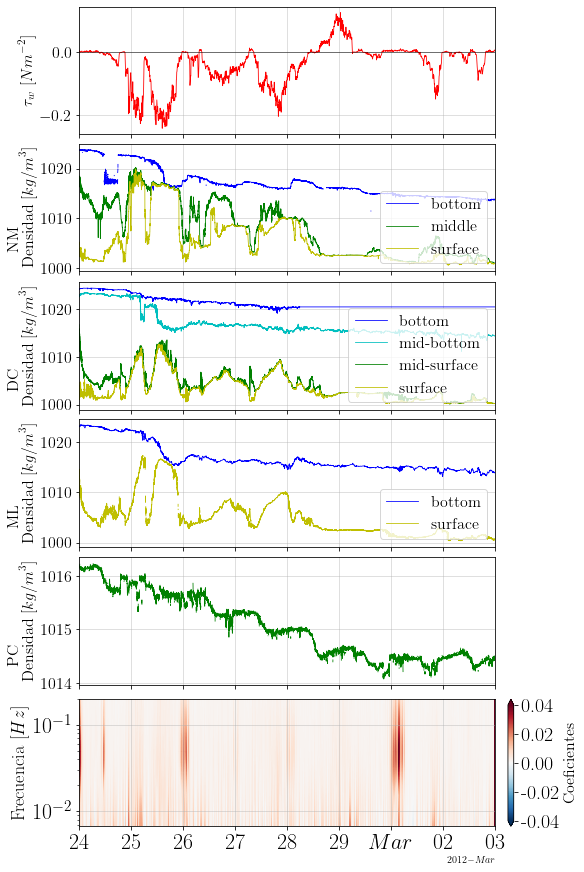

In [37]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

#Inicio figura
fig, (ax2, ax6, ax7, ax8, ax9, ax1) = plt.subplots(nrows=6, figsize=(8, 12), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax6.set_ylabel(r"NM\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax6.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax6.plot(nm.time, nm.sel(sensor=2, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="g", label='middle')
ax6.plot(nm.time, nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="y", label='surface')
ax6.legend(loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

ax7.set_ylabel(r"DC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax7.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax7.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.8, c="c", label='mid-bottom')
ax7.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.8, c="g", label='mid-surface')
ax7.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.8, c="y", label='surface')

ax7.legend(loc='lower right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

ax8.set_ylabel(r"ML\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax8.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax8.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.8, c="y", label='surface')

ax8.legend(loc='lower right',
          fontsize=16);
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.grid(alpha=0.5)

ax9.set_ylabel(r"PC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax9.plot(pc.time, pc.sel(sensor=1, variables='Density'), lw=0.8, c='g')

ax9.xaxis.set_tick_params(labelsize=16)
ax9.yaxis.set_tick_params(labelsize=16)
ax9.grid(alpha=0.5)

#Wavelet
contourf_ = ax1.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.007)
cbar.ax.tick_params(labelsize=20)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
# ax1.set_ylabel(r'Frequencia [Hz]',
#           fontsize=16)
ax1.set_ylabel(r"Frecuencia "
          r"$\displaystyle[Hz]$",
          fontsize=18)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.set_yscale("log")

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

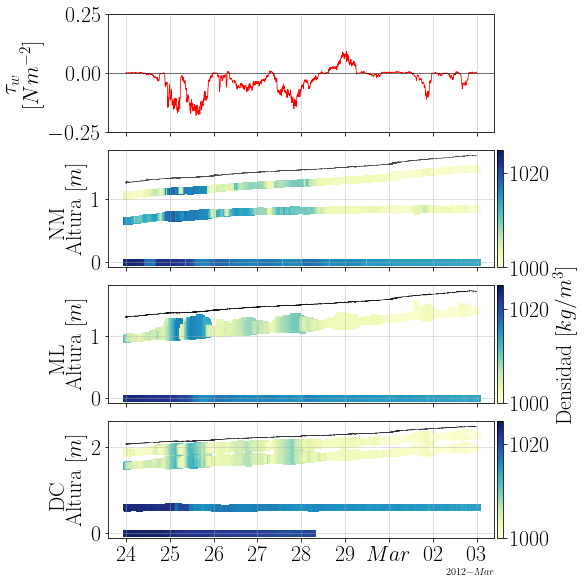

In [67]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax4, ax5, ax3) = plt.subplots(nrows=4, figsize=(8, 8), constrained_layout=True, sharex=True)

# fig = plt.figure(figsize=(10, 24), constrained_layout=True)
# gs = GridSpec(14, 1, figure=fig)

#Grafico de velocidad del agua (color map)
# ax1 = fig.add_subplot(gs[:3, 0])
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
# contourf_ = ax1.contourf(bu2.time, y_bin,
#                          np.transpose(bu2.values),
#                          levels=level_boundaries_u,
#                          cmap=cm.RdBu_r,
#                          vmax=umax, vmin=umin, extend='both')
# cbar = fig.colorbar(contourf_, ax=ax1, pad=0.007)
# cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.04))
# cbar.set_label("Velocity [$m/s$]", loc='center',
#           fontsize=16)
# ax1.set_ylabel(r"Depth "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax1.grid(alpha=0.5)
# ax1.set_ylim(1, 2.5)
# ax1.xaxis.set_tick_params(labelsize=16)
# ax1.yaxis.set_tick_params(labelsize=16)



#Grafico de profundidad y densidad (color map) DC
# ax3 = fig.add_subplot(gs[6, 0])
# ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
#           fontsize=16)
ax3.set_ylabel(r"DC \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.8, linewidth=0.5)
scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax3, pad=0.007)
cbar2.ax.tick_params(labelsize=22)
# cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax3.xaxis.set_tick_params(labelsize=22)
ax3.yaxis.set_tick_params(labelsize=22)
ax3.grid(alpha=0.5)

# Grafico densidades NM
# ax4 = fig.add_subplot(gs[4, 0])
# ax4.set_title(r"Density calculated from temperature and salinity at NM [$kg/m^3$]",
#           fontsize=16)
ax4.set_ylabel(r"NM \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax4.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.7, linewidth=0.5)
scat = ax4.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax4, pad=0.007)
cbar3.ax.tick_params(labelsize=22)
# cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax4.xaxis.set_tick_params(labelsize=22)
ax4.yaxis.set_tick_params(labelsize=22)
ax4.grid(alpha=0.5)

#Grafico velocidad viento
# ax2 = fig.add_subplot(gs[3, 0])
# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"$\tau_w$\\$[Nm^{-2}]$ ",
          fontsize=22)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=22)
ax2.yaxis.set_tick_params(labelsize=22)
ax2.grid(alpha=0.5)
ax2.set_ylim(-0.25, 0.25)

# Grafico densidades ML
# ax5 = fig.add_subplot(gs[5, 0])
# ax5.set_title(r"Density calculated from temperature and salinity at ML [$kg/m^3$]",
#           fontsize=16)
ax5.set_ylabel(r"ML \\ Altura $[m]$",
          fontsize=22)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.9, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.007)
cbar4.ax.tick_params(labelsize=22)
cbar4.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=22)
ax5.xaxis.set_tick_params(labelsize=22)
ax5.yaxis.set_tick_params(labelsize=22)
ax5.grid(alpha=0.5)


#Ajustar limites colorbar
umin = -0.04
umax = 0.04
vmin = -0.04
vmax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)




# Ajustar formato fecha

ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

## wind-induced setup

In [107]:
#NM

rho1 = nm1.loc[wdf.index]['densidad'].values
rho2 = nm2.loc[wdf.index]['densidad'].values
rho3 = nm3.loc[wdf.index]['densidad'].values
z1 = nm1.loc[wdf.index]['Depth'].values
z2 = nm2.loc[wdf.index]['Depth'].values
z3 = nm3.loc[wdf.index]['Depth'].values

nm_rho_hat = (rho1*(z1 - z2)
              + rho2*(z2 - z3) 
              + rho3*z3)/z1

nm_h = z1

#DC

rho1 = dc1.loc[wdf.index]['densidad'].values
rho2 = dc2.loc[wdf.index]['densidad'].values
rho3 = dc3.loc[wdf.index]['densidad'].values
rho4 = dc4['densidad'].mean()
z1 = dc1.loc[wdf.index]['Depth'].values
z2 = dc2.loc[wdf.index]['Depth'].values
z3 = dc3.loc[wdf.index]['Depth'].values
z4 = dc4.loc[wdf.index]['Depth'].values

dc_rho_hat = (rho1*(z1 - z2)
              + rho2*(z2 - z3) 
              + rho3*(z3 - z4)
              + rho4*z4)/z1

dc_h = z1

#ML

rho1 = ml1.loc[wdf.index]['densidad'].values
rho2 = ml2.loc[wdf.index]['densidad'].values

z1 = ml1.loc[wdf.index]['Depth'].values
z2 = ml2.loc[wdf.index]['Depth'].values

ml_rho_hat = (rho1*(z1 - z2)
              + rho2*z2)/z1   

ml_h = z1  

# PC

rho1 = pc1.loc[wdf.index]['densidad'].values
rho2 = ml2.loc[wdf.index]['densidad'].values

z1 = pc1.loc[wdf.index]['Depth'].values
z2 = ml2.loc[wdf.index]['Depth'].values

ml_rho_hat = (rho1*(z1 - z2)
              + rho2*z2)/z1   

ml_h = z1  

In [108]:
### Spected

g = 9.81 #m/s

rho_avg = (nm_rho_hat + ml_rho_hat)/2
h_avg = (nm_h + dc_h + ml_h)/3

exp_dndx = wdf.values/(rho_avg*h_avg*g)

In [109]:
### Measured

x = haversine(37.264055556, -122.410333333, 37.264861111, -122.410527778)*1000
eta_dc = dc1['Depth'].values - dc1['Depth'].mean()
eta_ml = ml1['Depth'].values - ml1['Depth'].mean()
mes_dndx = (eta_dc - eta_ml)/x


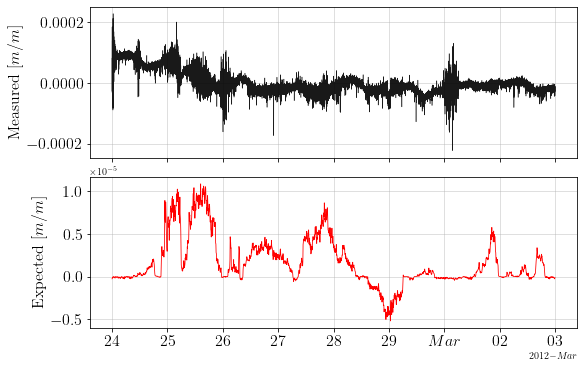

In [110]:
#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(8, 5), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"Expected "
          r"$\displaystyle[m/m]$",
          fontsize=16)
ax2.plot(wdf.index, -exp_dndx,color='r', linewidth=0.8)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax1.set_ylabel(r"Measured "
          r"$\displaystyle[m/m]$",
          fontsize=16)
ax1.plot(nm1.index, mes_dndx, c='k', alpha=0.9, linewidth=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
ax1.grid(alpha=0.5)

ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

Mezcla?

In [65]:
dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-24 00:00:00","2012-02-26 06:00:00")).v
nm = NM_CTD.sel(time=slice("2012-02-24 00:00:00","2012-02-26 06:00:00")).v
ml = ML_CTD.sel(time=slice("2012-02-24 00:00:00","2012-02-26 06:00:00")).v
pc = PC_CTD.sel(time=slice("2012-02-24 00:00:00","2012-02-26 06:00:00")).v
wdf = dfw['u'].loc[datetime.date(2012,2,24):datetime.date(2012,2,26)]


In [66]:
dcA = dc.sel(time=datetime.datetime(2012,2,24,6,10,0))
nmA = nm.sel(time=datetime.datetime(2012,2,24,6,10,0))
mlA = ml.sel(time=datetime.datetime(2012,2,24,6,10,0))

dcB = dc.sel(time=datetime.datetime(2012,2,25,5,0,0))
nmB = nm.sel(time=datetime.datetime(2012,2,25,5,0,0))
mlB = ml.sel(time=datetime.datetime(2012,2,25,5,0,0))

dcC = dc.sel(time=datetime.datetime(2012,2,25,8,10,0))
nmC = nm.sel(time=datetime.datetime(2012,2,25,8,10,0))
mlC = ml.sel(time=datetime.datetime(2012,2,25,8,10,0))

dcD = dc.sel(time=datetime.datetime(2012,2,25,16,10,0))
nmD = nm.sel(time=datetime.datetime(2012,2,25,16,10,0))
mlD = ml.sel(time=datetime.datetime(2012,2,25,16,10,0))

dcE = dc.sel(time=datetime.datetime(2012,2,26,0,30,0))
nmE = nm.sel(time=datetime.datetime(2012,2,26,0,30,0))
mlE = ml.sel(time=datetime.datetime(2012,2,26,0,30,0))

Text(0.5, 1.0, 'DC')

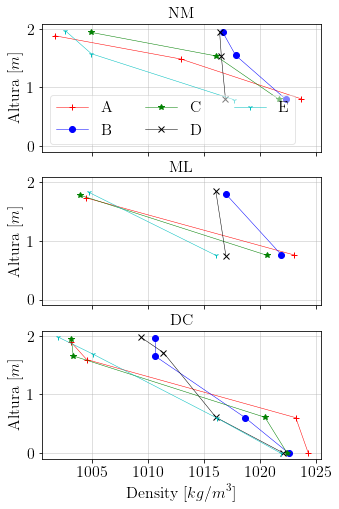

In [103]:
fig, (ax1,ax2,ax3) = plt.subplots(nrows=3, figsize=(5, 8), sharey=True, sharex=True)

ax1.plot(nmA.sel(variables='Density'), nmA.sel(variables='Depth2'), marker='+',color='r',linewidth=0.5)
ax1.plot(nmB.sel(variables='Density'), nmB.sel(variables='Depth2'), marker='o',color='b',linewidth=0.5)
ax1.plot(nmC.sel(variables='Density'), nmC.sel(variables='Depth2'), marker='*',color='g',linewidth=0.5)
ax1.plot(nmD.sel(variables='Density'), nmD.sel(variables='Depth2'), marker='x',color='k',linewidth=0.5)
ax1.plot(nmE.sel(variables='Density'), nmE.sel(variables='Depth2'), marker='1',color='c',linewidth=0.5)



# ax1.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax1.set_title(r"NM",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
# ax1.legend(["Antes", "Durante", "Después"], loc='lower left',
#           fontsize=16);
ax1.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)

ax2.plot(mlA.sel(variables='Density'), mlA.sel(variables='Depth2'), marker='+',color='r',linewidth=0.5)
ax2.plot(mlB.sel(variables='Density'), mlB.sel(variables='Depth2'), marker='o',color='b',linewidth=0.5)
ax2.plot(mlC.sel(variables='Density'), mlC.sel(variables='Depth2'), marker='*',color='g',linewidth=0.5)
ax2.plot(mlD.sel(variables='Density'), mlD.sel(variables='Depth2'), marker='x',color='k',linewidth=0.5)
ax2.plot(mlE.sel(variables='Density'), mlE.sel(variables='Depth2'), marker='1',color='c',linewidth=0.5)

# ax2.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax2.grid(alpha=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.set_title(r"ML",
          fontsize=16)
ax2.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)

ax3.plot(dcA.sel(variables='Density'), dcA.sel(variables='Depth2'), marker='+',color='r',linewidth=0.5)
ax3.plot(dcB.sel(variables='Density'), dcB.sel(variables='Depth2'), marker='o',color='b',linewidth=0.5)
ax3.plot(dcC.sel(variables='Density'), dcC.sel(variables='Depth2'), marker='*',color='g',linewidth=0.5)
ax3.plot(dcD.sel(variables='Density'), dcD.sel(variables='Depth2'), marker='x',color='k',linewidth=0.5)
ax3.plot(dcE.sel(variables='Density'), dcE.sel(variables='Depth2'), marker='1',color='c',linewidth=0.5)

ax3.set_xlabel(r"Density "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax3.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax1.legend(["A", "B", "C", "D", "E"], loc='lower left', ncol=3, framealpha=0.5,
          fontsize=16);
ax3.set_title(r"DC",
          fontsize=16)



Text(0.5, 1.0, 'DC')

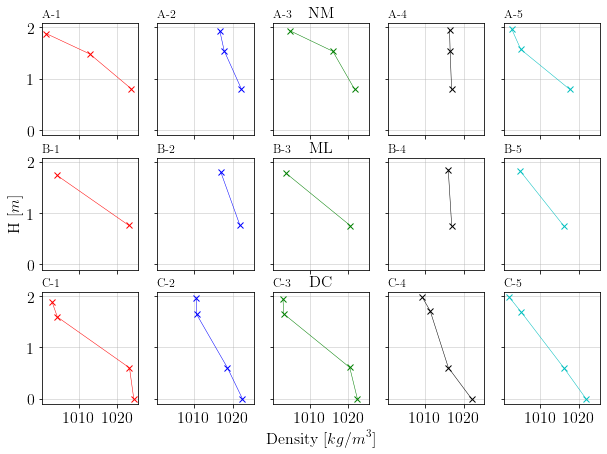

In [72]:
fig, ([[ax1a, ax1b, ax1c, ax1d, ax1e],[ax2a, ax2b, ax2c, ax2d, ax2e],[ax3a, ax3b, ax3c, ax3d, ax3e]]) = plt.subplots(nrows=3, ncols=5, figsize=(10, 7), sharey=True, sharex=True)

ax1a.plot(nmA.sel(variables='Density'), nmA.sel(variables='Depth2'), marker='x',color='r',linewidth=0.5)
ax1b.plot(nmB.sel(variables='Density'), nmB.sel(variables='Depth2'), marker='x',color='b',linewidth=0.5)
ax1c.plot(nmC.sel(variables='Density'), nmC.sel(variables='Depth2'), marker='x',color='g',linewidth=0.5)
ax1d.plot(nmD.sel(variables='Density'), nmD.sel(variables='Depth2'), marker='x',color='k',linewidth=0.5)
ax1e.plot(nmE.sel(variables='Density'), nmE.sel(variables='Depth2'), marker='x',color='c',linewidth=0.5)



# ax1.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax1c.set_title(r"NM",
          fontsize=16)
ax1a.grid(alpha=0.5)
ax1b.grid(alpha=0.5)
ax1c.grid(alpha=0.5)
ax1d.grid(alpha=0.5)
ax1e.grid(alpha=0.5)
ax1a.xaxis.set_tick_params(labelsize=16)
ax1a.yaxis.set_tick_params(labelsize=16)
# ax1.legend(["Antes", "Durante", "Después"], loc='lower left',
#           fontsize=16);
ax1a.set_title('A-1', loc='left')
ax1b.set_title('A-2', loc='left')
ax1c.set_title('A-3', loc='left')
ax1d.set_title('A-4', loc='left')
ax1e.set_title('A-5', loc='left')

ax2a.plot(mlA.sel(variables='Density'), mlA.sel(variables='Depth2'), marker='x',color='r',linewidth=0.5)
ax2b.plot(mlB.sel(variables='Density'), mlB.sel(variables='Depth2'), marker='x',color='b',linewidth=0.5)
ax2c.plot(mlC.sel(variables='Density'), mlC.sel(variables='Depth2'), marker='x',color='g',linewidth=0.5)
ax2d.plot(mlD.sel(variables='Density'), mlD.sel(variables='Depth2'), marker='x',color='k',linewidth=0.5)
ax2e.plot(mlE.sel(variables='Density'), mlE.sel(variables='Depth2'), marker='x',color='c',linewidth=0.5)

# ax2.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax2a.grid(alpha=0.5)
ax2b.grid(alpha=0.5)
ax2c.grid(alpha=0.5)
ax2d.grid(alpha=0.5)
ax2e.grid(alpha=0.5)

ax2a.xaxis.set_tick_params(labelsize=16)
ax2a.yaxis.set_tick_params(labelsize=16)
ax2c.set_title(r"ML",
          fontsize=16)
ax2a.set_ylabel(r"H "
          r"$\displaystyle[m]$",
          fontsize=16)

ax2a.set_title('B-1', loc='left')
ax2b.set_title('B-2', loc='left')
ax2c.set_title('B-3', loc='left')
ax2d.set_title('B-4', loc='left')
ax2e.set_title('B-5', loc='left')

ax3a.plot(dcA.sel(variables='Density'), dcA.sel(variables='Depth2'), marker='x',color='r',linewidth=0.5)
ax3b.plot(dcB.sel(variables='Density'), dcB.sel(variables='Depth2'), marker='x',color='b',linewidth=0.5)
ax3c.plot(dcC.sel(variables='Density'), dcC.sel(variables='Depth2'), marker='x',color='g',linewidth=0.5)
ax3d.plot(dcD.sel(variables='Density'), dcD.sel(variables='Depth2'), marker='x',color='k',linewidth=0.5)
ax3e.plot(dcE.sel(variables='Density'), dcE.sel(variables='Depth2'), marker='x',color='c',linewidth=0.5)

ax3c.set_xlabel(r"Density "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)

ax3a.set_title('C-1', loc='left')
ax3b.set_title('C-2', loc='left')
ax3c.set_title('C-3', loc='left')
ax3d.set_title('C-4', loc='left')
ax3e.set_title('C-5', loc='left')

ax3a.grid(alpha=0.5)
ax3b.grid(alpha=0.5)
ax3c.grid(alpha=0.5)
ax3d.grid(alpha=0.5)
ax3e.grid(alpha=0.5)
ax3a.xaxis.set_tick_params(labelsize=16)
ax3a.yaxis.set_tick_params(labelsize=16)
ax3b.xaxis.set_tick_params(labelsize=16)
ax3c.xaxis.set_tick_params(labelsize=16)
ax3d.xaxis.set_tick_params(labelsize=16)
ax3e.xaxis.set_tick_params(labelsize=16)
# ax3.legend(["A", "B", "C", "D", "E"], loc='lower left', ncol=2,
#           fontsize=16);
ax3c.set_title(r"DC",
          fontsize=16)



Text(0.5, 0, 'Velocity $\\displaystyle[m/s]$')

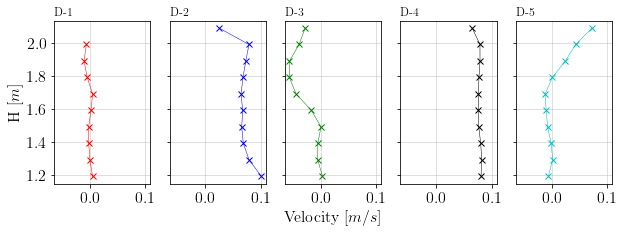

In [71]:
bua = bu2.sel(time=slice("2012-02-24 06:10:00","2012-02-24 6:20:30"))
bub = bu2.sel(time=slice("2012-02-25 5:00:00","2012-02-25 5:05:10"))
buc = bu2.sel(time=slice("2012-02-25 8:10:00","2012-02-25 8:25:10"))
bud = bu2.sel(time=slice("2012-02-25 16:10:00","2012-02-25 16:25:10"))
bue = bu2.sel(time=slice("2012-02-26 00:30:00","2012-02-26 0:35:10"))

fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(ncols=5, figsize=(10, 3), sharey=True, sharex=True)

ax1.plot( bua.values[0,:] ,bua.bin, marker='x',color='r',linewidth=0.5)
ax2.plot( bub.values[0,:] ,bub.bin, marker='x',color='b',linewidth=0.5)
ax3.plot( buc.values[0,:] ,buc.bin, marker='x',color='g',linewidth=0.5)
ax4.plot( bud.values[0,:] ,bud.bin, marker='x',color='k',linewidth=0.5)
ax5.plot( bue.values[0,:] ,bue.bin, marker='x',color='c',linewidth=0.5)

ax1.set_title('D-1', loc='left')
ax2.set_title('D-2', loc='left')
ax3.set_title('D-3', loc='left')
ax4.set_title('D-4', loc='left')
ax5.set_title('D-5', loc='left')

# ax1.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
# ax3.set_title(r"Velocity profiles",
#           fontsize=16)
ax1.grid(alpha=0.5)
ax2.grid(alpha=0.5)
ax3.grid(alpha=0.5)
ax4.grid(alpha=0.5)
ax5.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax2.xaxis.set_tick_params(labelsize=16)
ax3.xaxis.set_tick_params(labelsize=16)
ax4.xaxis.set_tick_params(labelsize=16)
ax5.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
# ax1.legend(["Antes", "Durante", "Después"], loc='lower left',
#           fontsize=16);
ax1.set_ylabel(r"H "
          r"$\displaystyle[m]$",
          fontsize=16)

ax3.set_xlabel(r"Velocity "
          r"$\displaystyle[m/s]$",
          fontsize=16)

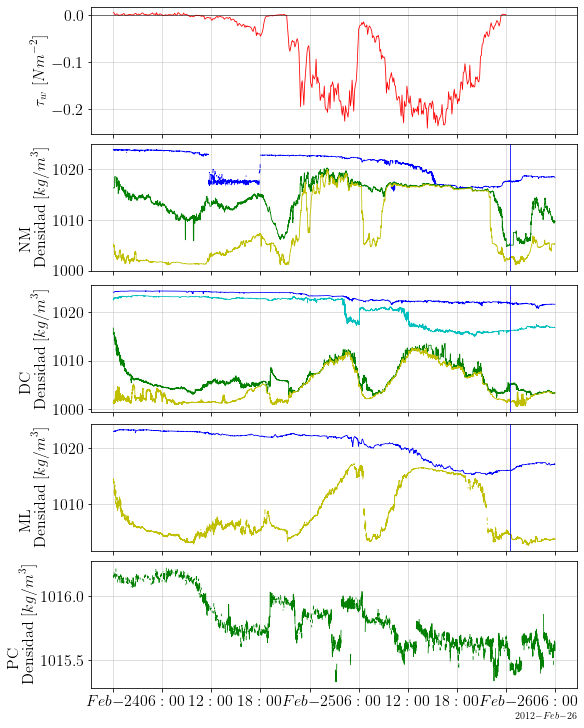

In [85]:
linea = datetime.datetime(2012,2,26,0,30,0)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

#Inicio figura
fig, (ax2, ax6, ax7, ax8, ax9) = plt.subplots(nrows=5, figsize=(8, 10), constrained_layout=True, sharex=True)

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax6.set_ylabel(r"NM\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax6.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax6.plot(nm.time, nm.sel(sensor=2, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="g", label='middle')
ax6.plot(nm.time, nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="y", label='surface')

ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)
ax6.axvline(x=linea, lw=0.8, color='b')

ax7.set_ylabel(r"DC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax7.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax7.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.8, c="c", label='mid-bottom')
ax7.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.8, c="g", label='mid-surface')
ax7.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.8, c="y", label='surface')
ax7.axvline(x=linea, lw=0.8, color='b')


ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

ax8.set_ylabel(r"ML\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax8.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax8.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.8, c="y", label='surface')
ax8.axvline(x=linea, lw=0.8, color='b')

ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.grid(alpha=0.5)

ax9.set_ylabel(r"PC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax9.plot(pc.time, pc.sel(sensor=1, variables='Density'), lw=0.8, c='g')

ax9.xaxis.set_tick_params(labelsize=16)
ax9.yaxis.set_tick_params(labelsize=16)
ax9.grid(alpha=0.5)


ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [70]:
#antes
dc1a = DC_1.loc[datetime.datetime(2012,2,24,3,0,0)]
dc2a = DC_2.loc[datetime.datetime(2012,2,24,3,0,0)]
dc3a = DC_3.loc[datetime.datetime(2012,2,24,3,0,0)]
dc4a = DC_4.loc[datetime.datetime(2012,2,24,3,0,0)]
# dc1a.append(dc2a)

nm1a = NM_1.loc[datetime.datetime(2012,2,24,3,0,0)]
nm2a = NM_2.loc[datetime.datetime(2012,2,24,3,0,0)]
nm3a = NM_3.loc[datetime.datetime(2012,2,24,3,0,0)]

ml1a = ML_1.loc[datetime.datetime(2012,2,24,3,0,0)]
ml2a = ML_2.loc[datetime.datetime(2012,2,24,3,0,0):datetime.datetime(2012,2,24,3,0,1)]
#durante
dc1du = DC_1.loc[datetime.datetime(2012,2,25,2,0,0)]
dc2du = DC_2.loc[datetime.datetime(2012,2,25,2,0,0)]
dc3du = DC_3.loc[datetime.datetime(2012,2,25,2,0,0)]
dc4du = DC_4.loc[datetime.datetime(2012,2,25,2,0,0)]

nm1du = NM_1.loc[datetime.datetime(2012,2,25,2,0,0)]
nm2du = NM_2.loc[datetime.datetime(2012,2,25,2,0,0)]
nm3du = NM_3.loc[datetime.datetime(2012,2,25,2,0,0)]

ml1du = ML_1.loc[datetime.datetime(2012,2,25,2,0,0)]
ml2du = ML_2.loc[datetime.datetime(2012,2,25,2,0,0):datetime.datetime(2012,2,25,2,0,1)]

#durante2
dc1du2 = DC_1.loc[datetime.datetime(2012,2,25,14,0,0)]
dc2du2 = DC_2.loc[datetime.datetime(2012,2,25,14,0,0)]
dc3du2 = DC_3.loc[datetime.datetime(2012,2,25,14,0,0)]
dc4du2 = DC_4.loc[datetime.datetime(2012,2,25,14,0,0)]

nm1du2 = NM_1.loc[datetime.datetime(2012,2,25,14,0,0)]
nm2du2 = NM_2.loc[datetime.datetime(2012,2,25,14,0,0)]
nm3du2 = NM_3.loc[datetime.datetime(2012,2,25,14,0,0)]

ml1du2 = ML_1.loc[datetime.datetime(2012,2,25,14,0,0)]
ml2du2 = ML_2.loc[datetime.datetime(2012,2,25,14,0,0):datetime.datetime(2012,2,25,14,0,1)]

#despues

dc1d = DC_1.loc[datetime.datetime(2012,2,26,0,0,0)]
dc2d = DC_2.loc[datetime.datetime(2012,2,26,0,0,0)]
dc3d = DC_3.loc[datetime.datetime(2012,2,26,0,0,0)]
dc4d = DC_4.loc[datetime.datetime(2012,2,26,0,0,0)]

nm1d = NM_1.loc[datetime.datetime(2012,2,26,0,0,0)]
nm2d = NM_2.loc[datetime.datetime(2012,2,26,0,0,0)]
nm3d = NM_3.loc[datetime.datetime(2012,2,26,0,0,0)]

ml1d = ML_1.loc[datetime.datetime(2012,2,26,0,0,0)]
ml2d = ML_2.loc[datetime.datetime(2012,2,26,0,0,0):datetime.datetime(2012,2,26,0,0,1)]

In [ ]:
ml2d

,Depth,Salinity,Temperature,densidad
Datetime,,,,


C:\Users\Dhannai\miniconda3\envs\msc\lib\site-packages\numpy\core\shape_base.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  ary = asanyarray(ary)


Text(0.5, 1.0, 'DC')

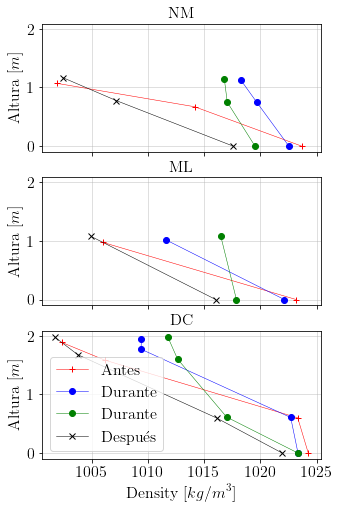

In [71]:
fig, (ax1,ax2,ax3) = plt.subplots(nrows=3, figsize=(5, 8), sharey=True, sharex=True)

ax1.plot([nm1a['densidad'], nm2a['densidad'], nm3a['densidad']], [nm1a['Depth']-nm1a['Depth'], nm1a['Depth']-nm2a['Depth'], nm1a['Depth']-nm3a['Depth']], marker='+',color='r',linewidth=0.5)
ax1.plot([nm1du['densidad'],nm2du['densidad'], nm3du['densidad']], [nm1du['Depth']-nm1du['Depth'], nm1du['Depth']-nm2du['Depth'], nm1du['Depth']-nm3du['Depth']], marker='o',color='b',linewidth=0.5)
ax1.plot([nm1du2['densidad'],nm2du2['densidad'], nm3du2['densidad']], [nm1du2['Depth']-nm1du2['Depth'], nm1du2['Depth']-nm2du2['Depth'], nm1du2['Depth']-nm3du2['Depth']], marker='o',color='g',linewidth=0.5)
ax1.plot([nm1d['densidad'],nm2d['densidad'], nm3d['densidad']], [nm1d['Depth']-nm1d['Depth'], nm1d['Depth']-nm2d['Depth'], nm1d['Depth']-nm3d['Depth']], marker='x',color='k',linewidth=0.5)



# ax1.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax1.set_title(r"NM",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
# ax1.legend(["Antes", "Durante", "Después"], loc='lower left',
#           fontsize=16);
ax1.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)

ax2.plot([ml1a['densidad'],ml2a['densidad']], [ml1a['Depth']-ml1a['Depth'], ml1a['Depth']-ml2a['Depth']], marker='+',color='r',linewidth=0.5)
ax2.plot([ml1du['densidad'],ml2du['densidad']], [ml1du['Depth']-ml1du['Depth'], ml1du['Depth']-ml2du['Depth']], marker='o',color='b',linewidth=0.5)
ax2.plot([ml1du2['densidad'],ml2du2['densidad']], [ml1du2['Depth']-ml1du2['Depth'], ml1du2['Depth']-ml2du2['Depth']], marker='o',color='g',linewidth=0.5)
ax2.plot([ml1d['densidad'],ml2d['densidad']], [ml1d['Depth']-ml1d['Depth'], ml1d['Depth']-ml2d['Depth']], marker='x',color='k',linewidth=0.5)

# ax2.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax2.grid(alpha=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.set_title(r"ML",
          fontsize=16)
ax2.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)

ax3.plot([dc1a['densidad'],dc2a['densidad'],dc3a['densidad'],dc4a['densidad']]
             , [dc1a['Depth']-dc1a['Depth'], dc1a['Depth']-dc2a['Depth'], dc1a['Depth']-dc3a['Depth'], dc1a['Depth']-dc4a['Depth']], marker='+',color='r',linewidth=0.5)
ax3.plot([dc1du['densidad'],dc2du['densidad'],dc3du['densidad'],dc4du['densidad']]
             , [dc1du['Depth']-dc1du['Depth'], dc1du['Depth']-dc2du['Depth'], dc1du['Depth']-dc3du['Depth'], dc1du['Depth']-dc4du['Depth']], marker='o',color='b',linewidth=0.5)

ax3.plot([dc1du['densidad'],dc2du2['densidad'],dc3du2['densidad'],dc4du2['densidad']]
             , [dc1du2['Depth']-dc1du2['Depth'], dc1du2['Depth']-dc2du2['Depth'], dc1du2['Depth']-dc3du2['Depth'], dc1du2['Depth']-dc4du2['Depth']], marker='o',color='g',linewidth=0.5)
ax3.plot([dc1d['densidad'],dc2d['densidad'],dc3d['densidad'],dc4d['densidad']]
             , [dc1d['Depth']-dc1d['Depth'], dc1d['Depth']-dc2d['Depth'], dc1d['Depth']-dc3d['Depth'], dc1d['Depth']-dc4d['Depth']], marker='x',color='k',linewidth=0.5)
ax3.set_xlabel(r"Density "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax3.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.grid(alpha=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.legend(["Antes", "Durante", "Durante", "Después"], loc='lower left',
          fontsize=16);
ax3.set_title(r"DC",
          fontsize=16)



Text(0.5, 0, 'Velocidad $\\displaystyle[m/s]$')

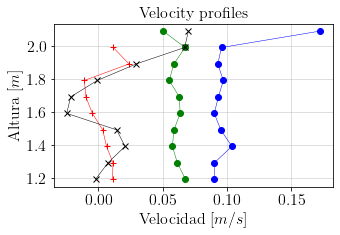

In [76]:
bua = bu2.sel(time=slice("2012-02-24 03:00:00","2012-02-24 3:05:10"))
budu = bu2.sel(time=slice("2012-02-25 2:00:00","2012-02-25 2:05:10"))
budu2 = bu2.sel(time=slice("2012-02-25 14:00:00","2012-02-25 14:05:10"))
bud = bu2.sel(time=slice("2012-02-26 00:00:00","2012-02-26 0:05:10"))

fig, (ax1) = plt.subplots(nrows=1, figsize=(5, 3), sharey=True, sharex=True)

ax1.plot( bua.values[0,:] ,bua.bin, marker='+',color='r',linewidth=0.5)
ax1.plot( budu.values[0,:] ,budu.bin, marker='o',color='b',linewidth=0.5)
ax1.plot( budu2.values[0,:] ,budu2.bin, marker='o',color='g',linewidth=0.5)
ax1.plot( bud.values[0,:] ,bud.bin, marker='x',color='k',linewidth=0.5)



# ax1.set_xlabel(r"Density "
#           r"$\displaystyle[dbar]$",
#           fontsize=16)
ax1.set_title(r"Velocity profiles",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)
# ax1.legend(["Antes", "Durante", "Después"], loc='lower left',
#           fontsize=16);
ax1.set_ylabel(r"Altura "
          r"$\displaystyle[m]$",
          fontsize=16)

ax1.set_xlabel(r"Velocidad "
          r"$\displaystyle[m/s]$",
          fontsize=16)

# ax1.legend(["Antes", "Durante", "Durante", "Después"], loc='lower center',
#           fontsize=16);


## Cuantificar mezcla

In [95]:
g = 9.81 # m/s^2
rho_hat = (nm1.loc[nm3.index]['densidad'].values + nm2['densidad'].values + nm3['densidad'].values)/3
pot = (g/(2*nm1.loc[nm3.index]['Depth'].values))*((nm3['densidad'].values - nm2['densidad'].values)*(nm3['Depth'].values)**2 
                                                  + (nm2['densidad'].values - nm1.loc[nm3.index]['densidad'].values)*(nm2['Depth'].values)**2 
                                                  + (nm1.loc[nm3.index]['densidad'].values - rho_hat)*(nm1.loc[nm3.index]['Depth'].values)**2)
phi = pd.DataFrame(pot,
                  index = nm3.index,
                  columns = ['potential_anomaly'])

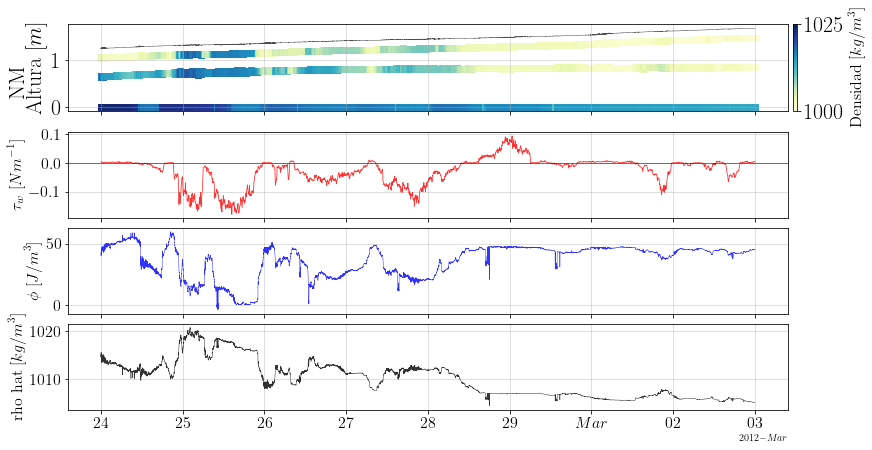

In [33]:
fig, (ax1, ax3, ax2, ax4) = plt.subplots(nrows=4, figsize=(12, 6), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax1.set_ylabel(r"NM \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax1.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.7, linewidth=0.5)
scat = ax1.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar3.ax.tick_params(labelsize=22)
cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=16)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"rho hat "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)

ax4.plot(nm3.index, rho_hat, c='k', alpha=0.8, linewidth=0.5)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(nm3.index, pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

### NM

In [56]:
g = 9.81 # m/s^2

rho1 = nm1.loc[nm3.index]['densidad'].values
rho2 = nm2['densidad'].values
rho3 = nm3['densidad'].values
z1 = nm1.loc[nm3.index]['Depth'].values
z2 = nm2['Depth'].values
z3 = nm3['Depth'].values

### Potential energy anomaly

# Discretizacion 1
nm_rho_hat = (rho1*(z1 - z2)
              + rho2*(z2 - z3) 
              + rho3*z3)/z1

nm_pot = (g/(2*z1))*((rho3 - rho2)*(z3)**2
                     + (rho2 - rho1)*(z2)**2
                     + (rho1 - nm_rho_hat)*z1**2)

# 
# # Discretizacion 2
# nm_rho_hat = (0.5*rho1*(z1 - z2)
#               + 0.5*rho2*(z1 - z3) 
#               + 0.5*rho3*(z3 + z2))/z1

# nm_pot = (g/(2*z1))*(0.25*(rho3 - rho2)*(z3 + z2)**2 
#                                                   + 0.25*(rho2 - rho1)*(z2 + z1)**2 
#                                                   + (rho1 - nm_rho_hat)*(z1)**2)

nm_phi = pd.DataFrame(nm_pot,
                  index = nm3.index,
                  columns = ['potential_anomaly'])

### Buoyancy frequency

nm32_N2 = (g/(0.5*(rho3 + rho2)))*((rho3-rho2)/(z3-z2))
nm21_N2 = (g/(0.5*(rho2 + rho1)))*((rho2-rho1)/(z2-z1))
nm31_N2 = (g/(0.5*(rho3 + rho1)))*((rho3-rho1)/(z3-z1))

N2_nm32 = pd.DataFrame(nm32_N2,
                  index = nm3.index,
                  columns = ['N2 3-2'])



In [57]:
### Richardson number

bu2_time = bu2.time.values
bu2_time = np.delete(bu2_time, [181, 329, 381, 611, 130, 131, 220, 221, 517, 593, 695, 967, 971, 999, 1160, 1161, 1201, 1221, 1386, 1387, 1472, 1473, 1004, 1005, 1493])
h_u = nm1.loc[bu2_time]['Depth'].values

tiempo, bins = np.meshgrid(bu2_time, bu2.bin.values[:8])

bins2 = np.zeros((bins.shape))
for i in range(8):
    bins2[i,:] = h_u - bins[i, :]

dudz = ((bu2.isel(bin=4).sel(time=bu2_time).values - bu2.isel(bin=0).sel(time=bu2_time).values)/(bins2[4,:]-bins2[0,:]))

nm32_ri = N2_nm32['N2 3-2'].loc[bu2_time].values/dudz**2


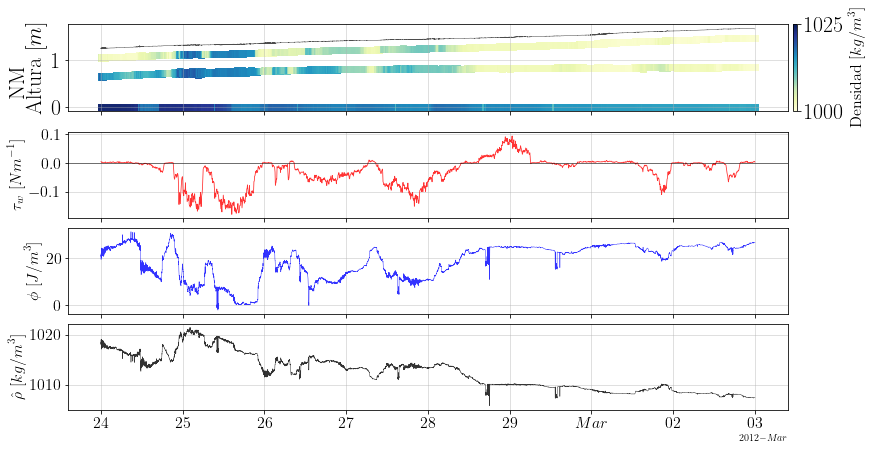

In [178]:
fig, (ax1, ax3, ax2, ax4) = plt.subplots(nrows=4, figsize=(12, 6), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax1.set_ylabel(r"NM \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax1.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.7, linewidth=0.5)
scat = ax1.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar3.ax.tick_params(labelsize=22)
cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=16)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"$\hat{\rho}$ "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)

ax4.plot(nm3.index, nm_rho_hat, c='k', alpha=0.8, linewidth=0.5)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(nm3.index, nm_pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

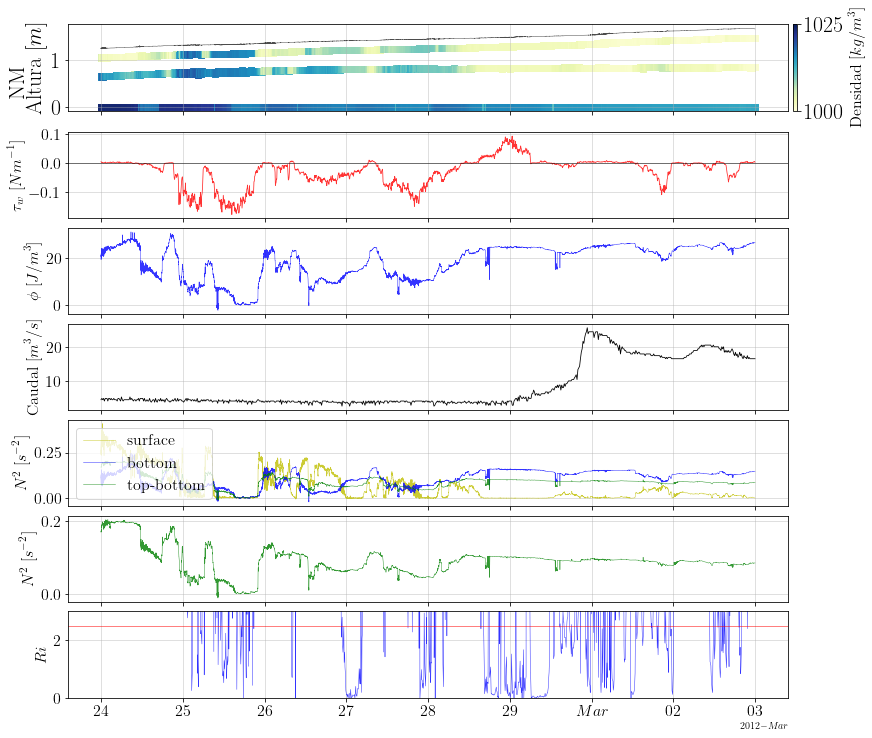

In [60]:
fig, (ax1, ax3, ax2, ax4, ax5, ax6, ax7) = plt.subplots(nrows=7, figsize=(12, 10), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax1.set_ylabel(r"NM \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax1.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.7, linewidth=0.5)
scat = ax1.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar3.ax.tick_params(labelsize=22)
cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=16)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax4.plot(q.index, q, lw=0.8, c='k')

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(nm3.index, nm_pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax5.set_ylabel(r"$N^2$ "
          r"$\displaystyle[s^{-2}]$",
          fontsize=16)

ax5.plot(nm3.index, nm32_N2, c='y', alpha=0.8, linewidth=0.5, label='surface')
ax5.plot(nm3.index, nm21_N2, c='b', alpha=0.8, linewidth=0.5, label='bottom')
ax5.plot(nm3.index, nm31_N2, c='g', alpha=0.8, linewidth=0.5, label='top-bottom')

ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)
ax5.legend(loc='upper left', fontsize=16)
# ax5.set_ylim(-24, -22)

ax6.set_ylabel(r"$N^2$ "
          r"$\displaystyle[s^{-2}]$",
          fontsize=16)

# ax6.plot(nm3.index, nm32_N2, c='y', alpha=0.8, linewidth=0.5, label='surface')
# ax6.plot(nm3.index, nm21_N2, c='b', alpha=0.8, linewidth=0.5, label='bottom')
ax6.plot(nm3.index, nm31_N2, c='g', alpha=0.8, linewidth=0.5, label='top-bottom')

ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)
# ax6.legend(loc='upper left', fontsize=16)

ax7.set_ylabel(r"$Ri$ ",
          fontsize=16)

ax7.plot(bu2_time, nm32_ri, c='b', alpha=0.8, linewidth=0.5, label='top-bottom')

ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)
ax7.axhline(y=2.5, color='r', linewidth=0.5)
ax7.set_ylim(0, 3)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

In [34]:
i = np.linspace(0, len(phi)-1, num=len(wdf)).astype(int)

X = phi.iloc[i].values
y = wdf.values

reg = LinearRegression().fit(X, y)
y_pred = reg.predict(X)
coef = reg.coef_
print(reg.intercept_)
print(reg.coef_)

-0.13615198330834102
[0.00300198]


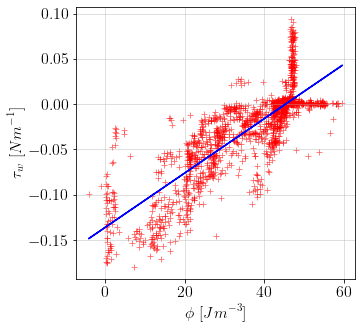

In [35]:
fig, (ax3) = plt.subplots(nrows=1, figsize=(5, 5))

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.set_xlabel(r"$\phi$ "
          r"$\displaystyle[Jm^{-3}]$",
          fontsize=16)
ax3.scatter(phi.iloc[i].values, wdf.values, color='r', alpha=0.6, linewidth=0.8, marker = '+')
ax3.plot(X,y_pred, c='b')
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

<ipython-input-37-6526c6adaca6>:56: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


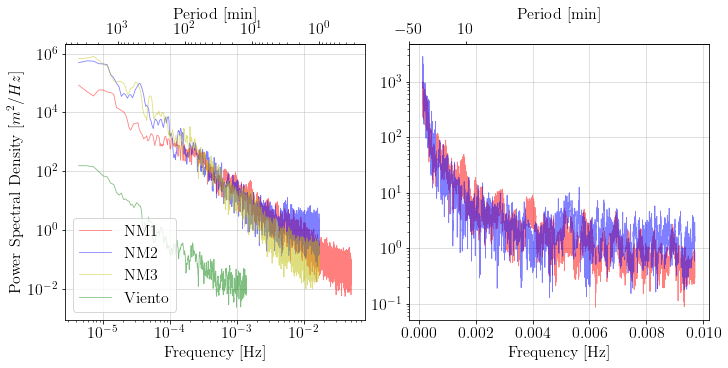

In [37]:
h_nm1 = nm1['densidad'] - nm1['densidad'].mean()
h_nm2 = nm2['densidad'] - nm2['densidad'].mean()
h_nm3 = nm3['densidad'] - nm3['densidad'].mean()
# h_ml = ml1['Depth'] - ml1['Depth'].mean()
# h_nm = nm1['Depth'] - nm1['Depth'].mean()
# h_pc = pc1['Depth'] - pc1['Depth'].mean()
# h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
h_wdf = wdf.values - wdf.values.mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm1, dt=10)
freqs2, ps2, psd2 = spectrum4(h_nm2, dt=30)
freqs3, ps3, psd3 = spectrum4(h_nm3, dt=30)
# freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
# freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)
freqs6, ps6, psd6 = spectrum4(h_wdf, dt=360)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, linewidth=0.8, label='NM1')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, linewidth=0.8, label='NM2')
axs[0].loglog(freqs3, psd3, 'y', alpha=0.5, linewidth=0.8, label='NM3')
axs[0].loglog(freqs6, psd6, 'g', alpha=0.5, linewidth=0.8, label='Viento')
# axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, linewidth=0.8, label='ML')
# axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, linewidth=0.8, label='PC')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 9.70464135e-03])
i04, i14 = np.searchsorted(freqs3, [1.31969058e-04, 9.70464135e-03])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', alpha=0.5, linewidth=0.8)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

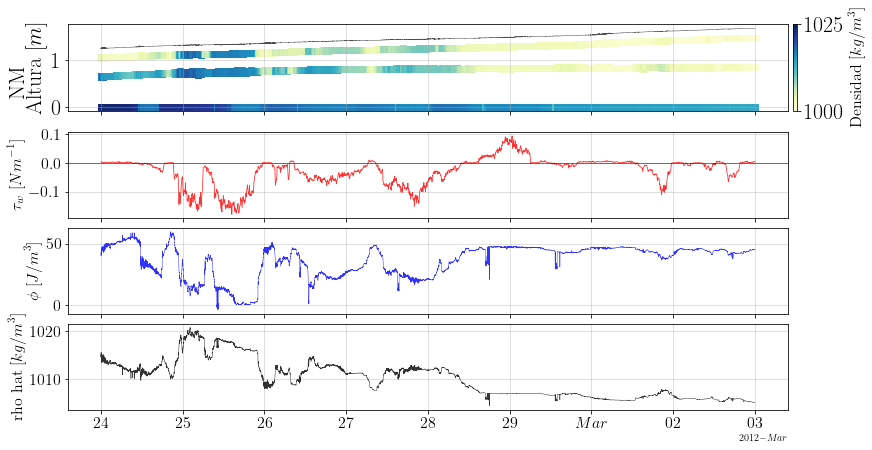

In [33]:
fig, (ax1, ax3, ax2, ax4) = plt.subplots(nrows=4, figsize=(12, 6), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax1.set_ylabel(r"NM \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax1.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.7, linewidth=0.5)
scat = ax1.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar3.ax.tick_params(labelsize=22)
cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=16)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"rho hat "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)

ax4.plot(nm3.index, rho_hat, c='k', alpha=0.8, linewidth=0.5)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(nm3.index, pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

### DC

In [61]:
g = 9.81 # m/s^2

rho1 = dc1['densidad'].values
rho2 = dc2['densidad'].values
rho3 = dc3['densidad'].values
rho4 = dc4['densidad'].values
z1 = dc1['Depth'].values
z2 = dc2['Depth'].values
z3 = dc3['Depth'].values
z4 = dc4['Depth'].values

# Discretizacion 1
dc_rho_hat = (rho1*(z1 - z2)
              + rho2*(z2 - z3) 
              + rho3*(z3 - z4)
              + rho4*z4)/z1

dc_pot = (g/(2*z1))*((rho4 - rho3)*(z4)**2 
                     + (rho3 - rho2)*(z3)**2
                     + (rho2 - rho1)*(z2)**2
                     + (rho1 - dc_rho_hat)*z1**2)


# # Discretizacion 2
# dc_rho_hat = (0.5*rho1*(z1 - z2)
#               + 0.5*rho2*(z1 - z3) 
#               + 0.5*rho3*(z2 - z4)
#               + 0.5*rho4*(z4 + z3))/z1

# dc_pot = (g/(2*z1))*(0.25*(rho4 - rho3)*(z4 + z3)**2 
#                      + 0.25*(rho3 - rho2)*(z3 + z2)**2
#                      + 0.25*(rho2 - rho1)*(z2 + z1)**2
#                      + (rho1 - dc_rho_hat)*z1**2)

dc_phi = pd.DataFrame(dc_pot,
                  index = dc3.index,
                  columns = ['potential_anomaly'])

### Buoyancy frequency

dc43_N2 = (g/(0.5*(rho4 + rho3)))*((rho4-rho3)/(z4-z3))
dc21_N2 = (g/(0.5*(rho2 + rho1)))*((rho2-rho1)/(z2-z1))
dc41_N2 = (g/(0.5*(rho4 + rho1)))*((rho4-rho1)/(z4-z1))

N2_dc43 = pd.DataFrame(dc43_N2,
                  index = dc3.index,
                  columns = ['N2'])

In [62]:
### Richardson number

bu2_time = bu2.time.values
bu2_time = np.delete(bu2_time, [181, 329, 381, 611, 130, 131, 220, 221, 517, 593, 695, 967, 971, 999, 1160, 1161, 1201, 1221, 1386, 1387, 1472, 1473, 1004, 1005, 1493])
h_u = dc1.loc[bu2_time]['Depth'].values

tiempo, bins = np.meshgrid(bu2_time, bu2.bin.values[:8])

bins2 = np.zeros((bins.shape))
for i in range(8):
    bins2[i,:] = h_u - bins[i, :]

dudz = ((bu2.isel(bin=5).sel(time=bu2_time).values - bu2.isel(bin=1).sel(time=bu2_time).values)/(bins2[5,:]-bins2[1,:]))

dc43_ri = N2_dc43['N2'].loc[bu2_time].values/dudz**2


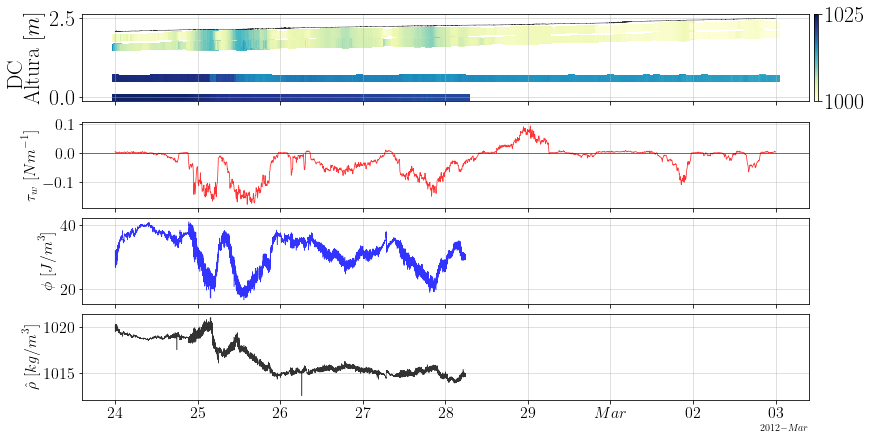

In [73]:
fig, (ax1, ax3, ax2, ax4) = plt.subplots(nrows=4, figsize=(12, 6), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax1.set_ylabel(r"DC \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.8, linewidth=0.5)
scat = ax1.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar2.ax.tick_params(labelsize=22)
# cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"$\hat{\rho}$ "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)

ax4.plot(dc4.index, dc_rho_hat, c='k', alpha=0.8, linewidth=0.5)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(dc4.index, dc_pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

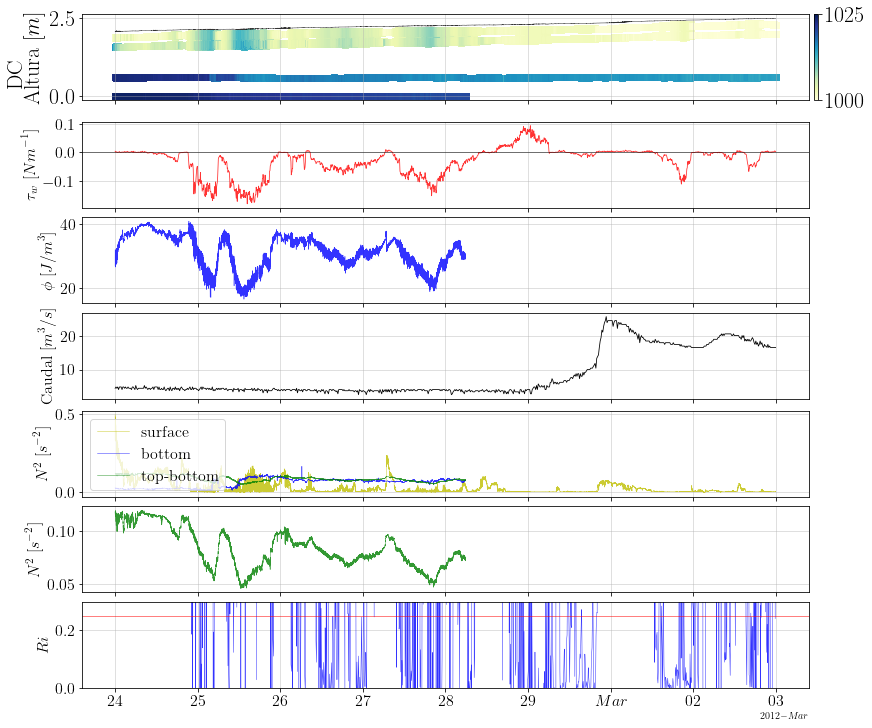

In [63]:
fig, (ax1, ax3, ax2, ax4, ax5, ax6, ax7) = plt.subplots(nrows=7, figsize=(12, 10), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) DC

ax1.set_ylabel(r"DC \\ Altura "
          r"$\displaystyle[m]$",
          fontsize=22)
ax1.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.8, linewidth=0.5)
scat = ax1.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax1.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar2.ax.tick_params(labelsize=22)
# cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax4.plot(q.index, q, lw=0.8, c='k')

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)



ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(dc4.index, dc_pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)


ax5.set_ylabel(r"$N^2$ "
          r"$\displaystyle[s^{-2}]$",
          fontsize=16)

ax5.plot(dc3.index, dc43_N2, c='y', alpha=0.8, linewidth=0.5, label='surface')
ax5.plot(dc3.index, dc21_N2, c='b', alpha=0.8, linewidth=0.5, label='bottom')
ax5.plot(dc3.index, dc41_N2, c='g', alpha=0.8, linewidth=0.5, label='top-bottom')

ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)
ax5.legend(loc='upper left', fontsize=16)
# ax5.set_ylim(-24, -22)

ax6.set_ylabel(r"$N^2$ "
          r"$\displaystyle[s^{-2}]$",
          fontsize=16)

ax6.plot(dc3.index, dc41_N2, c='g', alpha=0.8, linewidth=0.5, label='top-bottom')

ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)
# ax6.legend(loc='upper left', fontsize=16)

ax7.set_ylabel(r"$Ri$ ",
          fontsize=16)

ax7.plot(bu2_time, dc43_ri, c='b', alpha=0.8, linewidth=0.5, label='top-bottom')

ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)
ax7.axhline(y=0.25, color='r', linewidth=0.5)
ax7.set_ylim(0, 0.3)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

### ML

In [96]:
g = 9.81 # m/s^2

rho1 = ml1['densidad'].values
rho2 = ml2['densidad'].values

z1 = ml1['Depth'].values
z2 = ml2['Depth'].values

# # Discretizacion 1
ml_rho_hat = (rho1*(z1 - z2)
              + rho2*z2)/z1

ml_pot = (g/(2*z1))*((rho2 - rho1)*(z2)**2
                     + (rho1 - ml_rho_hat)*z1**2)


# Discretizacion 2
# ml_rho_hat = (rho1*z1
#               + 0.5*rho2*(z1 + z2))/z1

# ml_pot = (g/(2*z1))*(0.25*(rho2 - rho1)*(z2 + z1)**2
#                      + (rho1 - ml_rho_hat)*z1**2)


ml_phi = pd.DataFrame(ml_pot, 
                      index = ml2.index, 
                      columns = ['potential_anomaly'])

### Buoyancy frequency

ml21_N2 = (g/(0.5*(rho2 + rho1)))*((rho2-rho1)/(z2-z1))

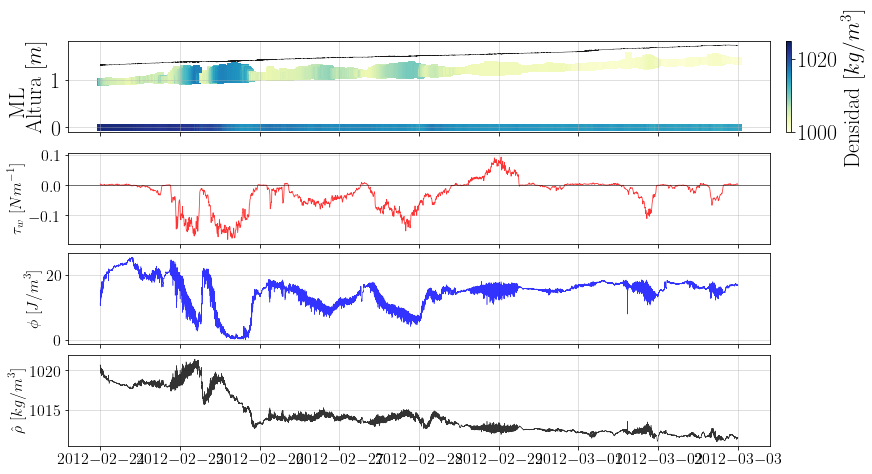

In [97]:
fig, (ax5, ax3, ax2, ax4) = plt.subplots(nrows=4, figsize=(12, 6), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax5.set_ylabel(r"ML \\ Altura $[m]$",
          fontsize=22)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.9, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.007)
cbar4.ax.tick_params(labelsize=22)
cbar4.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=22)
ax5.xaxis.set_tick_params(labelsize=22)
ax5.yaxis.set_tick_params(labelsize=22)
ax5.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"$\hat{\rho}$ "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)

ax4.plot(ml1.index, ml_rho_hat, c='k', alpha=0.8, linewidth=0.5)

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(ml1.index, ml_pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

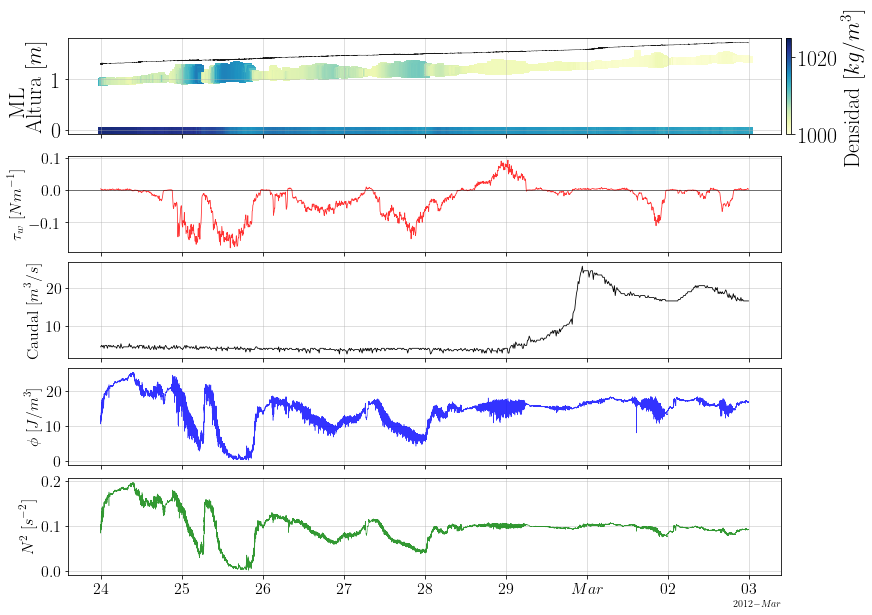

In [98]:
fig, (ax5, ax3, ax4, ax2, ax6) = plt.subplots(nrows=5, figsize=(12, 8), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Grafico de profundidad y densidad (color map) NM

ax5.set_ylabel(r"ML \\ Altura $[m]$",
          fontsize=22)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.9, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.007)
cbar4.ax.tick_params(labelsize=22)
cbar4.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=22)
ax5.xaxis.set_tick_params(labelsize=22)
ax5.yaxis.set_tick_params(labelsize=22)
ax5.grid(alpha=0.5)

ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)


ax4.set_ylabel(r"Caudal "
          r"$\displaystyle[m^3/s]$",
          fontsize=16)
ax4.plot(q.index, q, lw=0.8, c='k')

ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax2.set_ylabel(r"$\phi$ "
          r"$\displaystyle[J/m^3]$",
          fontsize=16)

ax2.plot(ml1.index, ml_pot, c='b', alpha=0.8, linewidth=0.5)

ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax6.set_ylabel(r"$N^2$ "
          r"$\displaystyle[s^{-2}]$",
          fontsize=16)

ax6.plot(ml1.index, ml21_N2, c='g', alpha=0.8, linewidth=0.5, label='top-bottom')

ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)
# ax6.legend(loc='upper left', fontsize=16)

# Ajustar formato fecha
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)

In [67]:
i = np.linspace(0, len(ml_phi)-1, num=len(wdf)).astype(int)

X = ml_phi.iloc[i].values
y = wdf.values

reg = LinearRegression().fit(X, y)
y_pred = reg.predict(X)
coef = reg.coef_
print(reg.intercept_)
print(reg.coef_)

-0.3254830400110264
[-6.56165462e-05]


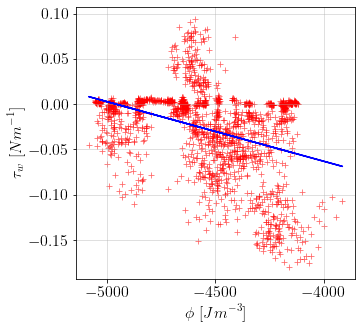

In [68]:
fig, (ax3) = plt.subplots(nrows=1, figsize=(5, 5))

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


ax3.set_ylabel(r"$\tau_w$ "
          r"$\displaystyle[Nm^{-1}]$",
          fontsize=16)
ax3.set_xlabel(r"$\phi$ "
          r"$\displaystyle[Jm^{-3}]$",
          fontsize=16)
ax3.scatter(ml_phi.iloc[i].values, wdf.values, color='r', alpha=0.6, linewidth=0.8, marker = '+')
ax3.plot(X,y_pred, c='b')
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)


# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

NameError: name 'freqs3' is not defined

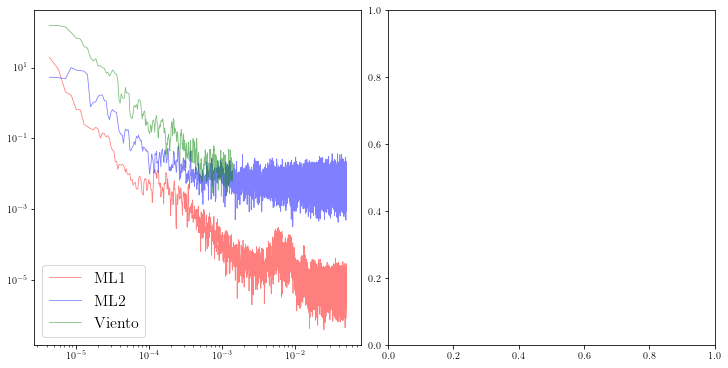

In [69]:
h_ml1 = ml1['Depth'] - ml1['Depth'].mean()
h_ml2 = ml2['Depth'] - ml2['Depth'].mean()
# h_nm = nm1['Depth'] - nm1['Depth'].mean()
# h_pc = pc1['Depth'] - pc1['Depth'].mean()
# h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
h_wdf = wdf.values - wdf.values.mean()
    
freqs1, ps1, psd1 = spectrum4(h_ml1, dt=10)
freqs2, ps2, psd2 = spectrum4(h_ml2, dt=10)
# freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)
freqs6, ps6, psd6 = spectrum4(h_wdf, dt=360)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, linewidth=0.8, label='ML1')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, linewidth=0.8, label='ML2')
axs[0].loglog(freqs6, psd6, 'g', alpha=0.5, linewidth=0.8, label='Viento')
# axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, linewidth=0.8, label='ML')
# axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, linewidth=0.8, label='PC')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs2, [1.31969058e-05, 5.70464135e-04])
i04, i14 = np.searchsorted(freqs3, [1.31969058e-05, 5.70464135e-04])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].loglog(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', 
              freqs6[sl], psd6[sl], 'g', alpha=0.5, linewidth=0.8)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

In [101]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

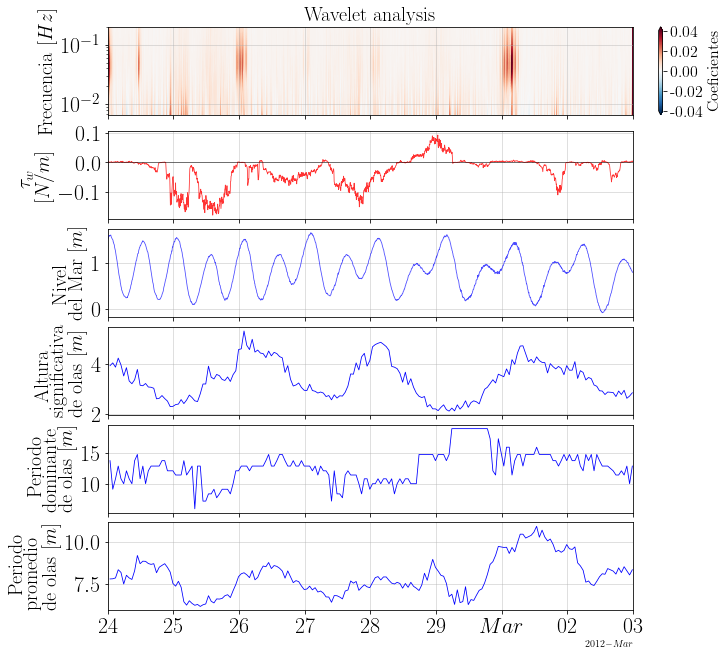

In [102]:
#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

fig, (ax1, ax3, ax2, ax4, ax5, ax6) = plt.subplots(nrows=6, figsize=(10, 9), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Wavelet
ax1.set_title(r"Wavelet analysis",
          fontsize=20)
contourf_ = ax1.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
# ax1.set_ylabel(r'Frequencia [Hz]',
#           fontsize=16)
ax1.set_ylabel(r"Frecuencia "
          r"$\displaystyle[Hz]$",
          fontsize=20)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.set_yscale("log")



ax2.plot(sf.index, sf.values, alpha=0.7, linewidth=0.8, c="b", label='San Fco');
# ax2.plot(mt.index, mt.values, alpha=0.7, linewidth=0.8, c="r", label='Monterrey');
# ax2.legend(loc='upper left',
#           fontsize=16);
ax2.set_ylabel(r'Nivel\\del Mar [$m$]',
          fontsize=20)
ax2.grid(alpha=0.5)
ax2.xaxis.set_tick_params(labelsize=22)
ax2.yaxis.set_tick_params(labelsize=22)

ax3.set_ylabel(r"$\tau_w$\\"
          r"$\displaystyle[N/m]$",
          fontsize=20)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=22)
ax3.yaxis.set_tick_params(labelsize=22)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)

ax4.set_ylabel(r"Altura\\significativa\\de olas "
          r"$\displaystyle[m]$",
          fontsize=20)
ax4.plot(hm.index, hm['WVHT'].values, c='b', linewidth=0.8)
ax4.xaxis.set_tick_params(labelsize=22)
ax4.yaxis.set_tick_params(labelsize=22)
ax4.grid(alpha=0.5)

ax5.set_ylabel(r"Periodo\\dominante\\de olas "
          r"$\displaystyle[m]$",
              fontsize=20)
ax5.plot(hm.index, hm['DPD'].values, c='b', linewidth=0.8)
ax5.xaxis.set_tick_params(labelsize=22)
ax5.yaxis.set_tick_params(labelsize=22)
ax5.grid(alpha=0.5)

ax6.set_ylabel(r"Periodo\\promedio\\de olas "
          r"$\displaystyle[m]$",
              fontsize=20)
ax6.plot(hm.index, hm['APD'].values, c='b', linewidth=0.8)
ax6.xaxis.set_tick_params(labelsize=22)
ax6.yaxis.set_tick_params(labelsize=22)
ax6.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

In [103]:
#Función wavelet marea

t = sf.index
sig  = sf.values[:,0]
widths = np.arange(1,201)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

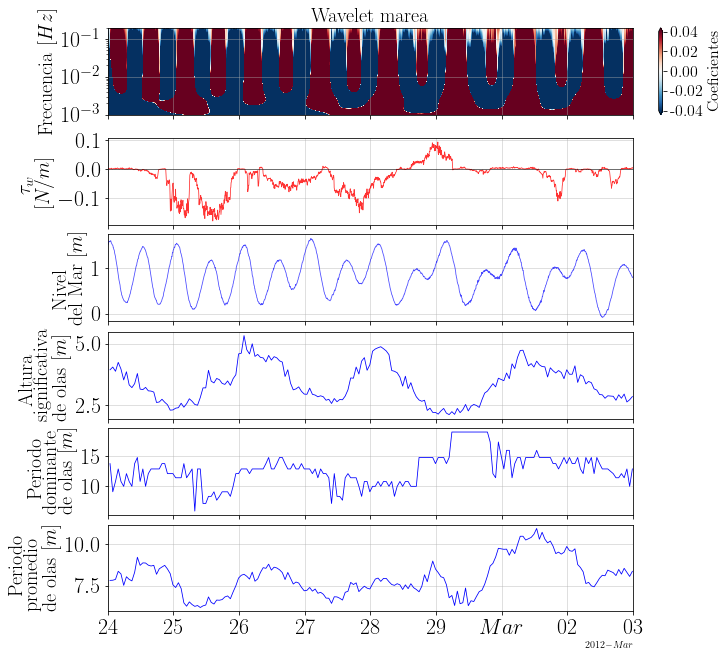

In [104]:
#Ajustar limites colorbar
umin = -0.04
umax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)

fig, (ax1, ax3, ax2, ax4, ax5, ax6) = plt.subplots(nrows=6, figsize=(10, 9), constrained_layout=True, sharex=True)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Wavelet
ax1.set_title(r"Wavelet marea",
          fontsize=20)
contourf_ = ax1.contourf(t, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
# ax1.set_ylabel(r'Frequencia [Hz]',
#           fontsize=16)
ax1.set_ylabel(r"Frecuencia "
          r"$\displaystyle[Hz]$",
          fontsize=20)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=22)
ax1.yaxis.set_tick_params(labelsize=22)
ax1.set_yscale("log")



ax2.plot(sf.index, sf.values, alpha=0.7, linewidth=0.8, c="b", label='San Fco');
# ax2.plot(mt.index, mt.values, alpha=0.7, linewidth=0.8, c="r", label='Monterrey');
# ax2.legend(loc='upper left',
#           fontsize=16);
ax2.set_ylabel(r'Nivel\\del Mar [$m$]',
          fontsize=20)
ax2.grid(alpha=0.5)
ax2.xaxis.set_tick_params(labelsize=22)
ax2.yaxis.set_tick_params(labelsize=22)

ax3.set_ylabel(r"$\tau_w$\\"
          r"$\displaystyle[N/m]$",
          fontsize=20)
ax3.plot(wdf.index, wdf.values, color='r', alpha=0.8, linewidth=0.8, label='u')
ax3.axhline(y=0, color='k', linewidth=0.5)
ax3.xaxis.set_tick_params(labelsize=22)
ax3.yaxis.set_tick_params(labelsize=22)
ax3.grid(alpha=0.5)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), 9.4, 'dirección mar adentro',
#           fontsize=16)
# ax3.text(pd.to_datetime('2012-1-25 00:00:00'), -12.5, 'dirección tierra adentro',
#           fontsize=16)

ax4.set_ylabel(r"Altura\\significativa\\de olas "
          r"$\displaystyle[m]$",
          fontsize=20)
ax4.plot(hm.index, hm['WVHT'].values, c='b', linewidth=0.8)
ax4.xaxis.set_tick_params(labelsize=22)
ax4.yaxis.set_tick_params(labelsize=22)
ax4.grid(alpha=0.5)

ax5.set_ylabel(r"Periodo\\dominante\\de olas "
          r"$\displaystyle[m]$",
              fontsize=20)
ax5.plot(hm.index, hm['DPD'].values, c='b', linewidth=0.8)
ax5.xaxis.set_tick_params(labelsize=22)
ax5.yaxis.set_tick_params(labelsize=22)
ax5.grid(alpha=0.5)

ax6.set_ylabel(r"Periodo\\promedio\\de olas "
          r"$\displaystyle[m]$",
              fontsize=20)
ax6.plot(hm.index, hm['APD'].values, c='b', linewidth=0.8)
ax6.xaxis.set_tick_params(labelsize=22)
ax6.yaxis.set_tick_params(labelsize=22)
ax6.grid(alpha=0.5)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)

<ipython-input-105-8497be594eab>:51: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


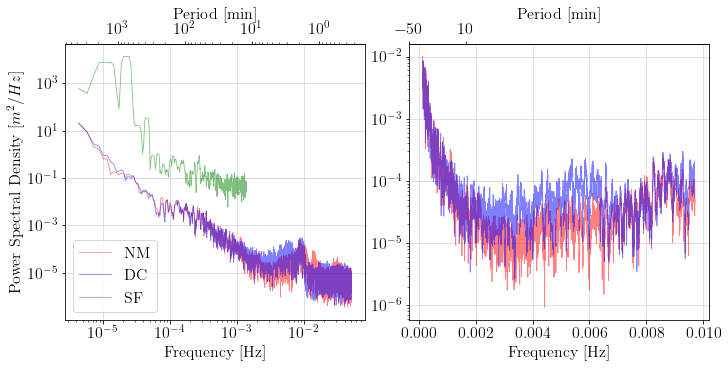

In [105]:
h_dc = dc1['Depth'] - dc1['Depth'].mean()
h_ml = ml1['Depth'] - ml1['Depth'].mean()
h_nm = nm1['Depth'] - nm1['Depth'].mean()
h_pc = pc1['Depth'] - pc1['Depth'].mean()
h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc, dt=10)
freqs3, ps3, psd3 = spectrum4(h_sf, dt=360)
freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, linewidth=0.8, label='NM')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, linewidth=0.8, label='DC')
axs[0].loglog(freqs3, psd3, 'g', alpha=0.5, linewidth=0.8, label='SF')
# axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, linewidth=0.8, label='ML')
# axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, linewidth=0.8, label='PC')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 9.70464135e-03])
i04, i14 = np.searchsorted(freqs5, [1.31969058e-04, 9.70464135e-03])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', alpha=0.5, linewidth=0.8)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

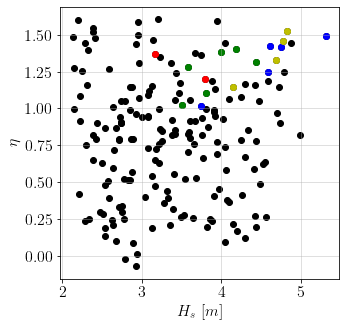

In [106]:
hm.index = hm.index + datetime.timedelta(minutes=10)
fig, (ax1) = plt.subplots(nrows= 1, figsize=(5, 5))

ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c="k")
ax1.scatter(hm['WVHT'].loc[datetime.datetime(2012,2,24,10,30,0):datetime.datetime(2012,2,24,12,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,24,10,30,0):datetime.datetime(2012,2,24,12,0,0)].values, c="r")
ax1.scatter(hm['WVHT'].loc[datetime.datetime(2012,2,25,23,0,0):datetime.datetime(2012,2,26,3,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,25,23,0,0):datetime.datetime(2012,2,26,3,0,0)].values, c="b")
ax1.scatter(hm['WVHT'].loc[datetime.datetime(2012,2,28,0,0,0):datetime.datetime(2012,2,28,3,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,28,0,0,0):datetime.datetime(2012,2,28,3,0,0)].values, c="y")
ax1.scatter(hm['WVHT'].loc[datetime.datetime(2012,3,1,0,0,0):datetime.datetime(2012,3,1,6,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,3,1,0,0,0):datetime.datetime(2012,3,1,6,0,0)].values, c="g")
ax1.set_ylabel("$\eta$ ",
          fontsize=16)
ax1.set_xlabel("$H_s$ "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)


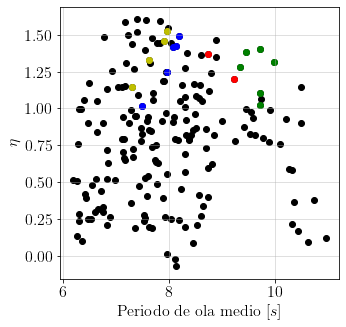

In [108]:
hm.index = hm.index + datetime.timedelta(minutes=10)
fig, (ax1) = plt.subplots(nrows= 1, figsize=(5, 5))

ax1.scatter(hm['APD'].values, sf.loc[hm.index].values, c="k")
ax1.scatter(hm['APD'].loc[datetime.datetime(2012,2,24,10,30,0):datetime.datetime(2012,2,24,12,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,24,10,30,0):datetime.datetime(2012,2,24,12,0,0)].values, c="r")
ax1.scatter(hm['APD'].loc[datetime.datetime(2012,2,25,23,0,0):datetime.datetime(2012,2,26,3,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,25,23,0,0):datetime.datetime(2012,2,26,3,0,0)].values, c="b")
ax1.scatter(hm['APD'].loc[datetime.datetime(2012,2,28,0,0,0):datetime.datetime(2012,2,28,3,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,28,0,0,0):datetime.datetime(2012,2,28,3,0,0)].values, c="y")
ax1.scatter(hm['APD'].loc[datetime.datetime(2012,3,1,0,0,0):datetime.datetime(2012,3,1,6,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,3,1,0,0,0):datetime.datetime(2012,3,1,6,0,0)].values, c="g")
ax1.set_ylabel("$\eta$ ",
          fontsize=16)
ax1.set_xlabel("Periodo de ola medio "
          r"$\displaystyle[s]$",
          fontsize=16)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)


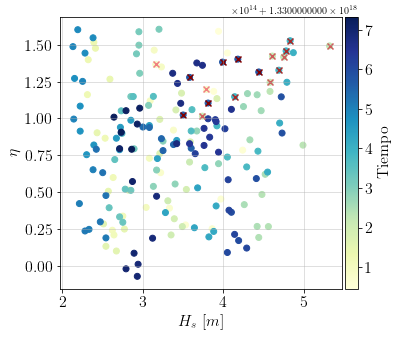

In [65]:
hm.index = hm.index + datetime.timedelta(minutes=10)
fig, (ax1) = plt.subplots(nrows= 1, figsize=(6, 5))



scat = ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c=hm.index, marker='o', cmap=cm.YlGnBu)
cbar2 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar2.ax.tick_params(labelsize=16)
cbar2.set_label("Tiempo", loc='center',
          fontsize=16)


# ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c="k")
ax1.scatter(hm['WVHT'].loc[datetime.datetime(2012,2,24,10,30,0):datetime.datetime(2012,2,24,12,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,24,10,30,0):datetime.datetime(2012,2,24,12,0,0)].values, c="lightcoral", marker = "x")
ax1.scatter(hm['WVHT'].loc[datetime.datetime(2012,2,25,23,0,0):datetime.datetime(2012,2,26,3,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,25,23,0,0):datetime.datetime(2012,2,26,3,0,0)].values, c="indianred", marker = "x")
ax1.scatter(hm['WVHT'].loc[datetime.datetime(2012,2,28,0,0,0):datetime.datetime(2012,2,28,3,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,28,0,0,0):datetime.datetime(2012,2,28,3,0,0)].values, c="brown", marker = "x")
ax1.scatter(hm['WVHT'].loc[datetime.datetime(2012,3,1,0,0,0):datetime.datetime(2012,3,1,6,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,3,1,0,0,0):datetime.datetime(2012,3,1,6,0,0)].values, c="maroon", marker = "x")
ax1.set_ylabel("$\eta$ ",
          fontsize=16)
ax1.set_xlabel("$H_s$ "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

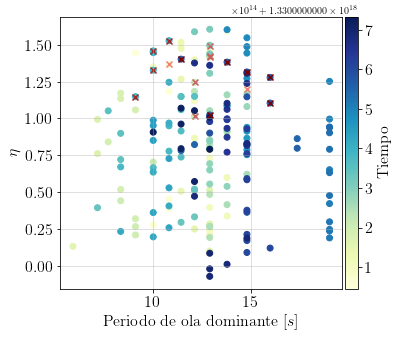

In [67]:
hm.index = hm.index + datetime.timedelta(minutes=10)
fig, (ax1) = plt.subplots(nrows= 1, figsize=(6, 5))

scat = ax1.scatter(hm['DPD'].values, sf.loc[hm.index].values, c=hm.index, marker='o', cmap=cm.YlGnBu)
cbar2 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar2.ax.tick_params(labelsize=16)
cbar2.set_label("Tiempo", loc='center',
          fontsize=16)


# ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c="k")
ax1.scatter(hm['DPD'].loc[datetime.datetime(2012,2,24,10,30,0):datetime.datetime(2012,2,24,12,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,24,10,30,0):datetime.datetime(2012,2,24,12,0,0)].values, c="lightcoral", marker = "x")
ax1.scatter(hm['DPD'].loc[datetime.datetime(2012,2,25,23,0,0):datetime.datetime(2012,2,26,3,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,25,23,0,0):datetime.datetime(2012,2,26,3,0,0)].values, c="indianred", marker = "x")
ax1.scatter(hm['DPD'].loc[datetime.datetime(2012,2,28,0,0,0):datetime.datetime(2012,2,28,3,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,28,0,0,0):datetime.datetime(2012,2,28,3,0,0)].values, c="brown", marker = "x")
ax1.scatter(hm['DPD'].loc[datetime.datetime(2012,3,1,0,0,0):datetime.datetime(2012,3,1,6,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,3,1,0,0,0):datetime.datetime(2012,3,1,6,0,0)].values, c="maroon", marker = "x")

ax1.set_ylabel("$\eta$ ",
          fontsize=16)
ax1.set_xlabel("Periodo de ola dominante "
          r"$\displaystyle[s]$",
          fontsize=16)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

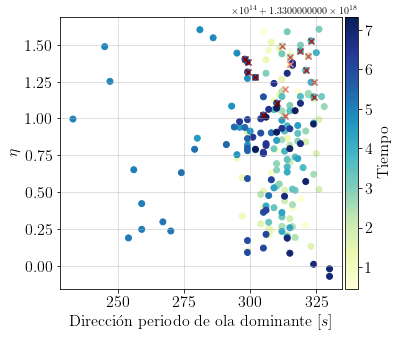

In [69]:
hm.index = hm.index + datetime.timedelta(minutes=10)
fig, (ax1) = plt.subplots(nrows= 1, figsize=(6, 5))

scat = ax1.scatter(hm['MWD'].values, sf.loc[hm.index].values, c=hm.index, marker='o', cmap=cm.YlGnBu)
cbar2 = fig.colorbar(scat, ax=ax1, pad=0.007)
cbar2.ax.tick_params(labelsize=16)
cbar2.set_label("Tiempo", loc='center',
          fontsize=16)


# ax1.scatter(hm['WVHT'].values, sf.loc[hm.index].values, c="k")
ax1.scatter(hm['MWD'].loc[datetime.datetime(2012,2,24,10,30,0):datetime.datetime(2012,2,24,12,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,24,10,30,0):datetime.datetime(2012,2,24,12,0,0)].values, c="lightcoral", marker = "x")
ax1.scatter(hm['MWD'].loc[datetime.datetime(2012,2,25,23,0,0):datetime.datetime(2012,2,26,3,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,25,23,0,0):datetime.datetime(2012,2,26,3,0,0)].values, c="indianred", marker = "x")
ax1.scatter(hm['MWD'].loc[datetime.datetime(2012,2,28,0,0,0):datetime.datetime(2012,2,28,3,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,2,28,0,0,0):datetime.datetime(2012,2,28,3,0,0)].values, c="brown", marker = "x")
ax1.scatter(hm['MWD'].loc[datetime.datetime(2012,3,1,0,0,0):datetime.datetime(2012,3,1,6,0,0)].values, sf.loc[hm.index].loc[datetime.datetime(2012,3,1,0,0,0):datetime.datetime(2012,3,1,6,0,0)].values, c="maroon", marker = "x")


ax1.set_ylabel("$\eta$ ",
          fontsize=16)
ax1.set_xlabel("Dirección periodo de ola dominante "
          r"$\displaystyle[s]$",
          fontsize=16)
ax1.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

---

- La boca comienza a cerrarse
- Se observa que existe wave overtopping cuando la marea aumenta, ya que la densidad en la superficie aumenta
- Marea domina le movimiento dentro del estuario
- Cuando baja la marea se observa que el estuario se estratifica y cuando sube vuelve a mezclarse

<ipython-input-121-c9e3508d3801>:53: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


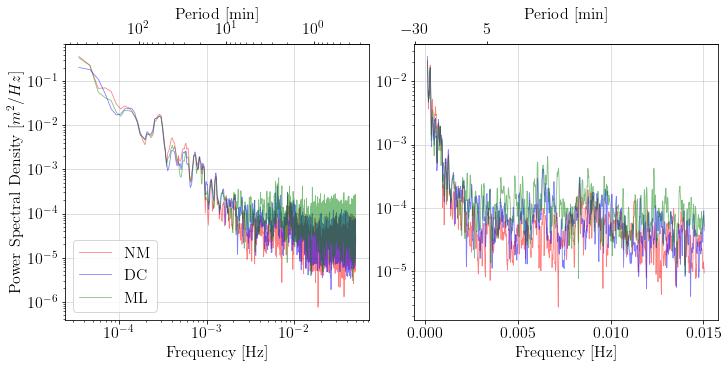

In [121]:
h_dc = dc1['Depth'] - dc1['Depth'].mean()
h_ml = ml1['Depth'] - ml1['Depth'].mean()
h_nm = nm1['Depth'] - nm1['Depth'].mean()
h_pc = pc1['Depth'] - pc1['Depth'].mean()
h_sf = sf[:,0] - sf[:,0].mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc, dt=10)
freqs3, ps3, psd3 = spectrum4(h_sf, dt=360)
freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', linewidth=0.8, alpha=0.5, label='NM')
axs[0].loglog(freqs2, psd2, 'b', linewidth=0.8, alpha=0.5, label='DC')
axs[0].loglog(freqs4, psd4, 'g', linewidth=0.8, alpha=0.5, label='ML')
# axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, label='PC')
# axs[0].loglog(freqs3, psd3, 'g', alpha=0.5, label='San Fco')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 1.50464135e-02])
i04, i14 = np.searchsorted(freqs2, [0.31969058e-04, 3e-04])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', 
              freqs4[sl], psd4[sl], 'g', alpha=0.5, linewidth=0.8)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)



def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)
# secax1.xaxis.set_major_locator(tick.MultipleLocator(0.05))

plt.show()

## 14-Feb

In [65]:
bu2 = UV_burst.sel(time=slice("2012-02-14 00:00:00","2012-02-15 00:00:00")).u
wdf = dfw['u'].loc[datetime.date(2012,2,25):datetime.date(2012,2,27)]
sf = snfco.loc[datetime.date(2012,2,25):datetime.date(2012,2,27)]
mt = mnty.loc[datetime.date(2012,2,25):datetime.date(2012,2,27)]
dc1 = DC_1.loc[datetime.date(2012,2,25):datetime.date(2012,2,27)]
dc2 = DC_2.loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]
dc3 = DC_3.loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]
dc4 = DC_4.loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]

nm1 = NM_1.loc[datetime.date(2012,2,25):datetime.date(2012,2,27)]
nm2 = NM_2.loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]
nm3 = NM_3.loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]

ml1 = ML_1.loc[datetime.date(2012,2,25):datetime.date(2012,2,27)]
ml2 = ML_2.loc[datetime.date(2012,2,24):datetime.date(2012,2,27)]

pc1 = PC_1.loc[datetime.date(2012,2,25):datetime.date(2012,2,27)]

dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-25 00:00:00","2012-02-27 00:00:00")).v
nm = NM_CTD.sel(time=slice("2012-02-25 00:00:00","2012-02-27 00:00:00")).v
ml = ML_CTD.sel(time=slice("2012-02-25 00:00:00","2012-02-27 00:00:00")).v
pc = PC_CTD.sel(time=slice("2012-02-25 00:00:00","2012-02-27 00:00:00")).v

In [66]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

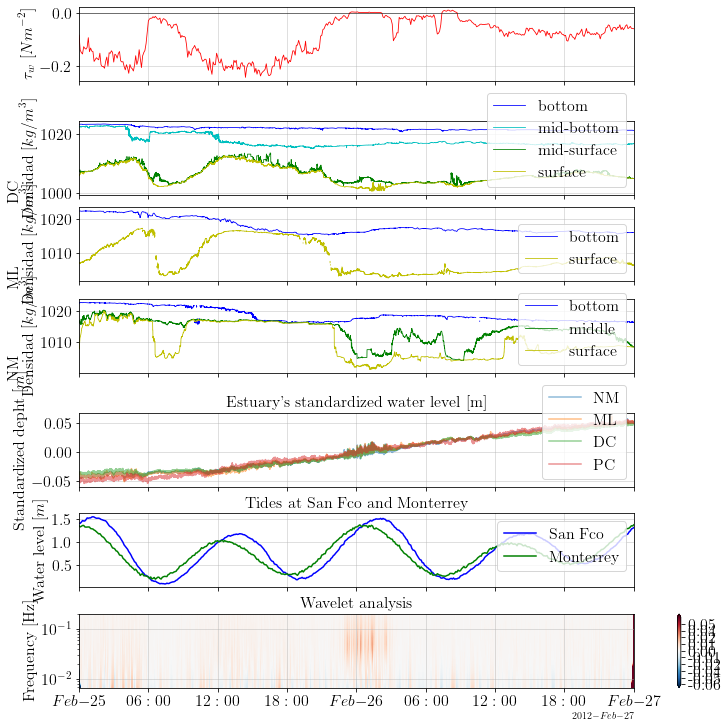

In [67]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax4, ax5, ax3, ax6, ax7, ax8) = plt.subplots(nrows=7, figsize=(10, 10), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
# contourf_ = ax1.contourf(bu2.time, y_bin,
#                          np.transpose(bu2.values),
#                          levels=level_boundaries_u,
#                          cmap=cm.RdBu_r,
#                          vmax=umax, vmin=umin, extend='both')
# cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
# cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# ax1.set_ylabel(r"Depth DC "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax1.grid(alpha=0.5)
# ax1.set_ylim(1, 2.5)
# ax1.xaxis.set_tick_params(labelsize=16)
# ax1.yaxis.set_tick_params(labelsize=16)

#Grafico velocidad viento

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax3.set_ylabel(r"NM\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax3.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax3.plot(nm.time, nm.sel(sensor=2, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="g", label='middle')
ax3.plot(nm.time, nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="y", label='surface')
ax3.legend(loc='lower right',
          fontsize=16);
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

ax4.set_ylabel(r"DC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax4.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax4.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.8, c="c", label='mid-bottom')
ax4.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.8, c="g", label='mid-surface')
ax4.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.8, c="y", label='surface')

ax4.legend(loc='lower right',
          fontsize=16);
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax5.set_ylabel(r"ML\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax5.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax5.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.8, c="y", label='surface')

ax5.legend(loc='lower right',
          fontsize=16);
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)

# Grafico water level estandarizada

ax6.set_title(r"Estuary's standardized water level [m]",
          fontsize=16)
ax6.set_ylabel(r"Standardized depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax6.plot(nm1.index, nm1['Depth']-nm1['Depth'].mean(), alpha=0.5)
ax6.plot(ml1.index, ml1['Depth']-ml1['Depth'].mean(), alpha=0.5)
ax6.plot(dc1.index, dc1['Depth']-dc1['Depth'].mean(), alpha=0.5)
ax6.plot(pc1.index, pc1['Depth']-pc1['Depth'].mean(), alpha=0.5)
ax6.legend(["NM", "ML", "DC", "PC"], loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

# Grafico nivel del agua SF

ax7.set_title(r"Tides at San Fco and Monterrey",
          fontsize=16)
ax7.set_ylabel(r"Water level "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='b')
ax7.plot(mt.index, mt.values, c='g')
ax7.legend(["San Fco", "Monterrey"], loc='upper right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.06
umax = 0.06
vmin = -0.06
vmax = 0.06
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


#Grafico de velocidad del agua (color map)
ax8.set_title(r"Wavelet analysis",
          fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

- La boca comienza a cerrarse
- Se observa que existe wave overtopping cuando la marea aumenta, ya que la superficie se vuelve más irregular en ese momento, pero la densidad en la superficie no aumenta. Esto último podría indicar que el agua que pasó la barrera era poca.
- Marea no domina el movimiento dentro del estuario
- El estuario se mantiene estratificado a lo largo de este periodo
- Se observa un evento de viento fuerte al final del día, cerca de las 00, donde podría existir un evento de upwelling debido a que la densidad aumenta en NM y disminuye en DC.

In [71]:
bu2 = UV_burst.sel(time=slice("2012-02-14 00:00:00","2012-02-15 00:00:00")).u
wdf = dfw['u'].loc[datetime.date(2012,2,29):datetime.date(2012,3,2)]
sf = snfco.loc[datetime.date(2012,2,29):datetime.date(2012,3,2)]
mt = mnty.loc[datetime.date(2012,2,29):datetime.date(2012,3,2)]
dc1 = DC_1.loc[datetime.date(2012,2,29):datetime.date(2012,3,2)]
dc2 = DC_2.loc[datetime.date(2012,2,24):datetime.date(2012,3,2)]
dc3 = DC_3.loc[datetime.date(2012,2,24):datetime.date(2012,3,2)]
dc4 = DC_4.loc[datetime.date(2012,2,24):datetime.date(2012,3,2)]

nm1 = NM_1.loc[datetime.date(2012,2,29):datetime.date(2012,3,2)]
nm2 = NM_2.loc[datetime.date(2012,2,24):datetime.date(2012,3,2)]
nm3 = NM_3.loc[datetime.date(2012,2,24):datetime.date(2012,3,2)]

ml1 = ML_1.loc[datetime.date(2012,2,29):datetime.date(2012,3,2)]
ml2 = ML_2.loc[datetime.date(2012,2,24):datetime.date(2012,3,2)]

pc1 = PC_1.loc[datetime.date(2012,2,29):datetime.date(2012,3,2)]

dc = DC_CTD.interpolate_na(dim="time", method="nearest").sel(time=slice("2012-02-29 00:00:00","2012-03-02 00:00:00")).v
nm = NM_CTD.sel(time=slice("2012-02-29 00:00:00","2012-03-02 00:00:00")).v
ml = ML_CTD.sel(time=slice("2012-02-29 00:00:00","2012-03-02 00:00:00")).v
pc = PC_CTD.sel(time=slice("2012-02-29 00:00:00","2012-03-02 00:00:00")).v

In [72]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

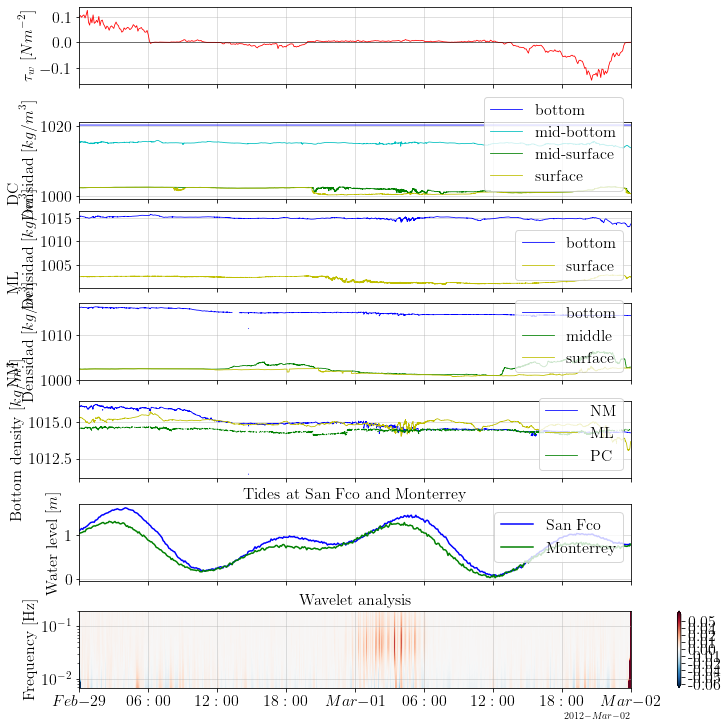

In [75]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax2, ax4, ax5, ax3, ax6, ax7, ax8) = plt.subplots(nrows=7, figsize=(10, 10), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
# contourf_ = ax1.contourf(bu2.time, y_bin,
#                          np.transpose(bu2.values),
#                          levels=level_boundaries_u,
#                          cmap=cm.RdBu_r,
#                          vmax=umax, vmin=umin, extend='both')
# cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
# cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# ax1.set_ylabel(r"Depth DC "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax1.grid(alpha=0.5)
# ax1.set_ylim(1, 2.5)
# ax1.xaxis.set_tick_params(labelsize=16)
# ax1.yaxis.set_tick_params(labelsize=16)

#Grafico velocidad viento

ax2.set_ylabel(r"$\tau_{w}$ "
          r"$\displaystyle[Nm^{-2}]$",
          fontsize=16)
ax2.plot(wdf.index, wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

ax3.set_ylabel(r"NM\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax3.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax3.plot(nm.time, nm.sel(sensor=2, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="g", label='middle')
ax3.plot(nm.time, nm.sel(sensor=3, variables='Density').interpolate_na(dim="time", method="nearest"), linewidth=0.8, c="y", label='surface')
ax3.legend(loc='lower right',
          fontsize=16);
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

ax4.set_ylabel(r"DC\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax4.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax4.plot(dc.time, dc.sel(sensor=2, variables='Density'), linewidth=0.8, c="c", label='mid-bottom')
ax4.plot(dc.time, dc.sel(sensor=3, variables='Density'), linewidth=0.8, c="g", label='mid-surface')
ax4.plot(dc.time, dc.sel(sensor=4, variables='Density'), linewidth=0.8, c="y", label='surface')

ax4.legend(loc='lower right',
          fontsize=16);
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

ax5.set_ylabel(r"ML\\Densidad "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
ax5.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='bottom')
ax5.plot(ml.time, ml.sel(sensor=2, variables='Density'), linewidth=0.8, c="y", label='surface')

ax5.legend(loc='lower right',
          fontsize=16);
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)


#Densidad fondo

ax6.set_ylabel(r"Bottom density "
          r"$\displaystyle[kg/m^3]$",
          fontsize=16)
# ax6.plot(dc.time, dc.sel(sensor=1, variables='Density'), linewidth=0.8, c="r", label='DC')
ax6.plot(nm.time, nm.sel(sensor=1, variables='Density'), linewidth=0.8, c="b", label='NM')
ax6.plot(ml.time, ml.sel(sensor=1, variables='Density'), linewidth=0.8, c="y", label='ML')
ax6.plot(pc.time, pc.sel(sensor=1, variables='Density'), lw=0.8, c='g', label='PC')

ax6.legend(loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

# Grafico nivel del agua SF

ax7.set_title(r"Tides at San Fco and Monterrey",
          fontsize=16)
ax7.set_ylabel(r"Water level "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='b')
ax7.plot(mt.index, mt.values, c='g')
ax7.legend(["San Fco", "Monterrey"], loc='upper right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.06
umax = 0.06
vmin = -0.06
vmax = 0.06
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


#Grafico de velocidad del agua (color map)
ax8.set_title(r"Wavelet analysis",
          fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

<ipython-input-35-2dcf91c340a2>:54: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


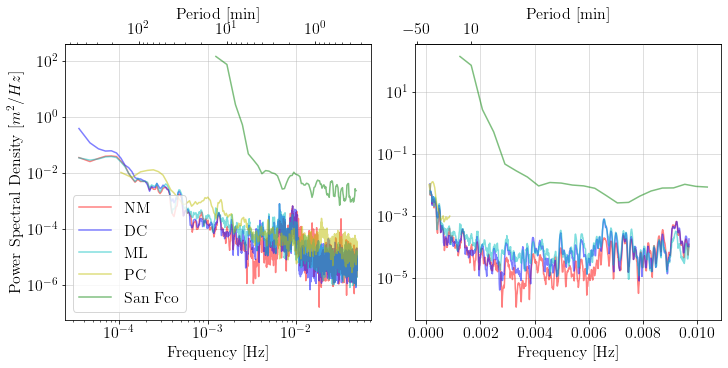

In [35]:
h_dc = dc1['Depth'] - dc1['Depth'].mean()
h_ml = ml1['Depth'] - ml1['Depth'].mean()
h_nm = nm1['Depth'] - nm1['Depth'].mean()
h_pc = pc1['Depth'] - pc1['Depth'].mean()
h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc, dt=10)
freqs3, ps3, psd3 = spectrum4(h_sf, dt=360)
freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, label='NM')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, label='DC')
axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, label='ML')
axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, label='PC')
axs[0].loglog(freqs3, psd3, 'g', alpha=0.5, label='San Fco')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 9.70464135e-03])
i04, i14 = np.searchsorted(freqs2, [0.31969058e-04, 3e-04])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', 
              freqs4[sl], psd4[sl], 'c', 
              freqs5[sl4], psd5[sl4], 'y', 
              freqs3[sl4], psd3[sl4], 'g', alpha=0.5)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

## 15-Feb y un poco antes

In [36]:
bu2 = UV_burst.sel(time=slice("2012-02-14 21:00:00","2012-02-15 21:00:00")).u
wdf = dfw['u'].loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]
sf = snfco.loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]
mt = mnty.loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]
dc1 = DC_1.loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]
dc2 = DC_2.loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]
dc3 = DC_3.loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]
dc4 = DC_4.loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]

nm1 = NM_1.loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]
nm2 = NM_2.loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]
nm3 = NM_3.loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]

ml1 = ML_1.loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]
ml2 = ML_2.loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]

pc1 = PC_1.loc[datetime.datetime(2012,2,14,21,0,0):datetime.datetime(2012,2,15,21,0,0)]

In [37]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

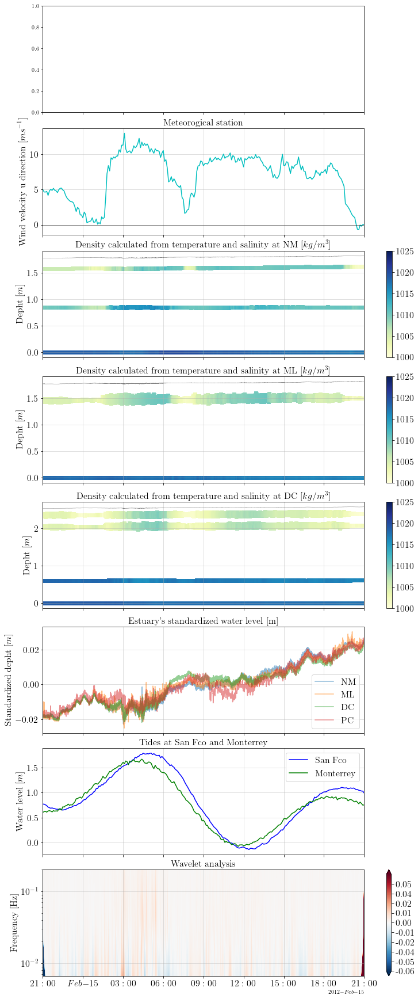

In [39]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax4, ax5, ax3, ax6, ax7, ax8) = plt.subplots(nrows=8, figsize=(10, 24), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
# contourf_ = ax1.contourf(bu2.time, y_bin,
#                          np.transpose(bu2.values),
#                          levels=level_boundaries_u,
#                          cmap=cm.RdBu_r,
#                          vmax=umax, vmin=umin, extend='both')
# cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
# cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# ax1.set_ylabel(r"Depth DC "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax1.grid(alpha=0.5)
# ax1.set_ylim(1, 2.5)
# ax1.xaxis.set_tick_params(labelsize=16)
# ax1.yaxis.set_tick_params(labelsize=16)

#Grafico velocidad viento

ax2.set_title(r"Meteorogical station",
          fontsize=16)
ax2.set_ylabel(r"Wind velocity u direction "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, -wdf.values,color='c')
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

#Grafico de profundidad y densidad (color map) DC
ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
          fontsize=16)
ax3.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax3, pad=0.03)
cbar2.ax.tick_params(labelsize=16)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

# Grafico densidades NM

ax4.set_title(r"Density calculated from temperature and salinity at NM [$kg/m^3$]",
          fontsize=16)
ax4.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax4.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax4.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax4, pad=0.03)
cbar3.ax.tick_params(labelsize=16)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

# Grafico densidades ML

ax5.set_title(r"Density calculated from temperature and salinity at ML [$kg/m^3$]",
          fontsize=16)
ax5.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.03)
cbar4.ax.tick_params(labelsize=16)
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)

# Grafico water level estandarizada

ax6.set_title(r"Estuary's standardized water level [m]",
          fontsize=16)
ax6.set_ylabel(r"Standardized depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax6.plot(nm1.index, nm1['Depth']-nm1['Depth'].mean(), alpha=0.5)
ax6.plot(ml1.index, ml1['Depth']-ml1['Depth'].mean(), alpha=0.5)
ax6.plot(dc1.index, dc1['Depth']-dc1['Depth'].mean(), alpha=0.5)
ax6.plot(pc1.index, pc1['Depth']-pc1['Depth'].mean(), alpha=0.5)
ax6.legend(["NM", "ML", "DC", "PC"], loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

# Grafico nivel del agua SF

ax7.set_title(r"Tides at San Fco and Monterrey",
          fontsize=16)
ax7.set_ylabel(r"Water level "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='b')
ax7.plot(mt.index, mt.values, c='g')
ax7.legend(["San Fco", "Monterrey"], loc='upper right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.06
umax = 0.06
vmin = -0.06
vmax = 0.06
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


#Grafico de velocidad del agua (color map)
ax8.set_title(r"Wavelet analysis",
          fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

- La boca está completamente cerrada
- No se observa wave overtopping pero se debe comprobar
- Viento domina le movimiento dentro del estuario
- Evento de viento fuerte podría estar provocando un upwelling ya que existe un aumento en la densidad de la superficie, comenzando por NM y paulativamente llendo hacia ML y luego DC.
- Al momento que la velocidad del viento disminuye, se observa que la densidad de la superficie disminuye, representando que está volviendo al equlibrio de estuario estratificado. En las velocidades se observa como la capa inferior retrocede volviendo a su posición original.
- Luego de lo anterior, se observa en las velocidades que existe un cambio de dirección en ambos estratos.


<ipython-input-40-2dcf91c340a2>:54: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


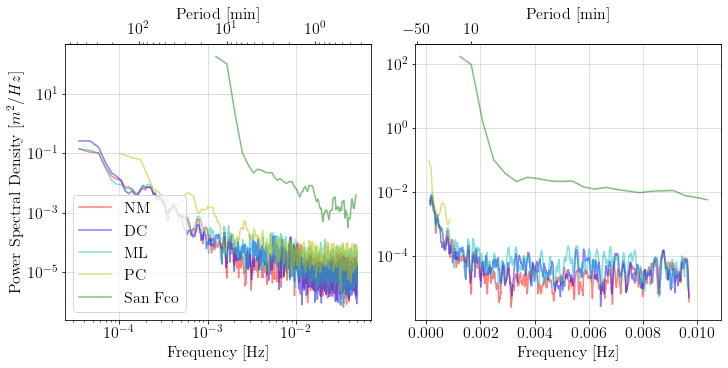

In [40]:
h_dc = dc1['Depth'] - dc1['Depth'].mean()
h_ml = ml1['Depth'] - ml1['Depth'].mean()
h_nm = nm1['Depth'] - nm1['Depth'].mean()
h_pc = pc1['Depth'] - pc1['Depth'].mean()
h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc, dt=10)
freqs3, ps3, psd3 = spectrum4(h_sf, dt=360)
freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, label='NM')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, label='DC')
axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, label='ML')
axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, label='PC')
axs[0].loglog(freqs3, psd3, 'g', alpha=0.5, label='San Fco')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 9.70464135e-03])
i04, i14 = np.searchsorted(freqs2, [0.31969058e-04, 3e-04])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', 
              freqs4[sl], psd4[sl], 'c', 
              freqs5[sl4], psd5[sl4], 'y', 
              freqs3[sl4], psd3[sl4], 'g', alpha=0.5)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

## 16-Feb

In [41]:
bu2 = UV_burst.sel(time=slice("2012-02-15 21:00:00","2012-02-17 00:00:00")).u
wdf = dfw['u'].loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]
sf = snfco.loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]
mt = mnty.loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]
dc1 = DC_1.loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]
dc2 = DC_2.loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]
dc3 = DC_3.loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]
dc4 = DC_4.loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]

nm1 = NM_1.loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]
nm2 = NM_2.loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]
nm3 = NM_3.loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]

ml1 = ML_1.loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]
ml2 = ML_2.loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]

pc1 = PC_1.loc[datetime.datetime(2012,2,15,21,0,0):datetime.datetime(2012,2,17,0,0,0)]

In [42]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

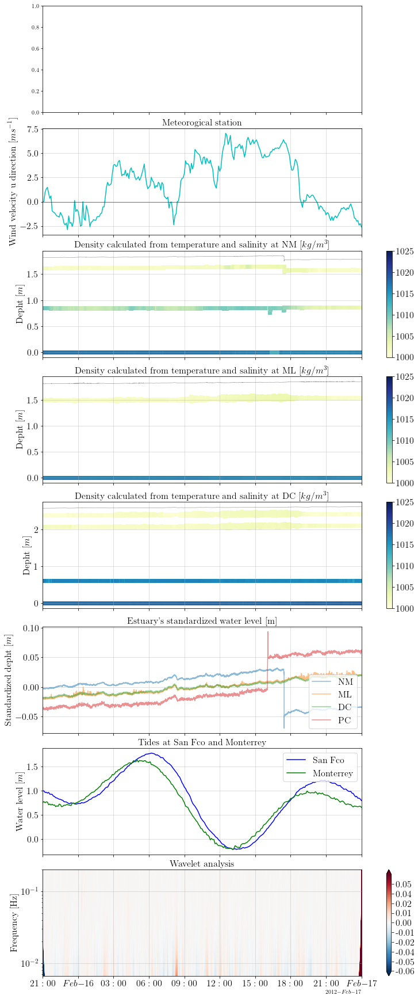

In [44]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax4, ax5, ax3, ax6, ax7, ax8) = plt.subplots(nrows=8, figsize=(10, 24), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
# contourf_ = ax1.contourf(bu2.time, y_bin,
#                          np.transpose(bu2.values),
#                          levels=level_boundaries_u,
#                          cmap=cm.RdBu_r,
#                          vmax=umax, vmin=umin, extend='both')
# cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
# cbar.ax.tick_params(labelsize=16)
# cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
# ax1.set_ylabel(r"Depth DC "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax1.grid(alpha=0.5)
# ax1.set_ylim(1, 2.5)
# ax1.xaxis.set_tick_params(labelsize=16)
# ax1.yaxis.set_tick_params(labelsize=16)

#Grafico velocidad viento

ax2.set_title(r"Meteorogical station",
          fontsize=16)
ax2.set_ylabel(r"Wind velocity u direction "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, -wdf.values,color='c')
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

#Grafico de profundidad y densidad (color map) DC
ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
          fontsize=16)
ax3.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax3, pad=0.03)
cbar2.ax.tick_params(labelsize=16)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

# Grafico densidades NM

ax4.set_title(r"Density calculated from temperature and salinity at NM [$kg/m^3$]",
          fontsize=16)
ax4.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax4.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax4.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax4, pad=0.03)
cbar3.ax.tick_params(labelsize=16)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

# Grafico densidades ML

ax5.set_title(r"Density calculated from temperature and salinity at ML [$kg/m^3$]",
          fontsize=16)
ax5.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.03)
cbar4.ax.tick_params(labelsize=16)
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)

# Grafico water level estandarizada

ax6.set_title(r"Estuary's standardized water level [m]",
          fontsize=16)
ax6.set_ylabel(r"Standardized depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax6.plot(nm1.index, nm1['Depth']-nm1['Depth'].mean(), alpha=0.5)
ax6.plot(ml1.index, ml1['Depth']-ml1['Depth'].mean(), alpha=0.5)
ax6.plot(dc1.index, dc1['Depth']-dc1['Depth'].mean(), alpha=0.5)
ax6.plot(pc1.index, pc1['Depth']-pc1['Depth'].mean(), alpha=0.5)
ax6.legend(["NM", "ML", "DC", "PC"], loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

# Grafico nivel del agua SF

ax7.set_title(r"Tides at San Fco and Monterrey",
          fontsize=16)
ax7.set_ylabel(r"Water level "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='b')
ax7.plot(mt.index, mt.values, c='g')
ax7.legend(["San Fco", "Monterrey"], loc='upper right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.06
umax = 0.06
vmin = -0.06
vmax = 0.06
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


#Grafico de velocidad del agua (color map)
ax8.set_title(r"Wavelet analysis",
          fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

- La boca está completamente cerrada
- Se observa wave overtopping al principio de la señal pero no domina el movimiento del estuario.
- Viento domina le movimiento dentro del estuario
- En NM se observa algo así como una oscilación en la densidad, lo cual podría ser resultado del esfuerzo de viento aplicado anteriormente.
- Los peaks de viento son de muy poca duración para afectar significativamente el movimiento del estuario. Hacer analisis wavelet para cachar cual es la duración minima que tiene que tener el viento para que haga algo.
- Al final los estratos se encuentran volviendo al equilibrio ya que la velocidad en el estrato más bajo está negativa.

<ipython-input-45-2dcf91c340a2>:54: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


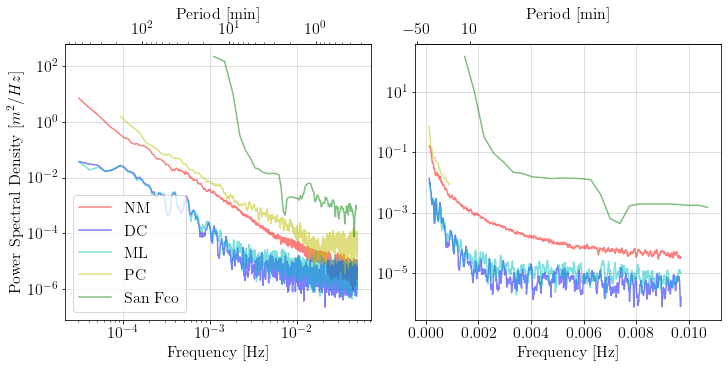

In [45]:
h_dc = dc1['Depth'] - dc1['Depth'].mean()
h_ml = ml1['Depth'] - ml1['Depth'].mean()
h_nm = nm1['Depth'] - nm1['Depth'].mean()
h_pc = pc1['Depth'] - pc1['Depth'].mean()
h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc, dt=10)
freqs3, ps3, psd3 = spectrum4(h_sf, dt=360)
freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, label='NM')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, label='DC')
axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, label='ML')
axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, label='PC')
axs[0].loglog(freqs3, psd3, 'g', alpha=0.5, label='San Fco')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 9.70464135e-03])
i04, i14 = np.searchsorted(freqs2, [0.31969058e-04, 3e-04])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', 
              freqs4[sl], psd4[sl], 'c', 
              freqs5[sl4], psd5[sl4], 'y', 
              freqs3[sl4], psd3[sl4], 'g', alpha=0.5)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

## 17-Feb

In [122]:
bu2 = UV_burst.sel(time=slice("2012-02-17 00:00:00","2012-02-18 00:00:00")).u
wdf = dfw['u'].loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]
sf = snfco.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]
mt = mnty.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]
dc1 = DC_1.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]
dc2 = DC_2.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]
dc3 = DC_3.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]
dc4 = DC_4.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]

nm1 = NM_1.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]
nm2 = NM_2.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]
nm3 = NM_3.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]

ml1 = ML_1.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]
ml2 = ML_2.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]

pc1 = PC_1.loc[datetime.datetime(2012,2,17,0,0,0):datetime.datetime(2012,2,18,0,0,0)]

In [123]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

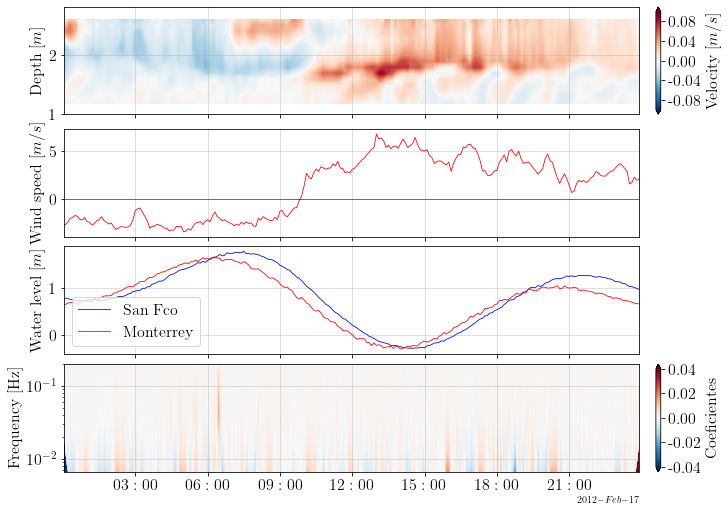

In [130]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax7, ax8) = plt.subplots(nrows=4, figsize=(10, 7), constrained_layout=True, sharex=True)

# fig = plt.figure(figsize=(12, 8), constrained_layout=True)
# gs = GridSpec(2, 8, figure=fig)

#Grafico de velocidad del agua (color map)
# ax1 = fig.add_subplot(gs[:3, 0])
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.04))
cbar.set_label("Velocity [$m/s$]", loc='center',
          fontsize=16)
ax1.set_ylabel(r"Depth "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.set_ylim(1, 2.8)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

#Grafico velocidad viento
# ax2 = fig.add_subplot(gs[3, 0])
# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"Wind speed "
          r"$\displaystyle[m/s]$",
          fontsize=16)
ax2.plot(wdf.index, -wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

# #Grafico de profundidad y densidad (color map) DC
# # ax3 = fig.add_subplot(gs[6, 0])
# # ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
# #           fontsize=16)
# ax3.set_ylabel(r"DC Depht "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
# scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# cbar2 = fig.colorbar(scat, ax=ax3, pad=0.03)
# cbar2.ax.tick_params(labelsize=16)
# # cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
# #           fontsize=16)
# ax3.xaxis.set_tick_params(labelsize=16)
# ax3.yaxis.set_tick_params(labelsize=16)
# ax3.grid(alpha=0.5)

# # Grafico densidades NM
# # ax4 = fig.add_subplot(gs[4, 0])
# # ax4.set_title(r"Density calculated from temperature and salinity at NM [$kg/m^3$]",
# #           fontsize=16)
# ax4.set_ylabel(r"NM Depht "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax4.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
# scat = ax4.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# ax4.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# ax4.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# cbar3 = fig.colorbar(scat, ax=ax4, pad=0.03)
# cbar3.ax.tick_params(labelsize=16)
# # cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
# #           fontsize=16)
# ax4.xaxis.set_tick_params(labelsize=16)
# ax4.yaxis.set_tick_params(labelsize=16)
# ax4.grid(alpha=0.5)

# # Grafico densidades ML
# # ax5 = fig.add_subplot(gs[5, 0])
# # ax5.set_title(r"Density calculated from temperature and salinity at ML [$kg/m^3$]",
# #           fontsize=16)
# ax5.set_ylabel(r"ML Depht "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
# scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# cbar4 = fig.colorbar(scat, ax=ax5, pad=0.03)
# cbar4.ax.tick_params(labelsize=16)
# cbar4.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
# ax5.xaxis.set_tick_params(labelsize=16)
# ax5.yaxis.set_tick_params(labelsize=16)
# ax5.grid(alpha=0.5)

# # Grafico water level estandarizada
# # ax6 = fig.add_subplot(gs[6:9, 0])
# # ax6.set_title(r"Estuary's standardized water level [m]",
# #           fontsize=16)
# ax6.set_ylabel(r"Depht "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax6.plot(nm1.index, nm1['Depth']-nm1['Depth'].mean(), linewidth=0.8, c="r")
# # ax6.plot(ml1.index, ml1['Depth']-ml1['Depth'].mean(), alpha=0.5)
# ax6.plot(dc1.index, dc1['Depth']-dc1['Depth'].mean(), linewidth=0.8, c="b")
# # ax6.plot(pc1.index, pc1['Depth']-pc1['Depth'].mean(), alpha=0.5)
# ax6.legend(["NM", "DC"], loc='lower right',
#           fontsize=16);
# ax6.xaxis.set_tick_params(labelsize=16)
# ax6.yaxis.set_tick_params(labelsize=16)
# ax6.grid(alpha=0.5)

# Grafico nivel del agua SF
# ax7 = fig.add_subplot(gs[9, 0])
# ax7.set_title(r"Tides at San Fco and Monterrey",
#           fontsize=16)
ax7.set_ylabel(r"Water level "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='b', linewidth=0.8)
ax7.plot(mt.index, mt.values, c='r', linewidth=0.8)
ax7.legend(["San Fco", "Monterrey"], loc='lower left',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
vmin = -0.04
vmax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


#Grafico de velocidad del agua (color map)
# ax8 = fig.add_subplot(gs[10:13, 010:13])
# ax8.set_title(r"Wavelet analysis",
#           fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax7.xaxis.set_major_locator(locator)
ax7.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

plt.show() 

- La boca está completamente cerrada
- No se observa wave overtopping.
- Viento domina el movimiento dentro del estuario
- Los cambios de densidad en la superficie se pueden deber a dos cosas:
    - Que el viento anterior era muy fuerte y provoca mezcla en los estratos, y por ende cuando deja de soplar vuelve al equilibrio
    - Que el cambio de direccion provoca upwelling en el otro sentido, pero no podemos verlo reflejado en los sensores ya que no hay datos aguas arriba.
- Al inicio, el agua del estrato más bajo se está llendo en dirección negativa, lo cual es debido a que la velocidad del viento en la superficie no es tan fuerte como para empujar ambos estratos.
- Al cambiar la velocidad los estratos vuelven a su equilibrio, ya que la velocidad negativa no es tan fuerte para afectar el movimiento del estuario significativamente.

<ipython-input-49-2dcf91c340a2>:54: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


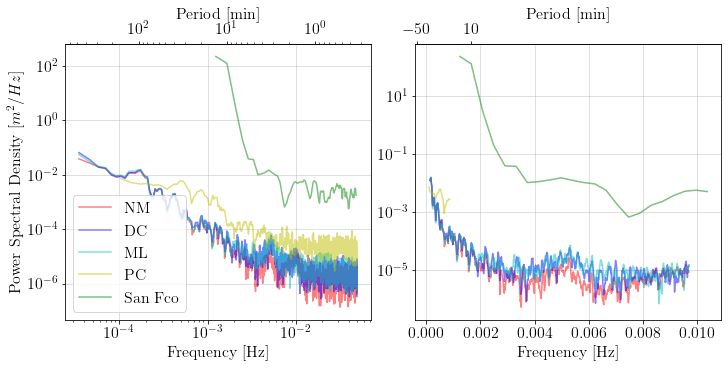

In [49]:
h_dc = dc1['Depth'] - dc1['Depth'].mean()
h_ml = ml1['Depth'] - ml1['Depth'].mean()
h_nm = nm1['Depth'] - nm1['Depth'].mean()
h_pc = pc1['Depth'] - pc1['Depth'].mean()
h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc, dt=10)
freqs3, ps3, psd3 = spectrum4(h_sf, dt=360)
freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, label='NM')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, label='DC')
axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, label='ML')
axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, label='PC')
axs[0].loglog(freqs3, psd3, 'g', alpha=0.5, label='San Fco')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 9.70464135e-03])
i04, i14 = np.searchsorted(freqs2, [0.31969058e-04, 3e-04])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', 
              freqs4[sl], psd4[sl], 'c', 
              freqs5[sl4], psd5[sl4], 'y', 
              freqs3[sl4], psd3[sl4], 'g', alpha=0.5)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

## 18 Feb

In [104]:
bu2 = UV_burst.sel(time=slice("2012-02-18 00:00:00","2012-02-19 00:00:00")).u
wdf = dfw['u'].loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]
sf = snfco.loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]
mt = mnty.loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]
dc1 = DC_1.loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]
dc2 = DC_2.loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]
dc3 = DC_3.loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]
dc4 = DC_4.loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]

nm1 = NM_1.loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]
nm2 = NM_2.loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]
nm3 = NM_3.loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]

ml1 = ML_1.loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]
ml2 = ML_2.loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]

pc1 = PC_1.loc[datetime.datetime(2012,2,18,0,0,0):datetime.datetime(2012,2,19,0,0,0)]

In [105]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

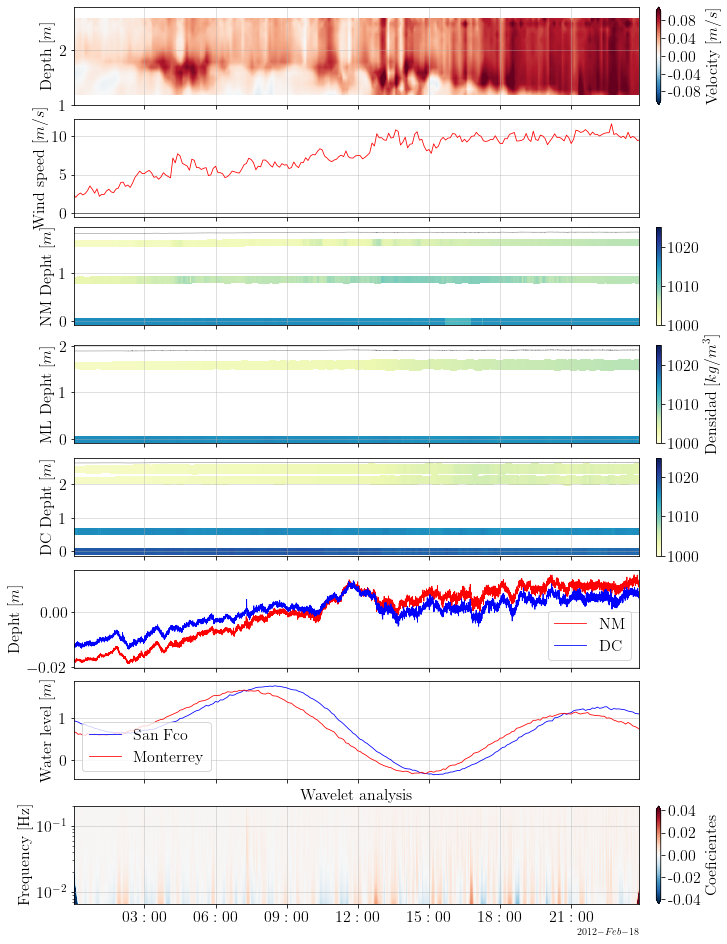

In [91]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax4, ax5, ax3, ax6, ax7, ax8) = plt.subplots(nrows=8, figsize=(10, 13), constrained_layout=True, sharex=True)

# fig = plt.figure(figsize=(10, 24), constrained_layout=True)
# gs = GridSpec(14, 1, figure=fig)

#Grafico de velocidad del agua (color map)
# ax1 = fig.add_subplot(gs[:3, 0])
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.04))
cbar.set_label("Velocity [$m/s$]", loc='center',
          fontsize=16)
ax1.set_ylabel(r"Depth "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.set_ylim(1, 2.8)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

#Grafico velocidad viento
# ax2 = fig.add_subplot(gs[3, 0])
# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"Wind speed "
          r"$\displaystyle[m/s]$",
          fontsize=16)
ax2.plot(wdf.index, -wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

#Grafico de profundidad y densidad (color map) DC
# ax3 = fig.add_subplot(gs[6, 0])
# ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
#           fontsize=16)
ax3.set_ylabel(r"DC Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax3, pad=0.03)
cbar2.ax.tick_params(labelsize=16)
# cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

# Grafico densidades NM
# ax4 = fig.add_subplot(gs[4, 0])
# ax4.set_title(r"Density calculated from temperature and salinity at NM [$kg/m^3$]",
#           fontsize=16)
ax4.set_ylabel(r"NM Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax4.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax4.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax4, pad=0.03)
cbar3.ax.tick_params(labelsize=16)
# cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

# Grafico densidades ML
# ax5 = fig.add_subplot(gs[5, 0])
# ax5.set_title(r"Density calculated from temperature and salinity at ML [$kg/m^3$]",
#           fontsize=16)
ax5.set_ylabel(r"ML Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.03)
cbar4.ax.tick_params(labelsize=16)
cbar4.set_label("Densidad [$kg/m^3$]", loc='center',
          fontsize=16)
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)

# Grafico water level estandarizada
# ax6 = fig.add_subplot(gs[6:9, 0])
# ax6.set_title(r"Estuary's standardized water level [m]",
#           fontsize=16)
ax6.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax6.plot(nm1.index, nm1['Depth']-nm1['Depth'].mean(), linewidth=0.8, c="r")
# ax6.plot(ml1.index, ml1['Depth']-ml1['Depth'].mean(), alpha=0.5)
ax6.plot(dc1.index, dc1['Depth']-dc1['Depth'].mean(), linewidth=0.8, c="b")
# ax6.plot(pc1.index, pc1['Depth']-pc1['Depth'].mean(), alpha=0.5)
ax6.legend(["NM", "DC"], loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

# Grafico nivel del agua SF
# ax7 = fig.add_subplot(gs[9, 0])
# ax7.set_title(r"Tides at San Fco and Monterrey",
#           fontsize=16)
ax7.set_ylabel(r"Water level "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='b', linewidth=0.8)
ax7.plot(mt.index, mt.values, c='r', linewidth=0.8)
ax7.legend(["San Fco", "Monterrey"], loc='lower left',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
vmin = -0.04
vmax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


#Grafico de velocidad del agua (color map)
# ax8 = fig.add_subplot(gs[10:13, 010:13])
# ax8.set_title(r"Wavelet analysis",
#           fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

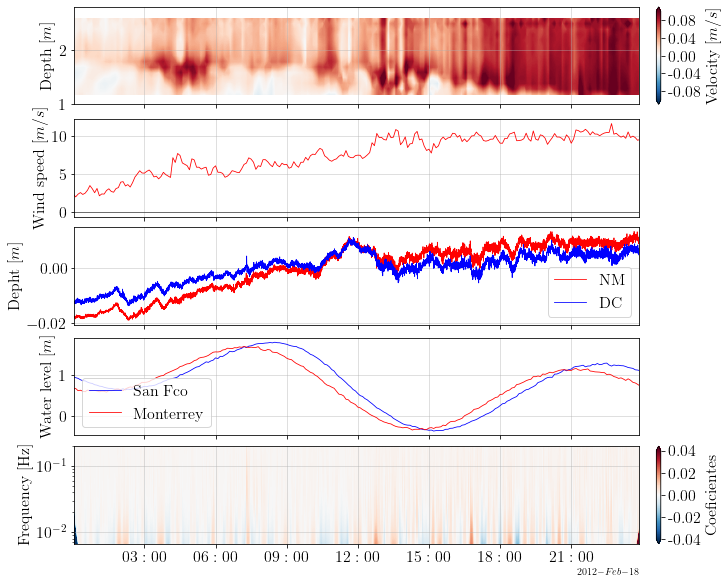

In [92]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax6, ax7, ax8) = plt.subplots(nrows=5, figsize=(10, 8), constrained_layout=True, sharex=True)

# fig = plt.figure(figsize=(10, 24), constrained_layout=True)
# gs = GridSpec(14, 1, figure=fig)

#Grafico de velocidad del agua (color map)
# ax1 = fig.add_subplot(gs[:3, 0])
# ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
#           fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.04))
cbar.set_label("Velocity [$m/s$]", loc='center',
          fontsize=16)
ax1.set_ylabel(r"Depth "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.set_ylim(1, 2.8)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

#Grafico velocidad viento
# ax2 = fig.add_subplot(gs[3, 0])
# ax2.set_title(r"Meteorogical station",
#           fontsize=16)
ax2.set_ylabel(r"Wind speed "
          r"$\displaystyle[m/s]$",
          fontsize=16)
ax2.plot(wdf.index, -wdf.values,color='r', linewidth=0.8)
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

#Grafico de profundidad y densidad (color map) DC
# ax3 = fig.add_subplot(gs[6, 0])
# ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
#           fontsize=16)
# ax3.set_ylabel(r"DC Depht "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
# scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# cbar2 = fig.colorbar(scat, ax=ax3, pad=0.03)
# cbar2.ax.tick_params(labelsize=16)
# # cbar2.set_label("Densidad [$kg/m^3$]", loc='center',
# #           fontsize=16)
# ax3.xaxis.set_tick_params(labelsize=16)
# ax3.yaxis.set_tick_params(labelsize=16)
# ax3.grid(alpha=0.5)

# # Grafico densidades NM
# # ax4 = fig.add_subplot(gs[4, 0])
# # ax4.set_title(r"Density calculated from temperature and salinity at NM [$kg/m^3$]",
# #           fontsize=16)
# ax4.set_ylabel(r"NM Depht "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax4.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
# scat = ax4.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# ax4.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# ax4.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# cbar3 = fig.colorbar(scat, ax=ax4, pad=0.03)
# cbar3.ax.tick_params(labelsize=16)
# # cbar3.set_label("Densidad [$kg/m^3$]", loc='center',
# #           fontsize=16)
# ax4.xaxis.set_tick_params(labelsize=16)
# ax4.yaxis.set_tick_params(labelsize=16)
# ax4.grid(alpha=0.5)

# # Grafico densidades ML
# # ax5 = fig.add_subplot(gs[5, 0])
# # ax5.set_title(r"Density calculated from temperature and salinity at ML [$kg/m^3$]",
# #           fontsize=16)
# ax5.set_ylabel(r"ML Depht "
#           r"$\displaystyle[m]$",
#           fontsize=16)
# ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
# scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
# cbar4 = fig.colorbar(scat, ax=ax5, pad=0.03)
# cbar4.ax.tick_params(labelsize=16)
# cbar4.set_label("Densidad [$kg/m^3$]", loc='center',
#           fontsize=16)
# ax5.xaxis.set_tick_params(labelsize=16)
# ax5.yaxis.set_tick_params(labelsize=16)
# ax5.grid(alpha=0.5)

# Grafico water level estandarizada
# ax6 = fig.add_subplot(gs[6:9, 0])
# ax6.set_title(r"Estuary's standardized water level [m]",
#           fontsize=16)
ax6.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax6.plot(nm1.index, nm1['Depth']-nm1['Depth'].mean(), linewidth=0.8, c="r")
# ax6.plot(ml1.index, ml1['Depth']-ml1['Depth'].mean(), alpha=0.5)
ax6.plot(dc1.index, dc1['Depth']-dc1['Depth'].mean(), linewidth=0.8, c="b")
# ax6.plot(pc1.index, pc1['Depth']-pc1['Depth'].mean(), alpha=0.5)
ax6.legend(["NM", "DC"], loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

# Grafico nivel del agua SF
# ax7 = fig.add_subplot(gs[9, 0])
# ax7.set_title(r"Tides at San Fco and Monterrey",
#           fontsize=16)
ax7.set_ylabel(r"Water level "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='b', linewidth=0.8)
ax7.plot(mt.index, mt.values, c='r', linewidth=0.8)
ax7.legend(["San Fco", "Monterrey"], loc='lower left',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.04
umax = 0.04
vmin = -0.04
vmax = 0.04
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


#Grafico de velocidad del agua (color map)
# ax8 = fig.add_subplot(gs[10:13, 010:13])
# ax8.set_title(r"Wavelet analysis",
#           fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
cbar.ax.yaxis.set_major_locator(tick.MultipleLocator(0.02))
cbar.set_label("Coeficientes", loc='center',
          fontsize=16)
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
# ax8.set_ylim(10**-3, 1)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

- Hay un posible wave overtopping al principio de la señal.
- Viento domina el movimiento dentro del estuario
- Cuando el viento se detiene los estratos tienden a volver al equilibrio, por lo que se generan velocidades en velocidades contrarias entre estratos.
- Al final la dirección negativa del viento afecta todo el estuario.

<ipython-input-107-94210f6c5272>:50: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


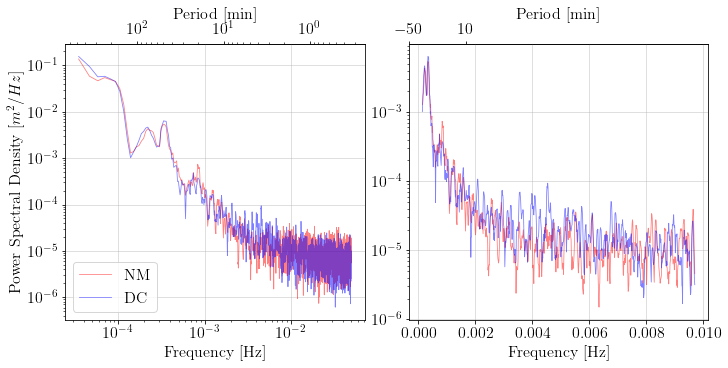

In [107]:
h_dc = dc1['Depth'] - dc1['Depth'].mean()
h_ml = ml1['Depth'] - ml1['Depth'].mean()
h_nm = nm1['Depth'] - nm1['Depth'].mean()
h_pc = pc1['Depth'] - pc1['Depth'].mean()
h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc, dt=10)
freqs3, ps3, psd3 = spectrum4(h_sf, dt=360)
freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, linewidth=0.8, label='NM')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, linewidth=0.8, label='DC')
# axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, linewidth=0.8, label='ML')
# axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, linewidth=0.8, label='PC')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 9.70464135e-03])
i04, i14 = np.searchsorted(freqs5, [1.31969058e-04, 9.70464135e-03])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', alpha=0.5, linewidth=0.8)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

## 19 Feb

In [62]:
bu2 = UV_burst.sel(time=slice("2012-02-19 00:00:00","2012-02-20 00:00:00")).u
wdf = dfw['u'].loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]
sf = snfco.loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]
mt = mnty.loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]
dc1 = DC_1.loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]
dc2 = DC_2.loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]
dc3 = DC_3.loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]
dc4 = DC_4.loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]

nm1 = NM_1.loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]
nm2 = NM_2.loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]
nm3 = NM_3.loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]

ml1 = ML_1.loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]
ml2 = ML_2.loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]

pc1 = PC_1.loc[datetime.datetime(2012,2,19,0,0,0):datetime.datetime(2012,2,20,0,0,0)]

In [63]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

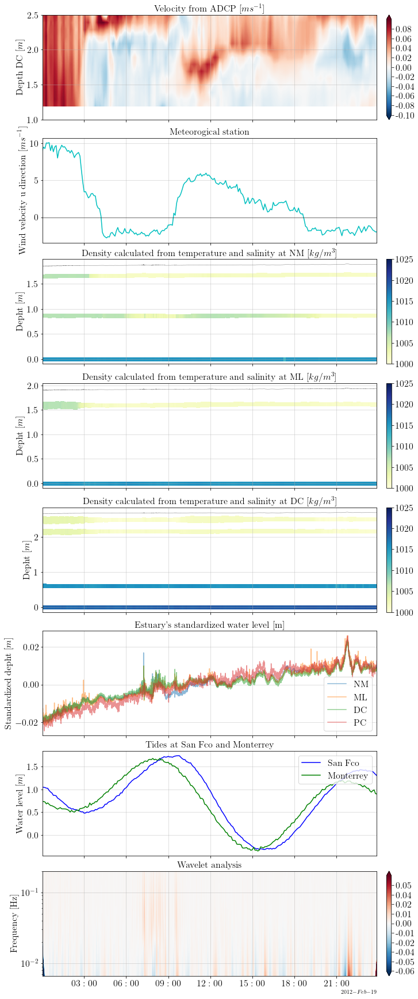

In [56]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax4, ax5, ax3, ax6, ax7, ax8) = plt.subplots(nrows=8, figsize=(10, 24), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
          fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax1.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

#Grafico velocidad viento

ax2.set_title(r"Meteorogical station",
          fontsize=16)
ax2.set_ylabel(r"Wind velocity u direction "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, -wdf.values,color='c')
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

#Grafico de profundidad y densidad (color map) DC
ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
          fontsize=16)
ax3.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax3, pad=0.03)
cbar2.ax.tick_params(labelsize=16)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

# Grafico densidades NM

ax4.set_title(r"Density calculated from temperature and salinity at NM [$kg/m^3$]",
          fontsize=16)
ax4.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax4.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax4.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax4, pad=0.03)
cbar3.ax.tick_params(labelsize=16)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

# Grafico densidades ML

ax5.set_title(r"Density calculated from temperature and salinity at ML [$kg/m^3$]",
          fontsize=16)
ax5.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.03)
cbar4.ax.tick_params(labelsize=16)
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)

# Grafico water level estandarizada

ax6.set_title(r"Estuary's standardized water level [m]",
          fontsize=16)
ax6.set_ylabel(r"Standardized depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax6.plot(nm1.index, nm1['Depth']-nm1['Depth'].mean(), alpha=0.5)
ax6.plot(ml1.index, ml1['Depth']-ml1['Depth'].mean(), alpha=0.5)
ax6.plot(dc1.index, dc1['Depth']-dc1['Depth'].mean(), alpha=0.5)
ax6.plot(pc1.index, pc1['Depth']-pc1['Depth'].mean(), alpha=0.5)
ax6.legend(["NM", "ML", "DC", "PC"], loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

# Grafico nivel del agua SF

ax7.set_title(r"Tides at San Fco and Monterrey",
          fontsize=16)
ax7.set_ylabel(r"Water level "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='b')
ax7.plot(mt.index, mt.values, c='g')
ax7.legend(["San Fco", "Monterrey"], loc='upper right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.06
umax = 0.06
vmin = -0.06
vmax = 0.06
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


#Grafico de velocidad del agua (color map)
ax8.set_title(r"Wavelet analysis",
          fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

- No se observa wave overtopping.
- Viento domina el movimiento dentro del estuario
- Cuando el viento se detiene se observan oscilaciones en la superficie, aunque no se observan a nivel de densidad ni de velocidades.
- Cuando el viento cambia de dirección se observan cambios de velocidades en los estratos.

<ipython-input-57-2dcf91c340a2>:54: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


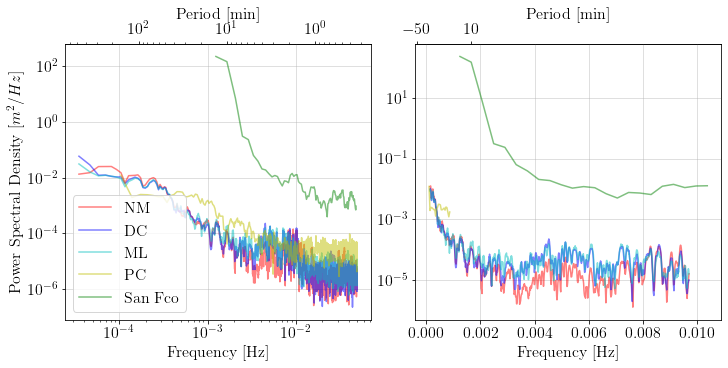

In [57]:
h_dc = dc1['Depth'] - dc1['Depth'].mean()
h_ml = ml1['Depth'] - ml1['Depth'].mean()
h_nm = nm1['Depth'] - nm1['Depth'].mean()
h_pc = pc1['Depth'] - pc1['Depth'].mean()
h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc, dt=10)
freqs3, ps3, psd3 = spectrum4(h_sf, dt=360)
freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, label='NM')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, label='DC')
axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, label='ML')
axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, label='PC')
axs[0].loglog(freqs3, psd3, 'g', alpha=0.5, label='San Fco')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 9.70464135e-03])
i04, i14 = np.searchsorted(freqs2, [0.31969058e-04, 3e-04])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', 
              freqs4[sl], psd4[sl], 'c', 
              freqs5[sl4], psd5[sl4], 'y', 
              freqs3[sl4], psd3[sl4], 'g', alpha=0.5)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

## 20 Feb

In [58]:
bu2 = UV_burst.sel(time=slice("2012-02-20 00:00:00","2012-02-21 00:00:00")).u
wdf = dfw['u'].loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]
sf = snfco.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]
mt = mnty.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]
dc1 = DC_1.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]
dc2 = DC_2.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]
dc3 = DC_3.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]
dc4 = DC_4.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]

nm1 = NM_1.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]
nm2 = NM_2.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]
nm3 = NM_3.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]

ml1 = ML_1.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]
ml2 = ML_2.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]

pc1 = PC_1.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,21,0,0,0)]

In [59]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

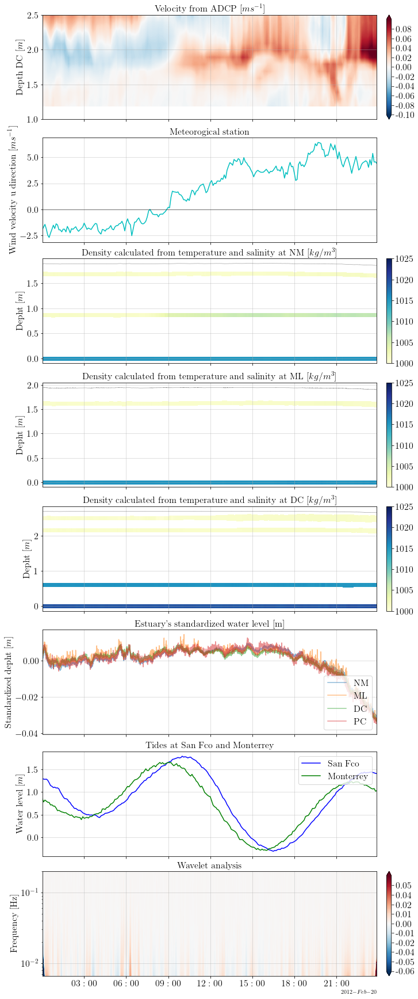

In [60]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax4, ax5, ax3, ax6, ax7, ax8) = plt.subplots(nrows=8, figsize=(10, 24), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
          fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax1.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

#Grafico velocidad viento

ax2.set_title(r"Meteorogical station",
          fontsize=16)
ax2.set_ylabel(r"Wind velocity u direction "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, -wdf.values,color='c')
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

#Grafico de profundidad y densidad (color map) DC
ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
          fontsize=16)
ax3.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax3, pad=0.03)
cbar2.ax.tick_params(labelsize=16)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

# Grafico densidades NM

ax4.set_title(r"Density calculated from temperature and salinity at NM [$kg/m^3$]",
          fontsize=16)
ax4.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax4.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax4.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax4, pad=0.03)
cbar3.ax.tick_params(labelsize=16)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

# Grafico densidades ML

ax5.set_title(r"Density calculated from temperature and salinity at ML [$kg/m^3$]",
          fontsize=16)
ax5.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.03)
cbar4.ax.tick_params(labelsize=16)
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)

# Grafico water level estandarizada

ax6.set_title(r"Estuary's standardized water level [m]",
          fontsize=16)
ax6.set_ylabel(r"Standardized depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax6.plot(nm1.index, nm1['Depth']-nm1['Depth'].mean(), alpha=0.5)
ax6.plot(ml1.index, ml1['Depth']-ml1['Depth'].mean(), alpha=0.5)
ax6.plot(dc1.index, dc1['Depth']-dc1['Depth'].mean(), alpha=0.5)
ax6.plot(pc1.index, pc1['Depth']-pc1['Depth'].mean(), alpha=0.5)
ax6.legend(["NM", "ML", "DC", "PC"], loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

# Grafico nivel del agua SF

ax7.set_title(r"Tides at San Fco and Monterrey",
          fontsize=16)
ax7.set_ylabel(r"Water level "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='b')
ax7.plot(mt.index, mt.values, c='g')
ax7.legend(["San Fco", "Monterrey"], loc='upper right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.06
umax = 0.06
vmin = -0.06
vmax = 0.06
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


#Grafico de velocidad del agua (color map)
ax8.set_title(r"Wavelet analysis",
          fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

- Se observa wave overtopping al principio de los datos, aún así el viento domina el movimiento dentro del estuario.
- Cuando aumenta la velocidad se observa un aumento en la densidad en uno de los estratos superiores de NM, mostrando que el estrato inferior está subiendo en ese punto pero en los demás no.

<ipython-input-61-2dcf91c340a2>:54: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


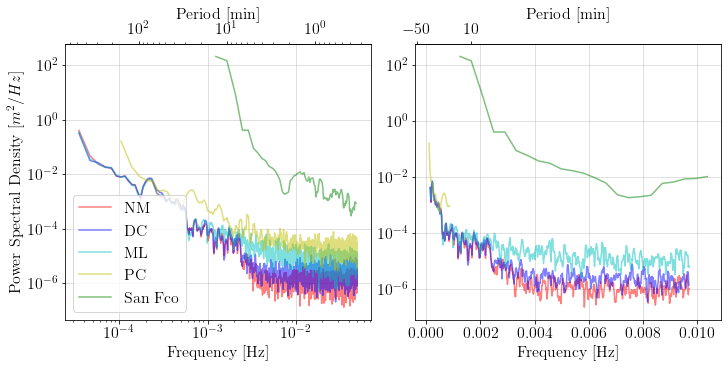

In [61]:
h_dc = dc1['Depth'] - dc1['Depth'].mean()
h_ml = ml1['Depth'] - ml1['Depth'].mean()
h_nm = nm1['Depth'] - nm1['Depth'].mean()
h_pc = pc1['Depth'] - pc1['Depth'].mean()
h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc, dt=10)
freqs3, ps3, psd3 = spectrum4(h_sf, dt=360)
freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, label='NM')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, label='DC')
axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, label='ML')
axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, label='PC')
axs[0].loglog(freqs3, psd3, 'g', alpha=0.5, label='San Fco')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 9.70464135e-03])
i04, i14 = np.searchsorted(freqs2, [0.31969058e-04, 3e-04])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', 
              freqs4[sl], psd4[sl], 'c', 
              freqs5[sl4], psd5[sl4], 'y', 
              freqs3[sl4], psd3[sl4], 'g', alpha=0.5)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()

## 21 Feb

In [31]:
bu2 = UV_burst.sel(time=slice("2012-02-20 00:00:00","2012-02-23 00:00:00")).u
wdf = dfw['u'].loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]
sf = snfco.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]
mt = mnty.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]
dc1 = DC_1.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]
dc2 = DC_2.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]
dc3 = DC_3.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]
dc4 = DC_4.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]

nm1 = NM_1.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]
nm2 = NM_2.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]
nm3 = NM_3.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]

ml1 = ML_1.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]
ml2 = ML_2.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]

pc1 = PC_1.loc[datetime.datetime(2012,2,20,0,0,0):datetime.datetime(2012,2,23,0,0,0)]

In [32]:
#Función wavelet

t = dc1.index
sig  = dc1['Depth'].values
widths = np.arange(1,31)
coef, freqs = pywt.cwt(sig, widths, 'gaus1')

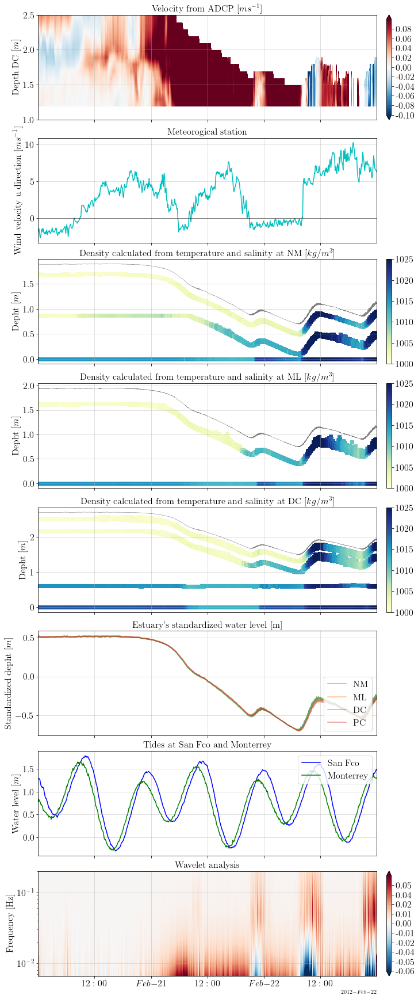

In [33]:
#Ajustar limites colorbar
umin = -0.1
umax = 0.1
vmin = -0.1
vmax = 0.1
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

#Inicio figura
fig, (ax1, ax2, ax4, ax5, ax3, ax6, ax7, ax8) = plt.subplots(nrows=8, figsize=(10, 24), constrained_layout=True, sharex=True)


#Grafico de velocidad del agua (color map)
ax1.set_title(r"Velocity from ADCP $[ms^{-1}]$",
          fontsize=16)
contourf_ = ax1.contourf(bu2.time, y_bin,
                         np.transpose(bu2.values),
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax1, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax1.set_ylabel(r"Depth DC "
          r"$\displaystyle[m]$",
          fontsize=16)
ax1.grid(alpha=0.5)
ax1.set_ylim(1, 2.5)
ax1.xaxis.set_tick_params(labelsize=16)
ax1.yaxis.set_tick_params(labelsize=16)

#Grafico velocidad viento

ax2.set_title(r"Meteorogical station",
          fontsize=16)
ax2.set_ylabel(r"Wind velocity u direction "
          r"$\displaystyle[ms^{-1}]$",
          fontsize=16)
ax2.plot(wdf.index, -wdf.values,color='c')
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.xaxis.set_tick_params(labelsize=16)
ax2.yaxis.set_tick_params(labelsize=16)
ax2.grid(alpha=0.5)

#Grafico de profundidad y densidad (color map) DC
ax3.set_title(r"Density calculated from temperature and salinity at DC [$kg/m^3$]",
          fontsize=16)
ax3.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax3.plot(dc1.index, dc1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax3.scatter(dc1.index, dc1['Depth']-dc1['Depth'], c=dc1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc2.index, dc1['Depth'].values-dc2['Depth'].values, c=dc2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc3.index, dc1['Depth'].values-dc3['Depth'].values, c=dc3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax3.scatter(dc4.index, dc1['Depth'].values-dc4['Depth'].values, c=dc4['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar2 = fig.colorbar(scat, ax=ax3, pad=0.03)
cbar2.ax.tick_params(labelsize=16)
ax3.xaxis.set_tick_params(labelsize=16)
ax3.yaxis.set_tick_params(labelsize=16)
ax3.grid(alpha=0.5)

# Grafico densidades NM

ax4.set_title(r"Density calculated from temperature and salinity at NM [$kg/m^3$]",
          fontsize=16)
ax4.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax4.plot(nm1.index, nm1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax4.scatter(nm1.index, nm1['Depth'].values-nm1['Depth'].values, c=nm1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm2.index, nm1.loc[nm3.index]['Depth'].values-nm2['Depth'].values, c=nm2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax4.scatter(nm3.index, nm1.loc[nm3.index]['Depth'].values-nm3['Depth'].values, c=nm3['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar3 = fig.colorbar(scat, ax=ax4, pad=0.03)
cbar3.ax.tick_params(labelsize=16)
ax4.xaxis.set_tick_params(labelsize=16)
ax4.yaxis.set_tick_params(labelsize=16)
ax4.grid(alpha=0.5)

# Grafico densidades ML

ax5.set_title(r"Density calculated from temperature and salinity at ML [$kg/m^3$]",
          fontsize=16)
ax5.set_ylabel(r"Depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax5.plot(ml1.index, ml1['Depth'].values, c='k', alpha=0.5, linewidth=0.5)
scat = ax5.scatter(ml1.index, ml1['Depth'].values-ml1['Depth'].values, c=ml1['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
ax5.scatter(ml2.index, ml1['Depth'].values-ml2['Depth'].values, c=ml2['densidad'], marker='s', cmap=cm.YlGnBu, vmin=1000, vmax=1025)
cbar4 = fig.colorbar(scat, ax=ax5, pad=0.03)
cbar4.ax.tick_params(labelsize=16)
ax5.xaxis.set_tick_params(labelsize=16)
ax5.yaxis.set_tick_params(labelsize=16)
ax5.grid(alpha=0.5)

# Grafico water level estandarizada

ax6.set_title(r"Estuary's standardized water level [m]",
          fontsize=16)
ax6.set_ylabel(r"Standardized depht "
          r"$\displaystyle[m]$",
          fontsize=16)
ax6.plot(nm1.index, nm1['Depth']-nm1['Depth'].mean(), alpha=0.5)
ax6.plot(ml1.index, ml1['Depth']-ml1['Depth'].mean(), alpha=0.5)
ax6.plot(dc1.index, dc1['Depth']-dc1['Depth'].mean(), alpha=0.5)
ax6.plot(pc1.index, pc1['Depth']-pc1['Depth'].mean(), alpha=0.5)
ax6.legend(["NM", "ML", "DC", "PC"], loc='lower right',
          fontsize=16);
ax6.xaxis.set_tick_params(labelsize=16)
ax6.yaxis.set_tick_params(labelsize=16)
ax6.grid(alpha=0.5)

# Grafico nivel del agua SF

ax7.set_title(r"Tides at San Fco and Monterrey",
          fontsize=16)
ax7.set_ylabel(r"Water level "
          r"$\displaystyle[m]$",
          fontsize=16)
ax7.plot(sf.index, sf.values, c='b')
ax7.plot(mt.index, mt.values, c='g')
ax7.legend(["San Fco", "Monterrey"], loc='upper right',
          fontsize=16);
ax7.xaxis.set_tick_params(labelsize=16)
ax7.yaxis.set_tick_params(labelsize=16)
ax7.grid(alpha=0.5)

#Ajustar limites colorbar
umin = -0.06
umax = 0.06
vmin = -0.06
vmax = 0.06
level_boundaries_u = np.linspace(umin, umax, 400)
level_boundaries_v = np.linspace(vmin, vmax, 400)

#Formato fecha
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)


#Grafico de velocidad del agua (color map)
ax8.set_title(r"Wavelet analysis",
          fontsize=16)
contourf_ = ax8.contourf(dc1.index, freqs,
                         coef,
                         levels=level_boundaries_u,
                         cmap=cm.RdBu_r,
                         vmax=umax, vmin=umin, extend='both')
cbar = fig.colorbar(contourf_, ax=ax8, pad=0.03)
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.set_major_formatter(tick.FormatStrFormatter('%.2f'))
ax8.set_ylabel(r"Frequency [Hz] ",
          fontsize=16)
ax8.grid(alpha=0.5)
#    ax1.set_ylim(1, 2.5)
ax8.xaxis.set_tick_params(labelsize=16)
ax8.yaxis.set_tick_params(labelsize=16)
ax8.set_yscale("log")
# Ajustar formato fecha
ax8.xaxis.set_major_locator(locator)
ax8.xaxis.set_major_formatter(formatter)

# Ajustar formato fecha
ax1.xaxis.set_major_locator(locator)
ax1.xaxis.set_major_formatter(formatter)
ax3.xaxis.set_major_locator(locator)
ax3.xaxis.set_major_formatter(formatter)
ax2.xaxis.set_major_locator(locator)
ax2.xaxis.set_major_formatter(formatter)
ax4.xaxis.set_major_locator(locator)
ax4.xaxis.set_major_formatter(formatter)

plt.show() 

- No se observa wave overtopping.
- Viento domina el movimiento dentro del estuario
- Se observan muchas cambios de dirección del viento lo que provoca muchos cambios de velocidades, pero quizás no lo suficiente para provocar un upwelling tan pronunciado.
- Se observa al principio y al final un aumento en la velocidad de la superficie, donde podría haber una fuga de agua por encima de la barra de arena.


<ipython-input-34-2dcf91c340a2>:54: RuntimeWarning: divide by zero encountered in reciprocal
  return (x * 60) ** (-1)


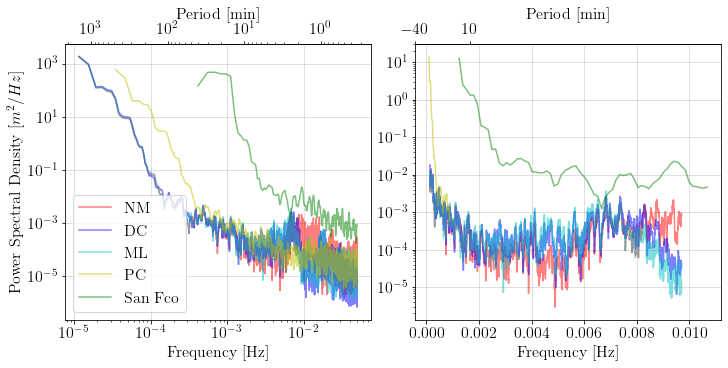

In [34]:
h_dc = dc1['Depth'] - dc1['Depth'].mean()
h_ml = ml1['Depth'] - ml1['Depth'].mean()
h_nm = nm1['Depth'] - nm1['Depth'].mean()
h_pc = pc1['Depth'] - pc1['Depth'].mean()
h_sf = sf['Verified (m)'] - sf['Verified (m)'].mean()
    
freqs1, ps1, psd1 = spectrum4(h_nm, dt=10)
freqs2, ps2, psd2 = spectrum4(h_dc, dt=10)
freqs3, ps3, psd3 = spectrum4(h_sf, dt=360)
freqs4, ps4, psd4 = spectrum4(h_ml, dt=10)
freqs5, ps5, psd5 = spectrum4(h_pc, dt=30)

fig, axs = plt.subplots(ncols=2, figsize=(10, 5), constrained_layout=True)
axs[0].loglog(freqs1, psd1, 'r', alpha=0.5, label='NM')
axs[0].loglog(freqs2, psd2, 'b', alpha=0.5, label='DC')
axs[0].loglog(freqs4, psd4, 'c', alpha=0.5, label='ML')
axs[0].loglog(freqs5, psd5, 'y', alpha=0.5, label='PC')
axs[0].loglog(freqs3, psd3, 'g', alpha=0.5, label='San Fco')
# axs[0].axis('tight', which='x')
axs[0].legend(loc='lower left',
          fontsize=16)

i0, i1 = np.searchsorted(freqs1, [1.31969058e-04, 9.70464135e-03])
i04, i14 = np.searchsorted(freqs2, [0.31969058e-04, 3e-04])
sl = slice(i0, i1)
sl4 = slice(i04, i14)
axs[1].semilogy(freqs1[sl], psd1[sl], 'r', 
              freqs2[sl], psd2[sl], 'b', 
              freqs4[sl], psd4[sl], 'c', 
              freqs5[sl4], psd5[sl4], 'y', 
              freqs3[sl4], psd3[sl4], 'g', alpha=0.5)
#axs[1].axis('tight', which='x')
axs[0].set_ylabel('Power Spectral Density [$m^2/Hz$]',
          fontsize=16)
axs[0].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[1].set_xlabel('Frequency [Hz]',
          fontsize=16)
axs[0].xaxis.set_tick_params(labelsize=16)
axs[0].yaxis.set_tick_params(labelsize=16)
axs[1].xaxis.set_tick_params(labelsize=16)
axs[1].yaxis.set_tick_params(labelsize=16)
axs[0].grid(alpha=0.5)
axs[1].grid(alpha=0.5)


def freq2period(x):
    x = x.astype(float)
    return x ** (-1) / 60


def period2freq(x):
    x = x.astype(float)
    return (x * 60) ** (-1)

secax0 = axs[0].secondary_xaxis('top', functions=(freq2period, period2freq))
secax0.set_xlabel('Period [min]',
          fontsize=16)
secax1 = axs[1].secondary_xaxis('top', functions=(freq2period, period2freq))
secax1.set_xlabel('Period [min]',
          fontsize=16)
secax0.xaxis.set_tick_params(labelsize=16)
secax0.yaxis.set_tick_params(labelsize=16)
secax1.xaxis.set_tick_params(labelsize=16)
secax1.yaxis.set_tick_params(labelsize=16)
secax0.grid(alpha=0.5)
secax1.grid(alpha=0.5)

plt.show()